# Project Structures

- Data Cleaning & Exploratory Data Analysis
- RFM Analysis
- Customer Segmentation
- Applying K-Means Clustering
- CLTV Calculation (Customer Life Time Value)

# 1. Data Cleaning & Exploratory Data Analysis

## Import Modules, Load Data & Data Review

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_excel("combined_data9.xlsx")

In [3]:
df.head()

,Unnamed: 0,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,...,enflasyon,ciro,new,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war
0,0,2021-11-18,ID25062,79183,Neu Berlin,DEU,GERMANY,b2b,wabenhonig klein holzrahmen,-1050.0,...,5.2,-9345.00,38458.0,Thursday,3.617214,wabenhonig,1,0,0,1
1,1,2021-11-05,ID18074,96114,Hirschaid,DEU,GERMANY,b2b,izmir tulum teneke,-1001.0,...,4.5,-6456.45,38204.0,Friday,3.617214,peynir,1,0,0,1
2,2,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum-weiss käse teneke,-1002.0,...,7.4,-6262.50,39105.0,Friday,3.617214,peynir,1,0,1,0
3,3,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum 1000gr,-678.0,...,7.4,-4712.10,39106.0,Friday,3.617214,peynir,1,0,1,0
4,4,2018-10-01,ID10402,64331,Neu Berlin,DEU,GERMANY,b2b,royal extra lata 5 l.,-4.0,...,2.3,-159.96,979.0,Monday,3.617214,zeytinyagi,0,1,0,1


In [4]:
del df['Unnamed: 0']

In [5]:
del df['new']

In [6]:
df.columns

Index(['fatura_tarihi', 'Customer', 'posta_kodu', 'city', 'country',
       'country_name', 'satis_yapilan_platform', 'satilan_urun', 'adet',
       'birim_fiyat', 'enflasyon', 'ciro', 'day_of_week', 'nakliye',
       'category', 'after_covid', 'before_covid', 'after_war', 'before_war'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39342 entries, 0 to 39341
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   fatura_tarihi           39342 non-null  datetime64[ns]
 1   Customer                39342 non-null  object        
 2   posta_kodu              39342 non-null  object        
 3   city                    39342 non-null  object        
 4   country                 39342 non-null  object        
 5   country_name            39342 non-null  object        
 6   satis_yapilan_platform  39342 non-null  object        
 7   satilan_urun            39342 non-null  object        
 8   adet                    39342 non-null  float64       
 9   birim_fiyat             39342 non-null  float64       
 10  enflasyon               39342 non-null  float64       
 11  ciro                    39342 non-null  float64       
 12  day_of_week             39342 non-null  object

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
adet,39342.0,1.948959,23.571534,-1050.0,1.000000,1.000000,1.000000,1920.0
birim_fiyat,39342.0,14.151029,13.143660,0.0,6.290000,10.690000,16.915888,789.0
enflasyon,39342.0,3.767017,2.322752,-0.3,2.000000,3.900000,5.200000,7.9
ciro,39342.0,21.618193,153.146397,-9345.0,7.480000,12.850467,22.260000,11815.0
nakliye,39342.0,3.627155,2.342960,0.0,3.617214,3.617214,4.900000,44.1
after_covid,39342.0,0.914392,0.279788,0.0,1.000000,1.000000,1.000000,1.0
before_covid,39342.0,0.085608,0.279788,0.0,0.000000,0.000000,0.000000,1.0
after_war,39342.0,0.176885,0.381576,0.0,0.000000,0.000000,0.000000,1.0
before_war,39342.0,0.823115,0.381576,0.0,1.000000,1.000000,1.000000,1.0


In [9]:
type(df["Customer"])

pandas.core.series.Series

In [10]:
df.shape

(39342, 19)

In [11]:
df.isnull().sum()

fatura_tarihi             0
Customer                  0
posta_kodu                0
city                      0
country                   0
country_name              0
satis_yapilan_platform    0
satilan_urun              0
adet                      0
birim_fiyat               0
enflasyon                 0
ciro                      0
day_of_week               0
nakliye                   0
category                  0
after_covid               0
before_covid              0
after_war                 0
before_war                0
dtype: int64

In [12]:
for i in df.columns:
    nvalue = df[i].nunique()
    print(f"{i} has {nvalue} unique values")

fatura_tarihi has 1046 unique values
Customer has 27253 unique values
posta_kodu has 5239 unique values
city has 4515 unique values
country has 52 unique values
country_name has 52 unique values
satis_yapilan_platform has 8 unique values
satilan_urun has 3865 unique values
adet has 190 unique values
birim_fiyat has 4297 unique values
enflasyon has 31 unique values
ciro has 6090 unique values
day_of_week has 7 unique values
nakliye has 325 unique values
category has 398 unique values
after_covid has 2 unique values
before_covid has 2 unique values
after_war has 2 unique values
before_war has 2 unique values


In [13]:
df[df['satis_yapilan_platform']=='ebay']

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war
38,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,1.4,0.000000,Wednesday,3.617214,versandkosten,0,1,0,1
106,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,4.5,0.631887,Monday,3.617214,versandkosten,1,0,0,1
133,2019-06-03,ID10842,76437,Rastatt,DEU,GERMANY,ebay,gutschein,1.0,0.907563,1.6,0.907563,Monday,3.617214,gutschein,0,1,0,1
167,2021-06-29,ID20817,10715,Berlin,DEU,GERMANY,ebay,versandkosten 7 %,1.0,1.197485,3.8,1.197485,Tuesday,3.617214,versandkosten,1,0,0,1
180,2018-03-23,ID10168,9300,St. Veit a. d. Glan,AUT,AUSTRIA,ebay,versandkosten,1.0,1.260504,1.5,1.260504,Friday,3.617214,versandkosten,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39026,2021-10-20,ID27739,36000,Châteauroux,FRA,FRANCE,ebay,efepasa parmak sucuk 1kg,10.0,13.028037,4.5,130.280374,Wednesday,3.617214,sucuk,1,0,0,1
39061,2021-03-09,ID12934,1000,other,ATA,ANTARCTICA,ebay,pergamo geröstet & ungesalzen haselnusskerne- ...,2.0,70.084112,1.7,140.168224,Tuesday,3.617214,findik,1,0,0,1
39074,2021-04-15,ID17176,44534,Lünen,DEU,GERMANY,ebay,echte ajwa acve datteln aus medina/ echte prop...,7.0,20.626168,2.0,144.383178,Thursday,3.617214,hurma,1,0,0,1
39116,2019-06-24,ID11167,64331,Weiterstadt,DEU,GERMANY,ebay,royal extra lata 5 l.,4.0,39.242991,1.6,156.971963,Monday,3.617214,zeytinyagi,0,1,0,1


In [14]:
df[df['satis_yapilan_platform']=='kaufland']

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war
2008,2022-04-06,IDKundenID16807,1000,other,ATA,ANTARCTICA,kaufland,pergamo sumach pulver - orientalisches gewurz ...,1.0,3.72,7.4,3.72,Wednesday,4.45,sirke,1,0,1,0
2939,2021-12-21,IDKundenID6469,1000,other,ATA,ANTARCTICA,kaufland,granatapfelsirup 100 % granatapfel konzentrat ...,1.0,4.19,5.3,4.19,Tuesday,5.35,nar_eksisi,1,0,0,1
2940,2022-03-02,IDKundenID6753,1000,other,ATA,ANTARCTICA,kaufland,granatapfelsirup 100 % granatapfel konzentrat ...,1.0,4.19,7.3,4.19,Wednesday,4.85,nar_eksisi,1,0,1,0
2941,2022-04-02,IDKundenID6848,1000,other,ATA,ANTARCTICA,kaufland,granatapfelsirup 100 % granatapfel konzentrat ...,1.0,4.19,7.4,4.19,Saturday,8.05,nar_eksisi,1,0,1,0
2942,2022-04-21,IDKundenID20310,1000,other,ATA,ANTARCTICA,kaufland,traubensirup /100% naturlich /ohne farbstoffe ...,1.0,4.19,7.6,4.19,Thursday,4.45,pekmez,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37949,2021-12-12,IDKundenID21831,1000,other,ATA,ANTARCTICA,kaufland,walnuss in schale/ *neu ernte 2021*/ unbehande...,1.0,61.68,5.3,61.68,Sunday,4.15,walnuss,1,0,0,1
37951,2022-02-01,IDKundenID21832,1000,other,ATA,ANTARCTICA,kaufland,walnuss in schale/ *neu ernte 2021*/ unbehande...,1.0,61.68,5.1,61.68,Tuesday,4.15,walnuss,1,0,0,1
37952,2022-03-30,IDKundenID21833,1000,other,ATA,ANTARCTICA,kaufland,walnuss in schale/ *neu ernte 2021*/ unbehande...,1.0,61.68,7.4,61.68,Wednesday,4.45,walnuss,1,0,1,0
38554,2022-04-26,IDKundenID12201,1000,other,ATA,ANTARCTICA,kaufland,natural haselnuss in schale vegan unbehandelt ...,1.0,84.01,7.6,84.01,Tuesday,0.00,findik,1,0,1,0


In [15]:
df[df['satis_yapilan_platform']=='b2b']

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war
0,2021-11-18,ID25062,79183,Neu Berlin,DEU,GERMANY,b2b,wabenhonig klein holzrahmen,-1050.0,8.90,5.2,-9345.00,Thursday,3.617214,wabenhonig,1,0,0,1
1,2021-11-05,ID18074,96114,Hirschaid,DEU,GERMANY,b2b,izmir tulum teneke,-1001.0,6.45,4.5,-6456.45,Friday,3.617214,peynir,1,0,0,1
2,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum-weiss käse teneke,-1002.0,6.25,7.4,-6262.50,Friday,3.617214,peynir,1,0,1,0
3,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum 1000gr,-678.0,6.95,7.4,-4712.10,Friday,3.617214,peynir,1,0,1,0
4,2018-10-01,ID10402,64331,Neu Berlin,DEU,GERMANY,b2b,royal extra lata 5 l.,-4.0,39.99,2.3,-159.96,Monday,3.617214,zeytinyagi,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39337,2021-06-10,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum teneke,1001.0,6.45,2.3,6456.45,Thursday,3.617214,peynir,1,0,0,1
39338,2021-09-10,ID25062,1000,other,ATA,ANTARCTICA,b2b,wabenhonig klein holzrahmen,1050.0,8.90,3.9,9345.00,Friday,3.617214,wabenhonig,1,0,0,1
39339,2021-10-26,ID18074,11011,Berlin,DEU,GERMANY,b2b,ezine käse 1000gr,1506.0,6.45,4.5,9713.70,Tuesday,3.617214,peynir,1,0,0,1
39340,2021-06-10,ID18074,1000,other,ATA,ANTARCTICA,b2b,ezine käse 1000gr,1700.0,6.75,2.3,11475.00,Thursday,3.617214,peynir,1,0,0,1


In [16]:
df.satis_yapilan_platform.value_counts()

amazon        24136
b2b            6519
wocommerce     6115
ebay           2295
kaufland        271
other             4
none              1
bar               1
Name: satis_yapilan_platform, dtype: int64

There are negative values in the Quantity and UnitPrice columns. These are possibly canceled and returned orders. Let's check it out.

In [17]:
(df['adet'] < 0).value_counts()

False    39303
True        39
Name: adet, dtype: int64

In [18]:
quantity_values = (df['adet'] < 0).value_counts()
quantity_values = pd.DataFrame(quantity_values)
quantity_values.rename(index={True: 'Invoices Smaller Than 0', False: 'Invoices Bigger Than 0'}, inplace=True)
quantity_values

,adet
Invoices Bigger Than 0,39303
Invoices Smaller Than 0,39


In [19]:
import plotly.express as px
import plotly.graph_objects as go

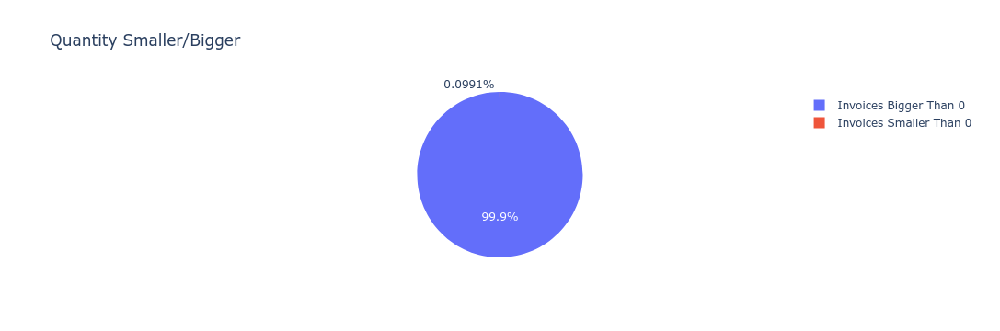

In [20]:
fig = px.pie(quantity_values, 
             values = quantity_values['adet'], 
             names = quantity_values.index, 
             title = 'Quantity Smaller/Bigger')

fig.show()

In [21]:
df[df.birim_fiyat < 0]

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war


### Missing Values

In [22]:
df.isnull().sum()

fatura_tarihi             0
Customer                  0
posta_kodu                0
city                      0
country                   0
country_name              0
satis_yapilan_platform    0
satilan_urun              0
adet                      0
birim_fiyat               0
enflasyon                 0
ciro                      0
day_of_week               0
nakliye                   0
category                  0
after_covid               0
before_covid              0
after_war                 0
before_war                0
dtype: int64

In [23]:
df.groupby("Customer")["fatura_tarihi"].nunique()

Customer
ID -2             1
ID0               8
ID10001           3
ID10002           1
ID10003           1
                 ..
IDKundenID9994    1
IDKundenID9996    1
IDKundenID9997    1
IDKundenID9998    1
IDKundenID9999    1
Name: fatura_tarihi, Length: 27253, dtype: int64

In [24]:
df.groupby('Customer').fatura_tarihi.count().sort_values(ascending=False)

Customer
ID10007            4342
IDID -2             538
ID10955             143
ID13508              90
ID28542              81
                   ... 
IDKundenID1158        1
IDKundenID11579       1
IDKundenID11578       1
IDKundenID11577       1
IDKundenID9999        1
Name: fatura_tarihi, Length: 27253, dtype: int64

In [25]:
ebay = df[df['satis_yapilan_platform']=='ebay']

In [26]:
kaufland = df[df['satis_yapilan_platform']=='kaufland']

In [27]:
b2b = df[df['satis_yapilan_platform']=='b2b']

In [28]:
amazon = df[df['satis_yapilan_platform']=='amazon']

In [29]:
platforms = [ebay, kaufland, b2b, amazon]
platforms_string = ['ebay', 'kaufland', 'b2b', 'amazon']

In [30]:
for i in range(len(platforms)):
    print(platforms_string[i])
    print(platforms[i].groupby('Customer').fatura_tarihi.count().sort_values(ascending=False))
    print()

ebay
Customer
ID14261            21
ID27324            11
ID10164            11
ID14256             9
ID10842             8
                   ..
IDKundenID10137     1
IDKundenID10138     1
IDKundenID10139     1
IDKundenID10143     1
IDKundenID9958      1
Name: fatura_tarihi, Length: 1458, dtype: int64

kaufland
Customer
IDKundenID10000    1
IDKundenID22569    1
IDKundenID21854    1
IDKundenID21855    1
IDKundenID21856    1
                  ..
IDKundenID17020    1
IDKundenID17021    1
IDKundenID17023    1
IDKundenID17028    1
IDKundenID9999     1
Name: fatura_tarihi, Length: 271, dtype: int64

b2b
Customer
ID10007    4342
IDID -2     538
ID10955     143
ID13508      90
ID28542      81
           ... 
ID11177       1
ID18073       1
ID11057       1
ID18631       1
ID11188       1
Name: fatura_tarihi, Length: 216, dtype: int64

amazon
Customer
ID12689            19
ID12247            18
ID10336            17
ID10747            16
ID15611            16
                   ..
IDKundenID103

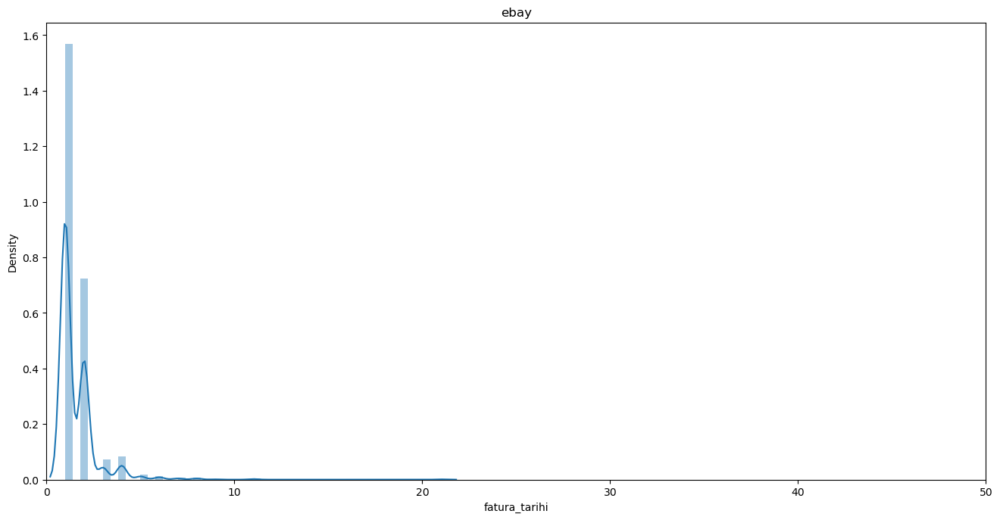

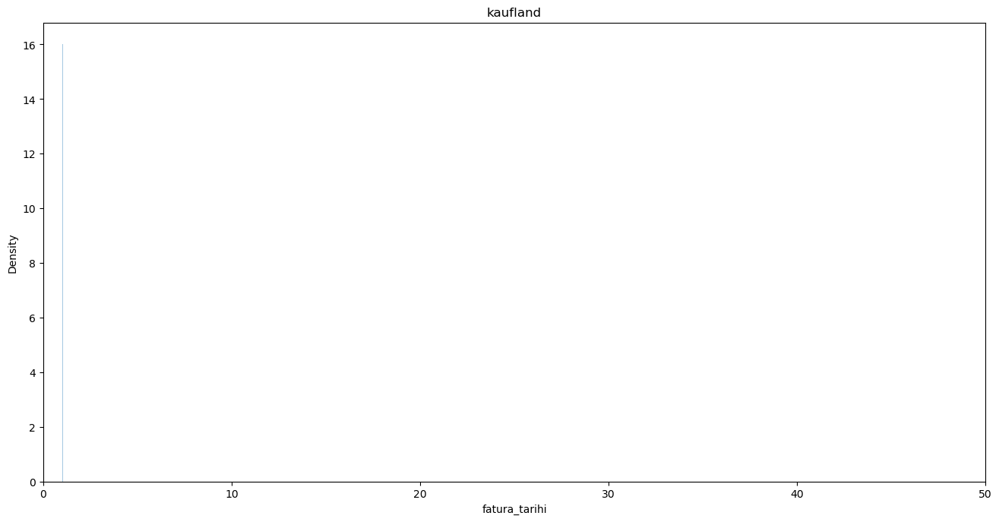

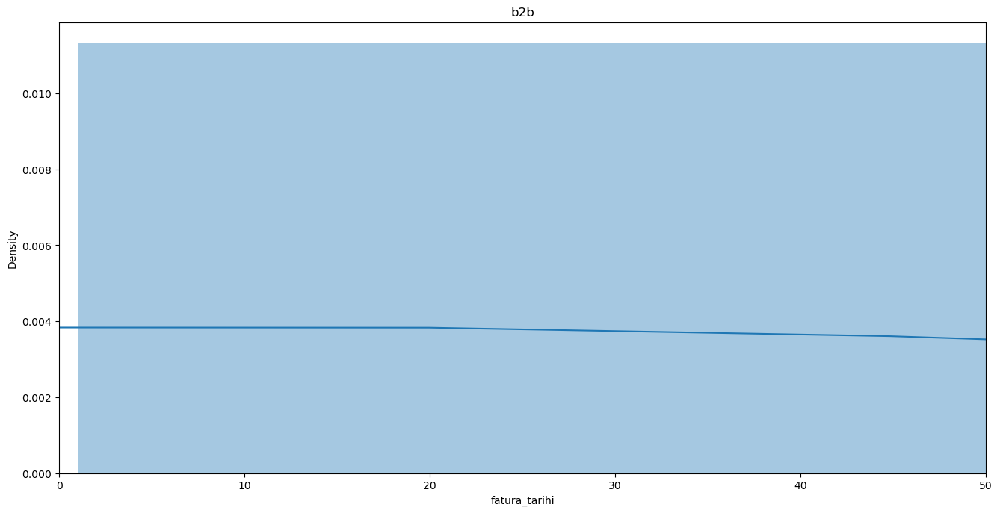

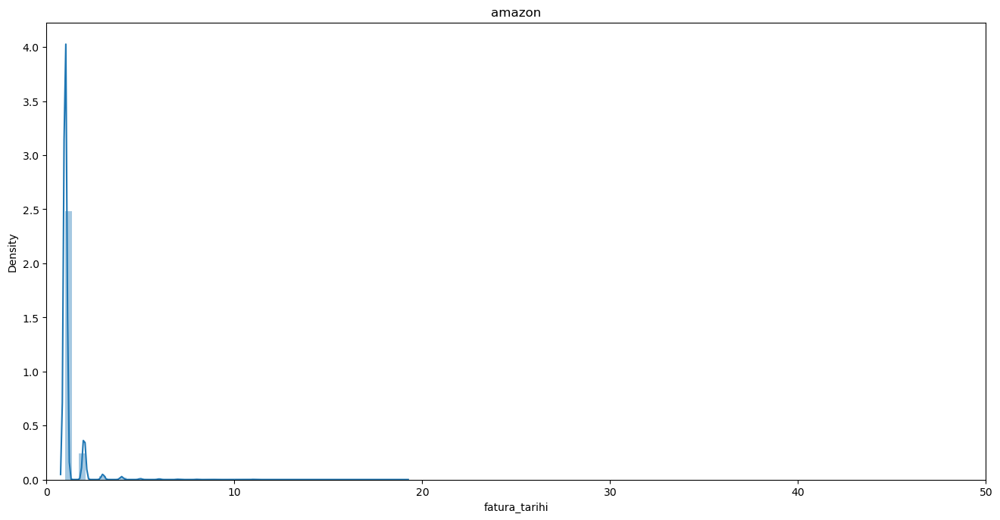

In [31]:
for i in range(len(platforms)):
    plt.figure(figsize=(16,8), dpi=100)
    sns.distplot(platforms[i].groupby('Customer').fatura_tarihi.count())
    plt.title(platforms_string[i])
    plt.xlim(0, 50);

**Explore Customers by Country**

1. What's the total revenue per country?

In [32]:
df.columns

Index(['fatura_tarihi', 'Customer', 'posta_kodu', 'city', 'country',
       'country_name', 'satis_yapilan_platform', 'satilan_urun', 'adet',
       'birim_fiyat', 'enflasyon', 'ciro', 'day_of_week', 'nakliye',
       'category', 'after_covid', 'before_covid', 'after_war', 'before_war'],
      dtype='object')

In [33]:
for i in range(len(platforms)):
    print(platforms_string[i])
    print(platforms[i].groupby("country_name").sum()["ciro"].sort_values(ascending=False))
    print()
    

ebay
country_name
GERMANY          19784.304844
ANTARCTICA       13362.393471
AUSTRIA            398.640539
SWITZERLAND        364.241946
GREAT BRITAIN      333.559861
SPAIN              312.552717
FRANCE             230.152788
 LUXEMBOURG        178.954753
NETHERLANDS        172.033079
ITALY              139.349832
SWEDEN             105.703875
BELGIUM             91.535140
RUSSIA              66.948088
SAUDI ARABIA        62.607477
NORWAY              47.216137
DENMARK             42.836017
USA                 39.618785
HUNGARY             33.228571
FINLAND             16.060000
IRLAND              14.009346
ESTONIA             11.205607
GREECE               8.403361
BOSNIA               5.878505
UKRAINE              5.598131
PORTUGAL             4.626168
MALTA                4.383178
Name: ciro, dtype: float64

kaufland
country_name
ANTARCTICA     4187.41
GERMANY         355.54
NETHERLANDS      31.77
AUSTRIA           8.40
BELGIUM           7.00
Name: ciro, dtype: float64

b2b
count

In [34]:
#df["Total_Price"] = df["Quantity"] * df["UnitPrice"]

In [35]:
#df.head()

2. Visualize number of customer per country

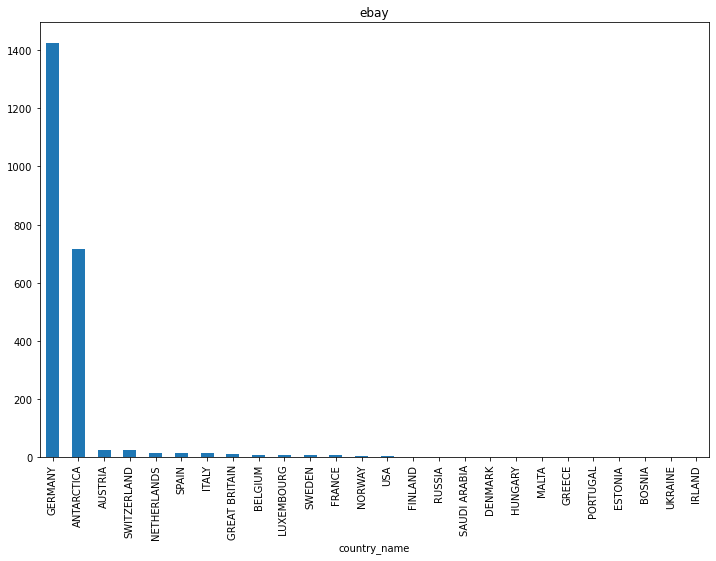

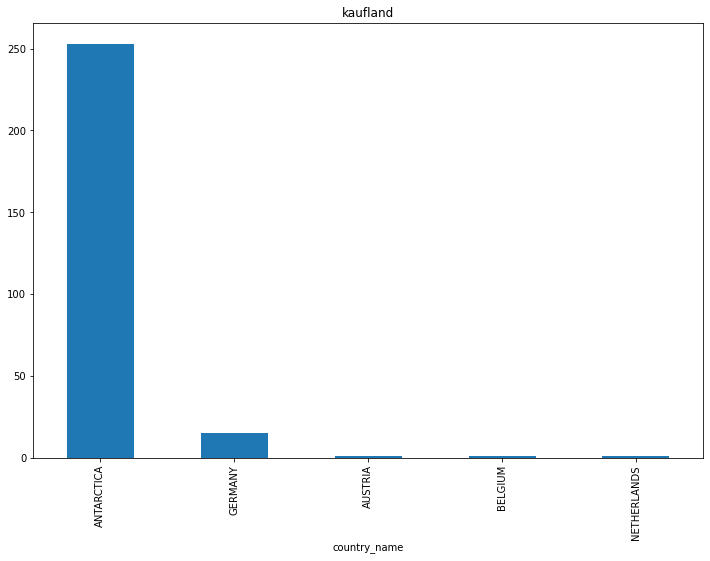

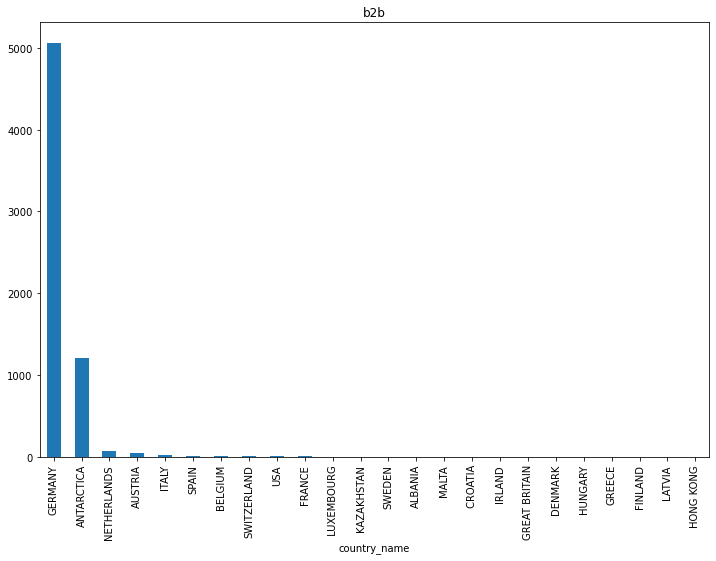

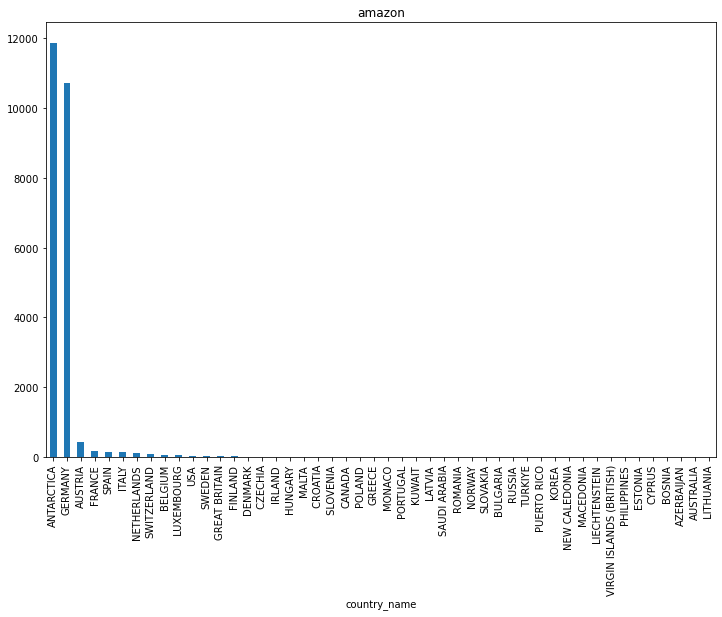

In [36]:
for i in range(len(platforms)):
    plt.figure(figsize=(12,8))
    platforms[i].groupby("country_name").count()["Customer"].sort_values(ascending=False).plot(kind="bar");
    plt.title(platforms_string[i])
   

3. Visualize total customers per country

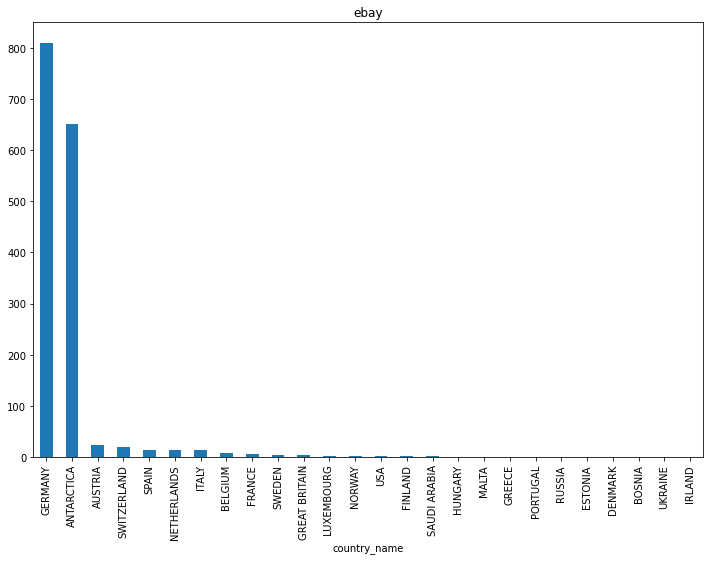

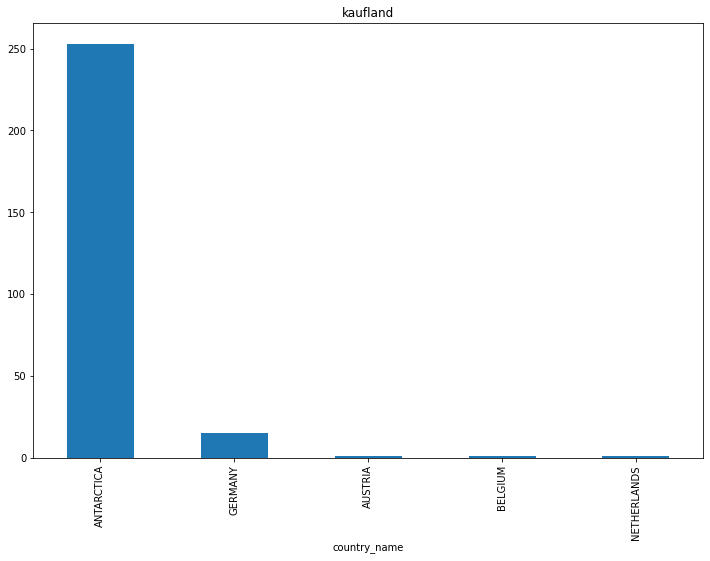

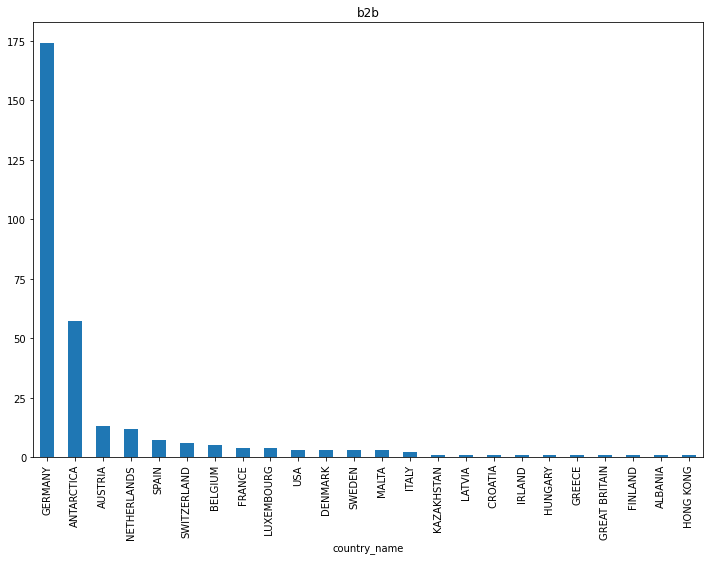

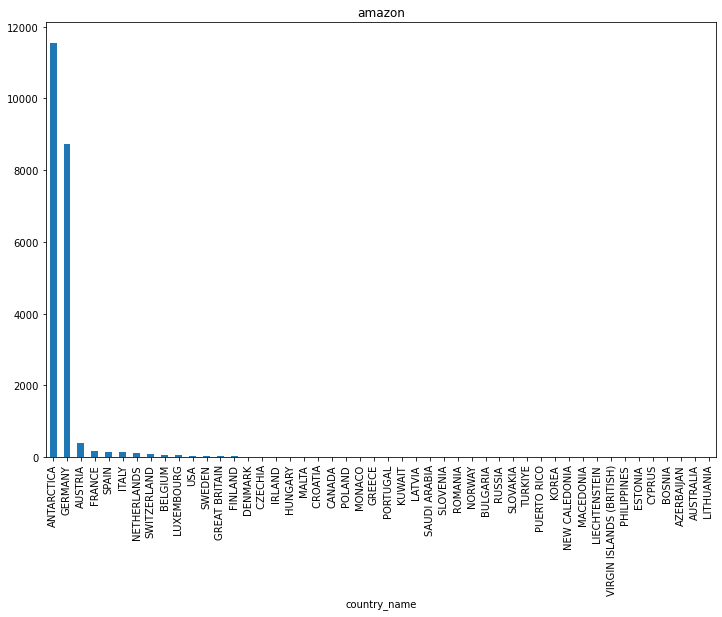

In [37]:
for i in range(len(platforms)):
    plt.figure(figsize=(12,8))
    plt.ticklabel_format(style='plain') #to change le6 to numbers
    plt.title(platforms_string[i])
    platforms[i].groupby("country_name").nunique()["Customer"].sort_values(ascending=False).plot(kind="bar");
    

#### Germany not only has the most sales revenue, but also the most customers. Since the majority of this data set contains orders from Germany, we can explore the German market further by finding out what products the customers buy together and any other buying behaviors to improve our sales and targeting strategy.

###  Explore Germany Market

1. Create df_de DataFrame

In [38]:
#for i in range(len(platforms)):
#    de_name[i] = platforms_string[i] + '_de'
    #print(de_name[i])
#    de_name[i] = platforms[i][platforms[i]["country_name"]=='GERMANY'] 
#    de_name[i].drop(["country","country_name"], axis=1, inplace=True) # Because every customer from de
#    print(de_name[i])
    #print(de_name.head())

In [39]:
#ebay_de

In [40]:
ebay_de = ebay[ebay["country_name"] == "GERMANY"]
ebay_de.drop(["country","country_name"], axis=1, inplace=True) # Because every customer from de
ebay_de

,fatura_tarihi,Customer,posta_kodu,city,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war
38,2019-05-22,ID11001,47533,Kleve,ebay,versandkosten,1.0,0.000000,1.4,0.000000,Wednesday,3.617214,versandkosten,0,1,0,1
106,2021-10-18,ID27399,51469,Bergisch Gladbach,ebay,versandkosten 19 %,1.0,0.631887,4.5,0.631887,Monday,3.617214,versandkosten,1,0,0,1
133,2019-06-03,ID10842,76437,Rastatt,ebay,gutschein,1.0,0.907563,1.6,0.907563,Monday,3.617214,gutschein,0,1,0,1
167,2021-06-29,ID20817,10715,Berlin,ebay,versandkosten 7 %,1.0,1.197485,3.8,1.197485,Tuesday,3.617214,versandkosten,1,0,0,1
222,2021-07-26,ID20806,14482,Potsdam,ebay,versandkosten 7 %,1.0,1.482980,3.8,1.482980,Monday,3.617214,versandkosten,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38899,2020-10-05,ID11976,93192,Wald,ebay,8 x 125g titiz geschälte maronen geröstet essf...,11.0,9.847619,-0.3,108.323810,Monday,3.617214,kestane,1,0,0,1
38934,2017-11-22,ID10177,85368,Moosburg,ebay,kaltgepresstes extra natives olivenöl alma oli...,1.0,112.140187,1.6,112.140187,Wednesday,3.617214,zeytinyagi,0,1,0,1
38962,2021-08-10,ID23008,33161,Hövelhof,ebay,"goran mevlana premium ceylon-teemischung, 1er ...",10.0,11.756303,3.8,117.563025,Tuesday,3.617214,cay,1,0,0,1
39074,2021-04-15,ID17176,44534,Lünen,ebay,echte ajwa acve datteln aus medina/ echte prop...,7.0,20.626168,2.0,144.383178,Thursday,3.617214,hurma,1,0,0,1


In [41]:
kaufland_de = kaufland[kaufland["country_name"] == "GERMANY"]
kaufland_de.drop(["country","country_name"], axis=1, inplace=True) # Because every customer from de
kaufland_de

,fatura_tarihi,Customer,posta_kodu,city,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war
8815,2022-03-15,IDKundenID19394,37213,Witzenhausen,kaufland,sumak gemahlen gewurz 450 g / essigbaumgewurz ...,1.0,7.00,7.3,7.00,Tuesday,4.45,sirke,1,0,1,0
8923,2021-12-09,IDKundenID4052,14532,Neu Berlin,kaufland,erdnusse in der schale/ geröstet-ungeröstet/ 1...,1.0,7.01,5.3,7.01,Thursday,4.15,fistik,1,0,0,1
11297,2021-12-21,IDKundenID12195,12168,Neu Berlin,kaufland,natural haselnuss in schale vegan unbehandelt ...,1.0,8.40,5.3,8.40,Tuesday,4.15,findik,1,0,0,1
11396,2022-03-15,IDKundenID297,37213,Witzenhausen,kaufland,100% roher berg honig 400 gr / naturbelassen/ ...,1.0,8.40,7.3,8.40,Tuesday,4.85,bal,1,0,1,0
11398,2022-03-15,IDKundenID9976,45127,Essen,kaufland,johannisbrot extrakt - keciboynuzu özu /vegan/...,1.0,8.40,7.3,8.40,Tuesday,5.25,pekmez,1,0,1,0
13843,2021-11-16,IDKundenID12194,5154EE,Neu Berlin,kaufland,natural haselnuss in schale vegan unbehandelt ...,1.0,9.34,5.2,9.34,Tuesday,3.99,findik,1,0,0,1
18534,2022-03-15,IDKundenID20002,45127,Essen,kaufland,titiz geschälte maronen geröstet essfertig ess...,1.0,12.14,7.3,12.14,Tuesday,4.85,kestane,1,0,1,0
20119,2021-11-25,IDKundenID4053,12168,Neu Berlin,kaufland,erdnusse in der schale/ geröstet-ungeröstet/ 1...,1.0,13.07,5.2,13.07,Thursday,3.99,fistik,1,0,0,1
32667,2021-12-06,IDKundenID11356,12168,Neu Berlin,kaufland,lezza spezielle große baklava mit pistazien öz...,1.0,28.96,5.2,28.96,Monday,0.00,baklava,1,0,0,1
33140,2021-12-10,IDKundenID22419,12168,Neu Berlin,kaufland,walnuss mit schale/neue ernte 2021/walnuss in ...,1.0,30.83,5.3,30.83,Friday,0.00,walnuss,1,0,0,1


In [42]:
amazon_de = amazon[amazon["country_name"] == "GERMANY"]
amazon_de.drop(["country","country_name"], axis=1, inplace=True) # Because every customer from de
amazon_de

,fatura_tarihi,Customer,posta_kodu,city,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war
28,2020-04-03,ID11393,23843,Bad Oldesloe,amazon,versandkosten,-1.0,4.626168,0.9,-4.626168,Friday,3.617214,versandkosten,1,0,0,1
85,2021-08-25,ID23963,61118,bad vilbel,amazon,versandkosten,1.0,0.009346,3.9,0.009346,Wednesday,3.617214,versandkosten,1,0,0,1
87,2019-08-09,ID11126,49393,Lohne (olb),amazon,versandkosten,1.0,0.046729,1.4,0.046729,Friday,3.617214,versandkosten,0,1,0,1
90,2021-06-30,ID20837,99096,Erfurt,amazon,versandkosten,1.0,0.214953,3.8,0.214953,Wednesday,3.617214,versandkosten,1,0,0,1
91,2021-08-31,ID24135,79183,Waldkirch,amazon,versandkosten,1.0,0.214953,3.9,0.214953,Tuesday,3.617214,versandkosten,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39195,2020-11-23,ID12496,88477,Schwendi,amazon,walnuss in schale chile 10 kg,2.0,95.228571,-0.3,190.457143,Monday,3.617214,walnuss,1,0,0,1
39198,2021-04-13,ID16534,63065,Offenbach,amazon,lezza baklava pistazie özel kare 1350g,6.0,32.616822,2.0,195.700935,Tuesday,3.617214,baklava,1,0,0,1
39207,2021-11-16,IDKundenID22458,12168,Neu Berlin,amazon,walnuss mit schale/neue ernte 2021/walnuss in ...,1.0,200.140000,5.2,200.140000,Tuesday,4.900000,walnuss,1,0,0,1
39247,2021-11-11,IDKundenID4069,59556,Lippstadt,amazon,erdnusse in der schale/ ungeröstet erdnuss mit...,8.0,31.770000,4.5,254.160000,Thursday,4.900000,fistik,1,0,0,1


In [43]:
b2b_de = b2b[b2b["country_name"] == "GERMANY"]
b2b_de.drop(["country","country_name"], axis=1, inplace=True) # Because every customer from de
b2b_de

,fatura_tarihi,Customer,posta_kodu,city,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war
0,2021-11-18,ID25062,79183,Neu Berlin,b2b,wabenhonig klein holzrahmen,-1050.0,8.900000,5.2,-9345.000000,Thursday,3.617214,wabenhonig,1,0,0,1
1,2021-11-05,ID18074,96114,Hirschaid,b2b,izmir tulum teneke,-1001.0,6.450000,4.5,-6456.450000,Friday,3.617214,peynir,1,0,0,1
4,2018-10-01,ID10402,64331,Neu Berlin,b2b,royal extra lata 5 l.,-4.0,39.990000,2.3,-159.960000,Monday,3.617214,zeytinyagi,0,1,0,1
9,2020-04-06,ID10709,34125,Kassel,b2b,kavurma feischware 1kg,-3.0,14.953271,0.9,-44.859813,Monday,3.617214,kavurma,1,0,0,1
11,2020-02-04,ID11199,32312,Lübbecke,b2b,kangal knoblauchwurst 1kg,-4.0,8.869159,1.7,-35.476636,Tuesday,3.617214,sucuk,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39323,2018-12-20,IDID -2,22529,Hamburg,b2b,pistazien,252.0,8.000000,2.1,2016.000000,Thursday,3.617214,antep fistigi,0,1,0,1
39328,2021-04-07,ID18073,81925,Munich,b2b,missut ezine käse 1000gr,402.0,7.500000,2.0,3015.000000,Wednesday,3.617214,peynir,1,0,0,1
39335,2020-12-30,IDID -2,45355,Essen,b2b,fersan nar eksisi 330 ml,1920.0,2.150000,-0.3,4128.000000,Wednesday,3.617214,nar_eksisi,1,0,0,1
39336,2021-09-09,ID18074,53797,Lohmar,b2b,izmir tulum-weiss käse teneke,1002.0,6.250000,3.9,6262.500000,Thursday,3.617214,peynir,1,0,0,1


2. What are the most popular products that are bought in Germany?

In [44]:
de_platforms = [ebay_de, amazon_de,b2b_de, kaufland_de]
de_platforms_string = ['ebay_de', 'amazon_de','b2b_de', 'kaufland_de']

In [45]:
for i in range(len(de_platforms)):
    print(de_platforms_string[i])
    print(de_platforms[i].satilan_urun.value_counts().sort_values(ascending=False))
    print()

ebay_de
versandkosten                                                                                                              479
dummy artikel                                                                                                               20
efepasa parmak sucuk 1kg                                                                                                    18
3x 340gr sera johannisbrotsirup - keciboynuzu pekmezi /vegan/ohne farbstoffe                                                16
egeturk knoblauchwurst - 1000 gr / 100% rindfleisch / kangal sucuk                                                          14
                                                                                                                          ... 
kaki getrocknete natural ohne zucker trockenfruchte frucht/ kuru cennet hurmasi[500 g]                                       1
misssut weisskäse aus niederlande 600g                                                                 

#  RFM Analysis

In the age of the internet and e-commerce, companies that do not expand their businesses online or utilize digital tools to reach their customers will run into issues like scalability and a lack of digital precsence. An important marketing strategy e-commerce businesses use for analyzing and predicting customer value is customer segmentation. Customer data is used to sort customers into group based on their behaviors and preferences.

**[RFM](https://www.putler.com/rfm-analysis/) (Recency, Frequency, Monetary) Analysis** is a customer segmentation technique for analyzing customer value based on past buying behavior. RFM analysis was first used by the direct mail industry more than four decades ago, yet it is still an effective way to optimize your marketing.
<br>
<br>
Our goal in this Notebook is to cluster the customers in our data set to:
 - Recognize who are our most valuable customers
 - Increase revenue
 - Increase customer retention
 - Learn more about the trends and behaviors of our customers
 - Define customers that are at risk

We will start with **RFM Analysis** and then compliment our findings with predictive analysis using **K-Means Clustering Algorithms.**

- RECENCY (R): Time since last purchase
- FREQUENCY (F): Total number of purchases
- MONETARY VALUE (M): Total monetary value




Benefits of RFM Analysis

- Increased customer retention
- Increased response rate
- Increased conversion rate
- Increased revenue

RFM Analysis answers the following questions:
 - Who are our best customers?
 - Who has the potential to be converted into more profitable customers?
 - Which customers do we need to retain?
 - Which group of customers is most likely to respond to our marketing campaign?
 

###  Import Libraries

In [46]:
import datetime as dt
from datetime import datetime
from datetime import timedelta

In [47]:
df.columns

Index(['fatura_tarihi', 'Customer', 'posta_kodu', 'city', 'country',
       'country_name', 'satis_yapilan_platform', 'satilan_urun', 'adet',
       'birim_fiyat', 'enflasyon', 'ciro', 'day_of_week', 'nakliye',
       'category', 'after_covid', 'before_covid', 'after_war', 'before_war'],
      dtype='object')

### Review Deustchland DataFrames

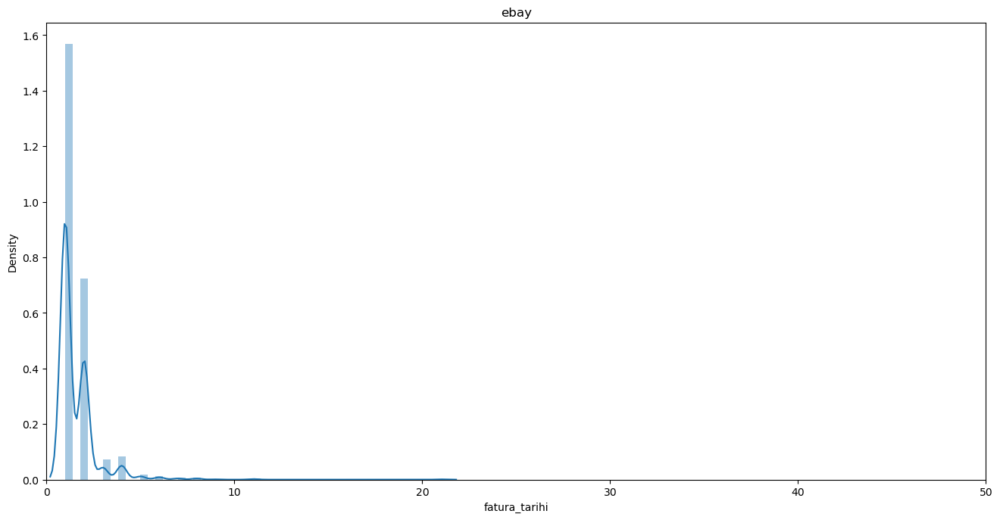

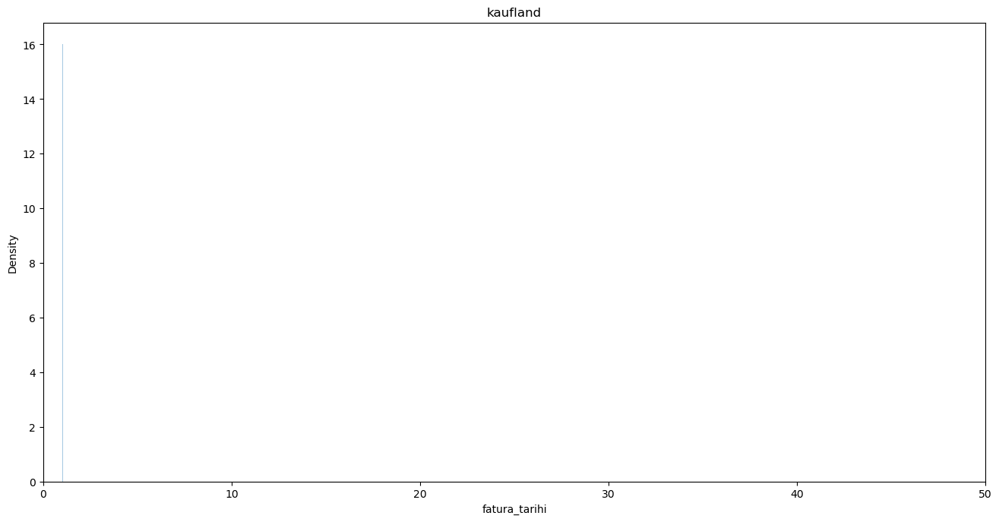

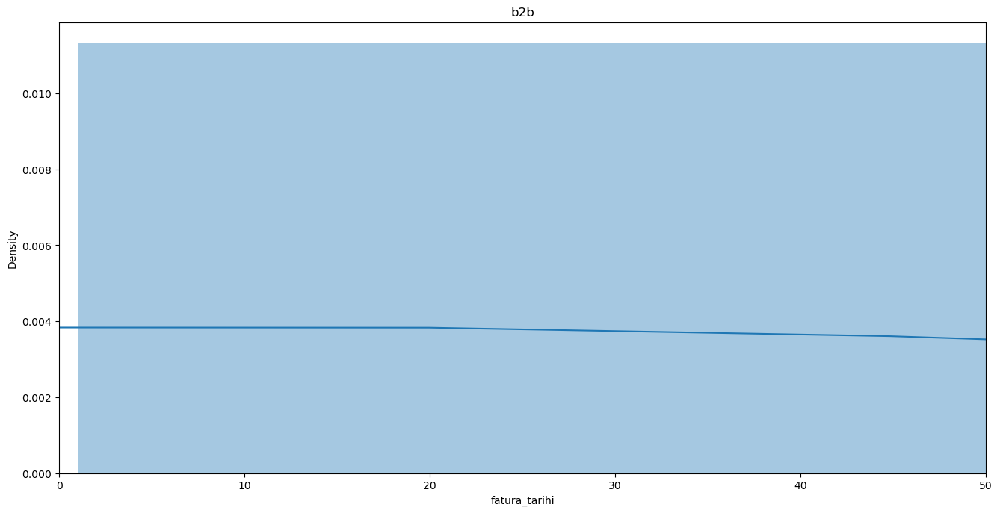

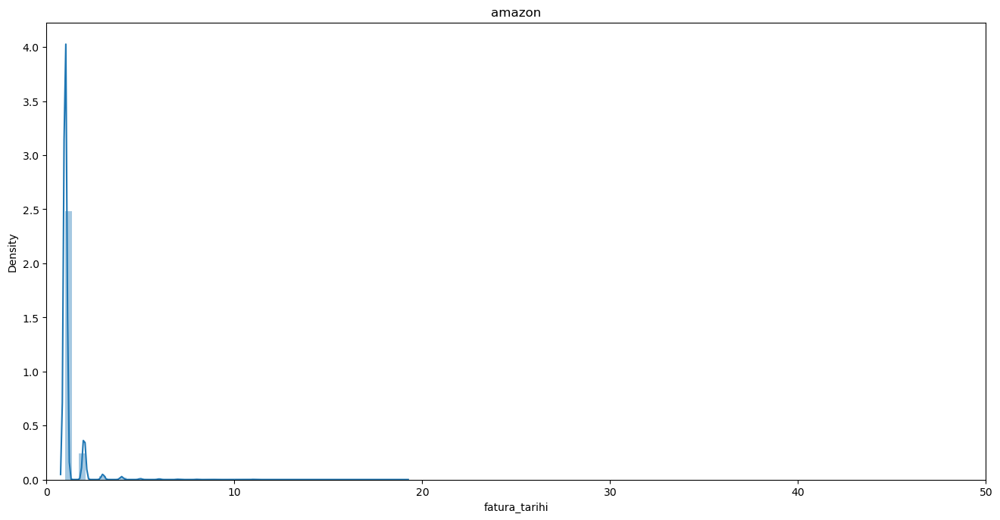

In [48]:
for i in range(len(de_platforms)):
    plt.figure(figsize=(16,8), dpi=100)
    sns.distplot(platforms[i].groupby('Customer').fatura_tarihi.count())
    plt.title(platforms_string[i])
    plt.xlim(0, 50);

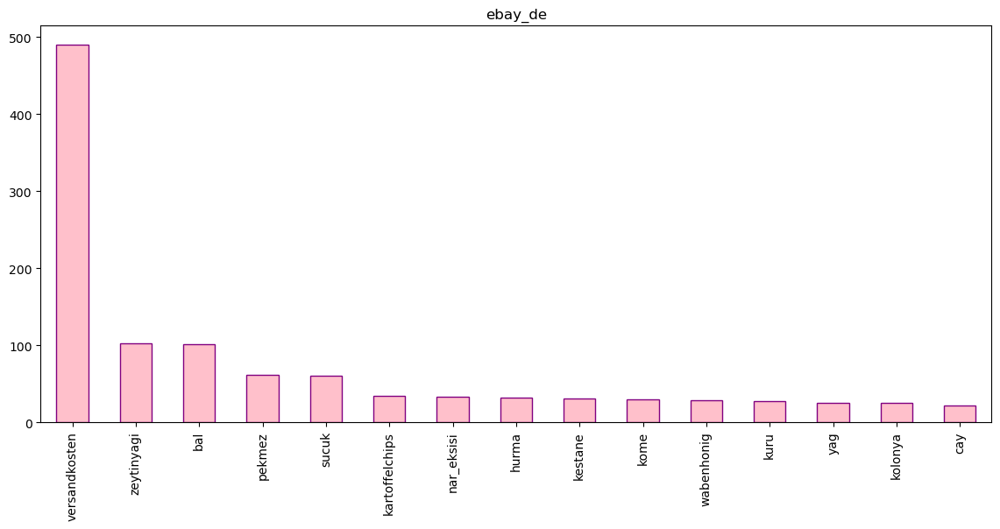

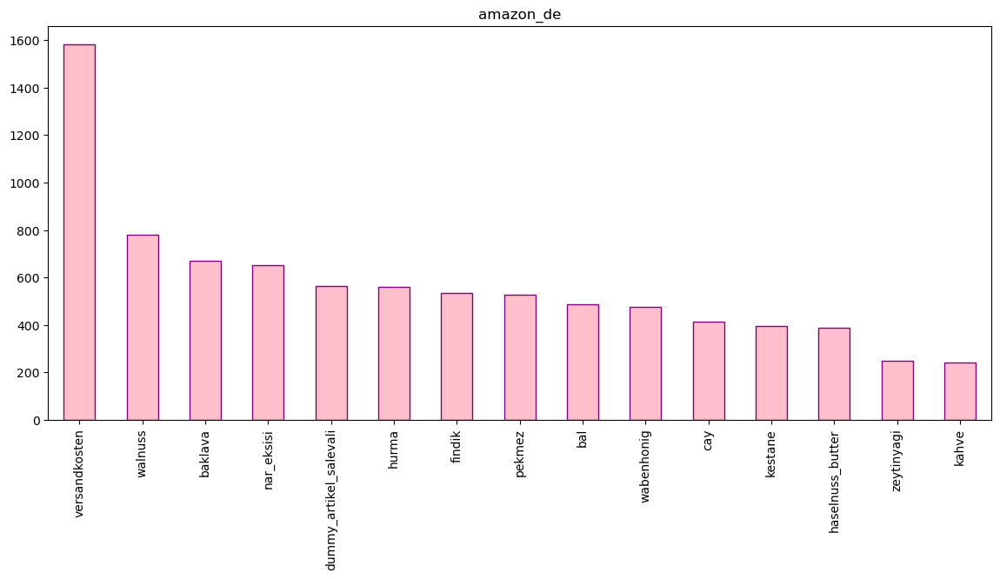

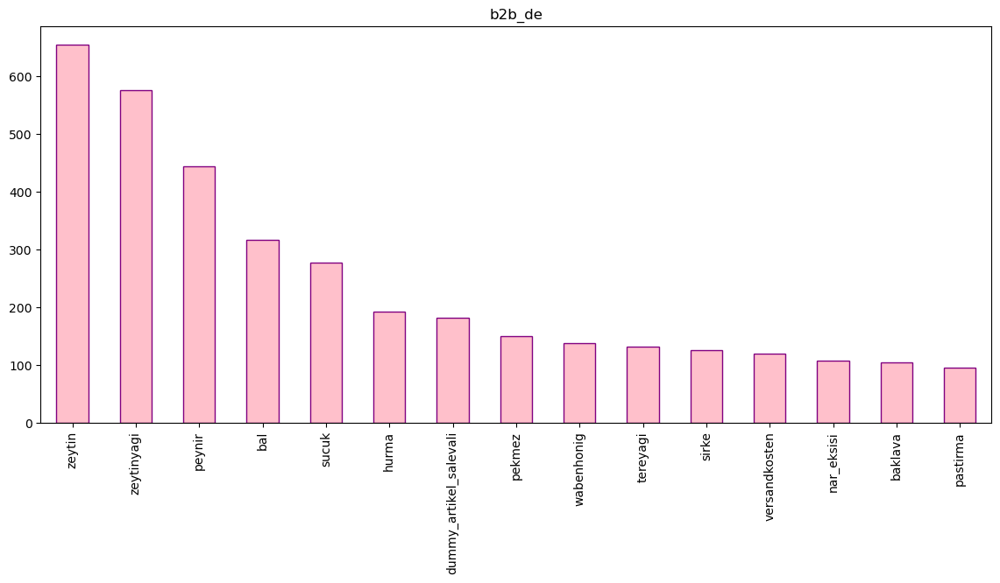

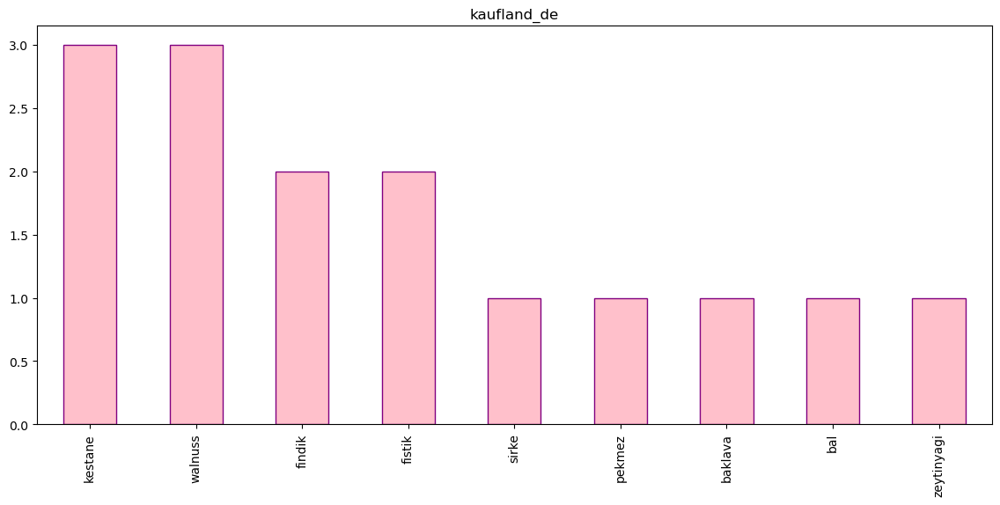

In [49]:
for i in range(len(de_platforms)):
    #print(de_platforms_string[i])
    plt.figure(figsize=(16,8), dpi=100)
    #print(de_platforms[i].head())
    #print(de_platforms[i].info())
    
    de_platforms[i]["category"].value_counts().head(15).plot(kind="bar", width=0.5, color='pink', edgecolor='purple', figsize=(14, 6));
    #plt.xticks(rotation=45);
    plt.title(de_platforms_string[i])
    de_platforms[i][de_platforms[i].birim_fiyat == 0.0]
    de_platforms[i][de_platforms[i].adet < 0]
    print()

###  Recency: Days since last purchase
To calculate the recency values, follow these steps in order:

1. To calculate recency, we need to choose a date as a point of reference to evaluate how many days ago was the customer's last purchase.
2. Create a new column called Date which contains the invoice date without the timestamp
3. Group by CustomerID and check the last date of purchase
4. Calculate the days since last purchase
5. Drop Last_Purchase_Date since we don't need it anymore
6. Plot RFM distributions

1. Choose a date as a point of reference to evaluate how many days ago was the customer's last purchase.

In [50]:
df.fatura_tarihi.max()

Timestamp('2022-04-29 00:00:00')

In [51]:
df["date"] = pd.to_datetime("2022-04-30") # 1 day after from max date so it is 2022-04-30.

In [52]:
df

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date
0,2021-11-18,ID25062,79183,Neu Berlin,DEU,GERMANY,b2b,wabenhonig klein holzrahmen,-1050.0,8.90,5.2,-9345.00,Thursday,3.617214,wabenhonig,1,0,0,1,2022-04-30
1,2021-11-05,ID18074,96114,Hirschaid,DEU,GERMANY,b2b,izmir tulum teneke,-1001.0,6.45,4.5,-6456.45,Friday,3.617214,peynir,1,0,0,1,2022-04-30
2,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum-weiss käse teneke,-1002.0,6.25,7.4,-6262.50,Friday,3.617214,peynir,1,0,1,0,2022-04-30
3,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum 1000gr,-678.0,6.95,7.4,-4712.10,Friday,3.617214,peynir,1,0,1,0,2022-04-30
4,2018-10-01,ID10402,64331,Neu Berlin,DEU,GERMANY,b2b,royal extra lata 5 l.,-4.0,39.99,2.3,-159.96,Monday,3.617214,zeytinyagi,0,1,0,1,2022-04-30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39337,2021-06-10,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum teneke,1001.0,6.45,2.3,6456.45,Thursday,3.617214,peynir,1,0,0,1,2022-04-30
39338,2021-09-10,ID25062,1000,other,ATA,ANTARCTICA,b2b,wabenhonig klein holzrahmen,1050.0,8.90,3.9,9345.00,Friday,3.617214,wabenhonig,1,0,0,1,2022-04-30
39339,2021-10-26,ID18074,11011,Berlin,DEU,GERMANY,b2b,ezine käse 1000gr,1506.0,6.45,4.5,9713.70,Tuesday,3.617214,peynir,1,0,0,1,2022-04-30
39340,2021-06-10,ID18074,1000,other,ATA,ANTARCTICA,b2b,ezine käse 1000gr,1700.0,6.75,2.3,11475.00,Thursday,3.617214,peynir,1,0,0,1,2022-04-30


In [53]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    max_date = platforms[i].fatura_tarihi.max()
    platforms[i]["date"] = pd.to_datetime(str(max_date))
    print(str(max_date))
    #print(de_platforms[i].head())

ebay
2022-04-28 00:00:00
kaufland
2022-04-29 00:00:00
b2b
2022-04-27 00:00:00
amazon
2022-04-29 00:00:00


In [54]:
ebay

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date
38,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,1.4,0.000000,Wednesday,3.617214,versandkosten,0,1,0,1,2022-04-28
106,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,4.5,0.631887,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28
133,2019-06-03,ID10842,76437,Rastatt,DEU,GERMANY,ebay,gutschein,1.0,0.907563,1.6,0.907563,Monday,3.617214,gutschein,0,1,0,1,2022-04-28
167,2021-06-29,ID20817,10715,Berlin,DEU,GERMANY,ebay,versandkosten 7 %,1.0,1.197485,3.8,1.197485,Tuesday,3.617214,versandkosten,1,0,0,1,2022-04-28
180,2018-03-23,ID10168,9300,St. Veit a. d. Glan,AUT,AUSTRIA,ebay,versandkosten,1.0,1.260504,1.5,1.260504,Friday,3.617214,versandkosten,0,1,0,1,2022-04-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39026,2021-10-20,ID27739,36000,Châteauroux,FRA,FRANCE,ebay,efepasa parmak sucuk 1kg,10.0,13.028037,4.5,130.280374,Wednesday,3.617214,sucuk,1,0,0,1,2022-04-28
39061,2021-03-09,ID12934,1000,other,ATA,ANTARCTICA,ebay,pergamo geröstet & ungesalzen haselnusskerne- ...,2.0,70.084112,1.7,140.168224,Tuesday,3.617214,findik,1,0,0,1,2022-04-28
39074,2021-04-15,ID17176,44534,Lünen,DEU,GERMANY,ebay,echte ajwa acve datteln aus medina/ echte prop...,7.0,20.626168,2.0,144.383178,Thursday,3.617214,hurma,1,0,0,1,2022-04-28
39116,2019-06-24,ID11167,64331,Weiterstadt,DEU,GERMANY,ebay,royal extra lata 5 l.,4.0,39.242991,1.6,156.971963,Monday,3.617214,zeytinyagi,0,1,0,1,2022-04-28


In [55]:
amazon

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date
28,2020-04-03,ID11393,23843,Bad Oldesloe,DEU,GERMANY,amazon,versandkosten,-1.0,4.626168,0.9,-4.626168,Friday,3.617214,versandkosten,1,0,0,1,2022-04-29
65,2022-03-22,IDKundenID23303,1000,other,ATA,ANTARCTICA,amazon,zeytin ana siyah katirli zeytini iri boy - 100...,1.0,0.000000,7.3,0.000000,Tuesday,0.000000,zeytin,1,0,1,0,2022-04-29
67,2022-03-22,IDKundenID10469,1000,other,ATA,ANTARCTICA,amazon,kestane bali- pergamo - 400 gr.,1.0,0.000000,7.3,0.000000,Tuesday,0.000000,bal,1,0,1,0,2022-04-29
71,2022-03-22,IDKundenID2975,1000,other,ATA,ANTARCTICA,amazon,destan siyah gemlik zeytini 700 g,2.0,0.000000,7.3,0.000000,Tuesday,0.000000,zeytin,1,0,1,0,2022-04-29
74,2022-03-22,IDKundenID23248,1000,other,ATA,ANTARCTICA,amazon,zeytin ana köy yapimi dut pekmezi 630 g,1.0,0.000000,7.3,0.000000,Tuesday,4.900000,pekmez,1,0,1,0,2022-04-29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39266,2022-03-24,IDKundenID13181,1000,other,ATA,ANTARCTICA,amazon,neue ernte weizenmehl - type 405 (25 kg) / hoc...,8.0,42.050000,7.4,336.400000,Thursday,44.100000,un,1,0,1,0,2022-04-29
39268,2021-12-20,IDKundenID20795,1000,other,ATA,ANTARCTICA,amazon,wabenhonig im holzrahmen*naturbelassen*nachhal...,10.0,34.990000,5.3,349.900000,Monday,32.090000,wabenhonig,1,0,0,1,2022-04-29
39284,2022-03-29,IDKundenID11605,1000,other,ATA,ANTARCTICA,amazon,medjool datteln 5kg | 100% naturlich & gesund ...,10.0,48.920000,7.4,489.200000,Tuesday,4.900000,hurma,1,0,1,0,2022-04-29
39297,2022-02-09,IDKundenID5387,1000,other,ATA,ANTARCTICA,amazon,galilee medjoul xxl natur datteln unbehandelt ...,15.0,43.930000,5.1,658.950000,Wednesday,0.000000,hurma,1,0,0,1,2022-04-29


In [56]:
b2b

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date
0,2021-11-18,ID25062,79183,Neu Berlin,DEU,GERMANY,b2b,wabenhonig klein holzrahmen,-1050.0,8.90,5.2,-9345.00,Thursday,3.617214,wabenhonig,1,0,0,1,2022-04-27
1,2021-11-05,ID18074,96114,Hirschaid,DEU,GERMANY,b2b,izmir tulum teneke,-1001.0,6.45,4.5,-6456.45,Friday,3.617214,peynir,1,0,0,1,2022-04-27
2,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum-weiss käse teneke,-1002.0,6.25,7.4,-6262.50,Friday,3.617214,peynir,1,0,1,0,2022-04-27
3,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum 1000gr,-678.0,6.95,7.4,-4712.10,Friday,3.617214,peynir,1,0,1,0,2022-04-27
4,2018-10-01,ID10402,64331,Neu Berlin,DEU,GERMANY,b2b,royal extra lata 5 l.,-4.0,39.99,2.3,-159.96,Monday,3.617214,zeytinyagi,0,1,0,1,2022-04-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39337,2021-06-10,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum teneke,1001.0,6.45,2.3,6456.45,Thursday,3.617214,peynir,1,0,0,1,2022-04-27
39338,2021-09-10,ID25062,1000,other,ATA,ANTARCTICA,b2b,wabenhonig klein holzrahmen,1050.0,8.90,3.9,9345.00,Friday,3.617214,wabenhonig,1,0,0,1,2022-04-27
39339,2021-10-26,ID18074,11011,Berlin,DEU,GERMANY,b2b,ezine käse 1000gr,1506.0,6.45,4.5,9713.70,Tuesday,3.617214,peynir,1,0,0,1,2022-04-27
39340,2021-06-10,ID18074,1000,other,ATA,ANTARCTICA,b2b,ezine käse 1000gr,1700.0,6.75,2.3,11475.00,Thursday,3.617214,peynir,1,0,0,1,2022-04-27


In [57]:
kaufland

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date
2008,2022-04-06,IDKundenID16807,1000,other,ATA,ANTARCTICA,kaufland,pergamo sumach pulver - orientalisches gewurz ...,1.0,3.72,7.4,3.72,Wednesday,4.45,sirke,1,0,1,0,2022-04-29
2939,2021-12-21,IDKundenID6469,1000,other,ATA,ANTARCTICA,kaufland,granatapfelsirup 100 % granatapfel konzentrat ...,1.0,4.19,5.3,4.19,Tuesday,5.35,nar_eksisi,1,0,0,1,2022-04-29
2940,2022-03-02,IDKundenID6753,1000,other,ATA,ANTARCTICA,kaufland,granatapfelsirup 100 % granatapfel konzentrat ...,1.0,4.19,7.3,4.19,Wednesday,4.85,nar_eksisi,1,0,1,0,2022-04-29
2941,2022-04-02,IDKundenID6848,1000,other,ATA,ANTARCTICA,kaufland,granatapfelsirup 100 % granatapfel konzentrat ...,1.0,4.19,7.4,4.19,Saturday,8.05,nar_eksisi,1,0,1,0,2022-04-29
2942,2022-04-21,IDKundenID20310,1000,other,ATA,ANTARCTICA,kaufland,traubensirup /100% naturlich /ohne farbstoffe ...,1.0,4.19,7.6,4.19,Thursday,4.45,pekmez,1,0,1,0,2022-04-29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37949,2021-12-12,IDKundenID21831,1000,other,ATA,ANTARCTICA,kaufland,walnuss in schale/ *neu ernte 2021*/ unbehande...,1.0,61.68,5.3,61.68,Sunday,4.15,walnuss,1,0,0,1,2022-04-29
37951,2022-02-01,IDKundenID21832,1000,other,ATA,ANTARCTICA,kaufland,walnuss in schale/ *neu ernte 2021*/ unbehande...,1.0,61.68,5.1,61.68,Tuesday,4.15,walnuss,1,0,0,1,2022-04-29
37952,2022-03-30,IDKundenID21833,1000,other,ATA,ANTARCTICA,kaufland,walnuss in schale/ *neu ernte 2021*/ unbehande...,1.0,61.68,7.4,61.68,Wednesday,4.45,walnuss,1,0,1,0,2022-04-29
38554,2022-04-26,IDKundenID12201,1000,other,ATA,ANTARCTICA,kaufland,natural haselnuss in schale vegan unbehandelt ...,1.0,84.01,7.6,84.01,Tuesday,0.00,findik,1,0,1,0,2022-04-29


In [58]:
# Önce siteden en son alışveriş yapılan tarihi belirledik.
# Bunun 1 gün sonrasını Date adında yeni bir sütun olarak DF imize ekledik. 
# Amacımız her müşteri için Recency değerini hesaplamak.

2. Create a new column called Date which contains the invoice date without the timestamp

In [59]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    platforms[i]["fatura_tarihi"] = platforms[i]["fatura_tarihi"].dt.date
    

ebay
kaufland
b2b
amazon


In [60]:
ebay

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date
38,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,1.4,0.000000,Wednesday,3.617214,versandkosten,0,1,0,1,2022-04-28
106,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,4.5,0.631887,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28
133,2019-06-03,ID10842,76437,Rastatt,DEU,GERMANY,ebay,gutschein,1.0,0.907563,1.6,0.907563,Monday,3.617214,gutschein,0,1,0,1,2022-04-28
167,2021-06-29,ID20817,10715,Berlin,DEU,GERMANY,ebay,versandkosten 7 %,1.0,1.197485,3.8,1.197485,Tuesday,3.617214,versandkosten,1,0,0,1,2022-04-28
180,2018-03-23,ID10168,9300,St. Veit a. d. Glan,AUT,AUSTRIA,ebay,versandkosten,1.0,1.260504,1.5,1.260504,Friday,3.617214,versandkosten,0,1,0,1,2022-04-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39026,2021-10-20,ID27739,36000,Châteauroux,FRA,FRANCE,ebay,efepasa parmak sucuk 1kg,10.0,13.028037,4.5,130.280374,Wednesday,3.617214,sucuk,1,0,0,1,2022-04-28
39061,2021-03-09,ID12934,1000,other,ATA,ANTARCTICA,ebay,pergamo geröstet & ungesalzen haselnusskerne- ...,2.0,70.084112,1.7,140.168224,Tuesday,3.617214,findik,1,0,0,1,2022-04-28
39074,2021-04-15,ID17176,44534,Lünen,DEU,GERMANY,ebay,echte ajwa acve datteln aus medina/ echte prop...,7.0,20.626168,2.0,144.383178,Thursday,3.617214,hurma,1,0,0,1,2022-04-28
39116,2019-06-24,ID11167,64331,Weiterstadt,DEU,GERMANY,ebay,royal extra lata 5 l.,4.0,39.242991,1.6,156.971963,Monday,3.617214,zeytinyagi,0,1,0,1,2022-04-28


3. Group by Customer and check the last date of purchase

In [61]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    print(platforms[i].groupby('Customer').max()["fatura_tarihi"])
    print()
    

ebay
Customer
ID10001           2018-07-28
ID10002           2017-12-05
ID10003           2018-01-31
ID10016           2018-03-05
ID10017           2018-03-05
                     ...    
IDKundenID9892    2021-10-20
IDKundenID9893    2022-01-21
IDKundenID9956    2022-03-05
IDKundenID9957    2022-01-21
IDKundenID9958    2022-01-25
Name: fatura_tarihi, Length: 1458, dtype: object

kaufland
Customer
IDKundenID10000    2022-03-16
IDKundenID10002    2022-04-25
IDKundenID10006    2022-04-08
IDKundenID10014    2022-04-17
IDKundenID10019    2022-04-22
                      ...    
IDKundenID9954     2021-12-21
IDKundenID9976     2022-03-15
IDKundenID9990     2022-01-17
IDKundenID9998     2022-02-21
IDKundenID9999     2022-03-03
Name: fatura_tarihi, Length: 271, dtype: object

b2b
Customer
ID -2      2017-08-29
ID0        2022-03-21
ID10006    2018-02-01
ID10007    2022-04-09
ID10245    2020-10-16
              ...    
ID28540    2022-03-16
ID28541    2022-03-21
ID28542    2022-03-26
ID28543  

In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39342 entries, 0 to 39341
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   fatura_tarihi           39342 non-null  datetime64[ns]
 1   Customer                39342 non-null  object        
 2   posta_kodu              39342 non-null  object        
 3   city                    39342 non-null  object        
 4   country                 39342 non-null  object        
 5   country_name            39342 non-null  object        
 6   satis_yapilan_platform  39342 non-null  object        
 7   satilan_urun            39342 non-null  object        
 8   adet                    39342 non-null  float64       
 9   birim_fiyat             39342 non-null  float64       
 10  enflasyon               39342 non-null  float64       
 11  ciro                    39342 non-null  float64       
 12  day_of_week             39342 non-null  object

In [63]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    print(platforms[i].info())
    print()

ebay
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2295 entries, 38 to 39238
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   fatura_tarihi           2295 non-null   object        
 1   Customer                2295 non-null   object        
 2   posta_kodu              2295 non-null   object        
 3   city                    2295 non-null   object        
 4   country                 2295 non-null   object        
 5   country_name            2295 non-null   object        
 6   satis_yapilan_platform  2295 non-null   object        
 7   satilan_urun            2295 non-null   object        
 8   adet                    2295 non-null   float64       
 9   birim_fiyat             2295 non-null   float64       
 10  enflasyon               2295 non-null   float64       
 11  ciro                    2295 non-null   float64       
 12  day_of_week             2295 non-null   o

In [64]:
# fatura tarihi verimiz hala Object görünüyor. Bunu düzeltmemiz gerekiyor. 

In [65]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    platforms[i].fatura_tarihi = pd.to_datetime(platforms[i].fatura_tarihi)
    print()

ebay

kaufland

b2b

amazon



In [66]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    print(platforms[i].info())
    print()

ebay
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2295 entries, 38 to 39238
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   fatura_tarihi           2295 non-null   datetime64[ns]
 1   Customer                2295 non-null   object        
 2   posta_kodu              2295 non-null   object        
 3   city                    2295 non-null   object        
 4   country                 2295 non-null   object        
 5   country_name            2295 non-null   object        
 6   satis_yapilan_platform  2295 non-null   object        
 7   satilan_urun            2295 non-null   object        
 8   adet                    2295 non-null   float64       
 9   birim_fiyat             2295 non-null   float64       
 10  enflasyon               2295 non-null   float64       
 11  ciro                    2295 non-null   float64       
 12  day_of_week             2295 non-null   o

# RFM ANALYSIS

## Recency <a id="11"></a>                  [^](#ToC)<br>


R — Higher score implies that particular customer has recently made a purchase and will most likely response to current promotion. Low R score reveals the possibility of being churned.

In [67]:
# Şimdi Recency değerini (en son alışveriş yaptığı tarihten bugüne geçen gün sayısı) hesaplayalım.
# Ve bunu Days isimli yeni bir sütun olarak DF imize ekleyelim.

In [68]:
ebay

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date
38,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,1.4,0.000000,Wednesday,3.617214,versandkosten,0,1,0,1,2022-04-28
106,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,4.5,0.631887,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28
133,2019-06-03,ID10842,76437,Rastatt,DEU,GERMANY,ebay,gutschein,1.0,0.907563,1.6,0.907563,Monday,3.617214,gutschein,0,1,0,1,2022-04-28
167,2021-06-29,ID20817,10715,Berlin,DEU,GERMANY,ebay,versandkosten 7 %,1.0,1.197485,3.8,1.197485,Tuesday,3.617214,versandkosten,1,0,0,1,2022-04-28
180,2018-03-23,ID10168,9300,St. Veit a. d. Glan,AUT,AUSTRIA,ebay,versandkosten,1.0,1.260504,1.5,1.260504,Friday,3.617214,versandkosten,0,1,0,1,2022-04-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39026,2021-10-20,ID27739,36000,Châteauroux,FRA,FRANCE,ebay,efepasa parmak sucuk 1kg,10.0,13.028037,4.5,130.280374,Wednesday,3.617214,sucuk,1,0,0,1,2022-04-28
39061,2021-03-09,ID12934,1000,other,ATA,ANTARCTICA,ebay,pergamo geröstet & ungesalzen haselnusskerne- ...,2.0,70.084112,1.7,140.168224,Tuesday,3.617214,findik,1,0,0,1,2022-04-28
39074,2021-04-15,ID17176,44534,Lünen,DEU,GERMANY,ebay,echte ajwa acve datteln aus medina/ echte prop...,7.0,20.626168,2.0,144.383178,Thursday,3.617214,hurma,1,0,0,1,2022-04-28
39116,2019-06-24,ID11167,64331,Weiterstadt,DEU,GERMANY,ebay,royal extra lata 5 l.,4.0,39.242991,1.6,156.971963,Monday,3.617214,zeytinyagi,0,1,0,1,2022-04-28


In [69]:
for i in range(len(platforms)):
    #print(platforms_string[i]) 
    platforms[i]["Days"] = ( platforms[i]["date"] -  platforms[i]["fatura_tarihi"]).dt.days
    print()

In [70]:
ebay

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days
38,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,...,0.000000,Wednesday,3.617214,versandkosten,0,1,0,1,2022-04-28,1072
106,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,0.631887,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192
133,2019-06-03,ID10842,76437,Rastatt,DEU,GERMANY,ebay,gutschein,1.0,0.907563,...,0.907563,Monday,3.617214,gutschein,0,1,0,1,2022-04-28,1060
167,2021-06-29,ID20817,10715,Berlin,DEU,GERMANY,ebay,versandkosten 7 %,1.0,1.197485,...,1.197485,Tuesday,3.617214,versandkosten,1,0,0,1,2022-04-28,303
180,2018-03-23,ID10168,9300,St. Veit a. d. Glan,AUT,AUSTRIA,ebay,versandkosten,1.0,1.260504,...,1.260504,Friday,3.617214,versandkosten,0,1,0,1,2022-04-28,1497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39026,2021-10-20,ID27739,36000,Châteauroux,FRA,FRANCE,ebay,efepasa parmak sucuk 1kg,10.0,13.028037,...,130.280374,Wednesday,3.617214,sucuk,1,0,0,1,2022-04-28,190
39061,2021-03-09,ID12934,1000,other,ATA,ANTARCTICA,ebay,pergamo geröstet & ungesalzen haselnusskerne- ...,2.0,70.084112,...,140.168224,Tuesday,3.617214,findik,1,0,0,1,2022-04-28,415
39074,2021-04-15,ID17176,44534,Lünen,DEU,GERMANY,ebay,echte ajwa acve datteln aus medina/ echte prop...,7.0,20.626168,...,144.383178,Thursday,3.617214,hurma,1,0,0,1,2022-04-28,378
39116,2019-06-24,ID11167,64331,Weiterstadt,DEU,GERMANY,ebay,royal extra lata 5 l.,4.0,39.242991,...,156.971963,Monday,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1039


4. Calculate the days since last purchase

In [71]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    print()

ebay

kaufland

b2b

amazon



In [72]:
rfm_ebay=pd.DataFrame()
rfm_amazon = pd.DataFrame()
rfm_b2b= pd.DataFrame()
rfm_kaufland= pd.DataFrame()


In [73]:
# rfm isimli  boş  DF'ler oluşturduk.

In [74]:
rfm = [rfm_ebay,rfm_kaufland,rfm_b2b,rfm_amazon  ]
rfm_string = ['rfm_ebay','rfm_kaufland', 'rfm_b2b', 'rfm_amazon']

In [75]:
for i in range(len(rfm)):
    print(rfm_string[i]) 
    rfm[i]["recency"] = platforms[i].groupby("Customer")["Days"].min() # min ile en yakın günü getirmesini istedik.
    print()

rfm_ebay

rfm_kaufland

rfm_b2b

rfm_amazon



In [76]:
rfm_ebay

,recency
Customer,
ID10001,1370
ID10002,1605
ID10003,1548
ID10016,1515
ID10017,1515
...,...
IDKundenID9892,190
IDKundenID9893,97
IDKundenID9956,54


In [77]:
for i in range(len(rfm)):
    print(rfm_string[i]) 
    rfm[i].info()
    print()

rfm_ebay
<class 'pandas.core.frame.DataFrame'>
Index: 1458 entries, ID10001 to IDKundenID9958
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   recency  1458 non-null   int64
dtypes: int64(1)
memory usage: 22.8+ KB

rfm_kaufland
<class 'pandas.core.frame.DataFrame'>
Index: 271 entries, IDKundenID10000 to IDKundenID9999
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   recency  271 non-null    int64
dtypes: int64(1)
memory usage: 4.2+ KB

rfm_b2b
<class 'pandas.core.frame.DataFrame'>
Index: 216 entries, ID -2 to IDID -2
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   recency  216 non-null    int64
dtypes: int64(1)
memory usage: 3.4+ KB

rfm_amazon
<class 'pandas.core.frame.DataFrame'>
Index: 20924 entries, ID10004 to IDKundenID9997
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------ 

5. Plot RFM distributions

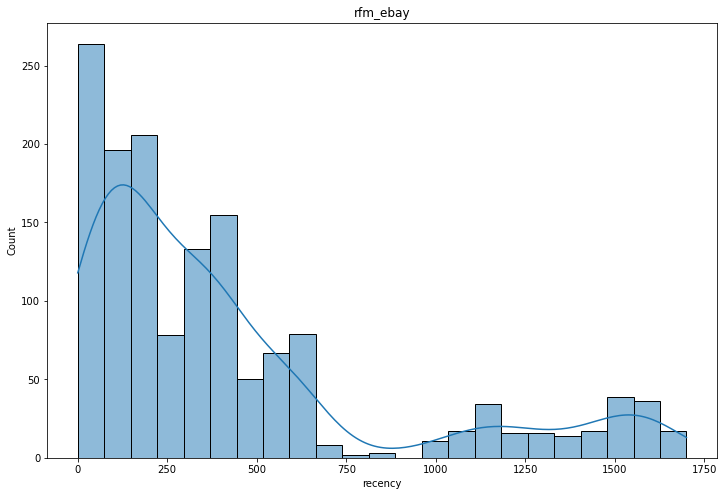

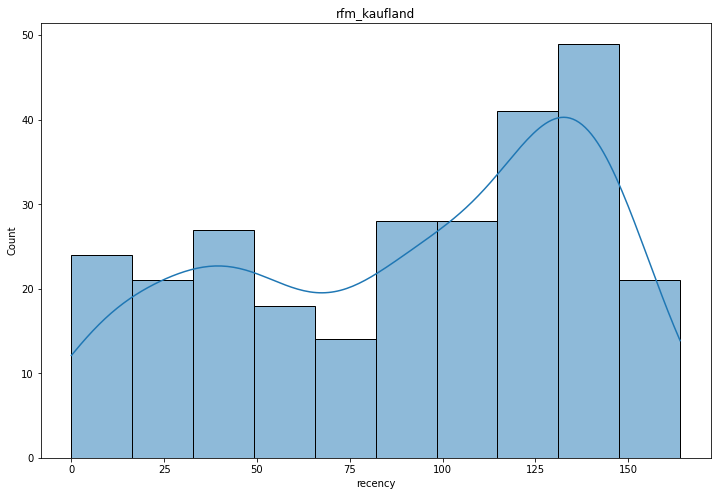

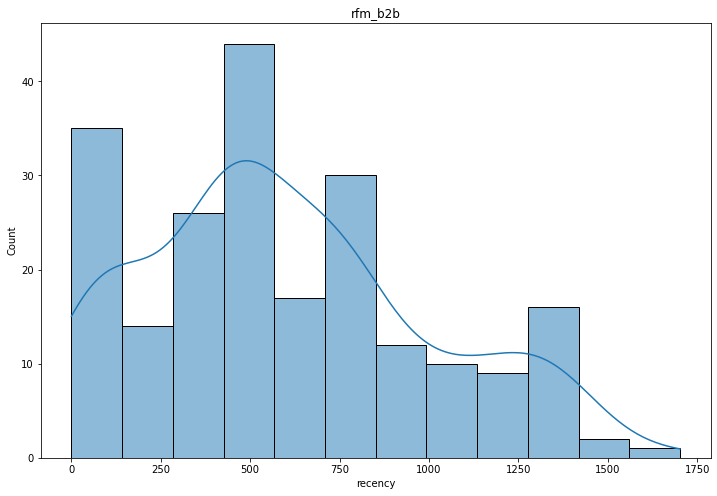

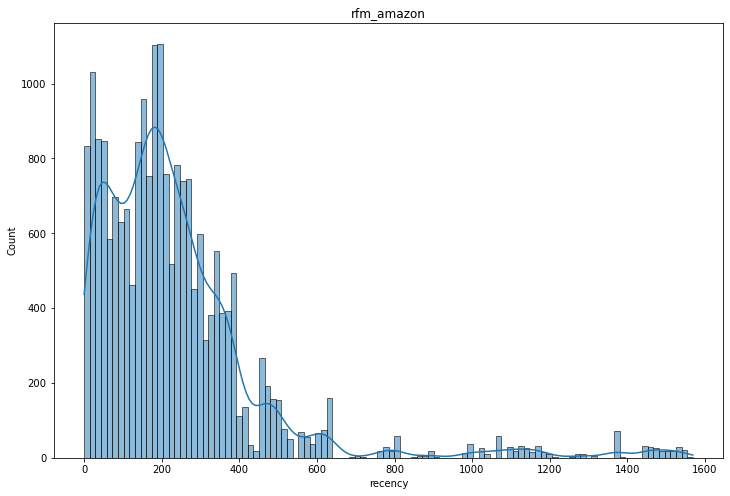

In [78]:
for i in range(len(rfm)):
    #print(rfm_string[i]) 
    plt.figure(figsize=(12,8))
    plt.title(rfm_string[i])
    sns.histplot(rfm[i].recency, kde=True);

###  Frequency: Number of purchases
F — Higher score implies customer has made repeated purchasing at higher frequency. (High demand / Loyalty)

To calculate how many times a customer purchased something, we need to count how many invoices each customer has. To calculate the frequency values, follow these steps in order:

In [79]:
# Frequencyi hesaplamak için her bir müşteri için fatura sayısını hesaplayacağız.

In [80]:
#frequency = tx_3m.groupby('CustomerID').InvoiceDate.count().reset_index()

1. Make a copy of df and drop duplicates

In [81]:
for i in range(len(platforms)):
    #print(rfm_string[i]) 
    platforms[i] = platforms[i].copy()
    platforms[i].drop_duplicates(inplace=True)
    platforms[i].reset_index(drop=True, inplace=True) #index duzenlendi
    

2. Calculate the frequency of purchases

In [82]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    print(platforms[i].groupby('Customer').fatura_tarihi.count().sort_values())

ebay
Customer
ID21035             1
IDKundenID14645     1
IDKundenID14644     1
IDKundenID14643     1
IDKundenID14642     1
                   ..
ID11689             8
ID14256             9
ID27324            11
ID10164            11
ID14261            21
Name: fatura_tarihi, Length: 1458, dtype: int64
kaufland
Customer
IDKundenID10000    1
IDKundenID21851    1
IDKundenID21854    1
IDKundenID21855    1
IDKundenID21856    1
                  ..
IDKundenID17020    1
IDKundenID17021    1
IDKundenID17023    1
IDKundenID16814    1
IDKundenID9999     1
Name: fatura_tarihi, Length: 271, dtype: int64
b2b
Customer
ID11188       1
ID12688       1
ID10615       1
ID20187       1
ID10908       1
           ... 
ID28542      81
ID13508      90
ID10955     143
IDID -2     538
ID10007    4342
Name: fatura_tarihi, Length: 216, dtype: int64
amazon
Customer
ID10004             1
IDKundenID19316     1
IDKundenID19315     1
IDKundenID19314     1
IDKundenID19313     1
                   ..
ID10747         

In [83]:
print(platforms_string)

['ebay', 'kaufland', 'b2b', 'amazon']


In [84]:
for i in range(len(platforms)):
    print(rfm_string[i]) 
    rfm[i]['frequency']=platforms[i].groupby('Customer').fatura_tarihi.count()
    print(rfm[i]['frequency'].head())

rfm_ebay
Customer
ID10001    6
ID10002    2
ID10003    1
ID10016    3
ID10017    1
Name: frequency, dtype: int64
rfm_kaufland
Customer
IDKundenID10000    1
IDKundenID10002    1
IDKundenID10006    1
IDKundenID10014    1
IDKundenID10019    1
Name: frequency, dtype: int64
rfm_b2b
Customer
ID -2         4
ID0          50
ID10006       1
ID10007    4342
ID10245      10
Name: frequency, dtype: int64
rfm_amazon
Customer
ID10004    1
ID10005    1
ID10006    1
ID10008    1
ID10009    1
Name: frequency, dtype: int64


3. Plot frequency distributions

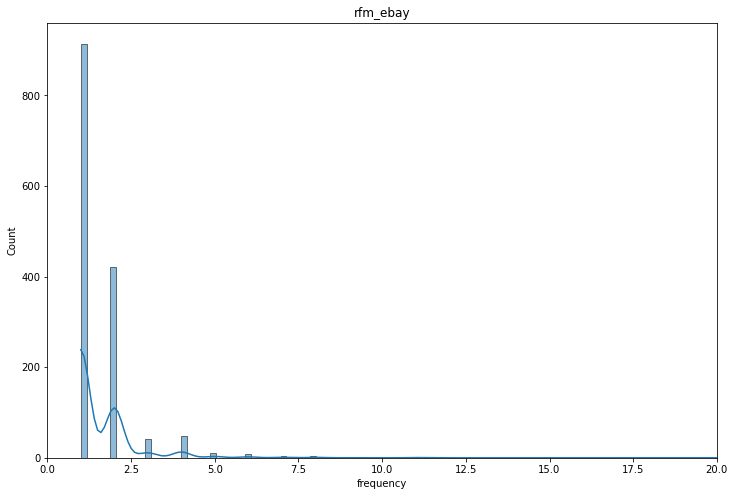

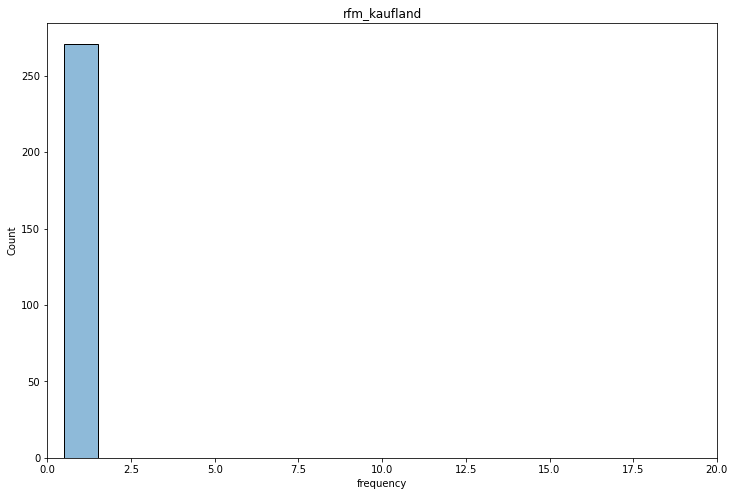

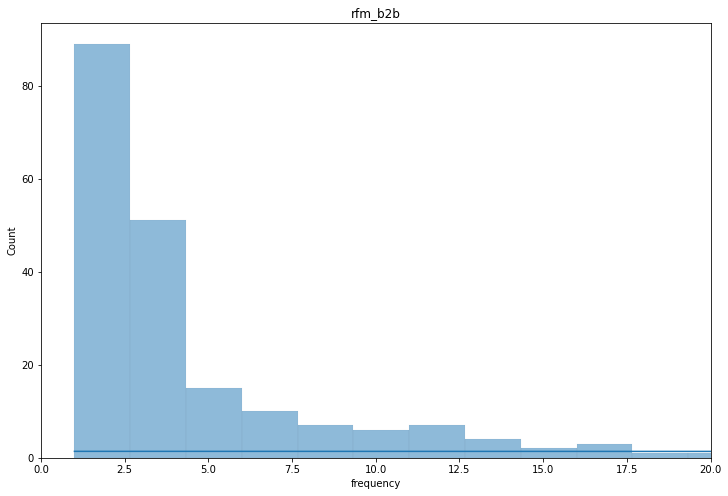

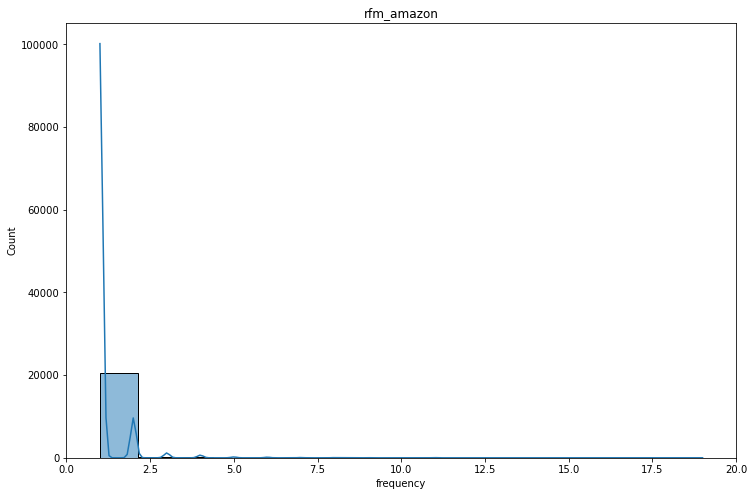

In [85]:
for i in range(len(rfm)):
    #print(rfm_string[i]) 
    plt.figure(figsize=(12,8))
    plt.title(rfm_string[i])
    sns.histplot(rfm[i].frequency, kde=True);
    plt.xlim(0, 20);

###  Monetary: Total amount of money spent
M — Higher score implies purchasing at larger amount. (High value customer)

The monetary value is calculated by adding together the cost of the customers' purchases.


1. Calculate sum total cost by customers and named "Monetary"

In [86]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    print(platforms[i].groupby('Customer').ciro.sum().sort_values())

ebay
Customer
IDKundenID5657       2.560000
IDKundenID19391      2.800000
IDKundenID15796      2.850000
IDKundenID19392      2.930000
IDKundenID19393      3.260000
                      ...    
ID11976            216.537232
ID13631            237.925077
ID10078            278.196262
ID12934            288.739810
ID14261            333.227441
Name: ciro, Length: 1458, dtype: float64
kaufland
Customer
IDKundenID16807      3.72
IDKundenID6753       4.19
IDKundenID6870       4.19
IDKundenID6848       4.19
IDKundenID6469       4.19
                    ...  
IDKundenID21833     61.68
IDKundenID21830     61.68
IDKundenID21832     61.68
IDKundenID12201     84.01
IDKundenID22365    112.14
Name: ciro, Length: 271, dtype: float64
b2b
Customer
ID13116   -4.411765e+00
ID11411   -3.552714e-15
ID10908    3.000000e+00
ID13234    9.340000e+00
ID14880    9.340000e+00
               ...     
ID11495    9.658242e+03
ID10405    1.091200e+04
IDID -2    2.691384e+04
ID18074    3.835025e+04
ID10007    7.38221

In [87]:
for i in range(len(platforms)):
    print(rfm_string[i]) 
    rfm[i]['monetary']=platforms[i].groupby('Customer').ciro.sum()
    print(rfm[i]['monetary'].head())

rfm_ebay
Customer
ID10001    58.917144
ID10002    11.721197
ID10003     8.971963
ID10016    37.855965
ID10017    18.682243
Name: monetary, dtype: float64
rfm_kaufland
Customer
IDKundenID10000    4.66
IDKundenID10002    4.66
IDKundenID10006    4.66
IDKundenID10014    4.66
IDKundenID10019    4.66
Name: monetary, dtype: float64
rfm_b2b
Customer
ID -2         51.200000
ID0         2832.393925
ID10006       23.364400
ID10007    73822.188372
ID10245      606.535607
Name: monetary, dtype: float64
rfm_amazon
Customer
ID10004    14.813084
ID10005    14.813084
ID10006    28.878505
ID10008    23.355140
ID10009    12.990654
Name: monetary, dtype: float64


2. Plot monetary distributions

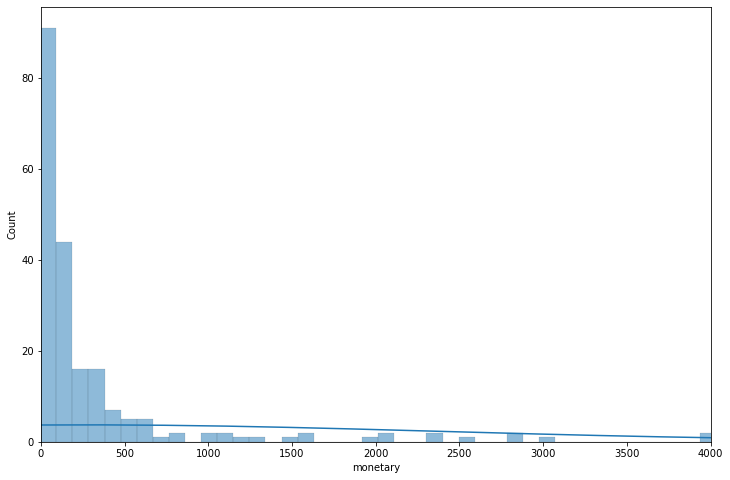

In [88]:
plt.figure(figsize=(12,8))
sns.histplot(x=rfm_b2b.monetary, kde=True)
plt.xlim(0, 4000);

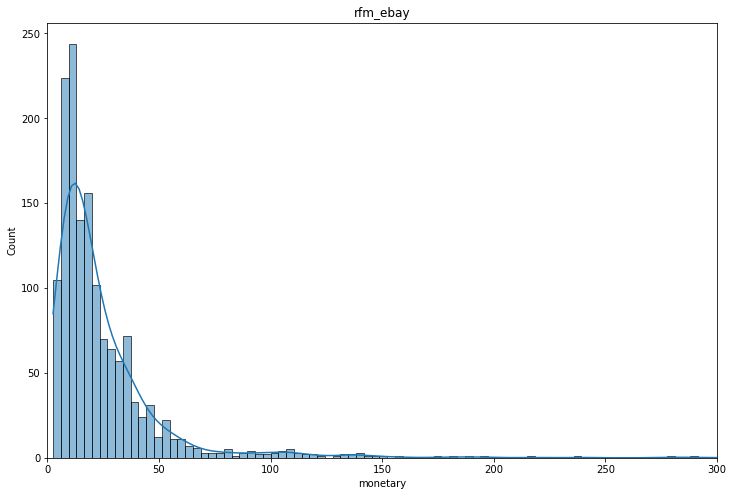

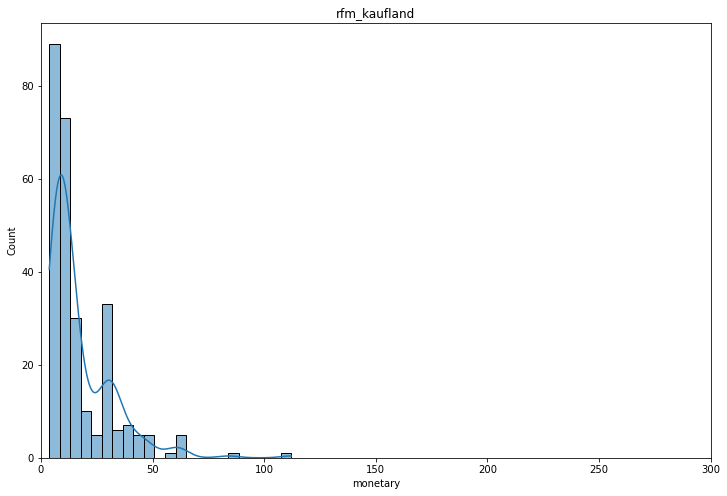

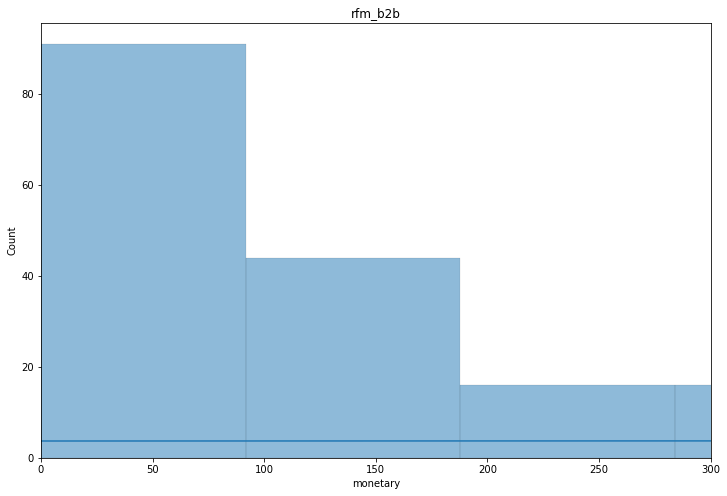

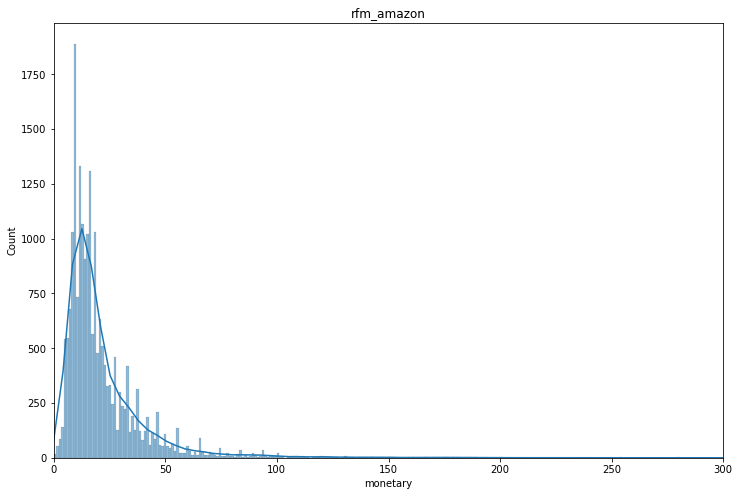

In [89]:
for i in range(len(rfm)):
    #print(rfm_string[i]) 
    plt.figure(figsize=(12,8))
    plt.title(rfm_string[i])
    sns.histplot(rfm[i].monetary, kde=True);
    plt.xlim(0, 300);

###  Create RFM Table
Merge the recency, frequency and motetary dataframes

In [90]:
rfm_b2b.head()

,recency,frequency,monetary
Customer,,,
ID -2,1702,4,51.200000
ID0,37,50,2832.393925
ID10006,1546,1,23.364400
ID10007,18,4342,73822.188372
ID10245,558,10,606.535607


In [91]:
rfm_b2b.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,216.0,599.425926,395.775405,0.000000,353.50,526.500000,784.2500,1702.000000
frequency,216.0,30.180556,297.315008,1.000000,2.00,3.000000,7.0000,4342.000000
monetary,216.0,1181.622050,6033.367585,-4.411765,55.81,111.068824,344.3055,73822.188372


In [92]:
rfm_ebay.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,1458.0,416.847737,441.533330,0.00,102.00,276.000000,526.000000,1700.000000
frequency,1458.0,1.574074,1.151079,1.00,1.00,1.000000,2.000000,21.000000
monetary,1458.0,24.578904,27.468837,2.56,9.99,16.943399,29.887185,333.227441


In [93]:
rfm_kaufland.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,271.0,90.350554,47.622890,0.00,45.00,100.00,132.000,164.00
frequency,271.0,1.000000,0.000000,1.00,1.00,1.00,1.000,1.00
monetary,271.0,16.937712,14.612771,3.72,7.89,10.74,23.825,112.14


In [94]:
rfm_amazon.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,20924.0,237.781973,231.875540,0.0,96.000000,192.00,298.000000,1569.000000
frequency,20924.0,1.153508,0.612092,1.0,1.000000,1.00,1.000000,19.000000
monetary,20924.0,22.357843,24.262848,0.0,10.619048,15.99,26.078889,838.039252


# Customer Segmentation with RFM Scores

Businesses have this ever-lasting urge to understand their customers. The better you understand the customer, the better you serve them, and the higher the financial gain you receive from that customer. Since the dawn of trade, this process of understanding customers for a strategic gain has been there practiced and this task is known majorly as [Customer Segmentation](https://clevertap.com/blog/rfm-analysis/).
Well as the name suggests, Customer Segmentation could segment customers according to their precise needs. Some of the common ways of segmenting customers are based on their Recency-Frequency-Monatory values, their demographics like gender, region, country, etc, and some of their business-crafted scores. We will use Recency-Frequency-Monatory values for this case.

We will create an RFM Segmentation Table where we segment our customers by using the RFM table. For example, we can label the best customer as "Big Spenders" and the lost customer as "Lost Customer".

## Calculate RFM Scoring

The simplest way to create customer segments from an RFM model is by using **Quartiles**. We will assign a score from 1 to 4 to each category (Recency, Frequency, and Monetary) with 4 being the highest/best value. The final RFM score is calculated by combining all RFM values. For Customer Segmentation, we will use the df_rfm data set resulting from the RFM analysis.
<br>
<br>
**Note**: Data can be assigned into more groups for better granularity, but we will use 4 in this case.

1. Divide the df_rfm into quarters

In [95]:
rfm_string

['rfm_ebay', 'rfm_kaufland', 'rfm_b2b', 'rfm_amazon']

In [96]:
quantiles_ebay = rfm_ebay.quantile(q=[0.25,0.50,0.75])
quantiles_kaufland = rfm_kaufland.quantile(q=[0.25,0.50,0.75])
quantiles_b2b = rfm_b2b.quantile(q=[0.25,0.50,0.75])
quantiles_amazon = rfm_amazon.quantile(q=[0.25,0.50,0.75])


quantiles_ebay

,recency,frequency,monetary
0.25,102.0,1.0,9.990000
0.50,276.0,1.0,16.943399
0.75,526.0,2.0,29.887185


In [97]:
quantiles=[quantiles_ebay,quantiles_kaufland, quantiles_b2b, quantiles_amazon]
quantiles_string = ['quantiles_ebay','quantiles_kaufland', 'quantiles_b2b', 'quantiles_amazon']

###  Creating the RFM Segmentation Table


1. Create two functions, one for Recency and one for Frequency and Monetary. For Recency, customers in the first quarter should be scored as 4, this represents the highest Recency value. Conversely, for Frequency and Monetary, customers in the last quarter should be scored as 4, representing the highest Frequency and Monetary values.

In [98]:
# Burada Recency ile Frequency ve Monetaryi ayrı değerlendirdik. 
# Çünkü Recencyde en az değerler en iyiyi gösterirken diğerlerinde yüksek değerler iyiyi gösteriyor.

In [99]:
rfm_ebay.recency.quantile(0.25)

102.0

In [100]:
r_score_ebay = []
r_score_kaufland = []
r_score_b2b = []
r_score_amazon = []

In [101]:
r_scores = [r_score_ebay,r_score_kaufland,r_score_b2b,r_score_amazon]

In [102]:
for i in range(len(r_scores)):
    for j in rfm[i].recency:
        if j < rfm[i].recency.quantile(0.25):
            r_scores[i].append(4)
        elif rfm[i].recency.quantile(0.25) <= j < rfm[i].recency.mean():
            r_scores[i].append(3)
        elif rfm[i].recency.mean() <= j < rfm[i].recency.quantile(0.75):
            r_scores[i].append(2)
        else:
            r_scores[i].append(1)


In [103]:
#r_score_ebay

In [104]:
f_score_ebay = []
f_score_kaufland = []
f_score_b2b = []
f_score_amazon = []

In [105]:
f_scores = [f_score_ebay,f_score_kaufland,f_score_b2b,f_score_amazon]

In [106]:
for i in range(len(f_scores)):
    for j in rfm[i].frequency:
        if j < rfm[i].frequency.quantile(0.25):
            f_scores[i].append(1)
        elif rfm[i].frequency.quantile(0.25) <= j < rfm[i].frequency.mean():
            f_scores[i].append(2)
        elif rfm[i].frequency.mean() <= j < rfm[i].frequency.quantile(0.75):
            f_scores[i].append(3)
        else:
            f_scores[i].append(4)


In [107]:
m_score_ebay = []
m_score_kaufland = []
m_score_b2b = []
m_score_amazon = []

In [108]:
m_scores = [m_score_ebay,m_score_kaufland,m_score_b2b,m_score_amazon]

In [109]:
for i in range(len(m_scores)):
    for j in rfm[i].monetary:
        if j < rfm[i].monetary.quantile(0.25):
            m_scores[i].append(1)
        elif rfm[i].monetary.quantile(0.25) <= j < rfm[i].monetary.mean():
            m_scores[i].append(2)
        elif rfm[i].monetary.mean() <= j < rfm[i].monetary.quantile(0.75):
            m_scores[i].append(3)
        else:
            m_scores[i].append(4)


2. Score customers from 1 to 4 by applying the functions we have created. Also create separate score column for each value. 

In [110]:
for i in range(len(rfm)):
    rfm[i]["r_score"] = r_scores[i]
    rfm[i]["f_score"] = f_scores[i]
    rfm[i]["m_score"] = m_scores[i]
    

In [111]:
rfm_ebay.head()

,recency,frequency,monetary,r_score,f_score,m_score
Customer,,,,,,
ID10001,1370,6,58.917144,1,4,4
ID10002,1605,2,11.721197,1,4,2
ID10003,1548,1,8.971963,1,2,1
ID10016,1515,3,37.855965,1,4,4
ID10017,1515,1,18.682243,1,2,2


3. Now that we scored each customer, we'll combine the scores for segmentation.

In [112]:
for i in range(len(rfm)):
    rfm[i]["rfm_scores"] = rfm[i].r_score + rfm[i].f_score + rfm[i].m_score

In [113]:
rfm_ebay

,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores
Customer,,,,,,,
ID10001,1370,6,58.917144,1,4,4,9
ID10002,1605,2,11.721197,1,4,2,7
ID10003,1548,1,8.971963,1,2,1,4
ID10016,1515,3,37.855965,1,4,4,9
ID10017,1515,1,18.682243,1,2,2,5
...,...,...,...,...,...,...,...
IDKundenID9892,190,1,3.780000,3,2,1,6
IDKundenID9893,97,1,7.480000,4,2,1,7
IDKundenID9956,54,1,3.260000,4,2,1,7


4. Define rfm_level function that tags customers by using RFM_Scrores and Create a new variable RFM_Level

In [114]:
# In this approach, we added each value and divided the obtained values into 4 equal parts and made clusters.
# As another approach, clusters could be made on the data formed by combining them instead of aggregating the data.

In [115]:
#labels = ["Lost Customer", "Almost Lost Customer","Neutral Customer", "Loyal Customer", "Best Customer"]
labels = [1, 2, 3, 4, 5, 6,7,8,9,10]

In [116]:
rfm_ebay.head()

,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores
Customer,,,,,,,
ID10001,1370,6,58.917144,1,4,4,9
ID10002,1605,2,11.721197,1,4,2,7
ID10003,1548,1,8.971963,1,2,1,4
ID10016,1515,3,37.855965,1,4,4,9
ID10017,1515,1,18.682243,1,2,2,5


In [117]:
rfm_ebay.rfm_scores.value_counts()

7     483
9     319
8     227
6     160
10     95
11     83
5      49
4      42
Name: rfm_scores, dtype: int64

In [118]:
for i in range(len(platforms)):
    print(rfm_string[i]) 
    print(rfm[i].rfm_scores.value_counts())
    print()

rfm_ebay
7     483
9     319
8     227
6     160
10     95
11     83
5      49
4      42
Name: rfm_scores, dtype: int64

rfm_kaufland
9     70
8     57
10    48
7     47
11    19
6     17
12    13
Name: rfm_scores, dtype: int64

rfm_b2b
5     55
6     49
7     44
8     33
4     13
12    10
3      4
9      4
10     3
11     1
Name: rfm_scores, dtype: int64

rfm_amazon
7     5822
8     3314
6     3281
9     2781
5     2580
10    1645
4     1207
11     294
Name: rfm_scores, dtype: int64



In [119]:
#pd.qcut(rfm_ebay["rfm_scores"], q=100)

In [120]:
#rfm_ebay["rfm_level"]= pd.qcut(x=rfm_ebay["rfm_scores"], q=[0,0.25,0.50,0.75,1], labels=False,precision=1)

In [121]:
for i in range(len(rfm)):
    rfm[i]["rfm_level"]= 'Lost Customer'
    rfm[i].loc[rfm[i]["rfm_scores"]>5,'rfm_level'] = 'Almost Lost Customer'
    rfm[i].loc[rfm[i]["rfm_scores"]>7,'rfm_level'] = 'Loyal Customer'
    rfm[i].loc[rfm[i]["rfm_scores"]>9,'rfm_level'] = 'Best Customer'

In [122]:
rfm_ebay.rfm_level.value_counts()

Almost Lost Customer    643
Loyal Customer          546
Best Customer           178
Lost Customer            91
Name: rfm_level, dtype: int64

In [123]:
for i in range(len(platforms)):
    print(rfm_string[i]) 
    print(rfm[i].rfm_level.value_counts())
    print()

rfm_ebay
Almost Lost Customer    643
Loyal Customer          546
Best Customer           178
Lost Customer            91
Name: rfm_level, dtype: int64

rfm_kaufland
Loyal Customer          127
Best Customer            80
Almost Lost Customer     64
Name: rfm_level, dtype: int64

rfm_b2b
Almost Lost Customer    93
Lost Customer           72
Loyal Customer          37
Best Customer           14
Name: rfm_level, dtype: int64

rfm_amazon
Almost Lost Customer    9103
Loyal Customer          6095
Lost Customer           3787
Best Customer           1939
Name: rfm_level, dtype: int64



5. Calculate average values for each RFM_Level, and return a size of each segment 

In [124]:
for i in range(len(rfm)):
    print(rfm_string[i]) 
    print(rfm[i].groupby("rfm_level").mean()["rfm_scores"])
    print()

rfm_ebay
rfm_level
Almost Lost Customer     6.751166
Best Customer           10.466292
Lost Customer            4.538462
Loyal Customer           8.584249
Name: rfm_scores, dtype: float64

rfm_kaufland
rfm_level
Almost Lost Customer     6.734375
Best Customer           10.562500
Loyal Customer           8.551181
Name: rfm_scores, dtype: float64

rfm_b2b
rfm_level
Almost Lost Customer     6.473118
Best Customer           11.500000
Lost Customer            4.708333
Loyal Customer           8.108108
Name: rfm_scores, dtype: float64

rfm_amazon
rfm_level
Almost Lost Customer     6.639569
Best Customer           10.151625
Lost Customer            4.681278
Loyal Customer           8.456276
Name: rfm_scores, dtype: float64



In [125]:
for i in range(len(platforms)):
    print(rfm_string[i]) 
    print(rfm[i].groupby("rfm_level").count()["rfm_scores"])
    print()

rfm_ebay
rfm_level
Almost Lost Customer    643
Best Customer           178
Lost Customer            91
Loyal Customer          546
Name: rfm_scores, dtype: int64

rfm_kaufland
rfm_level
Almost Lost Customer     64
Best Customer            80
Loyal Customer          127
Name: rfm_scores, dtype: int64

rfm_b2b
rfm_level
Almost Lost Customer    93
Best Customer           14
Lost Customer           72
Loyal Customer          37
Name: rfm_scores, dtype: int64

rfm_amazon
rfm_level
Almost Lost Customer    9103
Best Customer           1939
Lost Customer           3787
Loyal Customer          6095
Name: rfm_scores, dtype: int64



## Plot RFM Segments

In [126]:
for i in range(len(rfm)):
    print(rfm_string[i]) 
    print(rfm[i].rfm_scores.value_counts())
    print()

rfm_ebay
7     483
9     319
8     227
6     160
10     95
11     83
5      49
4      42
Name: rfm_scores, dtype: int64

rfm_kaufland
9     70
8     57
10    48
7     47
11    19
6     17
12    13
Name: rfm_scores, dtype: int64

rfm_b2b
5     55
6     49
7     44
8     33
4     13
12    10
3      4
9      4
10     3
11     1
Name: rfm_scores, dtype: int64

rfm_amazon
7     5822
8     3314
6     3281
9     2781
5     2580
10    1645
4     1207
11     294
Name: rfm_scores, dtype: int64



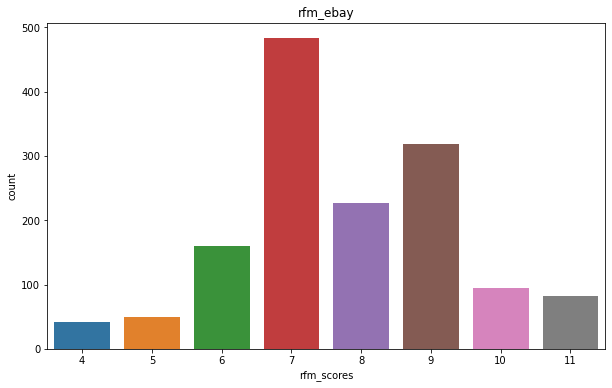

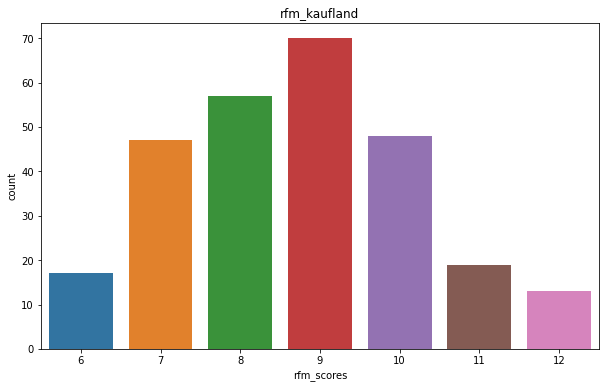

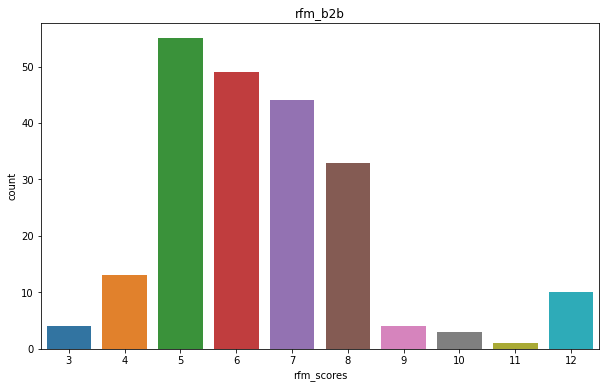

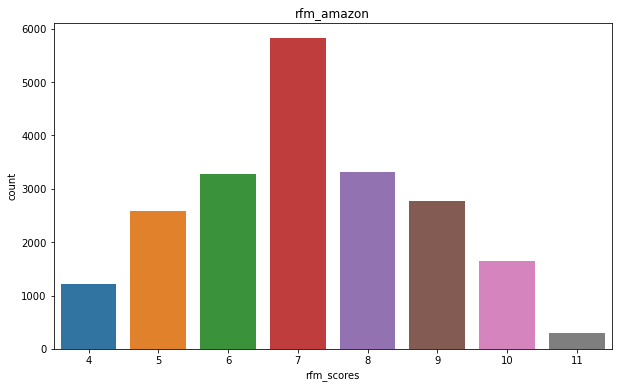

In [127]:
for i in range(len(rfm)):
    plt.figure(figsize=(10,6))
    plt.title(rfm_string[i])
    sns.countplot(x="rfm_scores", data=rfm[i]);

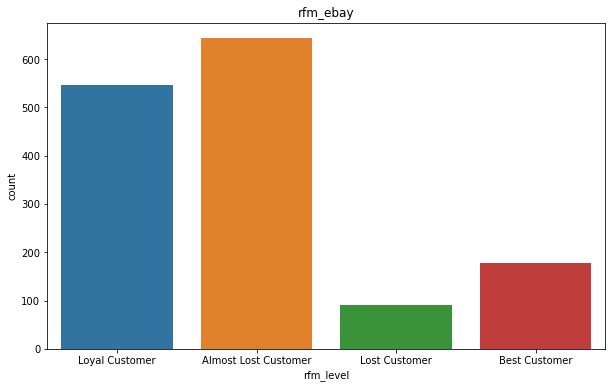

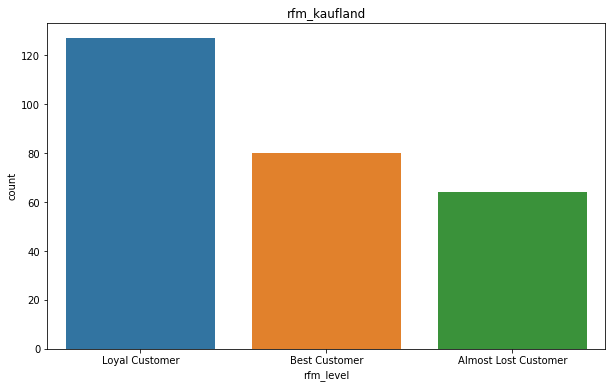

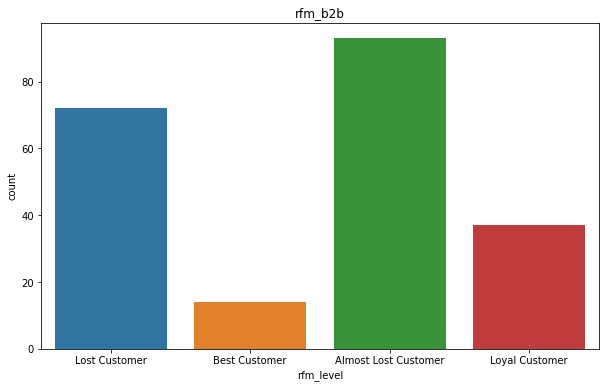

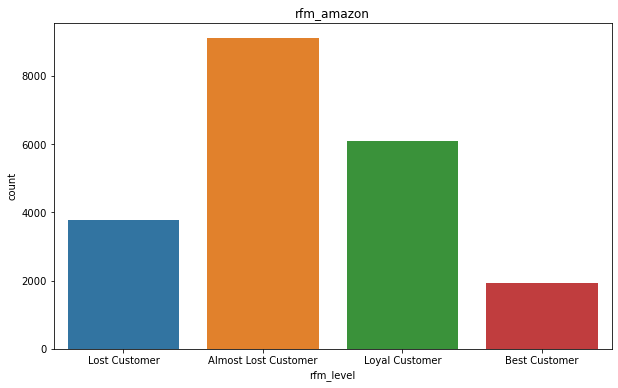

In [128]:
for i in range(len(rfm)):
    plt.figure(figsize=(10,6))
    plt.title(rfm_string[i])
    sns.countplot(x="rfm_level", data=rfm[i]);

# Applying K-Means Clustering

Now that we have our customers segmented into 6 different categories, we can gain further insight into customer behavior by using predictive models in conjuction with our RFM model.
Possible algorithms include **Logistic Regression**, **K-means Clustering**, and **K-nearest Neighbor**. We will go with [K-Means](https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1) since we already have our distinct groups determined. K-means has also been widely used for market segmentation and has the advantage of being simple to implement.

## Data Pre-Processing and Exploring

In [129]:
rfm_string

['rfm_ebay', 'rfm_kaufland', 'rfm_b2b', 'rfm_amazon']

In [130]:
df_ebay =pd.DataFrame()
df_kaufland = pd.DataFrame()
df_b2b = pd.DataFrame()
df_amazon=pd.DataFrame()

In [131]:
rfm_ebay

,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level
Customer,,,,,,,,
ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer
ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer
ID10003,1548,1,8.971963,1,2,1,4,Lost Customer
ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer
ID10017,1515,1,18.682243,1,2,2,5,Lost Customer
...,...,...,...,...,...,...,...,...
IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer
IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer
IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer


In [132]:
df_ebay = rfm_ebay.copy()
df_kaufland = rfm_kaufland.copy()
df_b2b = rfm_b2b.copy()
df_amazon=rfm_amazon.copy()

In [133]:
df_ebay

,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level
Customer,,,,,,,,
ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer
ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer
ID10003,1548,1,8.971963,1,2,1,4,Lost Customer
ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer
ID10017,1515,1,18.682243,1,2,2,5,Lost Customer
...,...,...,...,...,...,...,...,...
IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer
IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer
IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer


In [134]:
df_ebay = df_ebay[["recency", "frequency", "monetary"]]
df_kaufland = df_kaufland[["recency", "frequency", "monetary"]]
df_b2b = df_b2b[["recency", "frequency", "monetary"]]
df_amazon=df_amazon[["recency", "frequency", "monetary"]]

In [135]:
dfs = [df_ebay, df_kaufland, df_b2b, df_amazon]
dfs_string = ['df_ebay', 'df_kaufland', 'df_b2b', 'df_amazon']

In [136]:
df_ebay

,recency,frequency,monetary
Customer,,,
ID10001,1370,6,58.917144
ID10002,1605,2,11.721197
ID10003,1548,1,8.971963
ID10016,1515,3,37.855965
ID10017,1515,1,18.682243
...,...,...,...
IDKundenID9892,190,1,3.780000
IDKundenID9893,97,1,7.480000
IDKundenID9956,54,1,3.260000


In [137]:
dfs[0]

,recency,frequency,monetary
Customer,,,
ID10001,1370,6,58.917144
ID10002,1605,2,11.721197
ID10003,1548,1,8.971963
ID10016,1515,3,37.855965
ID10017,1515,1,18.682243
...,...,...,...
IDKundenID9892,190,1,3.780000
IDKundenID9893,97,1,7.480000
IDKundenID9956,54,1,3.260000


###  Define and Plot Feature Correlations

Create Heatmap and evaluate the results 

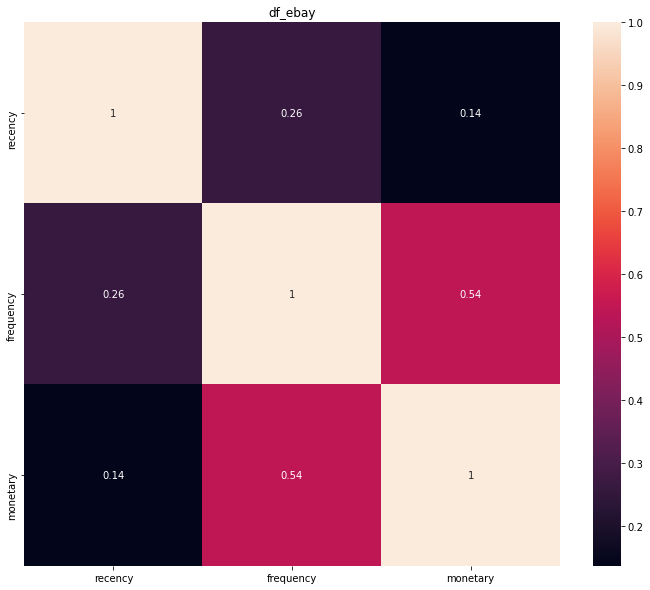

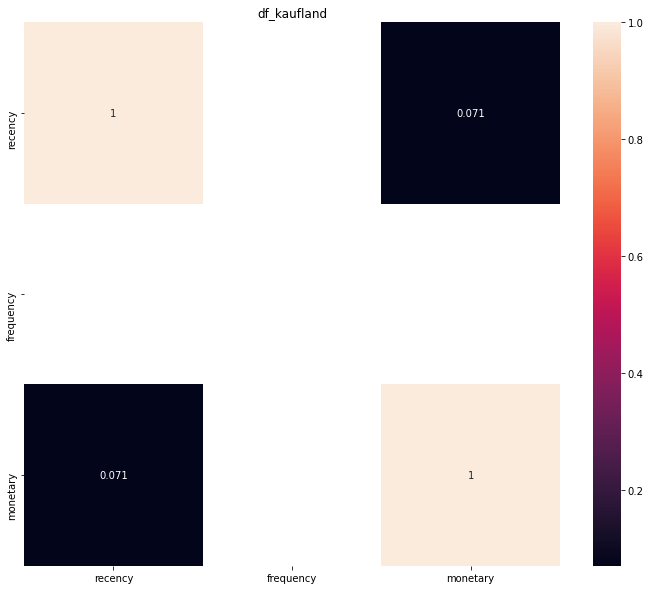

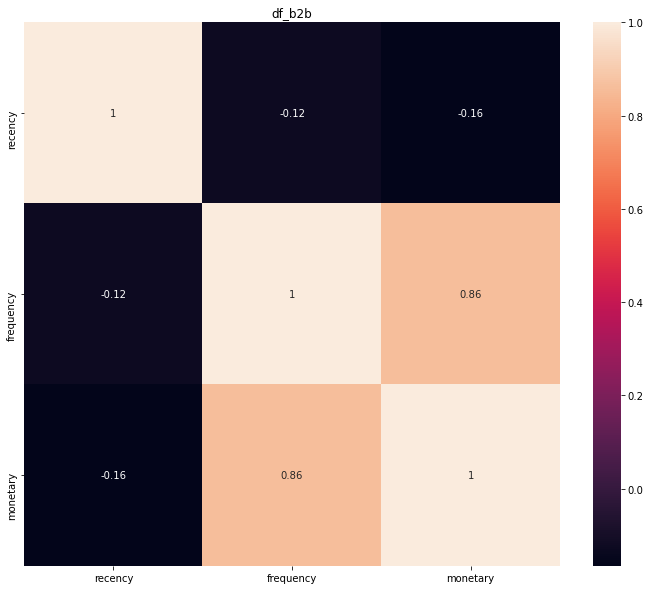

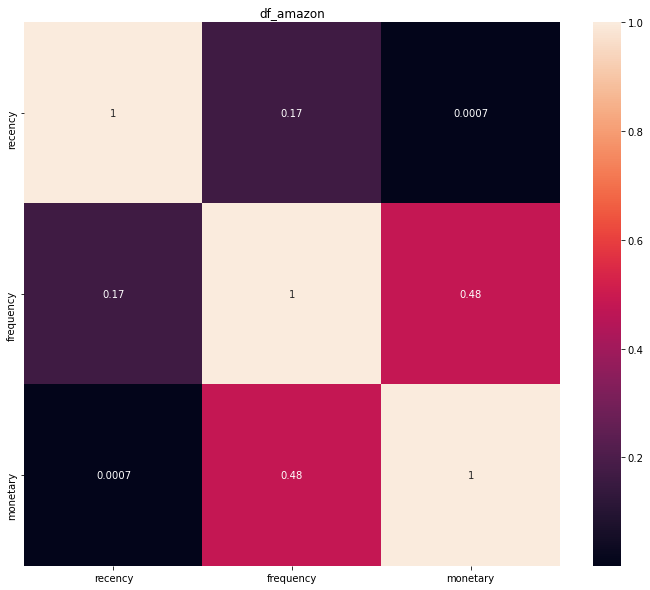

In [138]:
for i in range(len(dfs)):
    plt.figure(figsize=(12,10))
    plt.title(dfs_string[i])
    sns.heatmap(dfs[i].corr(), annot=True);
    print()

###  Visualize Feature Distributions

To get a better understanding of the dataset, we can costruct a scatter matrix of each of the three features in the RFM data.

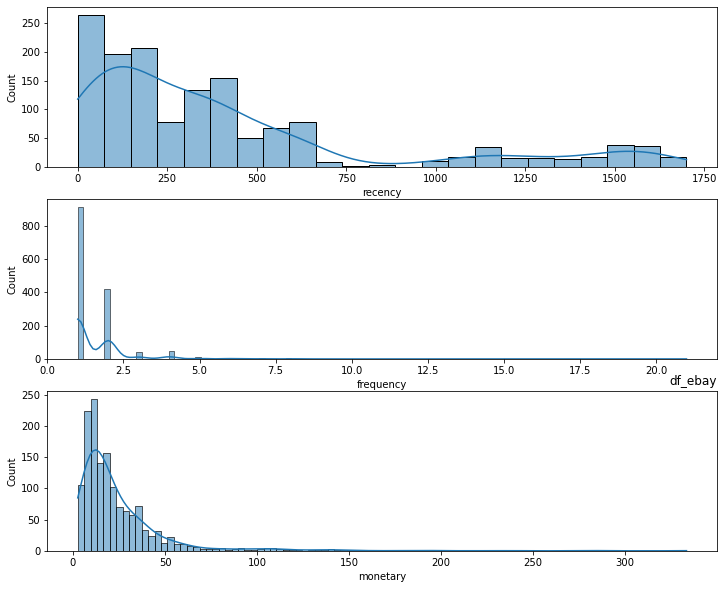

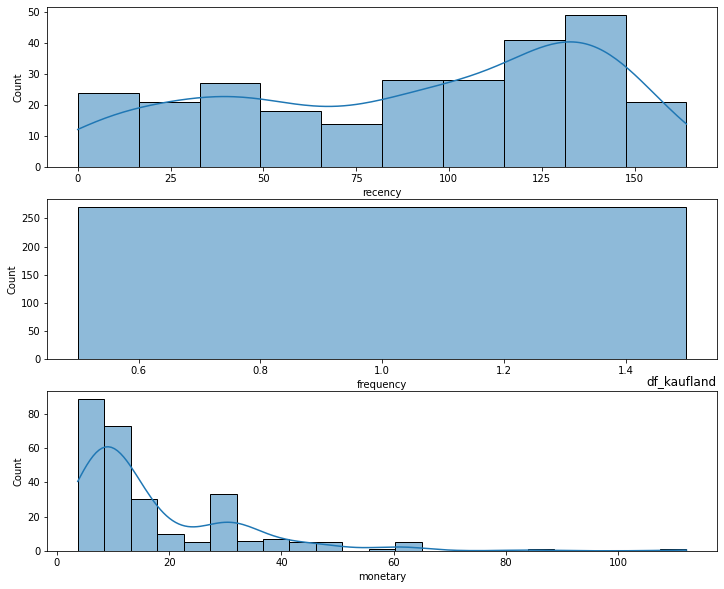

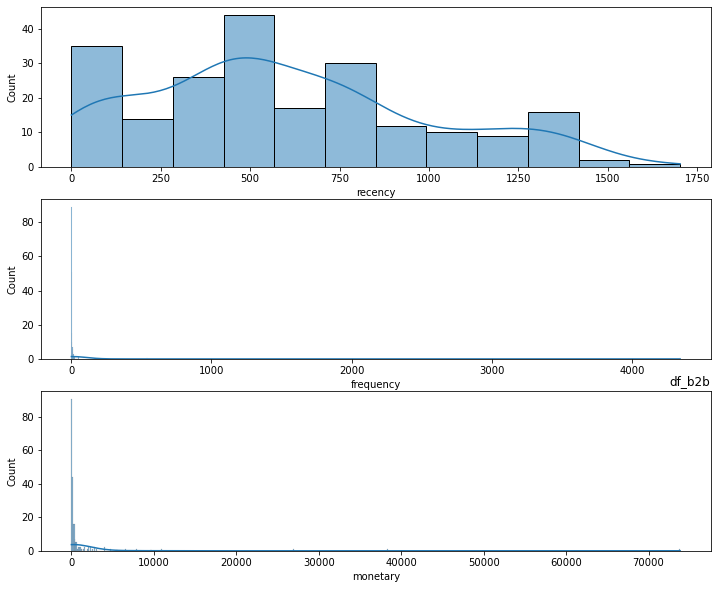

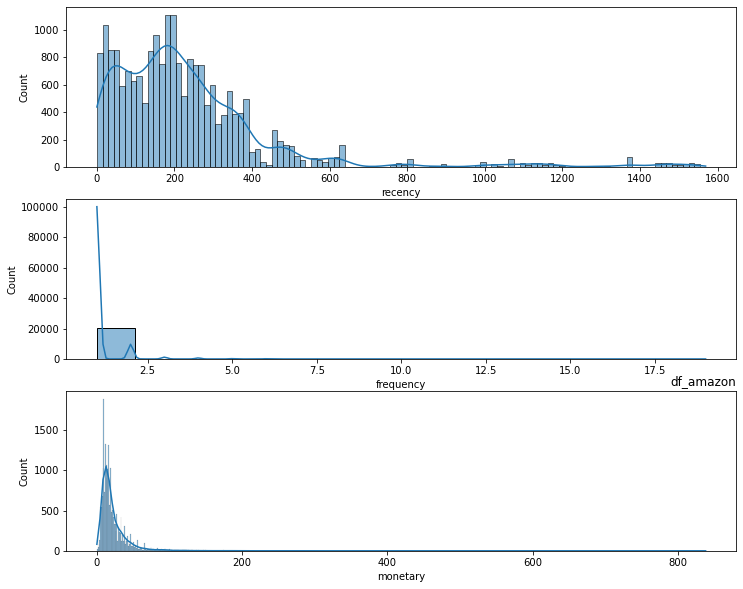

In [139]:
for i in range(len(dfs)):
    fig, ax = plt.subplots(nrows=3, figsize=(12,10))
    #plt.figure(figsize=(10,6))
    sns.histplot(x="recency", data=dfs[i], kde=True, ax=ax[0])
    plt.title(dfs_string[i],loc ='right')
    sns.histplot(x="frequency", data=dfs[i], kde=True, ax=ax[1])
    sns.histplot(x="monetary", data=dfs[i], kde=True, ax=ax[2]);

In [140]:
from mpl_toolkits.mplot3d import Axes3D


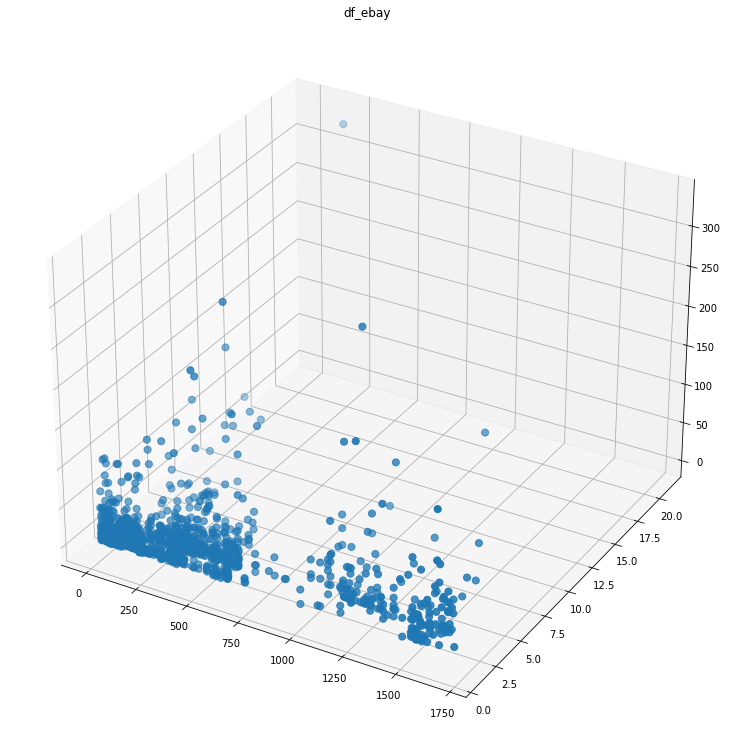

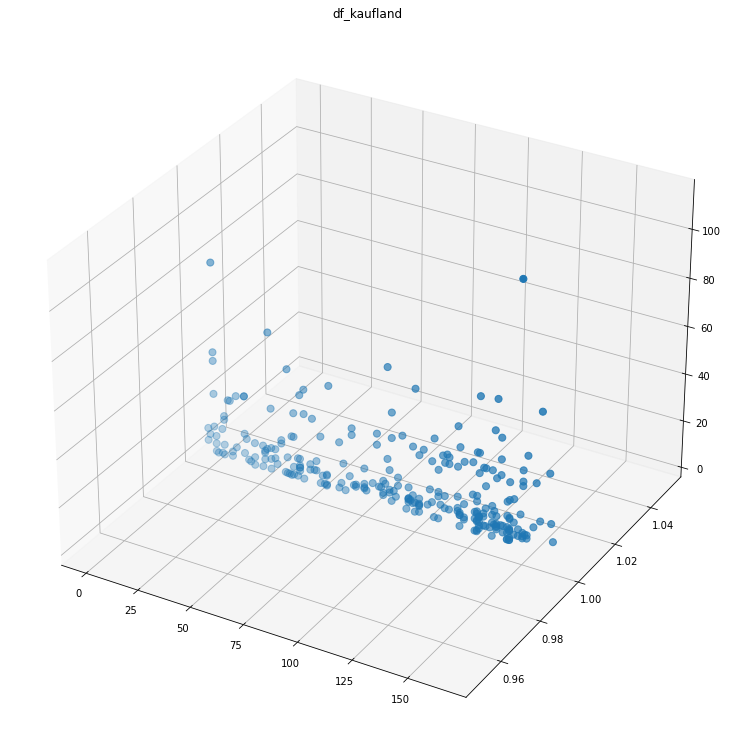

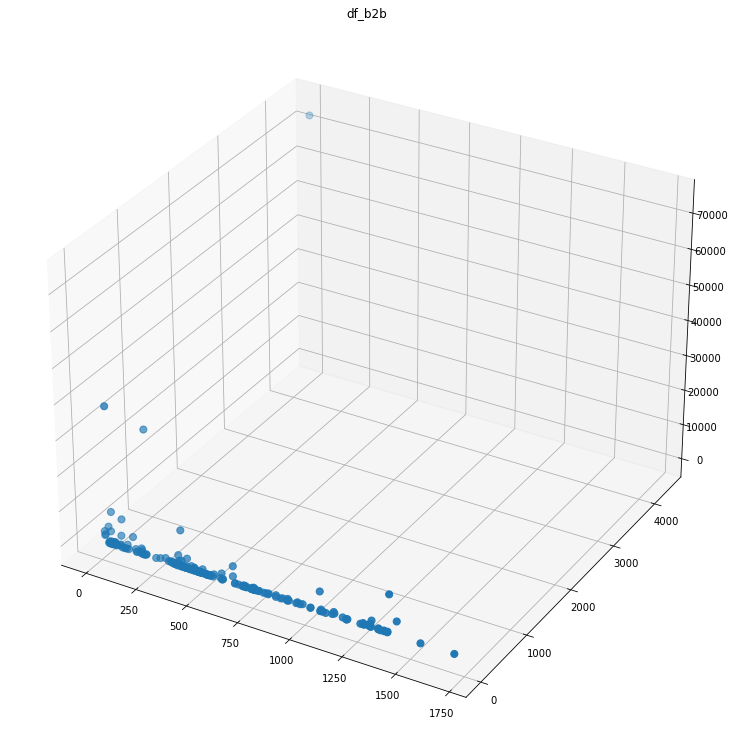

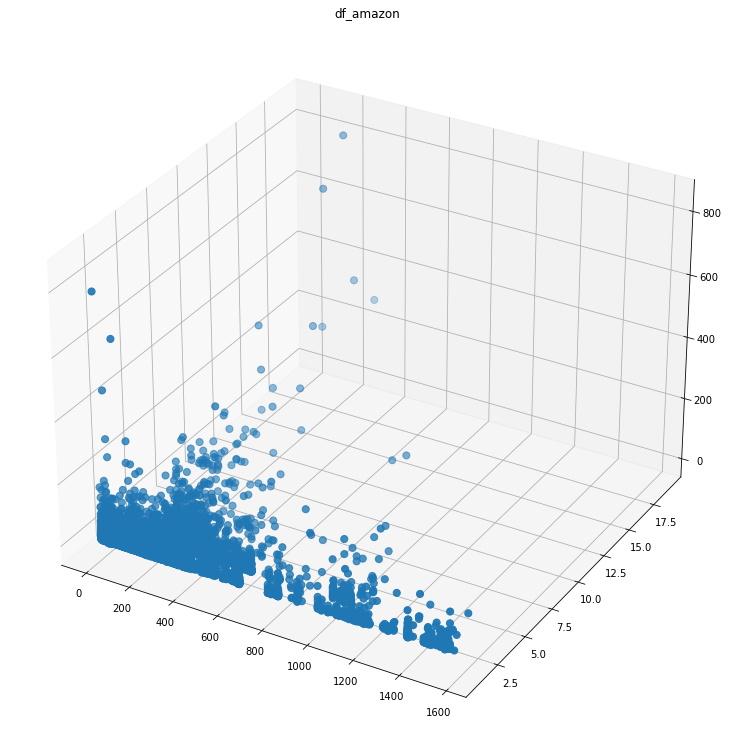

In [141]:
for i in range(len(dfs)):
    plt.rcParams["figure.figsize"] =(12,10)
    fig = plt.figure()
    ax = Axes3D(fig)
    plt.title(dfs_string[i])
    ax.scatter(dfs[i]["recency"], dfs[i]["frequency"], dfs[i]["monetary"], s=50);

###  Data Normalization

We use the logarithm method to normalize the values in a column.

In [142]:
dflog_ebay =pd.DataFrame()
dflog_kaufland = pd.DataFrame()
dflog_b2b = pd.DataFrame()
dflog_amazon=pd.DataFrame()

In [143]:
df_ebay

,recency,frequency,monetary
Customer,,,
ID10001,1370,6,58.917144
ID10002,1605,2,11.721197
ID10003,1548,1,8.971963
ID10016,1515,3,37.855965
ID10017,1515,1,18.682243
...,...,...,...
IDKundenID9892,190,1,3.780000
IDKundenID9893,97,1,7.480000
IDKundenID9956,54,1,3.260000


In [144]:
dflog_ebay = np.log(df_ebay+1)
dflog_b2b = np.log(df_b2b+1)
dflog_kaufland = np.log(df_kaufland+1)
dflog_amazon = np.log(df_amazon+1)

In [145]:
dflog_ebay

,recency,frequency,monetary
Customer,,,
ID10001,7.223296,1.945910,4.092963
ID10002,7.381502,1.098612,2.543270
ID10003,7.345365,0.693147,2.299777
ID10016,7.323831,1.386294,3.659862
ID10017,7.323831,0.693147,2.979717
...,...,...,...
IDKundenID9892,5.252273,0.693147,1.564441
IDKundenID9893,4.584967,0.693147,2.137710
IDKundenID9956,4.007333,0.693147,1.449269


In [146]:
df_logs = [dflog_ebay, dflog_kaufland, dflog_b2b, dflog_amazon]
dflogs_string = ['dflog_ebay', 'dflog_kaufland', 'dflog_b2b', 'dflog_amazon']


In [147]:
df_logs[0]

,recency,frequency,monetary
Customer,,,
ID10001,7.223296,1.945910,4.092963
ID10002,7.381502,1.098612,2.543270
ID10003,7.345365,0.693147,2.299777
ID10016,7.323831,1.386294,3.659862
ID10017,7.323831,0.693147,2.979717
...,...,...,...
IDKundenID9892,5.252273,0.693147,1.564441
IDKundenID9893,4.584967,0.693147,2.137710
IDKundenID9956,4.007333,0.693147,1.449269


In [ ]:
# Recover unique InvoiceNo's.
InvoiceNo = platforms[i]['Customer'].unique(

# Create basket of items for each transaction.
Transactions = [list(gifts[gifts['InvoiceNo'] == u].Description.astype(str)) for u in InvoiceNo]

In [148]:
# Logaritmasını alarak normalize etmiş olduk.
# Sadece pozitif değerler için bu metod kullanılabilir.

In [149]:
for i in range(len(df_logs)):
    print(dflogs_string[i]) 
    print(df_logs[i].shape)
    print(df_logs[i].info())
    print()

dflog_ebay
(1458, 3)
<class 'pandas.core.frame.DataFrame'>
Index: 1458 entries, ID10001 to IDKundenID9958
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   recency    1458 non-null   float64
 1   frequency  1458 non-null   float64
 2   monetary   1458 non-null   float64
dtypes: float64(3)
memory usage: 77.9+ KB
None

dflog_kaufland
(271, 3)
<class 'pandas.core.frame.DataFrame'>
Index: 271 entries, IDKundenID10000 to IDKundenID9999
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   recency    271 non-null    float64
 1   frequency  271 non-null    float64
 2   monetary   271 non-null    float64
dtypes: float64(3)
memory usage: 16.6+ KB
None

dflog_b2b
(216, 3)
<class 'pandas.core.frame.DataFrame'>
Index: 216 entries, ID -2 to IDID -2
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   recency

In [150]:
# Null values occurred after normalization

In [151]:
dflog_b2b.dropna(inplace=True)

In [152]:
dflog_b2b.reset_index(drop=True, inplace=True)

In [153]:
dflog_b2b.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 215 entries, 0 to 214
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   recency    215 non-null    float64
 1   frequency  215 non-null    float64
 2   monetary   215 non-null    float64
dtypes: float64(3)
memory usage: 5.2 KB


Plot normalized data with scatter matrix or pairplot. Also evaluate results.

<Figure size 864x720 with 0 Axes>

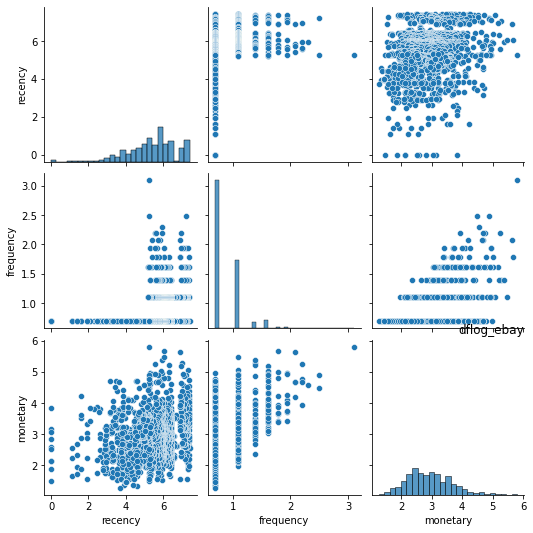

<Figure size 864x720 with 0 Axes>

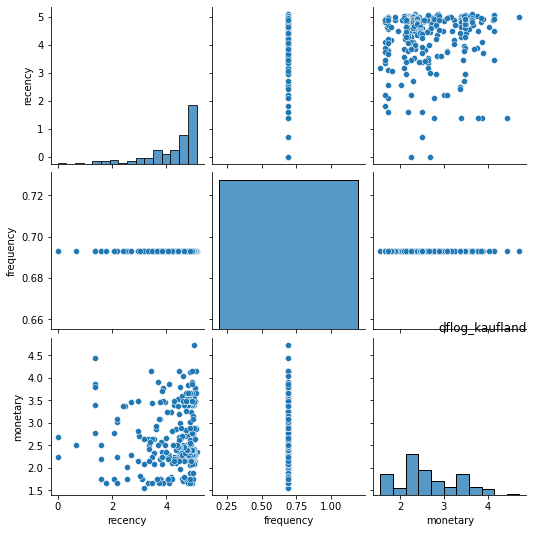

<Figure size 864x720 with 0 Axes>

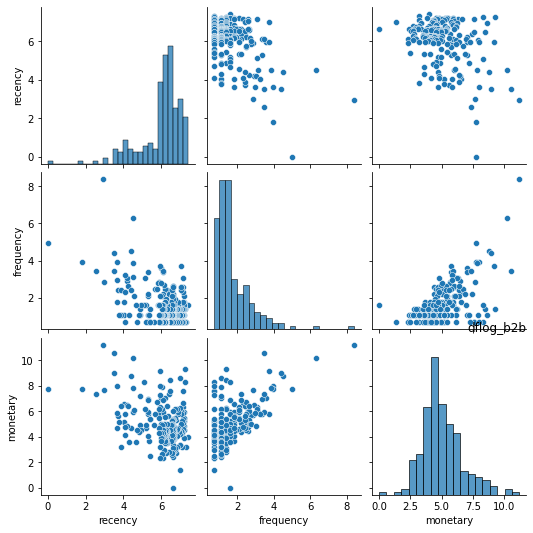

<Figure size 864x720 with 0 Axes>

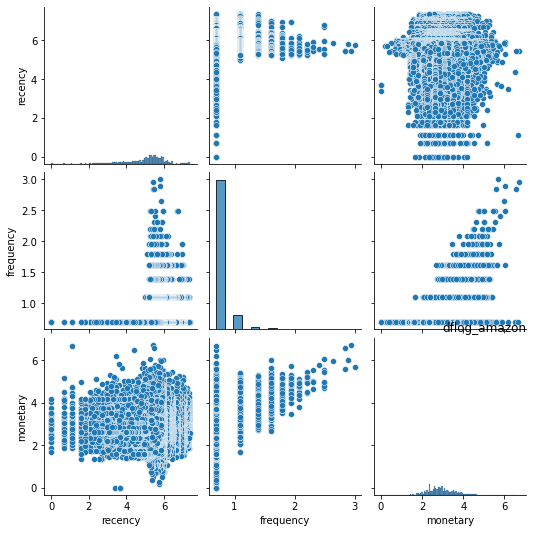

In [154]:
for i in range(len(df_logs)):
    plt.figure(figsize=(12,10))
    sns.pairplot(df_logs[i])
    plt.title(dflogs_string[i],loc = 'right');

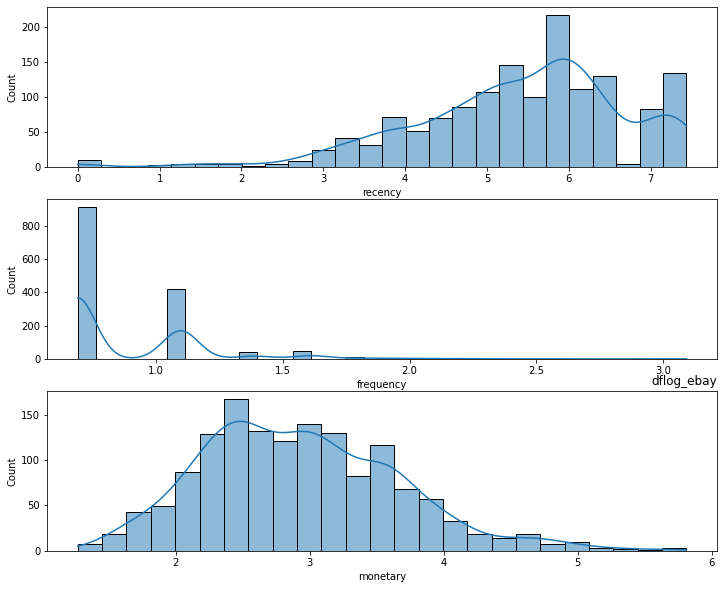

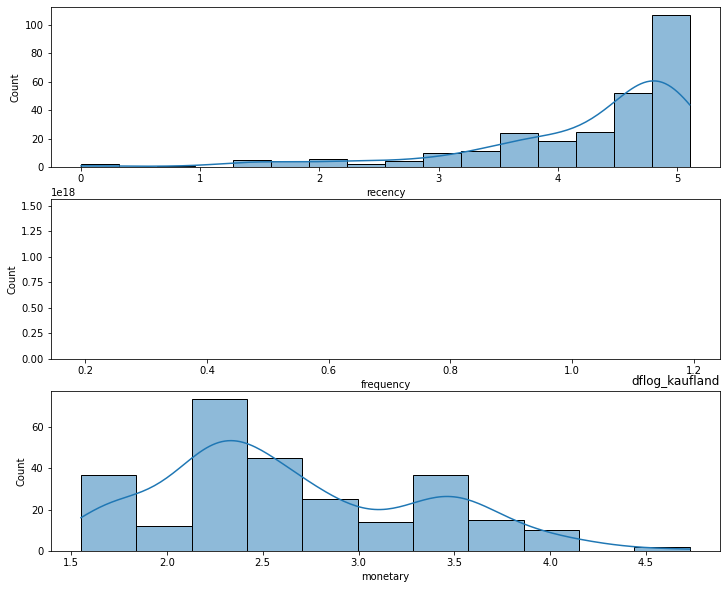

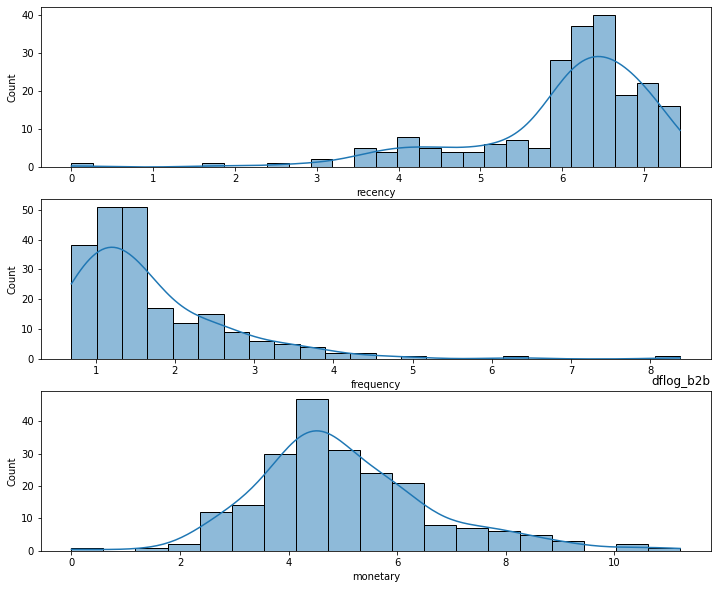

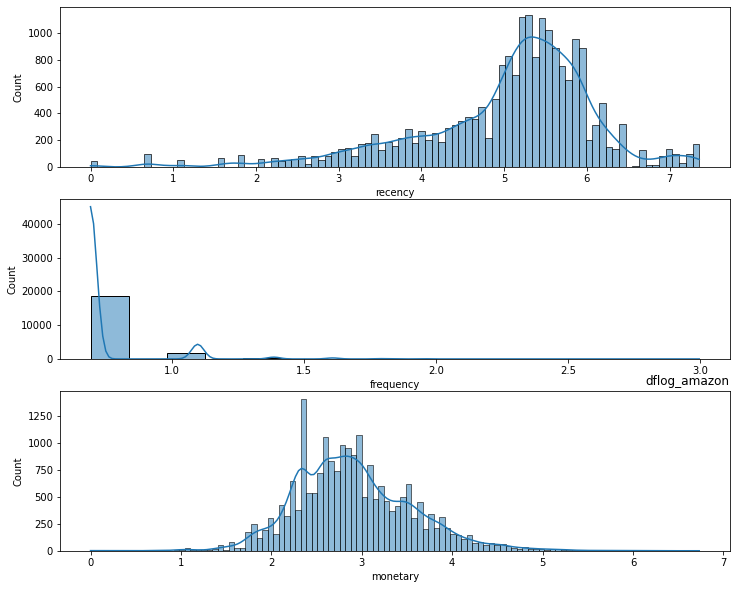

In [155]:
for i in range(len(df_logs)):
    fig, ax = plt.subplots(nrows=3, figsize=(12,10))
    #plt.figure(figsize=(10,6))
    sns.histplot(x="recency", data=df_logs[i], kde=True, ax=ax[0])
    plt.title(dflogs_string[i],loc ='right')
    sns.histplot(x="frequency", data=df_logs[i], kde=True, ax=ax[1])
    sns.histplot(x="monetary", data=df_logs[i], kde=True, ax=ax[2]);

In [156]:
from mpl_toolkits.mplot3d import Axes3D


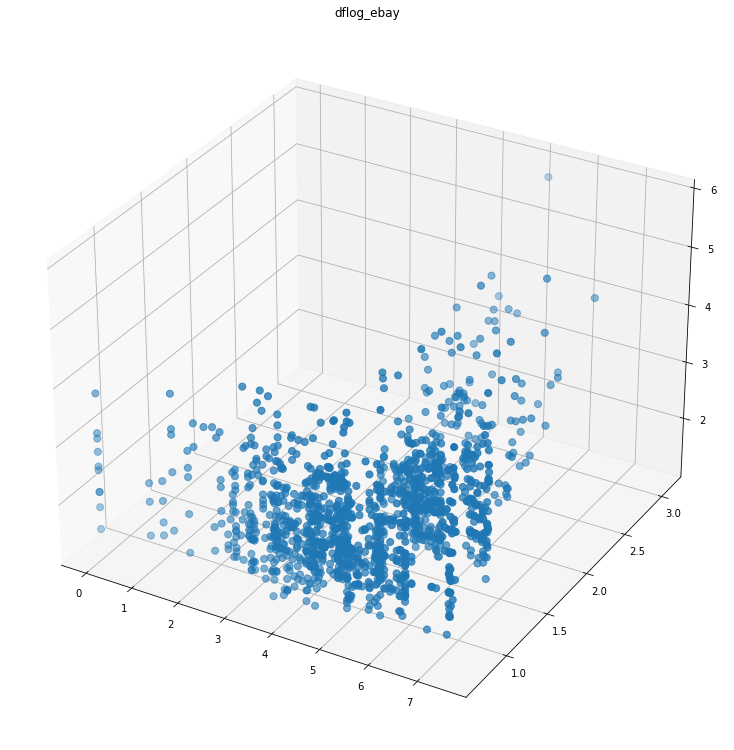

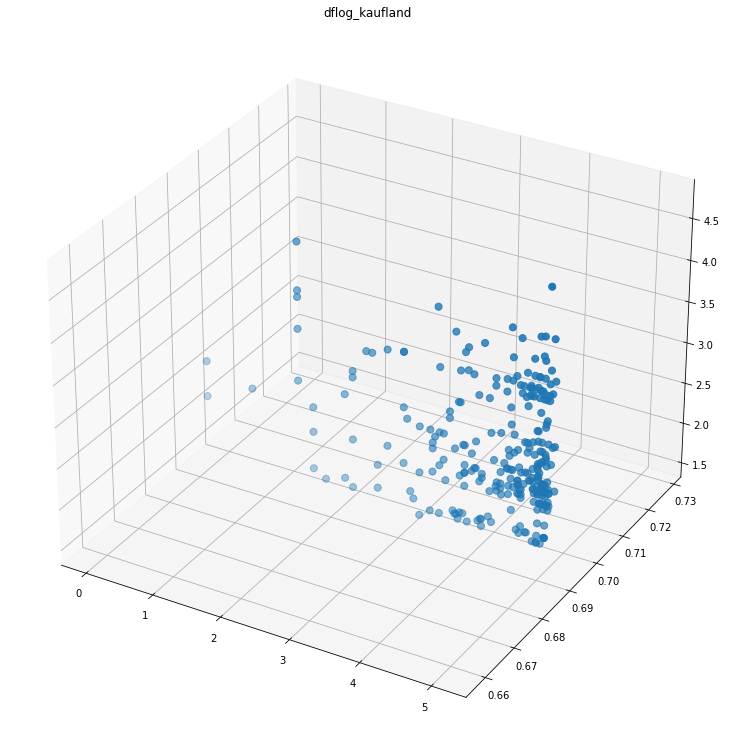

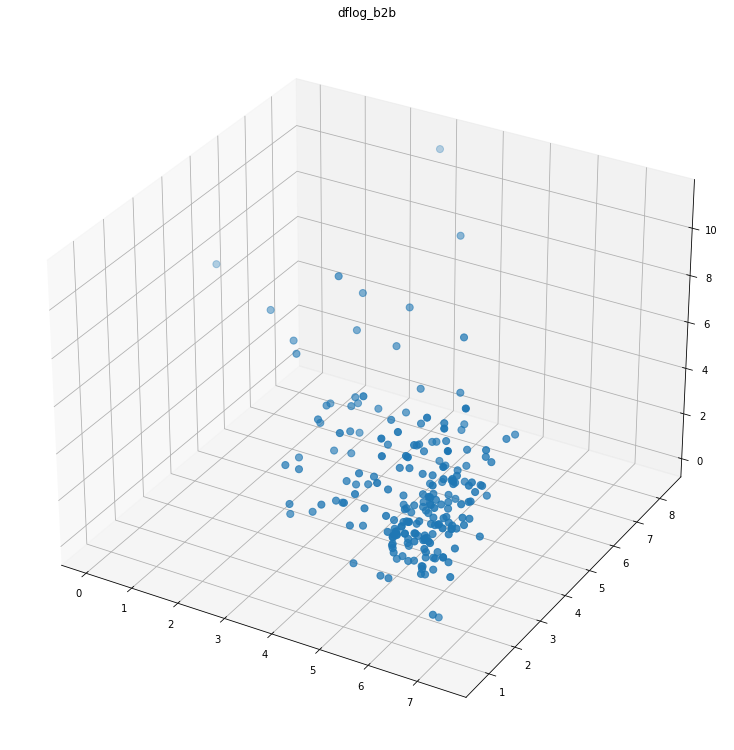

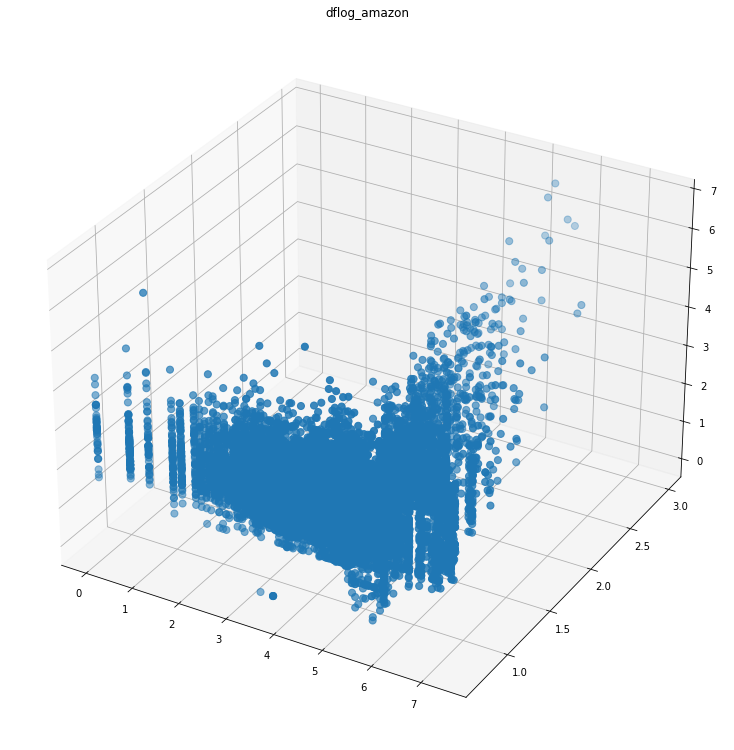

In [157]:
for i in range(len(df_logs)):
    plt.rcParams["figure.figsize"] =(12,10)
    fig = plt.figure()
    ax = Axes3D(fig)
    plt.title(dflogs_string[i])
    ax.scatter(df_logs[i]["recency"], df_logs[i]["frequency"], df_logs[i]["monetary"], s=50);

## K-Means Implementation

For k-means, we have to set k to the number of clusters we want, but figuring out how many clusters is not obvious from the beginning. We will try different cluster numbers and check their [silhouette coefficient](http://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html). The silhouette coefficient for a data point measures how similar it is to its assigned cluster from -1 (dissimilar) to 1 (similar). 
<br>
<br>
**Note**: K-means is sensitive to initializations because they are critical to qualifty of optima found. Thus, we will use smart initialization called "Elbow Method".

###  Define the Optimal Number of Clusters

[The Elbow Method](https://en.wikipedia.org/wiki/Elbow_method_(clustering) 

In [158]:
dflogs_string

['dflog_ebay', 'dflog_kaufland', 'dflog_b2b', 'dflog_amazon']

In [159]:
ebay_cluster = dflog_ebay.copy()
kaufland_cluster = dflog_kaufland.copy()
b2b_cluster = dflog_b2b.copy()
amazon_cluster = dflog_amazon.copy()
ebay_cluster.head()

,recency,frequency,monetary
Customer,,,
ID10001,7.223296,1.945910,4.092963
ID10002,7.381502,1.098612,2.543270
ID10003,7.345365,0.693147,2.299777
ID10016,7.323831,1.386294,3.659862
ID10017,7.323831,0.693147,2.979717


In [160]:
#amazon_cluster = dflog_amazon.copy()

In [161]:
clusters = [ebay_cluster,kaufland_cluster,b2b_cluster,amazon_cluster]
clusters_string = ['ebay_cluster','kaufland_cluster','b2b_cluster','amazon_cluster']

In [162]:
clusters[3]

,recency,frequency,monetary
Customer,,,
ID10004,7.346010,0.693147,2.760838
ID10005,7.345365,0.693147,2.760838
ID10006,7.346010,0.693147,3.397139
ID10008,7.347300,0.693147,3.192743
ID10009,7.326466,0.693147,2.638390
...,...,...,...
IDKundenID9992,4.477337,0.693147,2.336020
IDKundenID9993,4.465908,0.693147,2.336020
IDKundenID9994,4.454347,0.693147,2.336020


In [163]:
#!pip install pyclustertend

In [164]:
#!pip install numpy upgrade

In [165]:
#!pip install numpy==1.21.4

In [166]:
#!pip3 install pip install numba==0.53.0

In [167]:
#!pip3 install librosa

In [168]:
from pyclustertend import hopkins

In [169]:
for i in range(len(clusters)):
    print(clusters_string[i]) 
    print(hopkins(clusters[i], clusters[i].shape[0]))
    print()

ebay_cluster
0.05955345415620099

kaufland_cluster
0.2286305998129018

b2b_cluster
0.12671235941431772

amazon_cluster
0.011895632316917556



In [170]:
# If the result close to zero in the Hopkins test, it indicates that there is a good clustering.

In [171]:
# Hopkins Test clustering tendencyi gösteriyor.
# Bu değer ne kadar 0 a yakınsa kümelemeye o ölçüde yatkın olduğunu gösterir.
# Genelde 0.25 den aşağısı için kümelerin varlığını kabul edebiliriz.

In [172]:
ebay_cluster

,recency,frequency,monetary
Customer,,,
ID10001,7.223296,1.945910,4.092963
ID10002,7.381502,1.098612,2.543270
ID10003,7.345365,0.693147,2.299777
ID10016,7.323831,1.386294,3.659862
ID10017,7.323831,0.693147,2.979717
...,...,...,...
IDKundenID9892,5.252273,0.693147,1.564441
IDKundenID9893,4.584967,0.693147,2.137710
IDKundenID9956,4.007333,0.693147,1.449269


In [173]:
clusters_string

['ebay_cluster', 'kaufland_cluster', 'b2b_cluster', 'amazon_cluster']

In [174]:
X_ebay = ebay_cluster[["recency","frequency", "monetary"]]
X_kaufland = kaufland_cluster[["recency","frequency", "monetary"]]
X_b2b = b2b_cluster[["recency","frequency", "monetary"]]
X_amazon = amazon_cluster[["recency","frequency", "monetary"]]
X_ebay.head()

,recency,frequency,monetary
Customer,,,
ID10001,7.223296,1.945910,4.092963
ID10002,7.381502,1.098612,2.543270
ID10003,7.345365,0.693147,2.299777
ID10016,7.323831,1.386294,3.659862
ID10017,7.323831,0.693147,2.979717


In [175]:
Xs = [X_ebay,X_kaufland,X_b2b,X_amazon]
Xs_string = ['X_ebay','X_kaufland','X_b2b','X_amazon']

In [176]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [177]:
for i in range(len(Xs)):
    #print(Xs_string[i]) 
    Xs[i] = scaler.fit_transform(Xs[i])
    print()

In [178]:
X_ebay

,recency,frequency,monetary
Customer,,,
ID10001,7.223296,1.945910,4.092963
ID10002,7.381502,1.098612,2.543270
ID10003,7.345365,0.693147,2.299777
ID10016,7.323831,1.386294,3.659862
ID10017,7.323831,0.693147,2.979717
...,...,...,...
IDKundenID9892,5.252273,0.693147,1.564441
IDKundenID9893,4.584967,0.693147,2.137710
IDKundenID9956,4.007333,0.693147,1.449269


In [179]:
for i in range(len(Xs)):
    print(Xs_string[i]) 
    print(hopkins(Xs[i], Xs[i].shape[0]))
    print()

X_ebay
0.037535642393162226

X_kaufland
0.220749330164823

X_b2b
0.1288607048089253

X_amazon
0.005616477009851526



In [180]:
# Daha önce logunu alarak scale etmiştik. 
# Şimdi de Standart Scaler ile yaptık.
# Her 2 scaleden sonra Hopkins testini tekrarladık ve karşılaştırdık.

In [181]:
from sklearn.cluster import KMeans

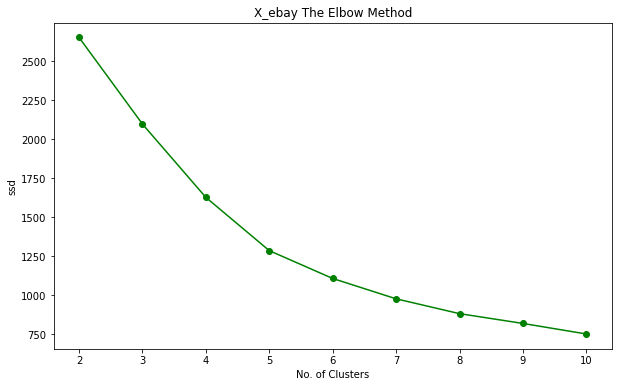

0           NaN
1   -554.825681
2   -469.429493
3   -341.004300
4   -178.287286
5   -130.252170
6    -95.003873
7    -62.740487
8    -67.432236
dtype: float64
            0
1         NaN
2  554.825681
3  469.429493
4  341.004300
5  178.287286
6  130.252170
7   95.003873
8   62.740487
9   67.432236


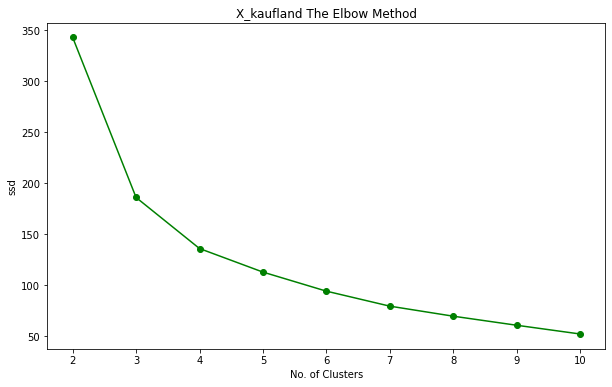

0           NaN
1   -156.969909
2    -50.059542
3    -23.103912
4    -18.691705
5    -14.709131
6     -9.847845
7     -8.886923
8     -8.567890
dtype: float64
            0
1         NaN
2  156.969909
3   50.059542
4   23.103912
5   18.691705
6   14.709131
7    9.847845
8    8.886923
9    8.567890


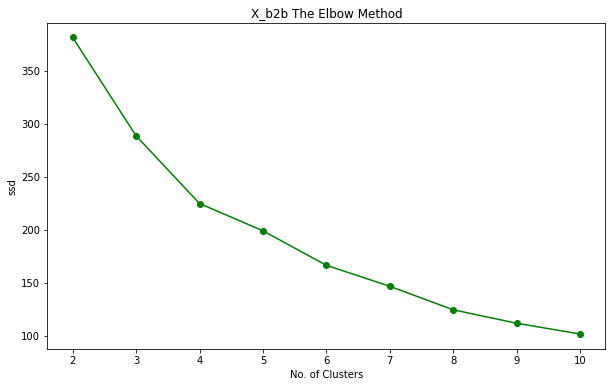

0          NaN
1   -92.774124
2   -63.790738
3   -25.721620
4   -32.522035
5   -19.792322
6   -22.170413
7   -12.692434
8   -10.125298
dtype: float64
           0
1        NaN
2  92.774124
3  63.790738
4  25.721620
5  32.522035
6  19.792322
7  22.170413
8  12.692434
9  10.125298


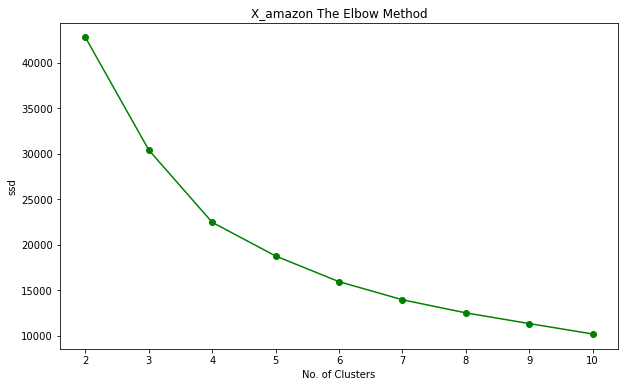

0             NaN
1   -12378.867297
2    -7940.776041
3    -3699.192167
4    -2821.591133
5    -1989.263628
6    -1438.683454
7    -1176.257363
8    -1141.862917
dtype: float64
              0
1           NaN
2  12378.867297
3   7940.776041
4   3699.192167
5   2821.591133
6   1989.263628
7   1438.683454
8   1176.257363
9   1141.862917


In [182]:
for i in range(len(Xs)):
    ssd =[] # WCSS değerini ifade ediyor. WCSS: Kümeler içi kareler toplamı
    for n in range(2,11):
        kmeans=KMeans(n_clusters=n,random_state=0) # Burada başka parametreler de ekleyebiliriz: init = 'k-means++' (rastgele başlangıç tuzağı), max_iter = 300, n_init = 10(küme merkezi için kaç farklı nokta?)
        kmeans.fit(Xs[i])
        ssd.append(kmeans.inertia_) # Inertia: bir kümedeki noktaların ne kadar uzak olduğunu gösterir. Bu nedenle, küçük bir Inertia hedeflenir. Inertia değeri sıfırdan başlar ve artar. 
    plt.figure(figsize=(10,6))
    plt.plot(range(2, 11), ssd, "go-")  # bo: mavi nokta - go: yeşil nokta
    plt.title(Xs_string[i] + ' The Elbow Method')
    plt.xlabel('No. of Clusters')
    plt.ylabel('ssd')
    plt.show()
    print(pd.Series(ssd).diff() )
    df_diff =pd.DataFrame(-pd.Series(ssd).diff()).rename(index = lambda x : x+1)
    print(df_diff)
# The inertia shows how densely the cluster is clustered within itself. The inertia value is expected to be small.

In [183]:
# Burada her bir WCSS değeri arasındaki farkı hesaplıyoruz. 
#Düşüşün keskinliğini yitirdiğini gördüğümüz rakam bize cluster sayısını verecektir. 

In [184]:
from yellowbrick.cluster import KElbowVisualizer

In [185]:
#!pip install yellowbrick

X_ebay The Elbow Method


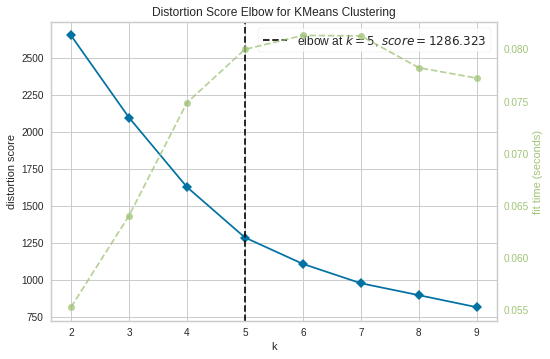

X_kaufland The Elbow Method


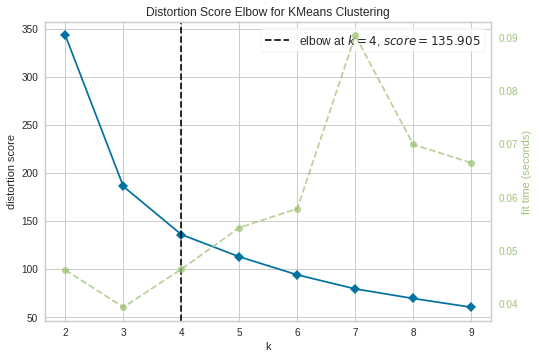

X_b2b The Elbow Method


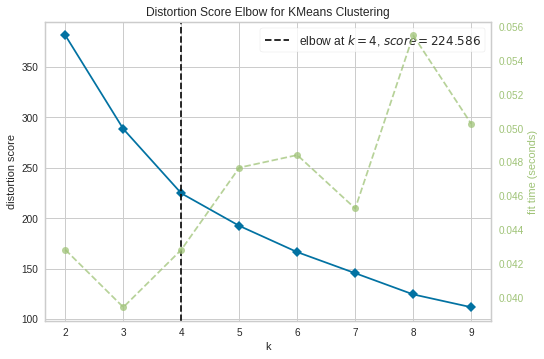

X_amazon The Elbow Method


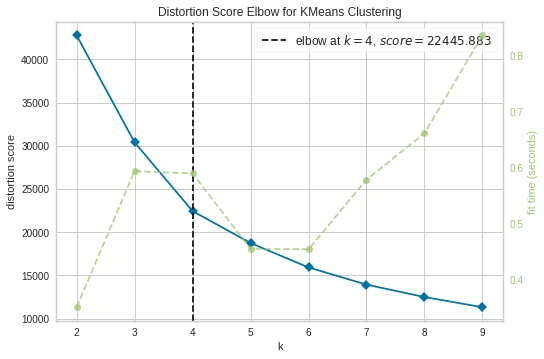

In [186]:
for i in range(len(Xs)):
    print(Xs_string[i] + ' The Elbow Method')
    kmeans = KMeans()
    visu = KElbowVisualizer(kmeans, k = (2,10))
    visu.fit(Xs[i])
    visu.poof(); # poof: Yellowbrick kütüphanesinin temel çizdirme metodu

[Silhouette Coefficient](http://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html)

In [187]:
from sklearn.metrics import silhouette_score  # Silhoutte scoreun 1 e yakın olması gerekiyor.

In [188]:
range_n_clusters = range(2,11)

In [189]:
for i in range(len(Xs)):
    for num_clusters in range_n_clusters:
        # intialise kmeans
        kmeans = KMeans(n_clusters=num_clusters, random_state=42)
        kmeans.fit(Xs[i])
        cluster_labels = kmeans.labels_
        # silhouette score
        silhouette_avg = silhouette_score(Xs[i], cluster_labels)
        print(Xs_string[i])
        print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")
    
# silhouette_score gives a score according to the proximity of the data within the cluster and the distance between the clusters. 
# While determining the number of clusters, the ones closest to 1 of these scores should be evaluated.

X_ebay
For n_clusters=2, the silhouette score is 0.3869040410806001
X_ebay
For n_clusters=3, the silhouette score is 0.35171073141920284
X_ebay
For n_clusters=4, the silhouette score is 0.3614066835080794
X_ebay
For n_clusters=5, the silhouette score is 0.36753351320123856
X_ebay
For n_clusters=6, the silhouette score is 0.3564662377910797
X_ebay
For n_clusters=7, the silhouette score is 0.3563309679048212
X_ebay
For n_clusters=8, the silhouette score is 0.3561514910957443
X_ebay
For n_clusters=9, the silhouette score is 0.3401729290090576
X_ebay
For n_clusters=10, the silhouette score is 0.351555133451014
X_kaufland
For n_clusters=2, the silhouette score is 0.4285146147701336
X_kaufland
For n_clusters=3, the silhouette score is 0.488119423427399
X_kaufland
For n_clusters=4, the silhouette score is 0.472521956502359
X_kaufland
For n_clusters=5, the silhouette score is 0.4644390957793517
X_kaufland
For n_clusters=6, the silhouette score is 0.3937840848532372
X_kaufland
For n_clusters=7,

In [190]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer



In [191]:
ks = [5,4,4,4]

X_ebay


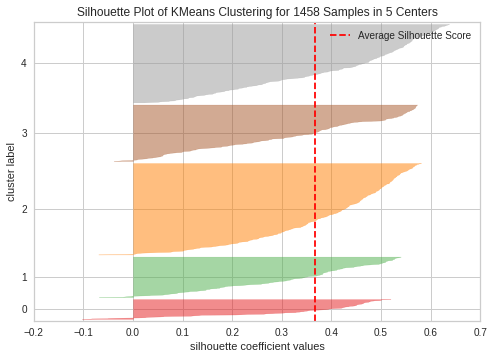

X_kaufland


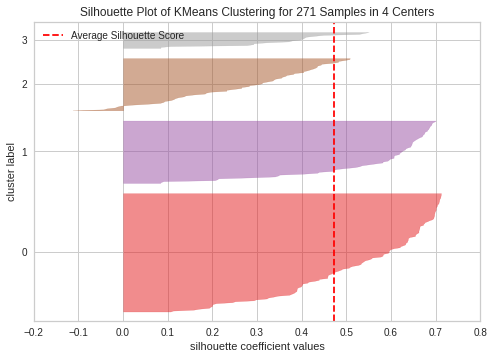

X_b2b


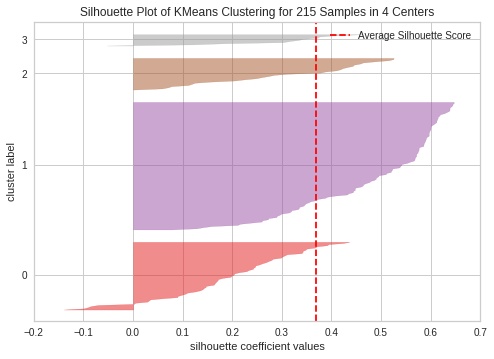

X_amazon


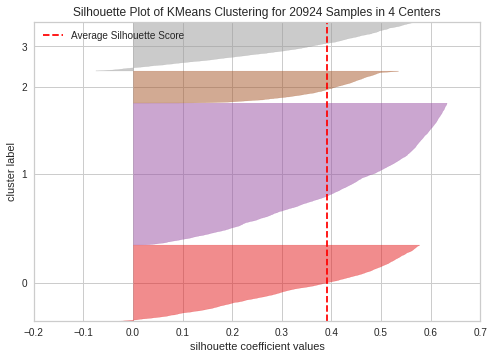

In [192]:
for i in range(len(Xs)):
    print(Xs_string[i])
    model = KMeans(n_clusters=ks[i], random_state=42)
    visualizer = SilhouetteVisualizer(model)

    visualizer.fit(Xs[i])
    visualizer.poof();
    

In [193]:
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram

In [194]:
#for i in range(len(Xs)):
#    #print(Xs_string[i])
#    hc_ward = linkage(y = Xs[i], method = "ward")
#    plt.figure(figsize = (50,30))
#    plt.subplot(221)
#    plt.title(Xs_string[i]+"Ward")
#    plt.xlabel("Observations")
#    plt.ylabel("Distance")
#    dendrogram(hc_ward, leaf_font_size = 10);

###  Model Fitting

Fit the K-Means Algorithm with the optimal number of clusters we decided and save the model to disk.

In [195]:
for i in range(len(Xs)):
    kmeans = KMeans(n_clusters = ks[i])
    kmeans.fit_predict(Xs[i])
    cluster = kmeans.labels_
    clusters[i]["cluster"] = cluster
    print(clusters_string[i])
    print(clusters[i].head())
    Xs[i] = pd.DataFrame(Xs[i]) # Since we scale x1, we transform DataFrame to visualize it.
    print(Xs[i].head())
    print()

ebay_cluster
           recency  frequency  monetary  cluster
Customer                                        
ID10001   7.223296   1.945910  4.092963        3
ID10002   7.381502   1.098612  2.543270        2
ID10003   7.345365   0.693147  2.299777        1
ID10016   7.323831   1.386294  3.659862        2
ID10017   7.323831   0.693147  2.979717        2
          0         1         2
0  1.396627  3.513712  1.578833
1  1.518150  0.695355 -0.527518
2  1.490392 -0.653339 -0.858474
3  1.473851  1.652268  0.990159
4  1.473851 -0.653339  0.065703

kaufland_cluster
                  recency  frequency  monetary  cluster
Customer                                               
IDKundenID10000  3.806662   0.693147  1.733424        2
IDKundenID10002  1.609438   0.693147  1.733424        3
IDKundenID10006  3.091042   0.693147  1.733424        2
IDKundenID10014  2.564949   0.693147  1.733424        2
IDKundenID10019  2.079442   0.693147  1.733424        2
          0    1        2
0 -0.448249  0.0

In [196]:
amazon_cluster

,recency,frequency,monetary,cluster
Customer,,,,
ID10004,7.346010,0.693147,2.760838,3
ID10005,7.345365,0.693147,2.760838,3
ID10006,7.346010,0.693147,3.397139,2
ID10008,7.347300,0.693147,3.192743,3
ID10009,7.326466,0.693147,2.638390,3
...,...,...,...,...
IDKundenID9992,4.477337,0.693147,2.336020,3
IDKundenID9993,4.465908,0.693147,2.336020,3
IDKundenID9994,4.454347,0.693147,2.336020,3


###  Visualize the Clusters

 Create a scatter plot and select cluster centers

In [197]:
Xs_string

['X_ebay', 'X_kaufland', 'X_b2b', 'X_amazon']

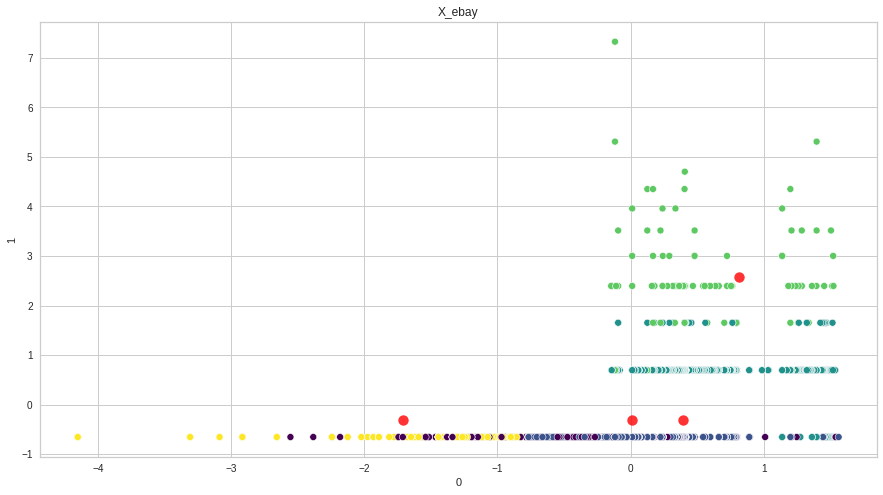

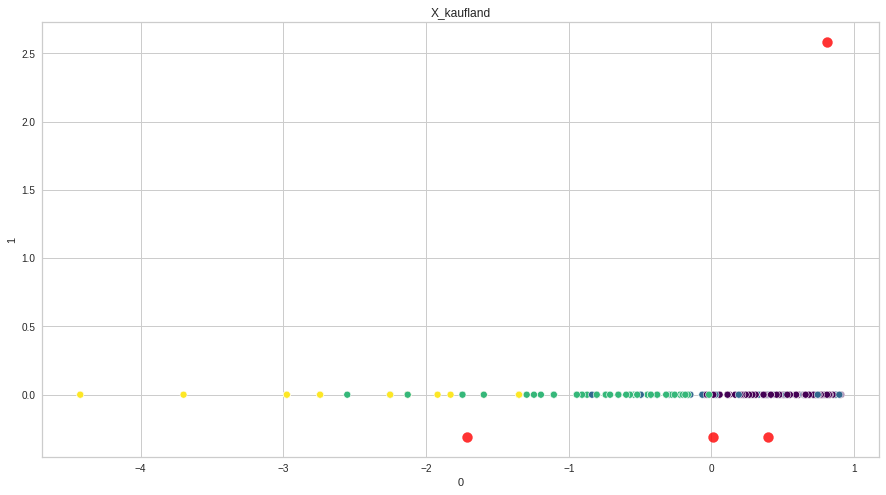

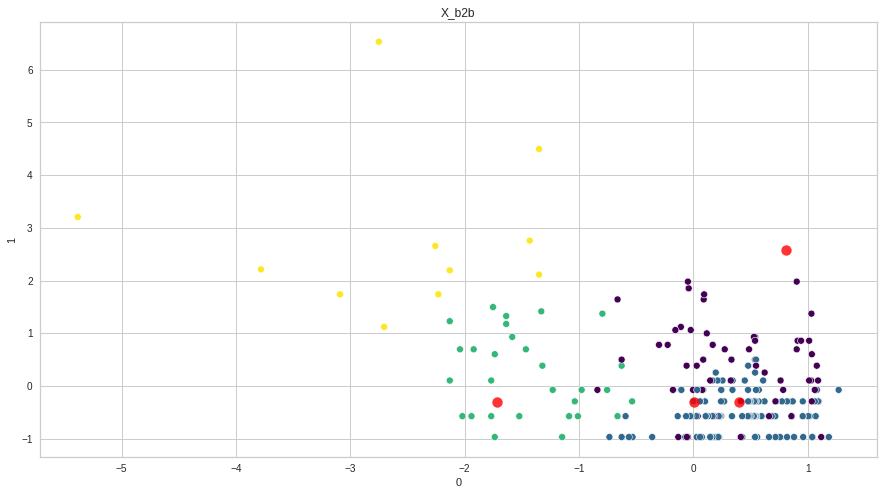

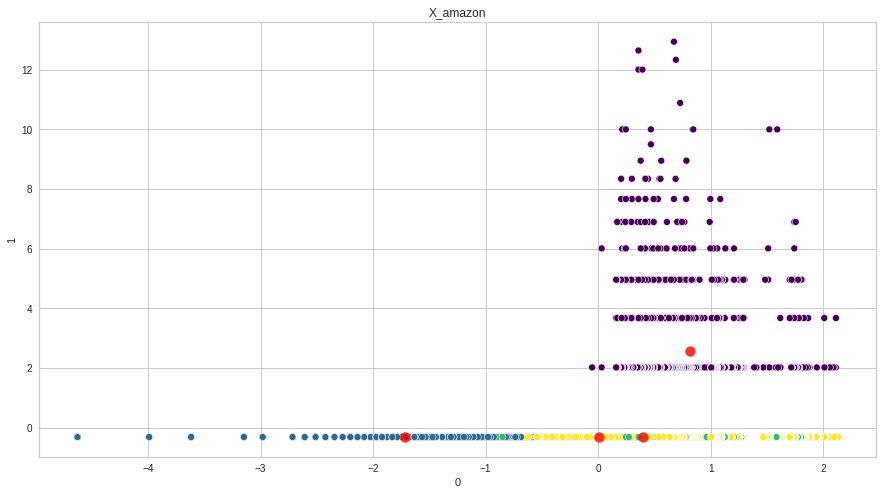

In [198]:
for i in range(len(Xs)):
    plt.figure(figsize=(15,8))
    plt.title(Xs_string[i])
    sns.scatterplot(Xs[i].iloc[:,0], Xs[i].iloc[:,1], c=clusters[i]["cluster"], cmap="viridis") # Since we scaled x1, we used it as x1.iloc[:,0].
    centers = kmeans.cluster_centers_
    plt.scatter(centers[:, 0], centers[:, 1], c='red', s=100, alpha=0.8);

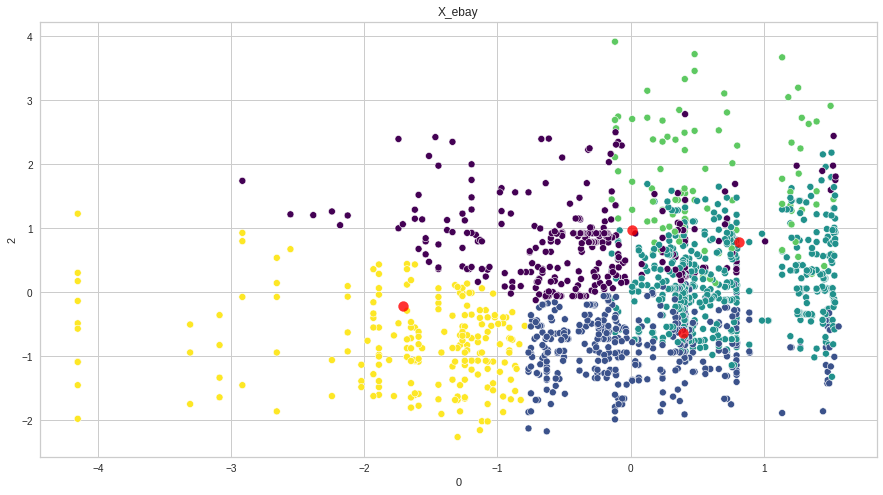

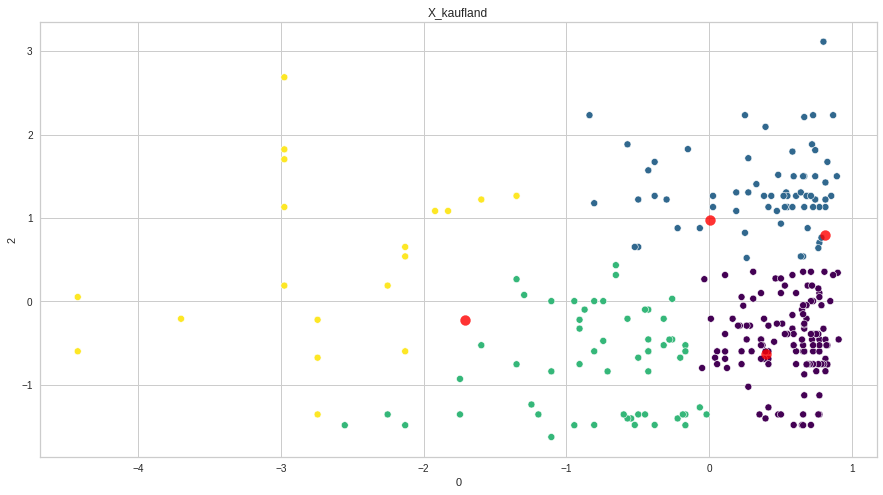

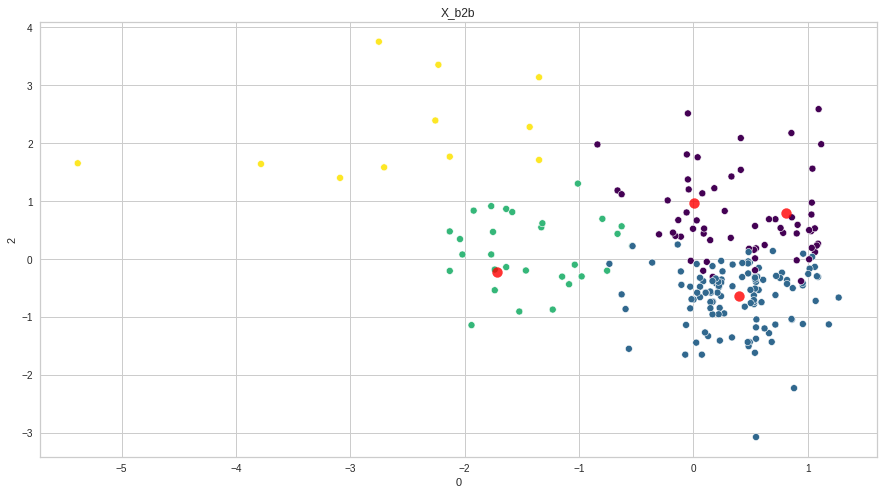

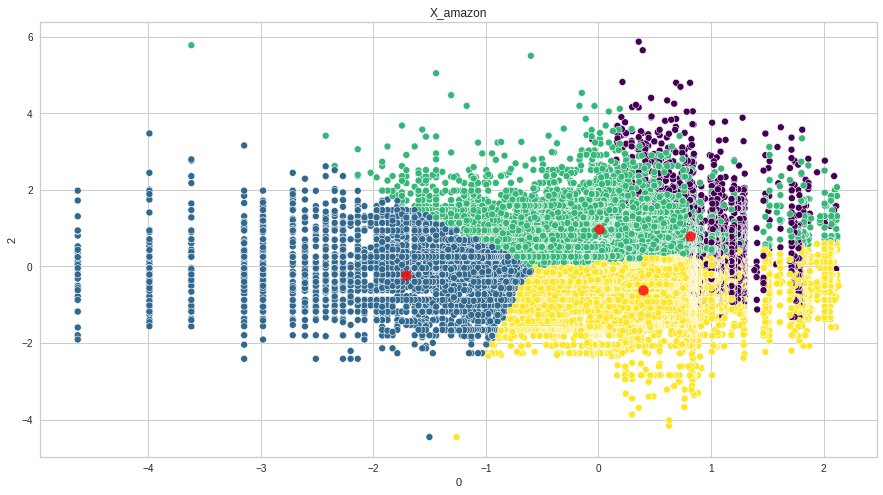

In [199]:
for i in range(len(Xs)):
    plt.figure(figsize=(15,8))
    plt.title(Xs_string[i])
    sns.scatterplot(Xs[i].iloc[:,0], Xs[i].iloc[:,2], c=clusters[i]["cluster"], cmap="viridis")
    centers = kmeans.cluster_centers_
    plt.scatter(centers[:, 0], centers[:, 2], c='red', s=100, alpha=0.8);

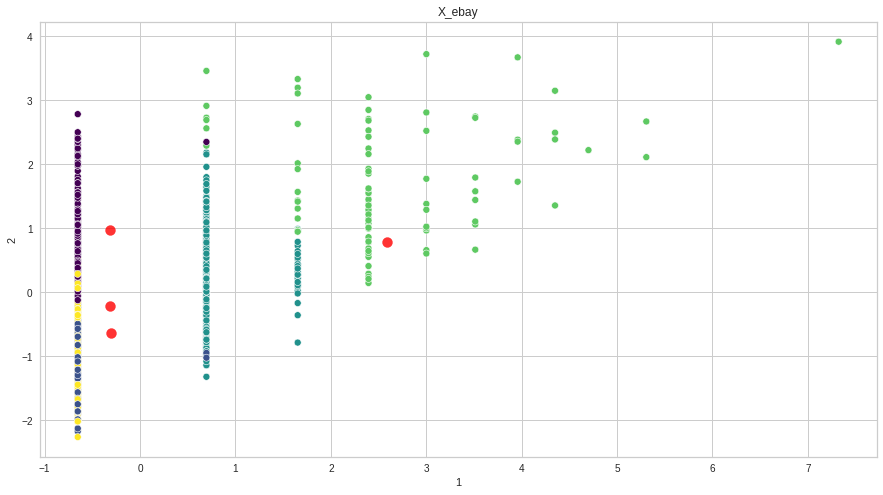

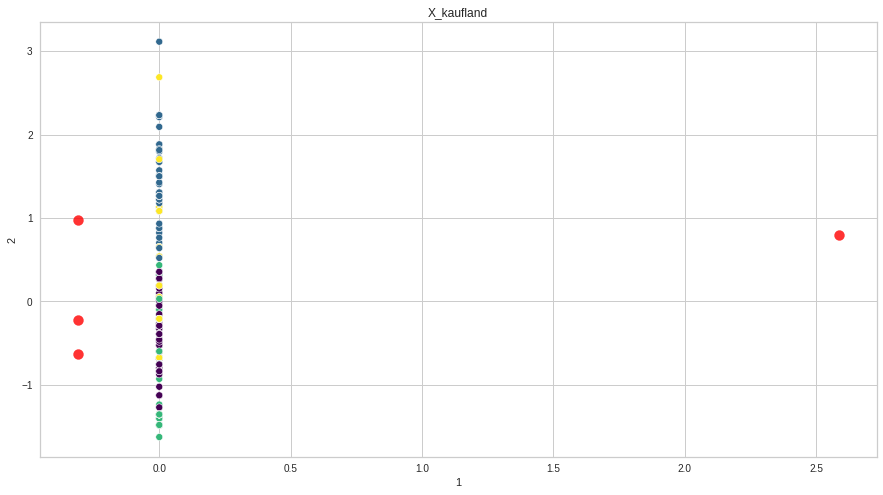

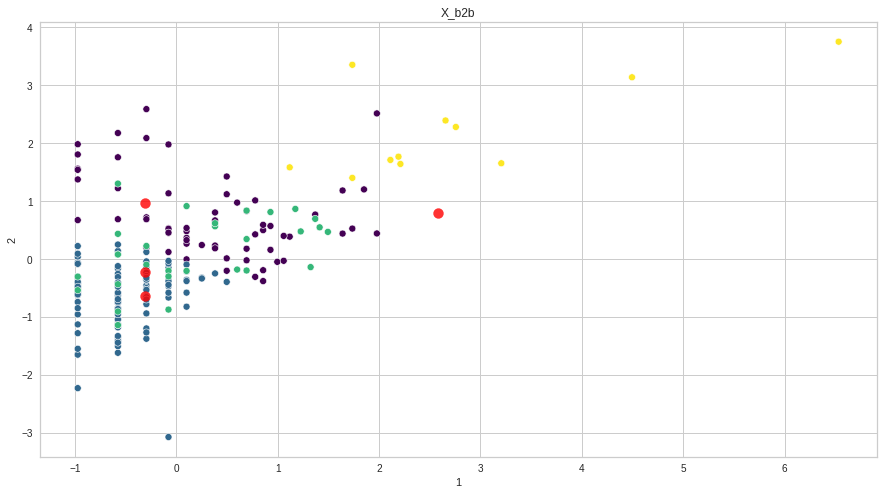

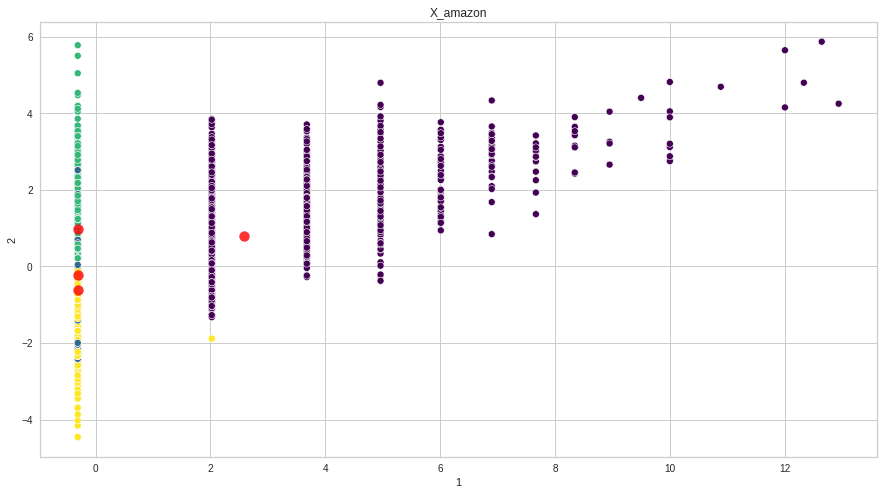

In [200]:
for i in range(len(Xs)):
    plt.figure(figsize=(15,8))
    plt.title(Xs_string[i])
    sns.scatterplot(Xs[i].iloc[:,1], Xs[i].iloc[:,2], c=clusters[i]["cluster"], cmap="viridis")
    centers = kmeans.cluster_centers_
    plt.scatter(centers[:,1], centers[:,2], c='red', s=100, alpha=0.8);

In [201]:
from mpl_toolkits.mplot3d import Axes3D



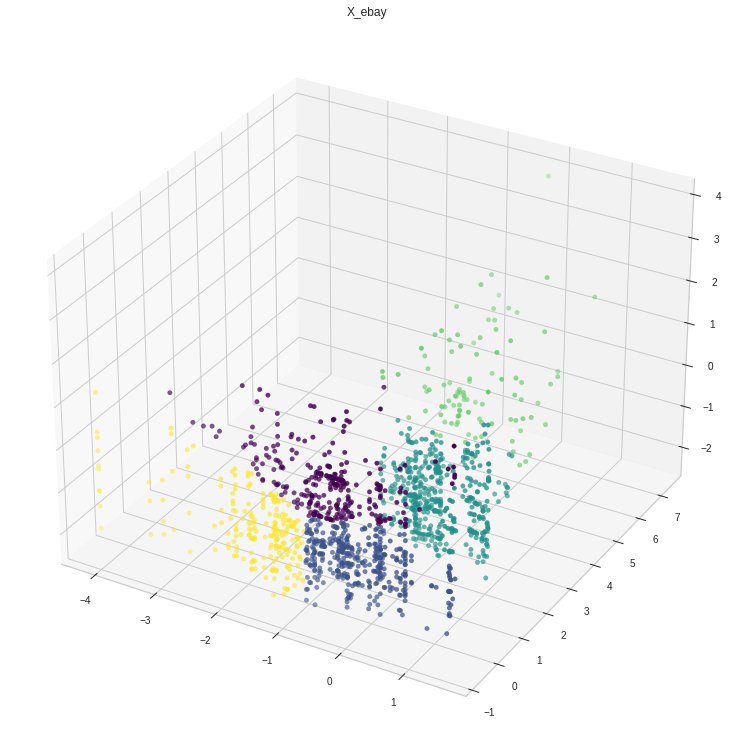

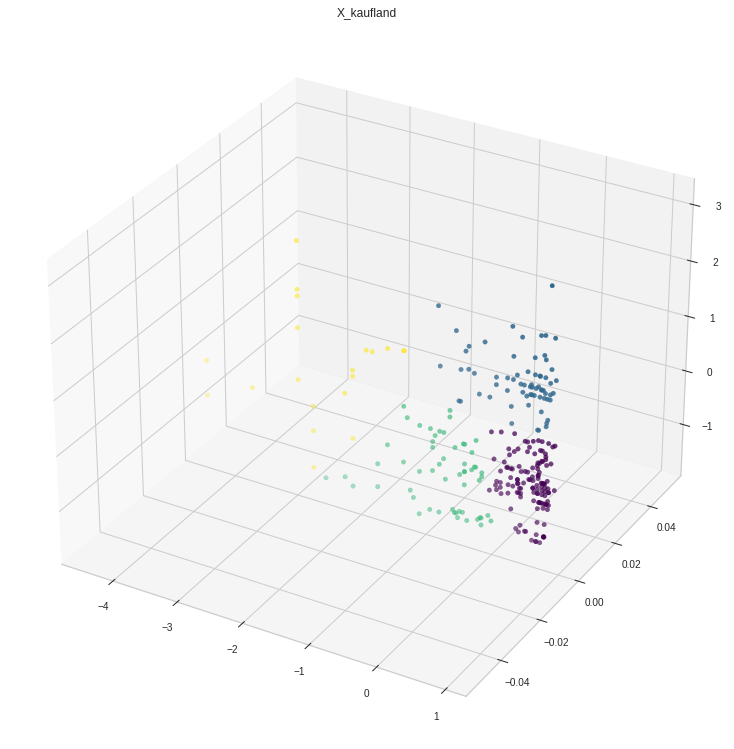

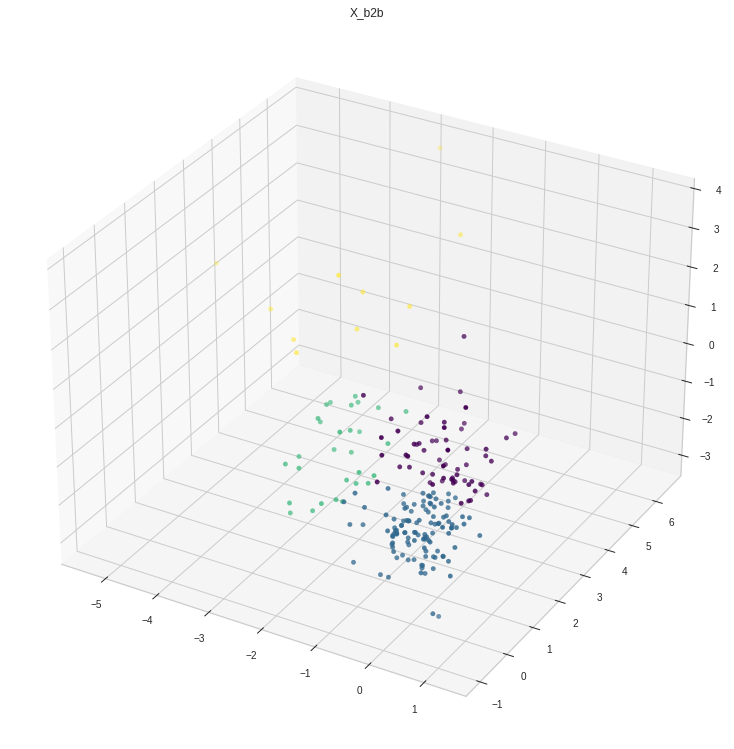

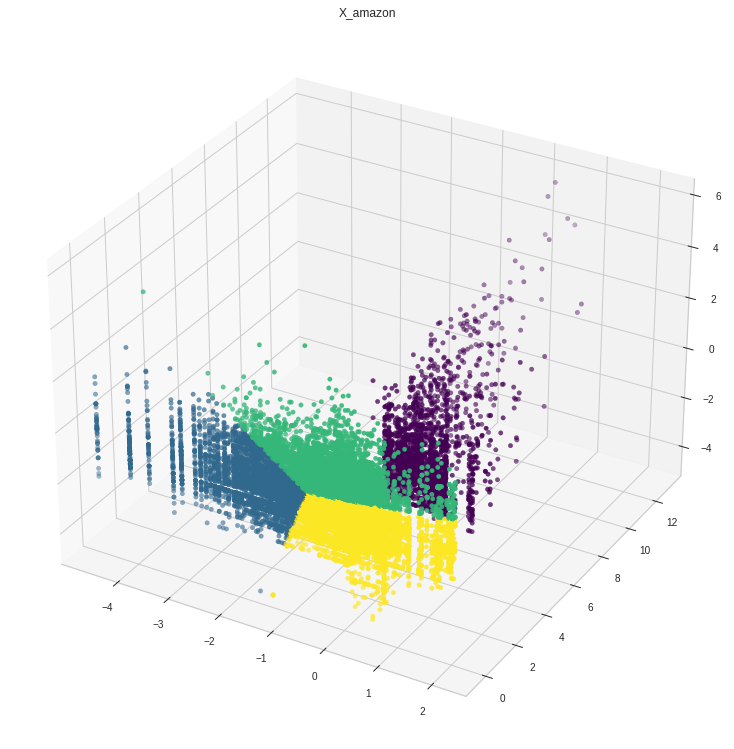

In [202]:
for i in range(len(Xs)):    
    plt.rcParams["figure.figsize"] =(15,10)   
    fig = plt.figure()   
    ax = Axes3D(fig)
    plt.title(Xs_string[i])
    ax.scatter(Xs[i].iloc[:,0], Xs[i].iloc[:,1], Xs[i].iloc[:,2], c = clusters[i]["cluster"], cmap="viridis");

Visualize Cluster Id vs Recency, Cluster Id vs Frequency and Cluster Id vs Monetary using Box plot. Also evaluate the results. 

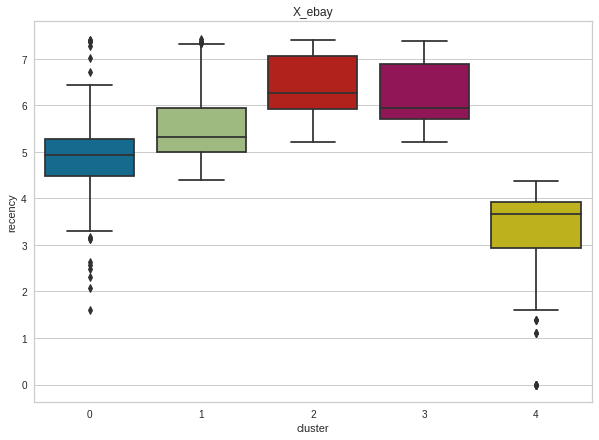

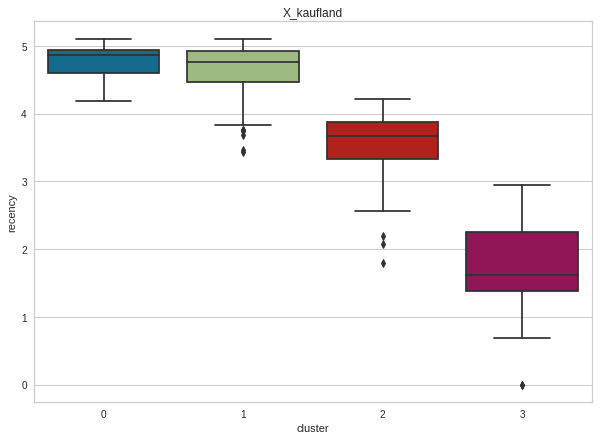

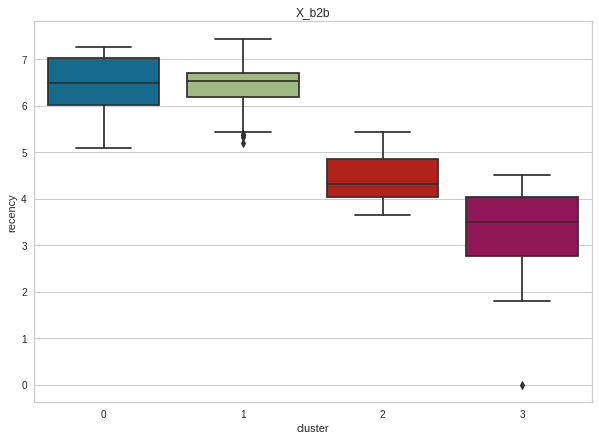

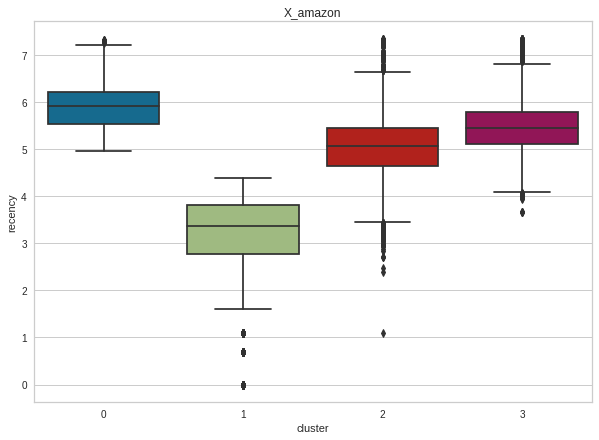

In [203]:
for i in range(len(Xs)):
    plt.figure(figsize=(10,7))
    plt.title(Xs_string[i])
    sns.boxplot(x="cluster", y="recency", data=clusters[i]);

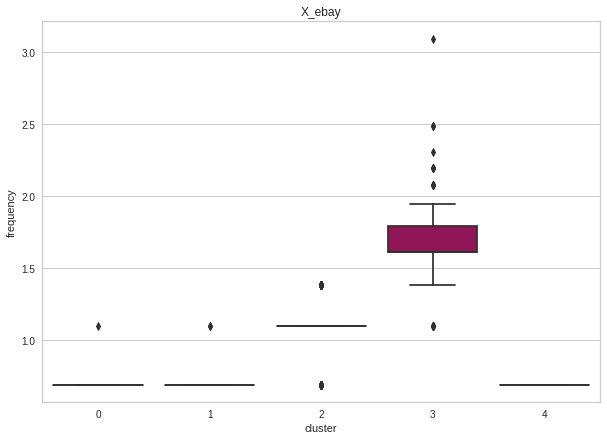

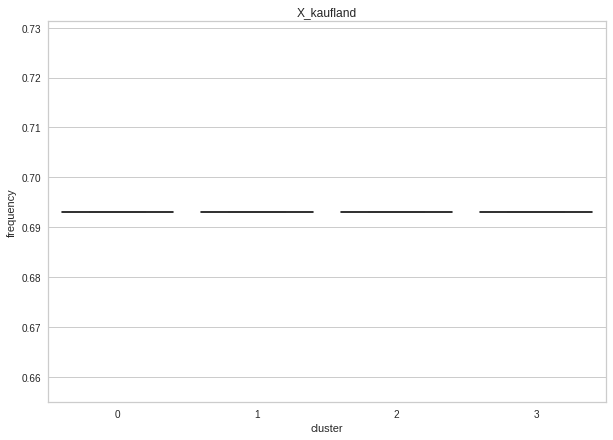

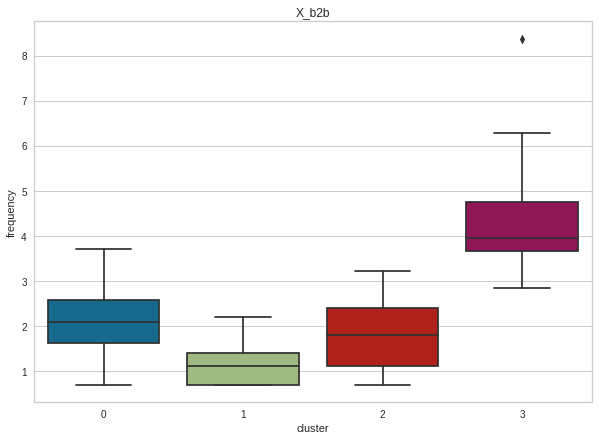

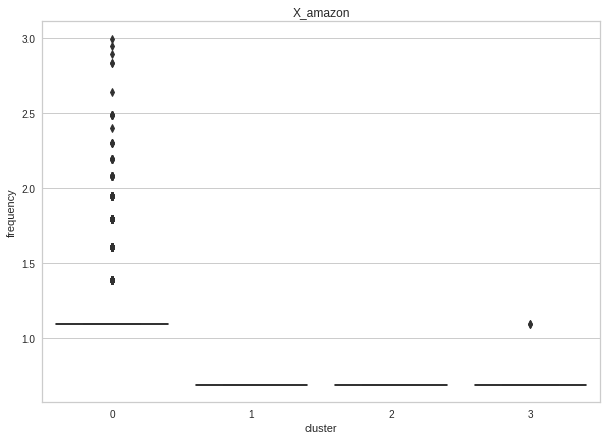

In [204]:
for i in range(len(Xs)):
    plt.figure(figsize=(10,7))
    plt.title(Xs_string[i])
    sns.boxplot(x="cluster", y="frequency", data=clusters[i]);

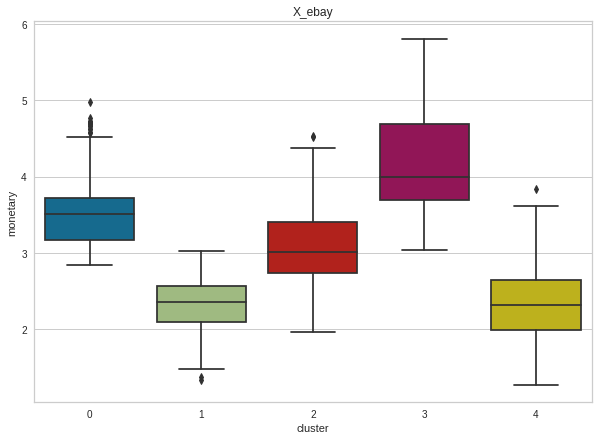

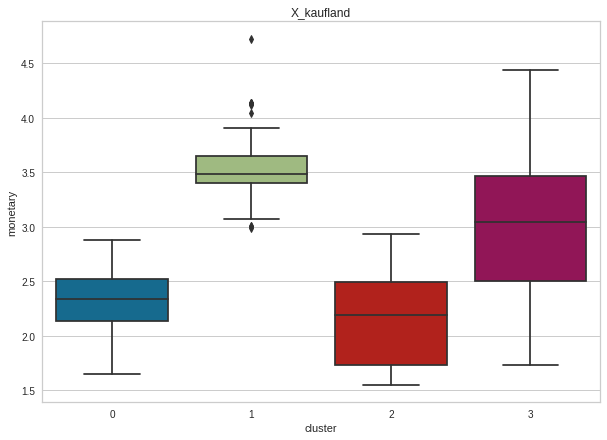

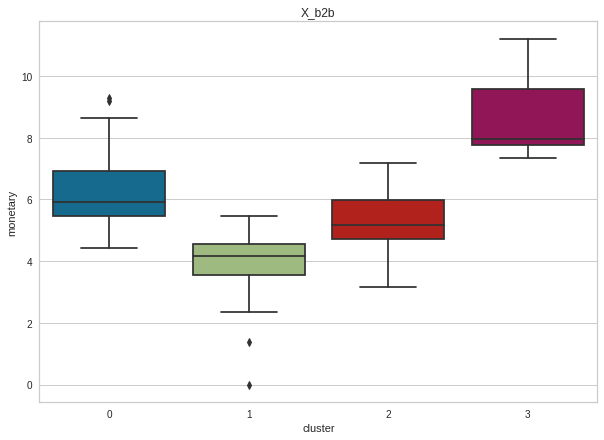

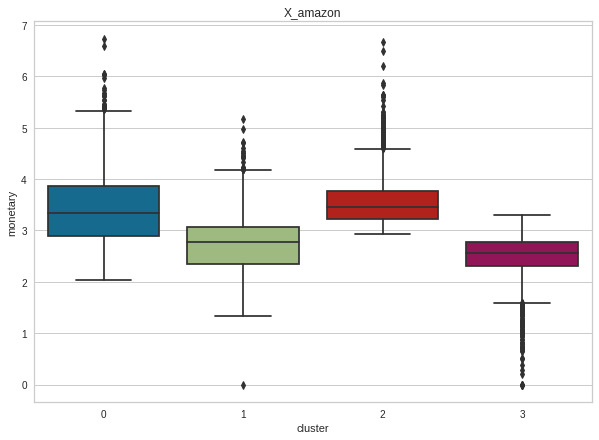

In [205]:
for i in range(len(Xs)):
    plt.figure(figsize=(10,7))
    plt.title(Xs_string[i])
    sns.boxplot(x="cluster", y="monetary", data=clusters[i]);

###  Assign the Label

In [206]:
df_clusters =[]
for i in range(len(clusters)):
    df_cluster_rfm_avg = clusters[i].groupby(["cluster"]).agg({"recency":"mean", "frequency":"mean","monetary":"mean"})
    df_clusters.append(clusters_string[i])
    df_clusters.append(df_cluster_rfm_avg)
    print(clusters_string[i])
    print(df_cluster_rfm_avg)
    print()

ebay_cluster
          recency  frequency  monetary
cluster                               
0        4.895310   0.694560  3.513346
1        5.511270   0.695180  2.328218
2        6.409074   1.094136  3.082274
3        6.188799   1.670372  4.184207
4        3.259046   0.693147  2.333966

kaufland_cluster
          recency  frequency  monetary
cluster                               
0        4.762163   0.693147  2.327145
1        4.605165   0.693147  3.538496
2        3.511277   0.693147  2.134248
3        1.730189   0.693147  3.018170

b2b_cluster
          recency  frequency  monetary
cluster                               
0        6.479730   2.039859  6.253451
1        6.456606   1.170787  3.979653
2        4.427071   1.892412  5.258754
3        3.127081   4.550121  8.730582

amazon_cluster
          recency  frequency  monetary
cluster                               
0        5.920427   1.196564  3.422478
1        3.171530   0.693147  2.765220
2        5.047440   0.693147  3.539103
3   

In [207]:
df_clusters

['ebay_cluster',
           recency  frequency  monetary
 cluster                               
 0        4.895310   0.694560  3.513346
 1        5.511270   0.695180  2.328218
 2        6.409074   1.094136  3.082274
 3        6.188799   1.670372  4.184207
 4        3.259046   0.693147  2.333966,
 'kaufland_cluster',
           recency  frequency  monetary
 cluster                               
 0        4.762163   0.693147  2.327145
 1        4.605165   0.693147  3.538496
 2        3.511277   0.693147  2.134248
 3        1.730189   0.693147  3.018170,
 'b2b_cluster',
           recency  frequency  monetary
 cluster                               
 0        6.479730   2.039859  6.253451
 1        6.456606   1.170787  3.979653
 2        4.427071   1.892412  5.258754
 3        3.127081   4.550121  8.730582,
 'amazon_cluster',
           recency  frequency  monetary
 cluster                               
 0        5.920427   1.196564  3.422478
 1        3.171530   0.693147  2.765220
 2  

In [208]:
ebay_cluster

,recency,frequency,monetary,cluster
Customer,,,,
ID10001,7.223296,1.945910,4.092963,3
ID10002,7.381502,1.098612,2.543270,2
ID10003,7.345365,0.693147,2.299777,1
ID10016,7.323831,1.386294,3.659862,2
ID10017,7.323831,0.693147,2.979717,2
...,...,...,...,...
IDKundenID9892,5.252273,0.693147,1.564441,1
IDKundenID9893,4.584967,0.693147,2.137710,1
IDKundenID9956,4.007333,0.693147,1.449269,4


In [209]:
#ebay_cluster["cluster"] = ebay_cluster["cluster"].map({"Best Customers":4, "Loyal Customers":3, "Medium":0, "Almost Lost":1, "Lost Customers":2})


In [210]:
ebay_cluster["cluster"] = ebay_cluster["cluster"].map({2:"Best Customers", 4:"Loyal Customers", 3:"Medium", 0:"Almost Lost", 1:"Lost Customers"})


In [211]:
ebay_cluster.head()

,recency,frequency,monetary,cluster
Customer,,,,
ID10001,7.223296,1.945910,4.092963,Medium
ID10002,7.381502,1.098612,2.543270,Best Customers
ID10003,7.345365,0.693147,2.299777,Lost Customers
ID10016,7.323831,1.386294,3.659862,Best Customers
ID10017,7.323831,0.693147,2.979717,Best Customers


In [212]:
ebay_cluster

,recency,frequency,monetary,cluster
Customer,,,,
ID10001,7.223296,1.945910,4.092963,Medium
ID10002,7.381502,1.098612,2.543270,Best Customers
ID10003,7.345365,0.693147,2.299777,Lost Customers
ID10016,7.323831,1.386294,3.659862,Best Customers
ID10017,7.323831,0.693147,2.979717,Best Customers
...,...,...,...,...
IDKundenID9892,5.252273,0.693147,1.564441,Lost Customers
IDKundenID9893,4.584967,0.693147,2.137710,Lost Customers
IDKundenID9956,4.007333,0.693147,1.449269,Loyal Customers


In [213]:
kaufland_cluster

,recency,frequency,monetary,cluster
Customer,,,,
IDKundenID10000,3.806662,0.693147,1.733424,2
IDKundenID10002,1.609438,0.693147,1.733424,3
IDKundenID10006,3.091042,0.693147,1.733424,2
IDKundenID10014,2.564949,0.693147,1.733424,2
IDKundenID10019,2.079442,0.693147,1.733424,2
...,...,...,...,...
IDKundenID9954,4.867534,0.693147,1.733424,0
IDKundenID9976,3.828641,0.693147,2.240710,2
IDKundenID9990,4.634729,0.693147,1.790091,0


In [214]:
df_clusters

['ebay_cluster',
           recency  frequency  monetary
 cluster                               
 0        4.895310   0.694560  3.513346
 1        5.511270   0.695180  2.328218
 2        6.409074   1.094136  3.082274
 3        6.188799   1.670372  4.184207
 4        3.259046   0.693147  2.333966,
 'kaufland_cluster',
           recency  frequency  monetary
 cluster                               
 0        4.762163   0.693147  2.327145
 1        4.605165   0.693147  3.538496
 2        3.511277   0.693147  2.134248
 3        1.730189   0.693147  3.018170,
 'b2b_cluster',
           recency  frequency  monetary
 cluster                               
 0        6.479730   2.039859  6.253451
 1        6.456606   1.170787  3.979653
 2        4.427071   1.892412  5.258754
 3        3.127081   4.550121  8.730582,
 'amazon_cluster',
           recency  frequency  monetary
 cluster                               
 0        5.920427   1.196564  3.422478
 1        3.171530   0.693147  2.765220
 2  

In [215]:
kaufland_cluster["cluster"] = kaufland_cluster["cluster"].map({1:"Best Customers", 0:"Loyal Customers",  2:"Almost Lost", 3:"Lost Customers"})


In [216]:
kaufland_cluster

,recency,frequency,monetary,cluster
Customer,,,,
IDKundenID10000,3.806662,0.693147,1.733424,Almost Lost
IDKundenID10002,1.609438,0.693147,1.733424,Lost Customers
IDKundenID10006,3.091042,0.693147,1.733424,Almost Lost
IDKundenID10014,2.564949,0.693147,1.733424,Almost Lost
IDKundenID10019,2.079442,0.693147,1.733424,Almost Lost
...,...,...,...,...
IDKundenID9954,4.867534,0.693147,1.733424,Loyal Customers
IDKundenID9976,3.828641,0.693147,2.240710,Almost Lost
IDKundenID9990,4.634729,0.693147,1.790091,Loyal Customers


In [217]:
b2b_cluster

,recency,frequency,monetary,cluster
0,7.440147,1.609438,3.955082,1
1,3.637586,3.931826,7.949231,3
2,7.344073,0.693147,3.193123,1
3,2.944439,8.376321,11.209428,3
4,6.326149,2.397895,6.409411,0
...,...,...,...,...
210,3.761200,1.098612,5.176150,2
211,3.637586,2.944439,5.830004,2
212,3.496508,4.406719,8.975515,3
213,2.995732,2.833213,7.646736,3


In [218]:
df_clusters

['ebay_cluster',
           recency  frequency  monetary
 cluster                               
 0        4.895310   0.694560  3.513346
 1        5.511270   0.695180  2.328218
 2        6.409074   1.094136  3.082274
 3        6.188799   1.670372  4.184207
 4        3.259046   0.693147  2.333966,
 'kaufland_cluster',
           recency  frequency  monetary
 cluster                               
 0        4.762163   0.693147  2.327145
 1        4.605165   0.693147  3.538496
 2        3.511277   0.693147  2.134248
 3        1.730189   0.693147  3.018170,
 'b2b_cluster',
           recency  frequency  monetary
 cluster                               
 0        6.479730   2.039859  6.253451
 1        6.456606   1.170787  3.979653
 2        4.427071   1.892412  5.258754
 3        3.127081   4.550121  8.730582,
 'amazon_cluster',
           recency  frequency  monetary
 cluster                               
 0        5.920427   1.196564  3.422478
 1        3.171530   0.693147  2.765220
 2  

In [219]:
b2b_cluster["cluster"] = b2b_cluster["cluster"].map({0:"Best Customers", 3:"Almost Lost",  2:"Big Spenders", 1:"Loyal Customers"})


In [220]:
b2b_cluster

,recency,frequency,monetary,cluster
0,7.440147,1.609438,3.955082,Loyal Customers
1,3.637586,3.931826,7.949231,Almost Lost
2,7.344073,0.693147,3.193123,Loyal Customers
3,2.944439,8.376321,11.209428,Almost Lost
4,6.326149,2.397895,6.409411,Best Customers
...,...,...,...,...
210,3.761200,1.098612,5.176150,Big Spenders
211,3.637586,2.944439,5.830004,Big Spenders
212,3.496508,4.406719,8.975515,Almost Lost
213,2.995732,2.833213,7.646736,Almost Lost


In [221]:
amazon_cluster

,recency,frequency,monetary,cluster
Customer,,,,
ID10004,7.346010,0.693147,2.760838,3
ID10005,7.345365,0.693147,2.760838,3
ID10006,7.346010,0.693147,3.397139,2
ID10008,7.347300,0.693147,3.192743,3
ID10009,7.326466,0.693147,2.638390,3
...,...,...,...,...
IDKundenID9992,4.477337,0.693147,2.336020,3
IDKundenID9993,4.465908,0.693147,2.336020,3
IDKundenID9994,4.454347,0.693147,2.336020,3


In [222]:
df_clusters

['ebay_cluster',
           recency  frequency  monetary
 cluster                               
 0        4.895310   0.694560  3.513346
 1        5.511270   0.695180  2.328218
 2        6.409074   1.094136  3.082274
 3        6.188799   1.670372  4.184207
 4        3.259046   0.693147  2.333966,
 'kaufland_cluster',
           recency  frequency  monetary
 cluster                               
 0        4.762163   0.693147  2.327145
 1        4.605165   0.693147  3.538496
 2        3.511277   0.693147  2.134248
 3        1.730189   0.693147  3.018170,
 'b2b_cluster',
           recency  frequency  monetary
 cluster                               
 0        6.479730   2.039859  6.253451
 1        6.456606   1.170787  3.979653
 2        4.427071   1.892412  5.258754
 3        3.127081   4.550121  8.730582,
 'amazon_cluster',
           recency  frequency  monetary
 cluster                               
 0        5.920427   1.196564  3.422478
 1        3.171530   0.693147  2.765220
 2  

In [223]:
#b2b_cluster["cluster"] = b2b_cluster["cluster"].map({"Best Customers":3, "Loyal Customers":0,  "Almost Lost":1, "Lost Customers":2})


In [224]:
amazon_cluster["cluster"] = amazon_cluster["cluster"].map({3:"Best Customers", 0:"Medium",  2:"Almost Lost", 2:"Loyal Customers"})


In [225]:
amazon_cluster

,recency,frequency,monetary,cluster
Customer,,,,
ID10004,7.346010,0.693147,2.760838,Best Customers
ID10005,7.345365,0.693147,2.760838,Best Customers
ID10006,7.346010,0.693147,3.397139,Loyal Customers
ID10008,7.347300,0.693147,3.192743,Best Customers
ID10009,7.326466,0.693147,2.638390,Best Customers
...,...,...,...,...
IDKundenID9992,4.477337,0.693147,2.336020,Best Customers
IDKundenID9993,4.465908,0.693147,2.336020,Best Customers
IDKundenID9994,4.454347,0.693147,2.336020,Best Customers


In [226]:
for i in range(len(clusters)):
    print(clusters_string[i])
    print(clusters[i]["cluster"].value_counts())
    print()

ebay_cluster
Best Customers     465
Lost Customers     399
Almost Lost        287
Loyal Customers    206
Medium             101
Name: cluster, dtype: int64

kaufland_cluster
Loyal Customers    126
Best Customers      68
Almost Lost         57
Lost Customers      20
Name: cluster, dtype: int64

b2b_cluster
Loyal Customers    114
Best Customers      61
Big Spenders        29
Almost Lost         11
Name: cluster, dtype: int64

amazon_cluster
Best Customers     9945
Loyal Customers    5347
Medium             2240
Name: cluster, dtype: int64



In [227]:
ebay_cluster.to_csv("ebay_cluster.csv")
kaufland_cluster.to_csv("kaufland_cluster.csv")
b2b_cluster.to_csv("b2b_cluster.csv")
amazon_cluster.to_csv("amazon_cluster.csv")

In [228]:
ebay_cluster

,recency,frequency,monetary,cluster
Customer,,,,
ID10001,7.223296,1.945910,4.092963,Medium
ID10002,7.381502,1.098612,2.543270,Best Customers
ID10003,7.345365,0.693147,2.299777,Lost Customers
ID10016,7.323831,1.386294,3.659862,Best Customers
ID10017,7.323831,0.693147,2.979717,Best Customers
...,...,...,...,...
IDKundenID9892,5.252273,0.693147,1.564441,Lost Customers
IDKundenID9893,4.584967,0.693147,2.137710,Lost Customers
IDKundenID9956,4.007333,0.693147,1.449269,Loyal Customers


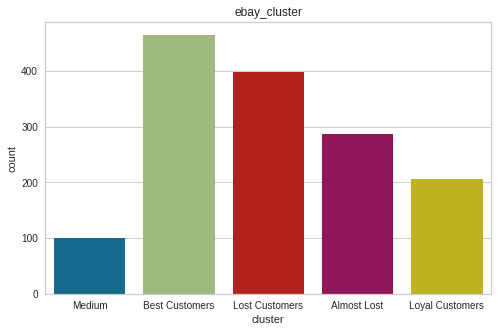

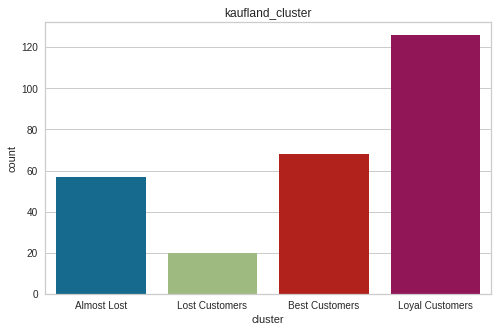

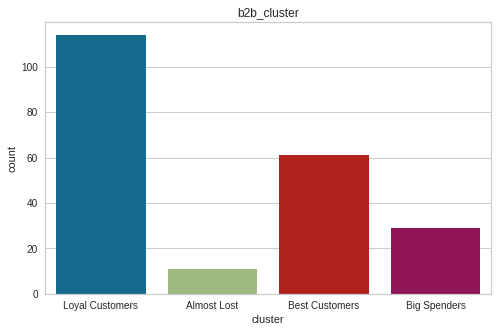

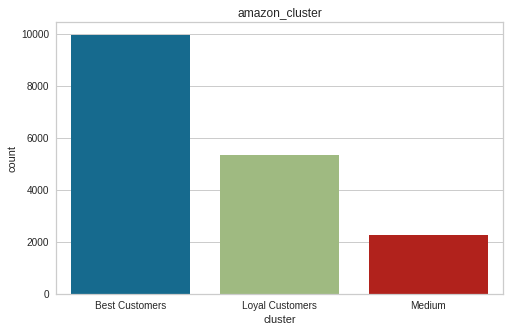

In [229]:
for i in range(len(clusters)):  
    plt.figure(figsize=(8,5))
    plt.title(clusters_string[i])
    sns.countplot(x="cluster", data=clusters[i]);
    print()

# CLTV Calculation <a id="2"></a>                  [^](#ToC)<br>

First we need to select a time window. It can be anything like 3, 6, 12, 24 months. By the equation below, we can have Lifetime Value for each customer in that specific time window: <br>
Lifetime Value = Total Gross Revenue - Total Cost

In [230]:
rfm_ebay

,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level
Customer,,,,,,,,
ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer
ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer
ID10003,1548,1,8.971963,1,2,1,4,Lost Customer
ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer
ID10017,1515,1,18.682243,1,2,2,5,Lost Customer
...,...,...,...,...,...,...,...,...
IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer
IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer
IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer


In [231]:
rfm_ebay.to_csv("rfm_ebay.csv")
rfm_kaufland.to_csv("rfm_kaufland.csv")
rfm_b2b.to_csv("rfm_b2b.csv")
rfm_amazon.to_csv("rfm_amazon.csv")

In [232]:
rfm_ebay= pd.read_csv("rfm_ebay.csv")
rfm_kaufland= pd.read_csv("rfm_kaufland.csv")
rfm_b2b=pd.read_csv("rfm_b2b.csv")
rfm_amazon = pd.read_csv("rfm_amazon.csv")

In [233]:
customer_ebay =pd.DataFrame()
customer_kaufland = pd.DataFrame()
customer_b2b = pd.DataFrame()
customer_amazon=pd.DataFrame()

In [234]:
rfm_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer
...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer


In [235]:
customer_ebay = rfm_ebay.copy()
customer_kaufland = rfm_kaufland.copy()
customer_b2b = rfm_b2b.copy()
customer_amazon=rfm_amazon.copy()

In [236]:
customer_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer
...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer


In [237]:
customers = [customer_ebay, customer_kaufland, customer_b2b, customer_amazon]
customers_string = ['customer_ebay', 'customer_kaufland', 'customer_b2b', 'customer_amazon']

In [238]:
for i in range(len(customers)):
    print(customers_string[i])
    customers[i]['Avg_Revenue'] = customers[i]['monetary']/customers[i]['frequency']
    #print(customers[i].head())
    print()

customer_ebay

customer_kaufland

customer_b2b

customer_amazon



In [239]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [240]:
scaler = MinMaxScaler()


In [241]:
scaler.fit_transform(customer_ebay[['recency']])

array([[0.80588235],
       [0.94411765],
       [0.91058824],
       ...,
       [0.03176471],
       [0.05705882],
       [0.05470588]])

In [242]:
customer_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer,9.819524
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer,5.860598
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer,8.971963
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer,12.618655
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer,18.682243
...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer,3.780000
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer,7.480000
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer,3.260000
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer,10.270000


In [243]:
for i in range(len(customers)):
    print(customers_string[i])
    customers[i]['n_recency'] = scaler.fit_transform(customers[i][['recency']])
    print(customers[i])
    print()

customer_ebay
            Customer  recency  frequency   monetary  r_score  f_score  \
0            ID10001     1370          6  58.917144        1        4   
1            ID10002     1605          2  11.721197        1        4   
2            ID10003     1548          1   8.971963        1        2   
3            ID10016     1515          3  37.855965        1        4   
4            ID10017     1515          1  18.682243        1        2   
...              ...      ...        ...        ...      ...      ...   
1453  IDKundenID9892      190          1   3.780000        3        2   
1454  IDKundenID9893       97          1   7.480000        4        2   
1455  IDKundenID9956       54          1   3.260000        4        2   
1456  IDKundenID9957       97          1  10.270000        4        2   
1457  IDKundenID9958       93          1   9.240000        4        2   

      m_score  rfm_scores             rfm_level  Avg_Revenue  n_recency  
0           4           9        Lo

In [244]:
for i in range(len(customers)):
    print(customers_string[i])
    customers[i]['n_frequency'] = scaler.fit_transform(customers[i][['frequency']])
    #print(customers[i])
    print()

customer_ebay

customer_kaufland

customer_b2b

customer_amazon



In [245]:
for i in range(len(customers)):
    print(customers_string[i])
    customers[i]['n_monetary'] = scaler.fit_transform(customers[i][['monetary']])
    #print(customers[i])
    print()

customer_ebay

customer_kaufland

customer_b2b

customer_amazon



In [246]:
customer_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer,9.819524,0.805882,0.25,0.170435
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer,5.860598,0.944118,0.05,0.027705
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer,8.971963,0.910588,0.00,0.019391
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer,12.618655,0.891176,0.10,0.106742
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer,18.682243,0.891176,0.00,0.048757
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer,3.780000,0.111765,0.00,0.003690
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer,7.480000,0.057059,0.00,0.014879
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer,3.260000,0.031765,0.00,0.002117
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer,10.270000,0.057059,0.00,0.023316


In [247]:
for i in range(len(customers)):
    print(customers_string[i])
    customers[i]['n_avg_revenue'] = scaler.fit_transform(customers[i][['Avg_Revenue']])
    #print(customers[i])
    print()

customer_ebay

customer_kaufland

customer_b2b

customer_amazon



In [248]:
customer_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer,9.819524,0.805882,0.25,0.170435,0.051187
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer,5.860598,0.944118,0.05,0.027705,0.023273
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer,8.971963,0.910588,0.00,0.019391,0.045211
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer,12.618655,0.891176,0.10,0.106742,0.070924
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer,18.682243,0.891176,0.00,0.048757,0.113678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer,3.780000,0.111765,0.00,0.003690,0.008602
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer,7.480000,0.057059,0.00,0.014879,0.034691
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer,3.260000,0.031765,0.00,0.002117,0.004936
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer,10.270000,0.057059,0.00,0.023316,0.054363


In [249]:
#Customer Lifetime Value

# Quick Formula: (M*F/(1-R))*profit_margin

#customer['CLTV'] = ((customer['Avg_Revenue']*customer['Frequency'])/(1.0005 - customer['n_Recency']))*0.1   #%10 profir margin

In [250]:
for i in range(len(customers)):
    print(customers_string[i])
    customers[i]['CLTV'] = ((customers[i]['Avg_Revenue']*customers[i]['frequency'])/(1.0005 - customers[i]['n_recency']))*0.1
    #print(customers[i])
    print()

customer_ebay

customer_kaufland

customer_b2b

customer_amazon



In [251]:
customer_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer,9.819524,0.805882,0.25,0.170435,0.051187,30.273280
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer,5.860598,0.944118,0.05,0.027705,0.023273,20.788769
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer,8.971963,0.910588,0.00,0.019391,0.045211,9.978630
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer,12.618655,0.891176,0.10,0.106742,0.070924,34.627463
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer,18.682243,0.891176,0.00,0.048757,0.113678,17.088950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer,3.780000,0.111765,0.00,0.003690,0.008602,0.425323
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer,7.480000,0.057059,0.00,0.014879,0.034691,0.792842
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer,3.260000,0.031765,0.00,0.002117,0.004936,0.336521
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer,10.270000,0.057059,0.00,0.023316,0.054363,1.088568


In [252]:
for i in range(len(customers)):
    print(customers_string[i])
    print(customers[i][customers[i]['CLTV']>1000].sort_values(by='CLTV', ascending=False))
    #print(customers[i])
    print()

customer_ebay
   Customer  recency  frequency   monetary  r_score  f_score  m_score  \
98  ID10248     1700          1  11.682243        1        2        2   

    rfm_scores      rfm_level  Avg_Revenue  n_recency  n_frequency  \
98           5  Lost Customer    11.682243        1.0          0.0   

    n_monetary  n_avg_revenue         CLTV  
98    0.027587       0.064321  2336.448598  

customer_kaufland
           Customer  recency  frequency  monetary  r_score  f_score  m_score  \
39  IDKundenID12194      164          1      9.34        1        4        2   

    rfm_scores             rfm_level  Avg_Revenue  n_recency  n_frequency  \
39           7  Almost Lost Customer         9.34        1.0          0.0   

    n_monetary  n_avg_revenue    CLTV  
39    0.051835       0.051835  1868.0  

customer_b2b
    Customer  recency  frequency      monetary  r_score  f_score  m_score  \
0      ID -2     1702          4     51.200000        1        2        1   
3    ID10007       18    

In [253]:
customer_ebay.sort_values(by='CLTV', ascending=False) #[customer_ebay['CLTV']>500]

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV
98,ID10248,1700,1,11.682243,1,2,2,5,Lost Customer,11.682243,1.000000,0.00,0.027587,0.064321,2336.448598
96,ID10243,1650,1,70.000000,1,2,4,7,Almost Lost Customer,70.000000,0.970588,0.00,0.203951,0.475522,234.021632
60,ID10177,1618,1,112.140187,1,2,4,7,Almost Lost Customer,112.140187,0.951765,0.00,0.331391,0.772654,230.100565
93,ID10240,1646,1,67.214953,1,2,4,7,Almost Lost Customer,67.214953,0.968235,0.00,0.195529,0.455884,208.323465
42,ID10144,1571,2,158.878505,1,4,4,9,Loyal Customer,79.439252,0.924118,0.05,0.472736,0.542078,208.004203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer,3.260000,0.031765,0.00,0.002117,0.004936,0.336521
1077,IDKundenID19392,81,1,2.930000,4,2,1,7,Almost Lost Customer,2.930000,0.047647,0.00,0.001119,0.002609,0.307498
1076,IDKundenID19391,97,1,2.800000,4,2,1,7,Almost Lost Customer,2.800000,0.057059,0.00,0.000726,0.001692,0.296786
1015,IDKundenID15796,50,1,2.850000,4,2,1,7,Almost Lost Customer,2.850000,0.029412,0.00,0.000877,0.002045,0.293485


In [254]:
customer_b2b.sort_values(by='CLTV', ascending=False) #[customer_b2b['CLTV']>1000]

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV
0,ID -2,1702,4,5.120000e+01,1,2,1,4,Lost Customer,1.280000e+01,1.000000,0.000691,0.000753,0.003393,1.024000e+04
3,ID10007,18,4342,7.382219e+04,4,4,4,12,Best Customer,1.700189e+01,0.010576,1.000000,1.000000,0.004435,7.457358e+03
6,ID10405,1399,3,1.091200e+04,1,2,4,7,Almost Lost Customer,3.637333e+03,0.821974,0.000461,0.147866,0.902138,6.112280e+03
177,ID18074,33,31,3.835025e+04,4,4,4,12,Best Customer,1.237105e+03,0.019389,0.006911,0.519524,0.306973,3.908859e+03
215,IDID -2,90,538,2.691384e+04,4,4,4,12,Best Customer,5.002573e+01,0.052879,0.123704,0.364615,0.012623,2.840148e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,ID13234,446,1,9.340000e+00,3,1,1,5,Lost Customer,9.340000e+00,0.262045,0.000000,0.000186,0.002535,1.264802e+00
173,ID14880,379,1,9.340000e+00,3,1,1,5,Lost Customer,9.340000e+00,0.222679,0.000000,0.000186,0.002535,1.200791e+00
38,ID10908,1100,1,3.000000e+00,1,1,1,3,Lost Customer,3.000000e+00,0.646298,0.000000,0.000100,0.000963,8.469755e-01
86,ID11411,758,4,-3.552714e-15,2,2,1,5,Lost Customer,-8.881784e-16,0.445358,0.000691,0.000060,0.000219,-6.399653e-16


In [255]:
customer_amazon.sort_values(by='CLTV', ascending=False) #[customer_amazon['CLTV']>1000]

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV
336,ID10720,1569,1,12.140187,1,2,2,5,Lost Customer,12.140187,1.000000,0.0,0.014486,0.015387,2428.037383
72,ID10110,1544,1,69.476636,1,2,4,7,Almost Lost Customer,69.476636,0.984066,0.0,0.082904,0.088057,422.768877
73,ID10111,1544,1,59.719626,1,2,4,7,Almost Lost Customer,59.719626,0.984066,0.0,0.071261,0.075690,363.396977
74,ID10112,1544,1,42.046729,1,2,4,7,Almost Lost Customer,42.046729,0.984066,0.0,0.050173,0.053291,255.856494
84,ID10151,1549,1,29.626168,1,2,4,7,Almost Lost Customer,29.626168,0.987253,0.0,0.035352,0.037549,223.644822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14199,IDKundenID19802,29,1,0.000000,4,2,1,7,Almost Lost Customer,0.000000,0.018483,0.0,0.000000,0.000000,0.000000
8485,IDKundenID10469,38,1,0.000000,4,2,1,7,Almost Lost Customer,0.000000,0.024219,0.0,0.000000,0.000000,0.000000
16370,IDKundenID23248,38,1,0.000000,4,2,1,7,Almost Lost Customer,0.000000,0.024219,0.0,0.000000,0.000000,0.000000
16835,IDKundenID2975,38,1,0.000000,4,2,1,7,Almost Lost Customer,0.000000,0.024219,0.0,0.000000,0.000000,0.000000


In [256]:
customer_kaufland.sort_values(by='CLTV', ascending=False) #[customer_kaufland['CLTV']>1000]

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV
39,IDKundenID12194,164,1,9.34,1,4,2,7,Almost Lost Customer,9.34,1.000000,0.0,0.051835,0.051835,1868.000000
208,IDKundenID4205,162,1,37.37,1,4,4,9,Loyal Customer,37.37,0.987805,0.0,0.310367,0.310367,294.365034
92,IDKundenID16852,163,1,16.67,1,4,2,7,Almost Lost Customer,16.67,0.993902,0.0,0.119443,0.119443,252.669131
157,IDKundenID21830,158,1,61.68,1,4,4,9,Loyal Customer,61.68,0.963415,0.0,0.534588,0.534588,166.318974
178,IDKundenID22365,148,1,112.14,1,4,4,9,Loyal Customer,112.14,0.902439,0.0,1.000000,1.000000,114.357418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,IDKundenID10019,7,1,4.66,4,4,1,9,Loyal Customer,4.66,0.042683,0.0,0.008670,0.008670,0.486523
1,IDKundenID10002,4,1,4.66,4,4,1,9,Loyal Customer,4.66,0.024390,0.0,0.008670,0.008670,0.477405
142,IDKundenID20310,8,1,4.19,4,4,1,9,Loyal Customer,4.19,0.048780,0.0,0.004335,0.004335,0.440256
79,IDKundenID16807,23,1,3.72,4,4,1,9,Loyal Customer,3.72,0.140244,0.0,0.000000,0.000000,0.432429


In [257]:
ebay.fatura_tarihi.max()

Timestamp('2022-04-28 00:00:00')

gecmis 6 ay 3ay arasindaki rfm skoru varsa kullanabilirim. ]
neden hepsini kullanmiyoruz. 
cok recent bilgi kullandigimiz zaman churn yok. 
10 yillik musteri aslinda 3 yillik kullnmam daha yeni olanlar icin kullanmak biased oluyor.
bu yuzden recent bir seyden train test yapiyoruz


In [258]:
delivery_3m_ebay =pd.DataFrame()
delivery_3m_kaufland = pd.DataFrame()
delivery_3m_b2b = pd.DataFrame()
delivery_3m_amazon=pd.DataFrame()

In [259]:
delivery_6m_ebay =pd.DataFrame()
delivery_6m_kaufland = pd.DataFrame()
delivery_6m_b2b = pd.DataFrame()
delivery_6m_amazon=pd.DataFrame()

In [260]:
delivery_3ms = [delivery_3m_ebay, delivery_3m_kaufland, delivery_3m_b2b, delivery_3m_amazon  ]
delivery_6ms = [delivery_6m_ebay, delivery_6m_kaufland, delivery_6m_b2b, delivery_6m_amazon  ]

In [261]:
platforms[1].fatura_tarihi

0     2022-04-06
1     2021-12-21
2     2022-03-02
3     2022-04-02
4     2022-04-21
         ...    
266   2021-12-12
267   2022-02-01
268   2022-03-30
269   2022-04-26
270   2021-12-02
Name: fatura_tarihi, Length: 271, dtype: datetime64[ns]

In [262]:
#ebay['date'] = pd.to_datetime(ebay['fatura_tarihi'], format="%Y-%m-%d").dt.date

In [263]:
#delivery_6m_ebay = ebay[(ebay.fatura_tarihi < date(2022,4,1)) & (ebay.fatura_tarihi >= date(2021,10,1))].reset_index(drop=True)

In [264]:
#create 3m and 6m dataframes
for i in range(len(delivery_6ms)):
    print(platforms_string[i])
    delivery_6ms[i] = delivery_6ms[i] = platforms[i][(platforms[i].fatura_tarihi < '2022-4-1') & (platforms[i].fatura_tarihi >= '2021-10-1')].reset_index(drop=True)
    #print(customers[i])
    print()

ebay

kaufland

b2b

amazon



In [265]:
#create 3m and 6m dataframes
for i in range(len(delivery_3ms)):
    print(platforms_string[i])
    delivery_3ms[i] = platforms[i][(platforms[i].fatura_tarihi < '2022-4-1') & (platforms[i].fatura_tarihi >= '2022-2-1')].reset_index(drop=True)
    #print(customers[i])
    print()

ebay

kaufland

b2b

amazon



In [266]:
delivery_6ms[0]

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days
0,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,0.631887,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192
1,2022-03-19,IDKundenID5657,1000,other,ATA,ANTARCTICA,ebay,getrocknete minze - pfefferminze - kuru nane[2...,1.0,2.560000,...,2.560000,Saturday,0.000000,kuru_nane,1,0,1,0,2022-04-28,40
2,2022-01-21,IDKundenID19391,1000,other,ATA,ANTARCTICA,ebay,sumak gemahlen gewurz / essigbaumgewurz aus de...,1.0,2.800000,...,2.800000,Friday,0.000000,sirke,1,0,0,1,2022-04-28,97
3,2022-03-09,IDKundenID15796,1000,other,ATA,ANTARCTICA,ebay,pergamo kakao 200g - bio kakaopulver - naturli...,1.0,2.850000,...,2.850000,Wednesday,4.950000,pergamo kakao 200g - bio kakaopulver - naturli...,1,0,1,0,2022-04-28,50
4,2022-02-06,IDKundenID19392,1000,other,ATA,ANTARCTICA,ebay,sumak gemahlen gewurz / essigbaumgewurz aus de...,1.0,2.930000,...,2.930000,Sunday,0.000000,sirke,1,0,0,1,2022-04-28,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
584,2022-01-26,IDKundenID5871,1000,other,ATA,ANTARCTICA,ebay,goran mevlana premium ceylon-teemischung / lux...,10.0,10.830000,...,108.300000,Wednesday,25.000000,cay,1,0,0,1,2022-04-28,92
585,2022-01-19,IDKundenID5964,1000,other,ATA,ANTARCTICA,ebay,granatapfelsirup 100 % granatapfel konzentrat ...,4.0,27.190000,...,108.760000,Wednesday,4.990000,nar_eksisi,1,0,0,1,2022-04-28,99
586,2022-03-27,IDKundenID22566,1000,other,ATA,ANTARCTICA,ebay,walnuss/walnusse in schale 32mm /studentenfutt...,3.0,36.890000,...,110.670000,Sunday,4.950000,walnuss,1,0,1,0,2022-04-28,32
587,2021-10-19,IDKundenID3578,1000,other,ATA,ANTARCTICA,ebay,efepasa knoblauchwurst scharf - 1000g - parmak...,10.0,11.710000,...,117.100000,Tuesday,4.990000,sucuk,1,0,0,1,2022-04-28,191


In [267]:
delivery_6m_kaufland

""


In [268]:
delivery_6m_b2b

""


In [269]:
delivery_6m_amazon

""


In [270]:
platforms_string

['ebay', 'kaufland', 'b2b', 'amazon']

In [271]:
delivery_6m_ebay = delivery_6ms[0]
delivery_6m_kaufland = delivery_6ms[1]
delivery_6m_b2b = delivery_6ms[2]
delivery_6m_amazon = delivery_6ms[3]

In [272]:
delivery_3m_ebay = delivery_3ms[0]
delivery_3m_kaufland = delivery_3ms[1]
delivery_3m_b2b = delivery_3ms[2]
delivery_3m_amazon = delivery_3ms[3]

In [273]:
delivery_3ms[0]

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days
0,2022-03-19,IDKundenID5657,1000,other,ATA,ANTARCTICA,ebay,getrocknete minze - pfefferminze - kuru nane[2...,1.0,2.56,...,2.56,Saturday,0.00,kuru_nane,1,0,1,0,2022-04-28,40
1,2022-03-09,IDKundenID15796,1000,other,ATA,ANTARCTICA,ebay,pergamo kakao 200g - bio kakaopulver - naturli...,1.0,2.85,...,2.85,Wednesday,4.95,pergamo kakao 200g - bio kakaopulver - naturli...,1,0,1,0,2022-04-28,50
2,2022-02-06,IDKundenID19392,1000,other,ATA,ANTARCTICA,ebay,sumak gemahlen gewurz / essigbaumgewurz aus de...,1.0,2.93,...,2.93,Sunday,0.00,sirke,1,0,0,1,2022-04-28,81
3,2022-03-05,IDKundenID9956,1000,other,ATA,ANTARCTICA,ebay,isot_paprika_gewurz_ / isot_chili_urfa biber_ ...,1.0,3.26,...,3.26,Saturday,0.00,isot,1,0,1,0,2022-04-28,54
4,2022-03-05,IDKundenID19393,1000,other,ATA,ANTARCTICA,ebay,sumak gemahlen gewurz / essigbaumgewurz aus de...,1.0,3.26,...,3.26,Saturday,0.00,sirke,1,0,1,0,2022-04-28,54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,2022-03-26,IDKundenID13194,1000,other,ATA,ANTARCTICA,ebay,neue ernte weizenmehl 25kg / type 405 / hochwe...,2.0,39.71,...,79.42,Saturday,4.95,un,1,0,1,0,2022-04-28,33
184,2022-03-13,IDKundenID5866,1000,other,ATA,ANTARCTICA,ebay,goran mevlana premium ceylon-teemischung 1 kg ...,8.0,10.09,...,80.72,Sunday,0.00,cay,1,0,1,0,2022-04-28,46
185,2022-03-29,IDKundenID5584,1000,other,ATA,ANTARCTICA,ebay,getrocknete erdbeeren/ 100% natur trockenfruch...,4.0,22.23,...,88.92,Tuesday,4.95,kuru,1,0,1,0,2022-04-28,30
186,2022-03-21,IDKundenID5867,1000,other,ATA,ANTARCTICA,ebay,goran mevlana premium ceylon-teemischung 1 kg ...,11.0,9.52,...,104.72,Monday,4.99,cay,1,0,1,0,2022-04-28,38


In [274]:
delivery_3m_kaufland

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days
0,2022-03-02,IDKundenID6753,1000,other,ATA,ANTARCTICA,kaufland,granatapfelsirup 100 % granatapfel konzentrat ...,1.0,4.19,...,4.19,Wednesday,4.85,nar_eksisi,1,0,1,0,2022-04-29,58
1,2022-03-13,IDKundenID7475,1000,other,ATA,ANTARCTICA,kaufland,gursoy nutio 25% haselnuss milchcreme haselnus...,1.0,4.20,...,4.20,Sunday,5.65,haselnuss_butter,1,0,1,0,2022-04-29,47
2,2022-03-19,IDKundenID7479,1000,other,ATA,ANTARCTICA,kaufland,gursoy nutio 25% haselnuss milchcreme haselnus...,1.0,4.20,...,4.20,Saturday,5.65,haselnuss_butter,1,0,1,0,2022-04-29,41
3,2022-03-29,IDKundenID7484,1000,other,ATA,ANTARCTICA,kaufland,gursoy nutio 25% haselnuss milchcreme haselnus...,1.0,4.20,...,4.20,Tuesday,5.65,haselnuss_butter,1,0,1,0,2022-04-29,31
4,2022-03-05,IDKundenID14121,1000,other,ATA,ANTARCTICA,kaufland,paprikamark 700g/ mild/ hausgemacht/ 100% natu...,1.0,4.48,...,4.48,Saturday,6.05,salca,1,0,1,0,2022-04-29,55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,2022-03-13,IDKundenID18136,1000,other,ATA,ANTARCTICA,kaufland,premium medium medjool datteln 5 kg | aus palä...,1.0,42.05,...,42.05,Sunday,4.45,hurma,1,0,1,0,2022-04-29,47
71,2022-03-01,IDKundenID5390,1000,other,ATA,ANTARCTICA,kaufland,galilee medjoul xxl natur datteln unbehandelt ...,1.0,46.72,...,46.72,Tuesday,4.85,hurma,1,0,1,0,2022-04-29,59
72,2022-03-21,IDKundenID14374,1000,other,ATA,ANTARCTICA,kaufland,pergamo geröstet & ungesalzen haselnusskerne- ...,1.0,48.59,...,48.59,Monday,4.45,findik,1,0,1,0,2022-04-29,39
73,2022-02-01,IDKundenID21832,1000,other,ATA,ANTARCTICA,kaufland,walnuss in schale/ *neu ernte 2021*/ unbehande...,1.0,61.68,...,61.68,Tuesday,4.15,walnuss,1,0,0,1,2022-04-29,87


In [275]:
delivery_3m_b2b

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days
0,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum-weiss käse teneke,-1002.00,6.25,...,-6262.50,Friday,3.617214,peynir,1,0,1,0,2022-04-27,33
1,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum 1000gr,-678.00,6.95,...,-4712.10,Friday,3.617214,peynir,1,0,1,0,2022-04-27,33
2,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,transport bruksel-tilburg,-1.00,150.00,...,-150.00,Friday,3.617214,transport bruksel-tilburg,1,0,1,0,2022-04-27,33
3,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,entsorgung betrag frur izmir käse 648kg,-1.00,144.00,...,-144.00,Friday,3.617214,peynir,1,0,1,0,2022-04-27,33
4,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,ezine käse 1000gr,-25.00,4.50,...,-112.50,Friday,3.617214,peynir,1,0,1,0,2022-04-27,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
321,2022-03-24,ID28542,1000,other,ATA,ANTARCTICA,b2b,geröstete und gesalzene pistazien antep 1 kg,99.00,9.00,...,891.00,Thursday,3.617214,antep fistigi,1,0,1,0,2022-04-27,34
322,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,missut ezine käse 1000gr,250.00,4.50,...,1125.00,Friday,3.617214,peynir,1,0,1,0,2022-04-27,33
323,2022-03-26,ID28542,1000,other,ATA,ANTARCTICA,b2b,geröstete und gesalzene pistazien antep 1 kg,150.00,9.00,...,1350.00,Saturday,3.617214,antep fistigi,1,0,1,0,2022-04-27,32
324,2022-03-25,ID18074,1000,other,ATA,ANTARCTICA,b2b,izmir tulum 1000gr,200.00,6.95,...,1390.00,Friday,3.617214,peynir,1,0,1,0,2022-04-27,33


In [276]:
delivery_3m_amazon

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days
0,2022-03-22,IDKundenID23303,1000,other,ATA,ANTARCTICA,amazon,zeytin ana siyah katirli zeytini iri boy - 100...,1.0,0.00,...,0.00,Tuesday,0.0,zeytin,1,0,1,0,2022-04-29,38
1,2022-03-22,IDKundenID10469,1000,other,ATA,ANTARCTICA,amazon,kestane bali- pergamo - 400 gr.,1.0,0.00,...,0.00,Tuesday,0.0,bal,1,0,1,0,2022-04-29,38
2,2022-03-22,IDKundenID2975,1000,other,ATA,ANTARCTICA,amazon,destan siyah gemlik zeytini 700 g,2.0,0.00,...,0.00,Tuesday,0.0,zeytin,1,0,1,0,2022-04-29,38
3,2022-03-22,IDKundenID23248,1000,other,ATA,ANTARCTICA,amazon,zeytin ana köy yapimi dut pekmezi 630 g,1.0,0.00,...,0.00,Tuesday,4.9,pekmez,1,0,1,0,2022-04-29,38
4,2022-03-22,IDKundenID13959,1000,other,ATA,ANTARCTICA,amazon,özel uretim taze tereyagi,1.0,0.00,...,0.00,Tuesday,0.0,tereyagi,1,0,1,0,2022-04-29,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3049,2022-03-29,IDKundenID12597,1000,other,ATA,ANTARCTICA,amazon,neu season (2021) medjool premium jumbo dattel...,4.0,41.53,...,166.12,Tuesday,0.0,hurma,1,0,1,0,2022-04-29,31
3050,2022-03-18,IDKundenID13171,37213,Witzenhausen,DEU,GERMANY,amazon,neue ernte weizenmehl - type 405 (25 kg) / hoc...,6.0,46.72,...,280.32,Friday,4.9,un,1,0,1,0,2022-04-29,42
3051,2022-03-24,IDKundenID13181,1000,other,ATA,ANTARCTICA,amazon,neue ernte weizenmehl - type 405 (25 kg) / hoc...,8.0,42.05,...,336.40,Thursday,44.1,un,1,0,1,0,2022-04-29,36
3052,2022-03-29,IDKundenID11605,1000,other,ATA,ANTARCTICA,amazon,medjool datteln 5kg | 100% naturlich & gesund ...,10.0,48.92,...,489.20,Tuesday,4.9,hurma,1,0,1,0,2022-04-29,31


In [277]:
customer_3m_ebay =pd.DataFrame()
customer_3m_kaufland = pd.DataFrame()
customer_3m_b2b = pd.DataFrame()
customer_3m_amazon=pd.DataFrame()

In [278]:
customer_6m_ebay =pd.DataFrame()
customer_6m_kaufland = pd.DataFrame()
customer_6m_b2b = pd.DataFrame()
customer_6m_amazon=pd.DataFrame()

In [279]:
customer_3ms = [customer_3m_ebay, customer_3m_kaufland, customer_3m_b2b, customer_3m_amazon]
customer_6ms = [customer_6m_ebay, customer_6m_kaufland, customer_6m_b2b, customer_6m_amazon]

In [280]:
customer_3m_ebay

""


In [281]:

for i in range(len(customer_3ms)):
    print(platforms_string[i])
    customer_3ms[i] = pd.DataFrame(delivery_3ms[i]['Customer'].unique())
    customer_3ms[i].columns = ['Customer']
    #print(customers[i])
    print()

ebay

kaufland

b2b

amazon



In [282]:
customer_3m_ebay

""


In [283]:
customer_3m_ebay = customer_3ms[0]
customer_3m_kaufland = customer_3ms[1]
customer_3m_b2b = customer_3ms[2]
customer_3m_amazon = customer_3ms[3]

In [284]:

for i in range(len(customer_6ms)):
    print(platforms_string[i])
    customer_6ms[i] = pd.DataFrame(delivery_6ms[i]['Customer'].unique())
    customer_6ms[i].columns = ['Customer']
    #print(customers[i])
    print()

ebay

kaufland

b2b

amazon



In [285]:
customer_6m_ebay = customer_6ms[0]
customer_6m_kaufland = customer_6ms[1]
customer_6m_b2b = customer_6ms[2]
customer_6m_amazon = customer_6ms[3]

In [286]:
customer_6m_ebay

,Customer
0,ID27399
1,IDKundenID5657
2,IDKundenID19391
3,IDKundenID15796
4,IDKundenID19392
...,...
547,IDKundenID5867
548,IDKundenID5871
549,IDKundenID5964
550,IDKundenID22566


reel businessta 3 ay 5 ay calisacaksiniz. karar vericiler, projeler bir taraftan gelisirken bir taraftan karar aliniyor.
buradaki kararlar icin her ay karar veriyorum. 3 ay beklemiyorum.o product tahmin edemedigmiz surece isletme kimseye birsey gondermesin mi demek hayir. karar vermesine yardimci olmaya calisiyoruz. 
pazara girip girmeyecegine karar veriyoruz. 
90 milyonluk ulkye girecek buyuk bir firma oyle birsey belirlemis ki biased zaten o zaman bir anlami olmuyor

In [287]:
#order cluster method
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final


In [288]:
max_purchase_3m_ebay =pd.DataFrame()
max_purchase_3m_kaufland = pd.DataFrame()
max_purchase_3m_b2b = pd.DataFrame()
max_purchase_3m_amazon=pd.DataFrame()

In [289]:
max_purchase_3ms = [max_purchase_3m_ebay, max_purchase_3m_kaufland, max_purchase_3m_b2b, max_purchase_3m_amazon]


In [290]:
#calculate recency score
for i in range(len(customer_3ms)):
    max_purchase_3ms[i] = delivery_3ms[i].groupby('Customer').fatura_tarihi.max().reset_index()
    max_purchase_3ms[i].columns = ['Customer','MaxPurchaseDate']
    max_purchase_3ms[i]['Recency'] = (max_purchase_3ms[i]['MaxPurchaseDate'].max() - max_purchase_3ms[i]['MaxPurchaseDate']).dt.days
    customer_3ms[i]= pd.merge(customer_3ms[i], max_purchase_3ms[i][['Customer','Recency']], on='Customer')
    print()

In [291]:
max_purchase_3ms[0]

,Customer,MaxPurchaseDate,Recency
0,IDKundenID10039,2022-03-25,6
1,IDKundenID10132,2022-02-09,50
2,IDKundenID10133,2022-02-20,39
3,IDKundenID10134,2022-02-22,37
4,IDKundenID10135,2022-03-15,16
...,...,...,...
183,IDKundenID843,2022-02-26,33
184,IDKundenID9,2022-02-25,34
185,IDKundenID904,2022-02-19,40
186,IDKundenID905,2022-03-17,14


In [292]:
max_purchase_3m_ebay = max_purchase_3ms[0]
max_purchase_3m_kaufland = max_purchase_3ms[1]
max_purchase_3m_b2b = max_purchase_3ms[2]
max_purchase_3m_amazon = max_purchase_3ms[3]

In [293]:
max_purchase_3m_ebay

,Customer,MaxPurchaseDate,Recency
0,IDKundenID10039,2022-03-25,6
1,IDKundenID10132,2022-02-09,50
2,IDKundenID10133,2022-02-20,39
3,IDKundenID10134,2022-02-22,37
4,IDKundenID10135,2022-03-15,16
...,...,...,...
183,IDKundenID843,2022-02-26,33
184,IDKundenID9,2022-02-25,34
185,IDKundenID904,2022-02-19,40
186,IDKundenID905,2022-03-17,14


In [294]:
customer_3ms[0]

,Customer,Recency
0,IDKundenID5657,12
1,IDKundenID15796,22
2,IDKundenID19392,53
3,IDKundenID9956,26
4,IDKundenID19393,26
...,...,...
183,IDKundenID13194,5
184,IDKundenID5866,18
185,IDKundenID5584,2
186,IDKundenID5867,10


In [295]:
customer_3ms[0][['Recency']]

,Recency
0,12
1,22
2,53
3,26
4,26
...,...
183,5
184,18
185,2
186,10


ebay The Elbow Method for Recency


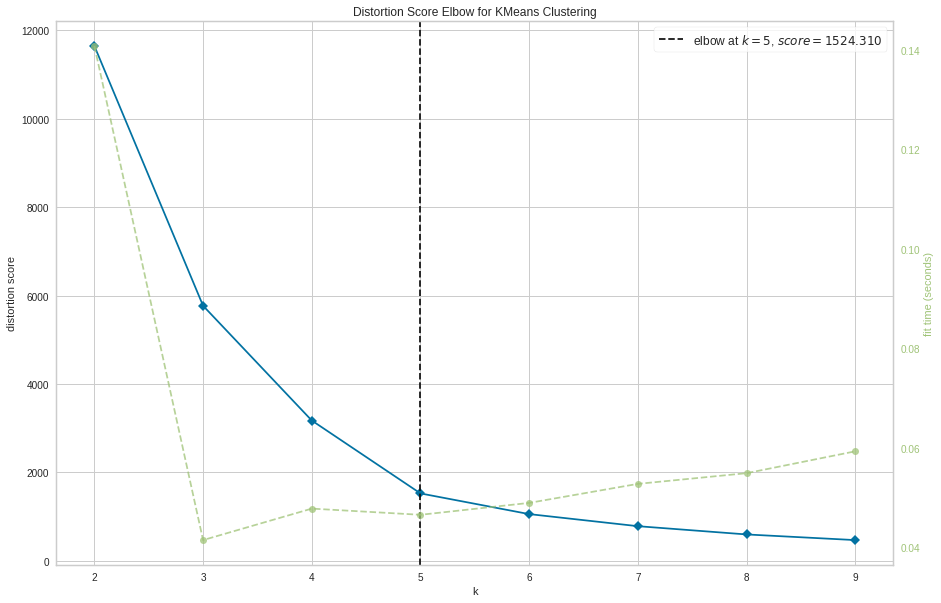

kaufland The Elbow Method for Recency


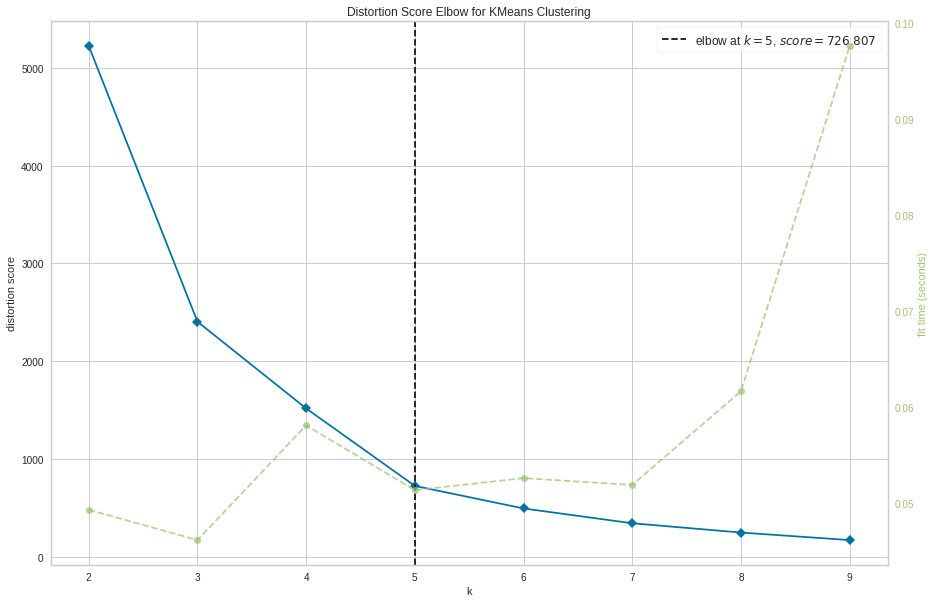

b2b The Elbow Method for Recency


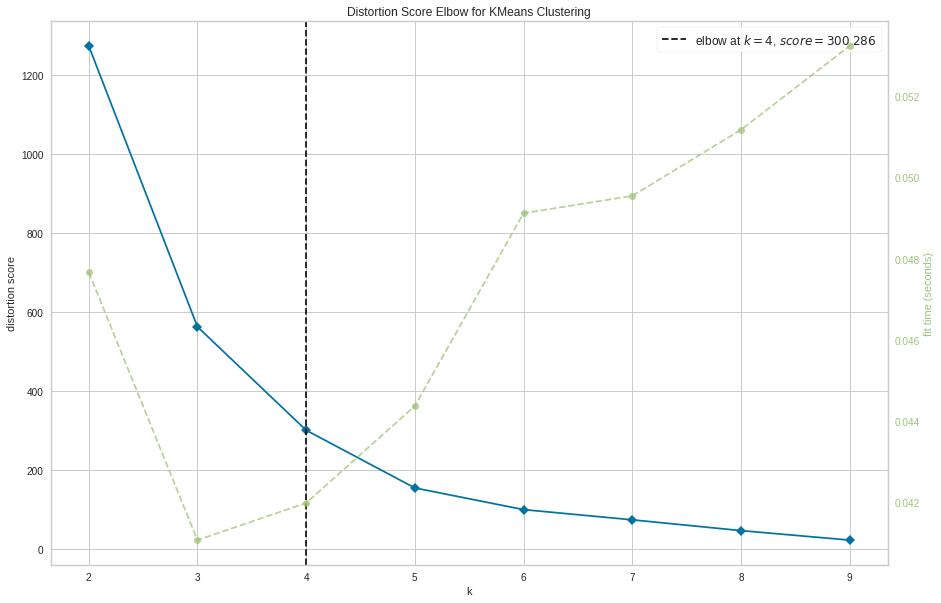

amazon The Elbow Method for Recency


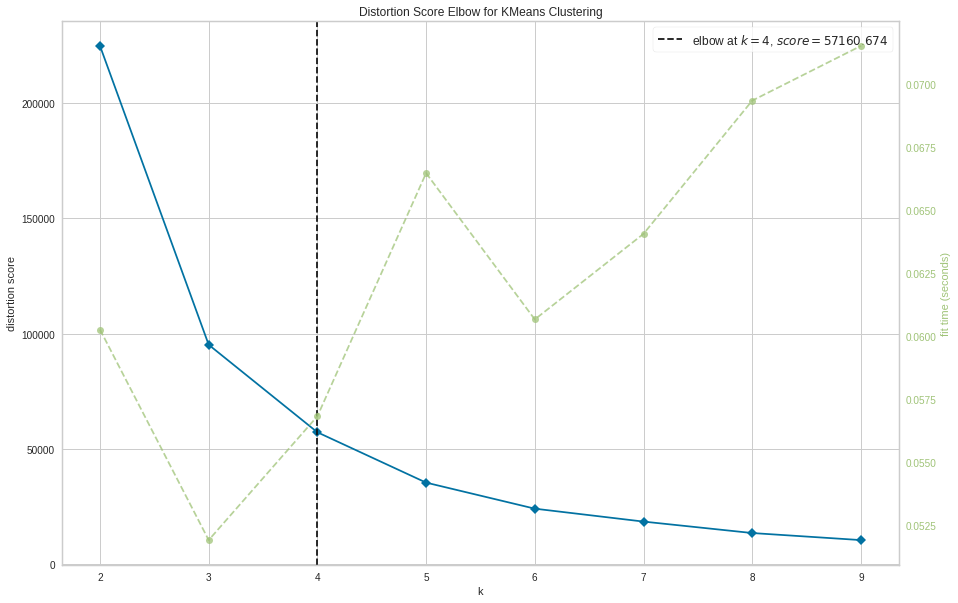

In [296]:
for i in range(len(customer_3ms)):
    print(platforms_string[i] + ' The Elbow Method for Recency')
    kmeans = KMeans()
    visu = KElbowVisualizer(kmeans, k = (2,10))
    visu.fit(customer_3ms[i][['Recency']])
    visu.poof(); # poof: Yellowbrick kütüphanesinin temel çizdirme metodu

In [297]:
recency_ks =[5,5,4,4] 

In [298]:
for i in range(len(customer_3ms)):
    kmeans = KMeans(n_clusters = recency_ks[i])
    kmeans.fit(customer_3ms[i][['Recency']])
    customer_3ms[i]['RecencyCluster'] = kmeans.predict(customer_3ms[i][['Recency']])
    customer_3ms[i] = order_cluster('RecencyCluster', 'Recency',customer_3ms[i] ,False)
    

In [299]:
customer_3ms[0] 

,Customer,Recency,RecencyCluster
0,IDKundenID5657,12,3
1,IDKundenID20416,13,3
2,IDKundenID19728,12,3
3,IDKundenID19732,11,3
4,IDKundenID12006,15,3
...,...,...,...
183,IDKundenID10155,40,1
184,IDKundenID9,34,1
185,IDKundenID17951,43,1
186,IDKundenID17952,33,1


In [300]:
customer_3m_ebay = customer_3ms[0]
customer_3m_kaufland = customer_3ms[1]
customer_3m_b2b = customer_3ms[2]
customer_3m_amazon = customer_3ms[3]

In [301]:
customer_3m_ebay

,Customer,Recency,RecencyCluster
0,IDKundenID5657,12,3
1,IDKundenID20416,13,3
2,IDKundenID19728,12,3
3,IDKundenID19732,11,3
4,IDKundenID12006,15,3
...,...,...,...
183,IDKundenID10155,40,1
184,IDKundenID9,34,1
185,IDKundenID17951,43,1
186,IDKundenID17952,33,1


In [302]:
customer_3ms = [customer_3m_ebay, customer_3m_kaufland,customer_3m_b2b, customer_3m_amazon ]

In [303]:
for i in range(len(customer_3ms)):
    #calcuate frequency score
    frequency = delivery_3ms[i].groupby('Customer').fatura_tarihi.count().reset_index()
    print(frequency)
    frequency.columns = ['Customer','Frequency']
    customer_3ms[i] = pd.merge(customer_3ms[i], frequency, on='Customer')

    

            Customer  fatura_tarihi
0    IDKundenID10039              1
1    IDKundenID10132              1
2    IDKundenID10133              1
3    IDKundenID10134              1
4    IDKundenID10135              1
..               ...            ...
183    IDKundenID843              1
184      IDKundenID9              1
185    IDKundenID904              1
186    IDKundenID905              1
187   IDKundenID9956              1

[188 rows x 2 columns]
           Customer  fatura_tarihi
0   IDKundenID10000              1
1   IDKundenID10071              1
2   IDKundenID10119              1
3   IDKundenID10338              1
4   IDKundenID10554              1
..              ...            ...
70   IDKundenID9305              1
71   IDKundenID9787              1
72   IDKundenID9976              1
73   IDKundenID9998              1
74   IDKundenID9999              1

[75 rows x 2 columns]
   Customer  fatura_tarihi
0       ID0             38
1   ID10955             54
2   ID11143         

In [304]:
customer_3ms[0]

,Customer,Recency,RecencyCluster,Frequency
0,IDKundenID5657,12,3,1
1,IDKundenID20416,13,3,1
2,IDKundenID19728,12,3,1
3,IDKundenID19732,11,3,1
4,IDKundenID12006,15,3,1
...,...,...,...,...
183,IDKundenID10155,40,1,1
184,IDKundenID9,34,1,1
185,IDKundenID17951,43,1,1
186,IDKundenID17952,33,1,1


In [305]:
customer_3m_ebay

,Customer,Recency,RecencyCluster
0,IDKundenID5657,12,3
1,IDKundenID20416,13,3
2,IDKundenID19728,12,3
3,IDKundenID19732,11,3
4,IDKundenID12006,15,3
...,...,...,...
183,IDKundenID10155,40,1
184,IDKundenID9,34,1
185,IDKundenID17951,43,1
186,IDKundenID17952,33,1


In [306]:
#for i in range(len(customer_3ms)):
    #del customer_3ms[i]['Frequency_x'] #, 'Frequency_y']
#    del customer_3ms[i]['Frequency_y']

In [307]:
customer_3m_ebay = customer_3ms[0]
customer_3m_kaufland = customer_3ms[1]
customer_3m_b2b = customer_3ms[2]
customer_3m_amazon = customer_3ms[3]

In [308]:
customer_3m_ebay.Frequency.value_counts()

1    188
Name: Frequency, dtype: int64

In [309]:
customer_3m_kaufland.Frequency. value_counts()

1    75
Name: Frequency, dtype: int64

In [310]:
customer_3m_b2b.Frequency.value_counts()

2     5
7     2
1     1
81    1
6     1
54    1
21    1
20    1
18    1
9     1
10    1
8     1
38    1
5     1
4     1
3     1
24    1
Name: Frequency, dtype: int64

In [311]:
customer_3m_amazon.Frequency.value_counts()

1    3054
Name: Frequency, dtype: int64

except b2b frequency in the last 3 months is 1 for all customers. so we have 1 cluster.  

ebay The Elbow Method for Frequency


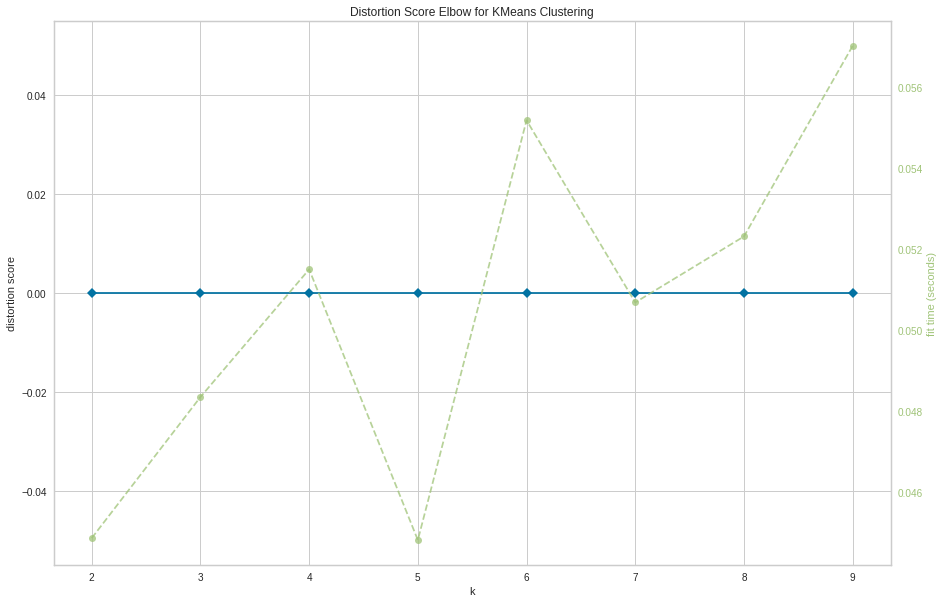

kaufland The Elbow Method for Frequency


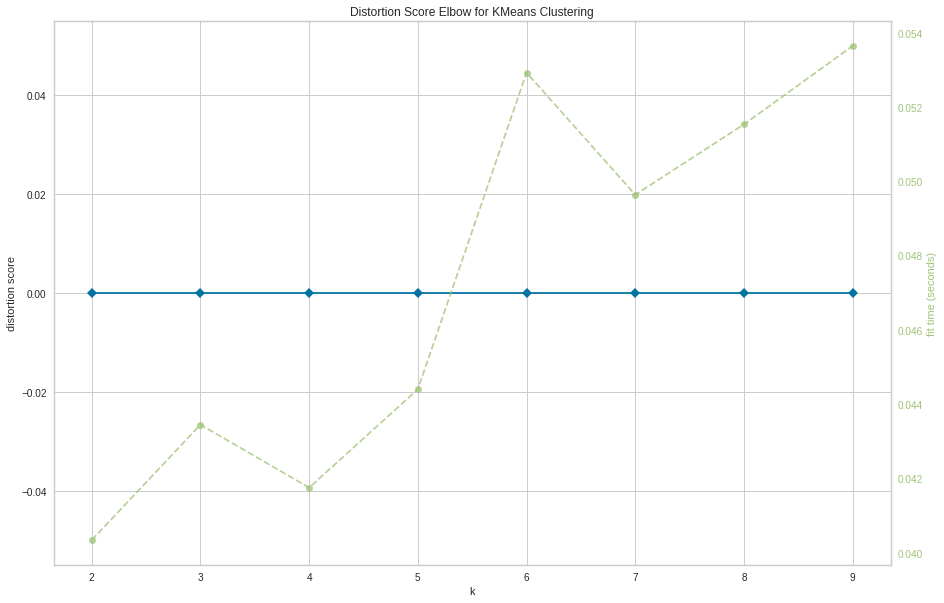

b2b The Elbow Method for Frequency


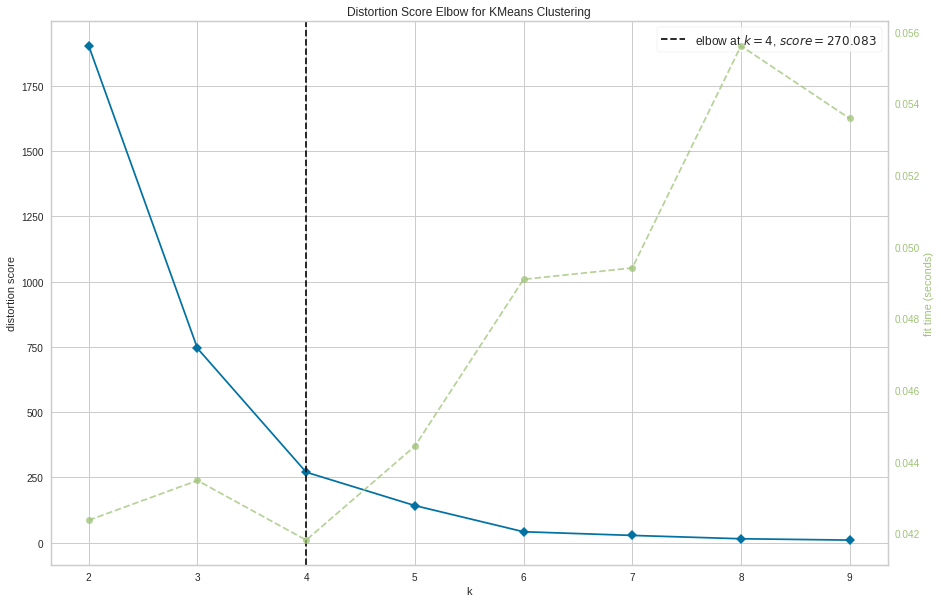

amazon The Elbow Method for Frequency


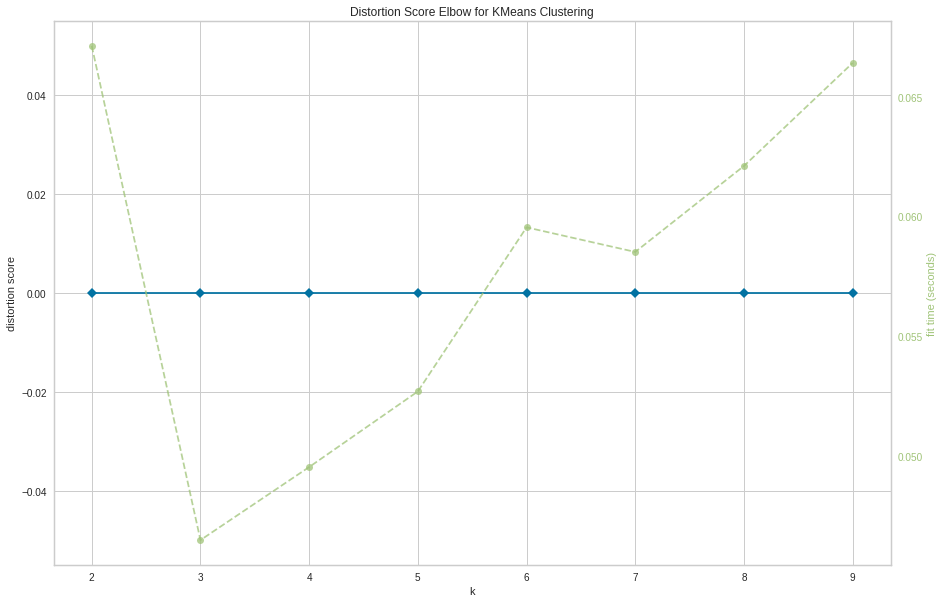

In [312]:
for i in range(len(customer_3ms)):
    print(platforms_string[i] + ' The Elbow Method for Frequency')
    kmeans = KMeans()
    visu = KElbowVisualizer(kmeans, k = (2,10))
    visu.fit(customer_3ms[i][['Frequency']])
    visu.poof(); # poof: Yellowbrick kütüphanesinin temel çizdirme metodu

In [313]:
customer_3ms[0]

,Customer,Recency,RecencyCluster,Frequency
0,IDKundenID5657,12,3,1
1,IDKundenID20416,13,3,1
2,IDKundenID19728,12,3,1
3,IDKundenID19732,11,3,1
4,IDKundenID12006,15,3,1
...,...,...,...,...
183,IDKundenID10155,40,1,1
184,IDKundenID9,34,1,1
185,IDKundenID17951,43,1,1
186,IDKundenID17952,33,1,1


In [314]:
frequency_ks = [1,1,4, 1]

In [315]:
for i in range(len(customer_3ms)):
    kmeans = KMeans(n_clusters = frequency_ks[i])
    kmeans.fit(customer_3ms[i][['Frequency']])
    customer_3ms[i]['FrequencyCluster'] = kmeans.predict(customer_3ms[i][['Frequency']])
    customer_3ms[i] = order_cluster('FrequencyCluster', 'Frequency',customer_3ms[i] ,True)
    

In [316]:
customer_3ms[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster
0,IDKundenID5657,12,3,1,0
1,IDKundenID20416,13,3,1,0
2,IDKundenID19728,12,3,1,0
3,IDKundenID19732,11,3,1,0
4,IDKundenID12006,15,3,1,0
...,...,...,...,...,...
183,IDKundenID10155,40,1,1,0
184,IDKundenID9,34,1,1,0
185,IDKundenID17951,43,1,1,0
186,IDKundenID17952,33,1,1,0


In [317]:
for i in range(len(customer_3ms)):
    #calcuate monetary score
    monetary = delivery_3ms[i].groupby('Customer').ciro.sum().reset_index()
    customer_3ms[i] = pd.merge(customer_3ms[i], monetary, on='Customer')

    

In [318]:
customer_3ms[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,ciro
0,IDKundenID5657,12,3,1,0,2.56
1,IDKundenID20416,13,3,1,0,3.78
2,IDKundenID19728,12,3,1,0,4.45
3,IDKundenID19732,11,3,1,0,4.45
4,IDKundenID12006,15,3,1,0,4.54
...,...,...,...,...,...,...
183,IDKundenID10155,40,1,1,0,45.40
184,IDKundenID9,34,1,1,0,46.72
185,IDKundenID17951,43,1,1,0,58.20
186,IDKundenID17952,33,1,1,0,58.20


In [319]:
for i in range(len(customer_3ms)):
    #calcuate monetary score
    customer_3ms[i]['Monetary'] = customer_3ms[i]['ciro']
    del customer_3ms[i]['ciro']

    

In [320]:
customer_3ms[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary
0,IDKundenID5657,12,3,1,0,2.56
1,IDKundenID20416,13,3,1,0,3.78
2,IDKundenID19728,12,3,1,0,4.45
3,IDKundenID19732,11,3,1,0,4.45
4,IDKundenID12006,15,3,1,0,4.54
...,...,...,...,...,...,...
183,IDKundenID10155,40,1,1,0,45.40
184,IDKundenID9,34,1,1,0,46.72
185,IDKundenID17951,43,1,1,0,58.20
186,IDKundenID17952,33,1,1,0,58.20


In [321]:
customer_3m_ebay = customer_3ms[0]
customer_3m_kaufland = customer_3ms[1]
customer_3m_b2b = customer_3ms[2]
customer_3m_amazon = customer_3ms[3]

ebay The Elbow Method for Monetary


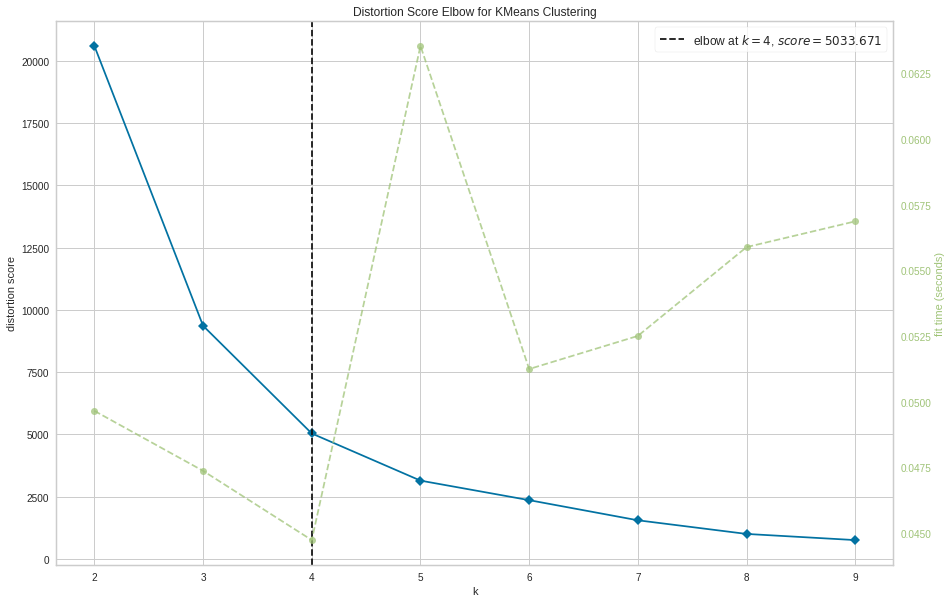

kaufland The Elbow Method for Monetary


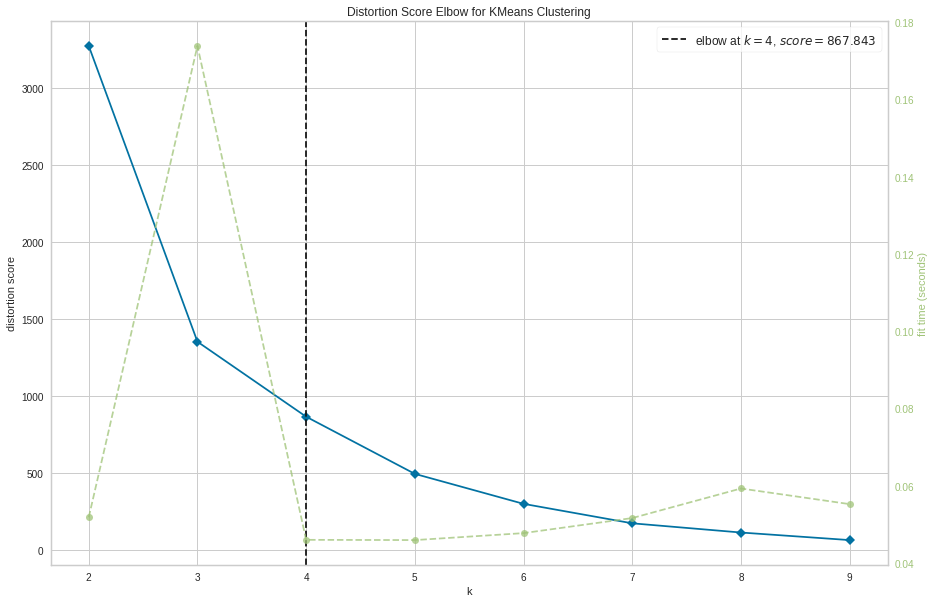

b2b The Elbow Method for Monetary


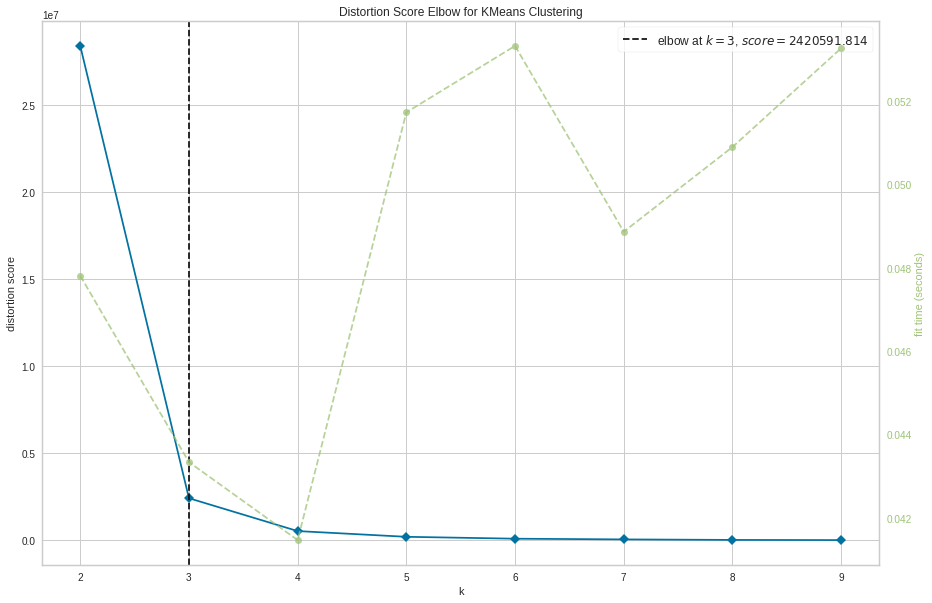

amazon The Elbow Method for Monetary


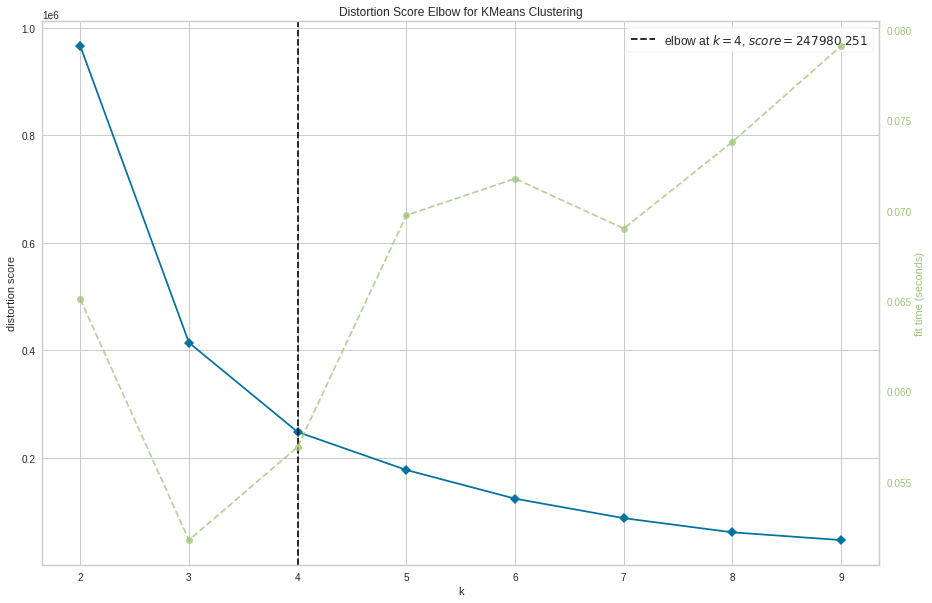

In [322]:
for i in range(len(customer_3ms)):
    print(platforms_string[i] + ' The Elbow Method for Monetary')
    kmeans = KMeans()
    visu = KElbowVisualizer(kmeans, k = (2,10))
    visu.fit(customer_3ms[i][['Monetary']])
    visu.poof(); # poof: Yellowbrick kütüphanesinin temel çizdirme metodu

In [323]:
monetary_ks= [4,4,3,4]

In [324]:
for i in range(len(customer_3ms)):
    kmeans = KMeans(n_clusters = monetary_ks[i])
    kmeans.fit(customer_3ms[i][['Monetary']])
    customer_3ms[i]['MonetaryCluster'] = kmeans.predict(customer_3ms[i][['Monetary']])
    customer_3ms[i] = order_cluster('MonetaryCluster', 'Monetary',customer_3ms[i] ,True)
    

In [325]:
customer_3ms[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster
0,IDKundenID5657,12,3,1,0,2.56,0
1,IDKundenID20416,13,3,1,0,3.78,0
2,IDKundenID19728,12,3,1,0,4.45,0
3,IDKundenID19732,11,3,1,0,4.45,0
4,IDKundenID12006,15,3,1,0,4.54,0
...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3
184,IDKundenID5867,10,3,1,0,104.72,3
185,IDKundenID13194,5,4,1,0,79.42,3
186,IDKundenID5584,2,4,1,0,88.92,3


In [326]:
for i in range(len(customer_3ms)):
    customer_3ms[i]['OverallScore'] = customer_3ms[i]['RecencyCluster'] + customer_3ms[i]['FrequencyCluster'] + customer_3ms[i]['MonetaryCluster']
    customer_3ms[i]['Segment'] = 'Low-Value'
    customer_3ms[i].loc[customer_3ms[i]['OverallScore']>2,'Segment'] = 'Mid-Value' 
    customer_3ms[i].loc[customer_3ms[i]['OverallScore']>5,'Segment'] = 'High-Value' 
    

In [327]:
customer_3ms[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment
0,IDKundenID5657,12,3,1,0,2.56,0,3,Mid-Value
1,IDKundenID20416,13,3,1,0,3.78,0,3,Mid-Value
2,IDKundenID19728,12,3,1,0,4.45,0,3,Mid-Value
3,IDKundenID19732,11,3,1,0,4.45,0,3,Mid-Value
4,IDKundenID12006,15,3,1,0,4.54,0,3,Mid-Value
...,...,...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3,6,High-Value
184,IDKundenID5867,10,3,1,0,104.72,3,6,High-Value
185,IDKundenID13194,5,4,1,0,79.42,3,7,High-Value
186,IDKundenID5584,2,4,1,0,88.92,3,7,High-Value


In [328]:
customer_3m_ebay = customer_3ms[0]
customer_3m_kaufland = customer_3ms[1]
customer_3m_b2b = customer_3ms[2]
customer_3m_amazon = customer_3ms[3]

In [329]:
customer_3m_ebay

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment
0,IDKundenID5657,12,3,1,0,2.56,0,3,Mid-Value
1,IDKundenID20416,13,3,1,0,3.78,0,3,Mid-Value
2,IDKundenID19728,12,3,1,0,4.45,0,3,Mid-Value
3,IDKundenID19732,11,3,1,0,4.45,0,3,Mid-Value
4,IDKundenID12006,15,3,1,0,4.54,0,3,Mid-Value
...,...,...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3,6,High-Value
184,IDKundenID5867,10,3,1,0,104.72,3,6,High-Value
185,IDKundenID13194,5,4,1,0,79.42,3,7,High-Value
186,IDKundenID5584,2,4,1,0,88.92,3,7,High-Value


In [330]:
customer_3m_kaufland

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment
0,IDKundenID6753,29,2,1,0,4.19,0,2,Low-Value
1,IDKundenID14121,26,2,1,0,4.48,0,2,Low-Value
2,IDKundenID12,29,2,1,0,4.66,0,2,Low-Value
3,IDKundenID9999,28,2,1,0,4.66,0,2,Low-Value
4,IDKundenID20624,27,2,1,0,7.93,0,2,Low-Value
...,...,...,...,...,...,...,...,...,...
70,IDKundenID5390,30,2,1,0,46.72,3,5,Mid-Value
71,IDKundenID18136,18,3,1,0,42.05,3,6,High-Value
72,IDKundenID14374,10,3,1,0,48.59,3,6,High-Value
73,IDKundenID21833,1,4,1,0,61.68,3,7,High-Value


In [331]:
customer_3m_b2b

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment
0,ID18074,6,3,21,1,-4893.950000,0,4,Mid-Value
1,ID28541,10,3,18,1,339.360000,1,5,Mid-Value
2,ID28535,38,1,20,1,122.720000,1,3,Mid-Value
3,ID28538,30,1,24,1,334.757477,1,3,Mid-Value
4,ID10955,7,3,54,2,887.460374,1,6,High-Value
5,ID0,10,3,38,2,1327.543925,1,6,High-Value
6,ID18101,0,3,8,0,463.323255,1,4,Mid-Value
7,ID28528,10,3,2,0,39.117647,1,4,Mid-Value
8,ID28536,31,1,9,0,114.450000,1,2,Low-Value
9,ID14878,38,1,7,0,205.900000,1,2,Low-Value


In [332]:
customer_3m_amazon

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment
0,IDKundenID23303,9,3,1,0,0.00,0,3,Mid-Value
1,IDKundenID10469,9,3,1,0,0.00,0,3,Mid-Value
2,IDKundenID2975,9,3,1,0,0.00,0,3,Mid-Value
3,IDKundenID23248,9,3,1,0,0.00,0,3,Mid-Value
4,IDKundenID13959,9,3,1,0,0.00,0,3,Mid-Value
...,...,...,...,...,...,...,...,...,...
3049,IDKundenID20806,43,0,1,0,151.20,2,2,Low-Value
3050,IDKundenID13181,7,3,1,0,336.40,3,6,High-Value
3051,IDKundenID11605,2,3,1,0,489.20,3,6,High-Value
3052,IDKundenID13171,13,2,1,0,280.32,3,5,Mid-Value


In [333]:
for i in range(len(customer_3ms)):
    print(platforms_string[i])
    print(customer_3ms[i].Segment.value_counts())
    print()

ebay
Mid-Value     95
Low-Value     85
High-Value     8
Name: Segment, dtype: int64

kaufland
Mid-Value     38
Low-Value     33
High-Value     4
Name: Segment, dtype: int64

b2b
Mid-Value     10
Low-Value      9
High-Value     3
Name: Segment, dtype: int64

amazon
Low-Value     2013
Mid-Value     1039
High-Value       2
Name: Segment, dtype: int64



In [334]:
customer_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer,9.819524,0.805882,0.25,0.170435,0.051187,30.273280
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer,5.860598,0.944118,0.05,0.027705,0.023273,20.788769
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer,8.971963,0.910588,0.00,0.019391,0.045211,9.978630
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer,12.618655,0.891176,0.10,0.106742,0.070924,34.627463
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer,18.682243,0.891176,0.00,0.048757,0.113678,17.088950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer,3.780000,0.111765,0.00,0.003690,0.008602,0.425323
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer,7.480000,0.057059,0.00,0.014879,0.034691,0.792842
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer,3.260000,0.031765,0.00,0.002117,0.004936,0.336521
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer,10.270000,0.057059,0.00,0.023316,0.054363,1.088568


In [335]:
import plotly.offline as pyoff

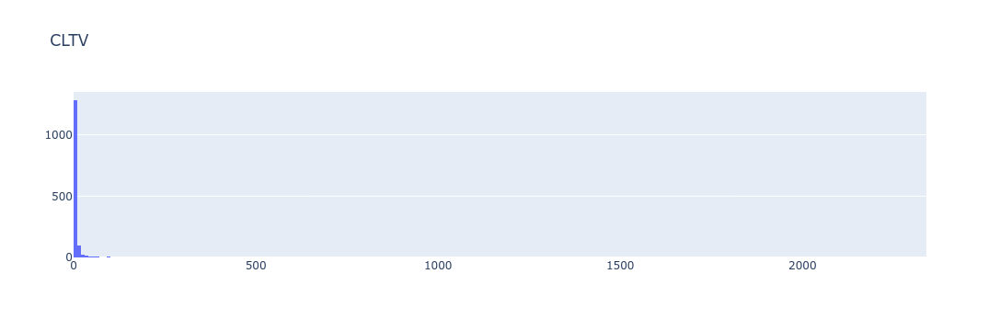

In [336]:
#plot LTV histogram
plot_data = [
    go.Histogram(
        x=customer_ebay['CLTV']
    )
]

plot_layout = go.Layout(
        title='CLTV'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [337]:
#!jupyter labextension list

In [338]:
#!jupyter labextension install jupyterlab-plotly

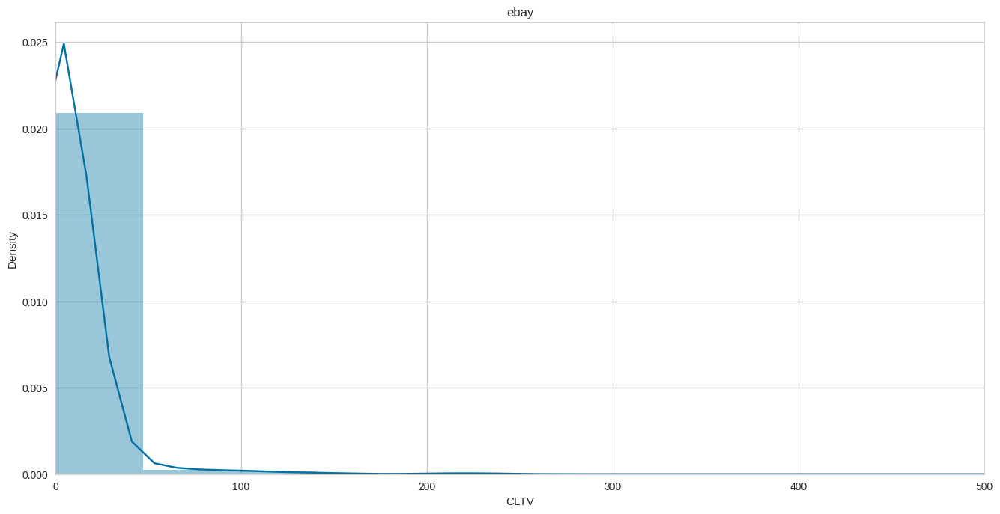

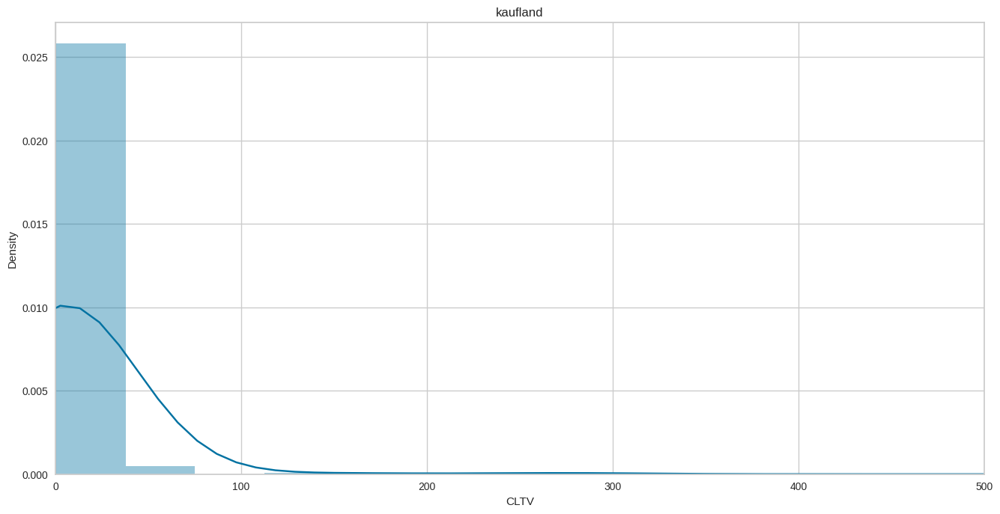

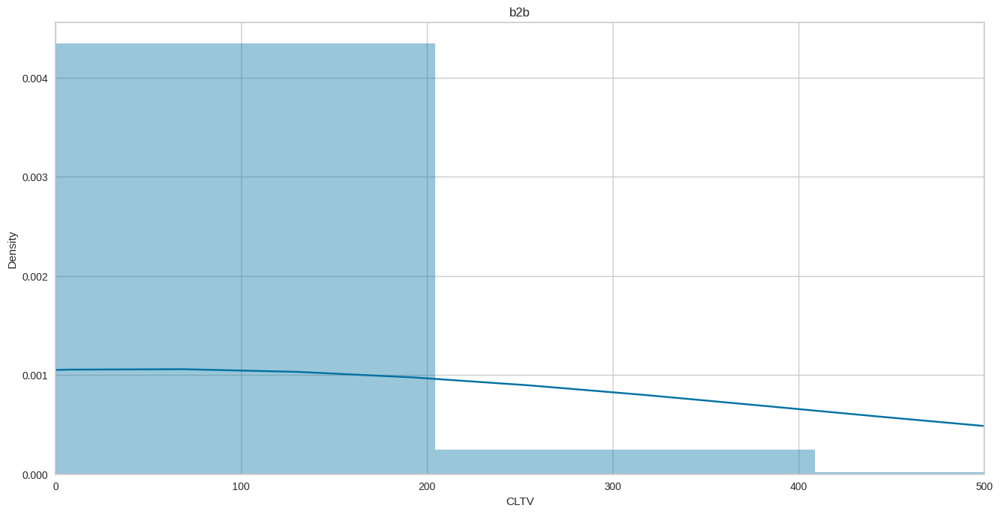

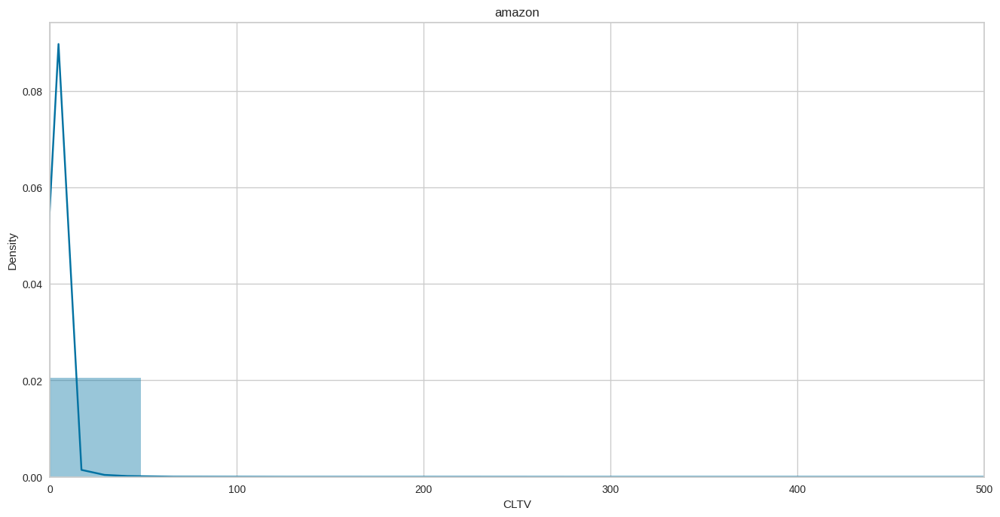

In [339]:
for i in range(len(platforms)):
    plt.figure(figsize=(16,8), dpi=100)
    sns.distplot(customers[i].CLTV)
    plt.title(platforms_string[i])
    plt.xlim(0, 500);

In [340]:
# Assume there is no cost so revenue becomes our LTV directly.

In [341]:
customer_6ms[0]

,Customer
0,ID27399
1,IDKundenID5657
2,IDKundenID19391
3,IDKundenID15796
4,IDKundenID19392
...,...
547,IDKundenID5867
548,IDKundenID5871
549,IDKundenID5964
550,IDKundenID22566


In [342]:
#calculate revenue and create a new dataframe for it
for i in range(len(platforms)):
    customer_6ms[i] = delivery_6ms[i].groupby('Customer')['ciro'].sum().reset_index()
    customer_6ms[i].columns = ['Customer','m6_Revenue']


In [343]:
customer_6ms[0]

,Customer,m6_Revenue
0,ID10129,26.050420
1,ID12422,38.453782
2,ID14261,67.613445
3,ID17751,20.168067
4,ID22693,37.184874
...,...,...
547,IDKundenID9892,3.780000
548,IDKundenID9893,7.480000
549,IDKundenID9956,3.260000
550,IDKundenID9957,10.270000


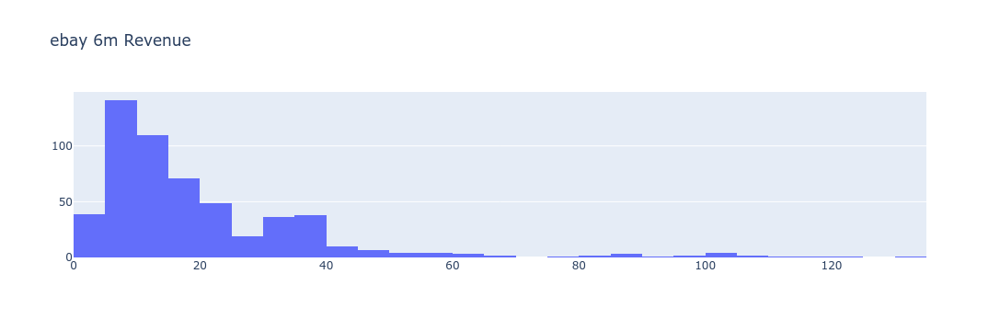

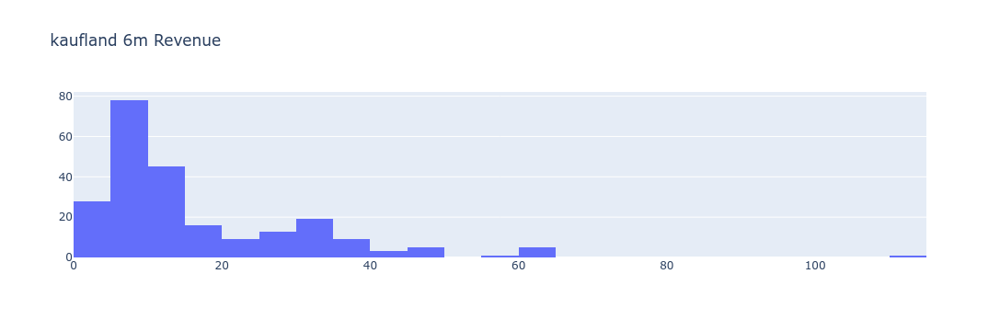

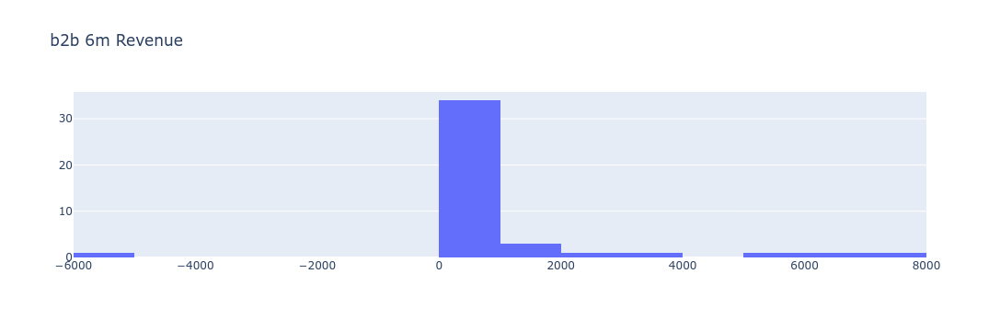

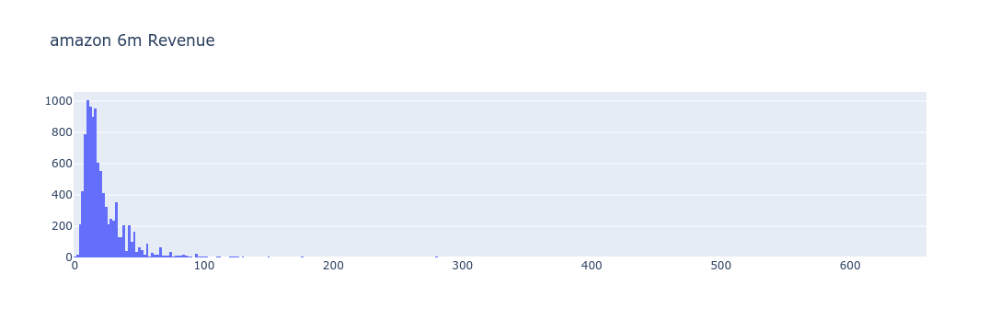

In [344]:

for i in range(len(customers)):
    #plot LTV histogram
    plot_data = [
        go.Histogram(
            x=customer_6ms[i].query('m6_Revenue < 10000')['m6_Revenue']
        )
    ]
    plot_layout = go.Layout(
            title=platforms_string[i]+' 6m Revenue'
        )
    fig = go.Figure(data=plot_data, layout=plot_layout)
    pyoff.iplot(fig)


In [345]:
#!jupyter labextension list

In [346]:
#!jupyter labextension install jupyterlab-plotly

In [347]:
df_merge_ebay =pd.DataFrame()
df_merge_kaufland = pd.DataFrame()
df_merge_b2b = pd.DataFrame()
df_merge_amazon = pd.DataFrame()

In [348]:
df_merges = [df_merge_ebay, df_merge_kaufland, df_merge_b2b, df_merge_amazon]

In [349]:

for i in range(len(df_merges)):
    print(platforms_string[i])
    df_merges[i]= pd.merge(customer_3ms[i], customer_6ms[i], on='Customer', how='left')
    df_merges[i]= df_merges[i].fillna(0)
    #print(customers[i])
    print()

ebay

kaufland

b2b

amazon



In [350]:
customer_3ms[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment
0,IDKundenID5657,12,3,1,0,2.56,0,3,Mid-Value
1,IDKundenID20416,13,3,1,0,3.78,0,3,Mid-Value
2,IDKundenID19728,12,3,1,0,4.45,0,3,Mid-Value
3,IDKundenID19732,11,3,1,0,4.45,0,3,Mid-Value
4,IDKundenID12006,15,3,1,0,4.54,0,3,Mid-Value
...,...,...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3,6,High-Value
184,IDKundenID5867,10,3,1,0,104.72,3,6,High-Value
185,IDKundenID13194,5,4,1,0,79.42,3,7,High-Value
186,IDKundenID5584,2,4,1,0,88.92,3,7,High-Value


In [351]:
df_merges[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment,m6_Revenue
0,IDKundenID5657,12,3,1,0,2.56,0,3,Mid-Value,2.56
1,IDKundenID20416,13,3,1,0,3.78,0,3,Mid-Value,3.78
2,IDKundenID19728,12,3,1,0,4.45,0,3,Mid-Value,4.45
3,IDKundenID19732,11,3,1,0,4.45,0,3,Mid-Value,4.45
4,IDKundenID12006,15,3,1,0,4.54,0,3,Mid-Value,4.54
...,...,...,...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3,6,High-Value,80.72
184,IDKundenID5867,10,3,1,0,104.72,3,6,High-Value,104.72
185,IDKundenID13194,5,4,1,0,79.42,3,7,High-Value,79.42
186,IDKundenID5584,2,4,1,0,88.92,3,7,High-Value,88.92


In [352]:
df_merge_ebay

""


In [353]:
df_merge_ebay = df_merges[0]
df_merge_kaufland = df_merges[1]
df_merge_b2b = df_merges[2]
df_merge_amazon = df_merges[3]

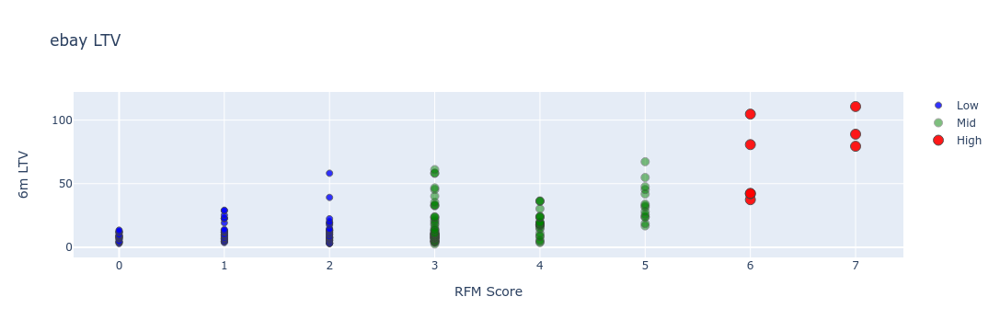

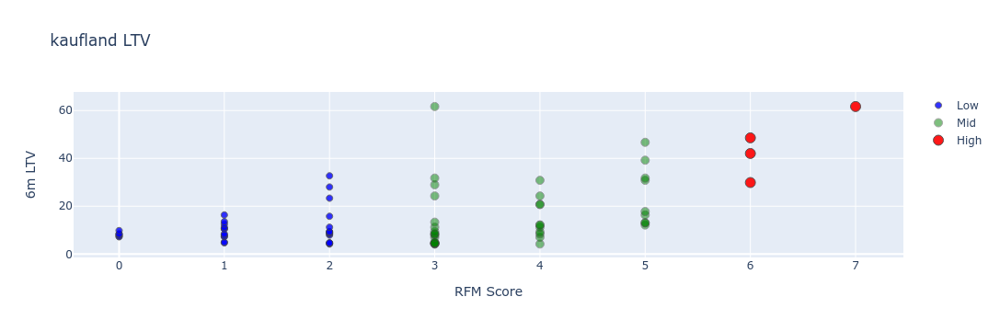

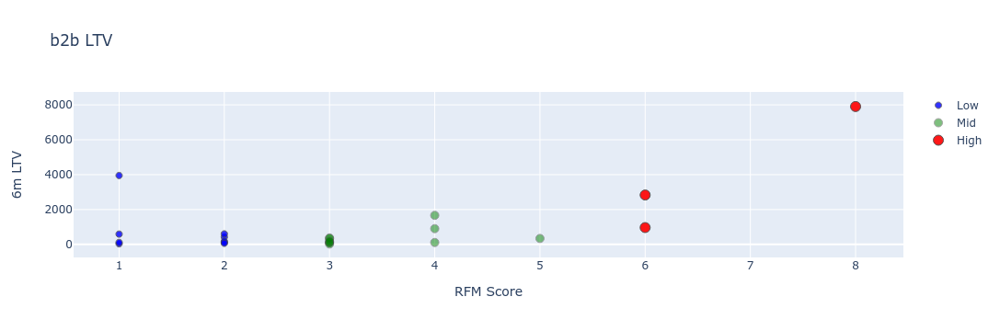

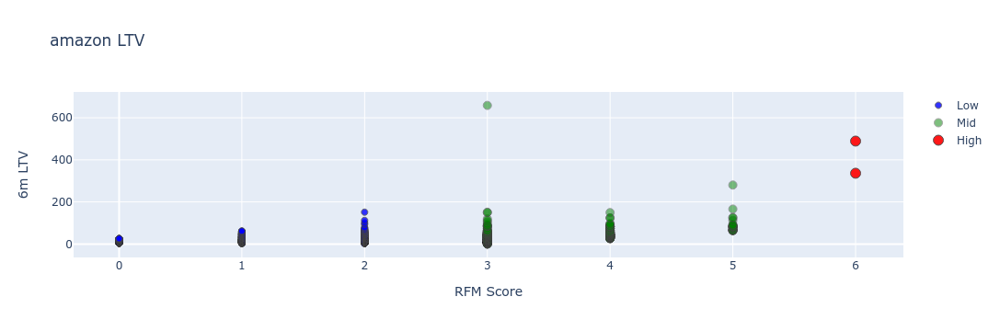

In [354]:
for i in range(len(df_merges)):
    df_merge_graph = df_merges[i].query("m6_Revenue < 30000")
    plot_data = [
        go.Scatter(
            x=df_merge_graph.query("Segment == 'Low-Value'")['OverallScore'],
            y=df_merge_graph.query("Segment == 'Low-Value'")['m6_Revenue'],
            mode='markers',
            name='Low',
            marker= dict(size= 7,
                line= dict(width=1),
                color= 'blue',
                opacity= 0.8
               )
        ),
            go.Scatter(
            x=df_merge_graph.query("Segment == 'Mid-Value'")['OverallScore'],
            y=df_merge_graph.query("Segment == 'Mid-Value'")['m6_Revenue'],
            mode='markers',
            name='Mid',
            marker= dict(size= 9,
                line= dict(width=1),
                color= 'green',
                opacity= 0.5
               )
        ),
            go.Scatter(
            x=df_merge_graph.query("Segment == 'High-Value'")['OverallScore'],
            y=df_merge_graph.query("Segment == 'High-Value'")['m6_Revenue'],
            mode='markers',
            name='High',
            marker= dict(size= 11,
                line= dict(width=1),
                color= 'red',
                opacity= 0.9
               )
        ),
    ]

    plot_layout = go.Layout(
            yaxis= {'title': "6m LTV"},
            xaxis= {'title': "RFM Score"},
            title=platforms_string[i] + ' LTV'
        )
    fig = go.Figure(data=plot_data, layout=plot_layout)
    pyoff.iplot(fig)


Positive correlation is quite visible here. High RFM score means high LTV.

We will apply clustering and have 3 segments (number of segments really depends on your business dynamics and goals): <br>
Low LTV<br>
Mid LTV<br>
High LTV

In [355]:
df_merges[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment,m6_Revenue
0,IDKundenID5657,12,3,1,0,2.56,0,3,Mid-Value,2.56
1,IDKundenID20416,13,3,1,0,3.78,0,3,Mid-Value,3.78
2,IDKundenID19728,12,3,1,0,4.45,0,3,Mid-Value,4.45
3,IDKundenID19732,11,3,1,0,4.45,0,3,Mid-Value,4.45
4,IDKundenID12006,15,3,1,0,4.54,0,3,Mid-Value,4.54
...,...,...,...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3,6,High-Value,80.72
184,IDKundenID5867,10,3,1,0,104.72,3,6,High-Value,104.72
185,IDKundenID13194,5,4,1,0,79.42,3,7,High-Value,79.42
186,IDKundenID5584,2,4,1,0,88.92,3,7,High-Value,88.92


ebay The Elbow Method for Monetary


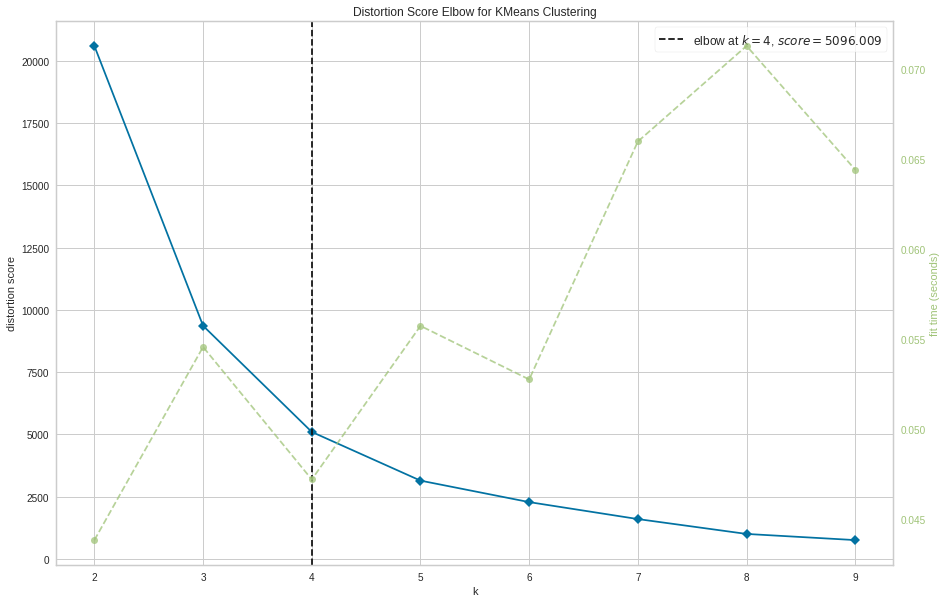

kaufland The Elbow Method for Monetary


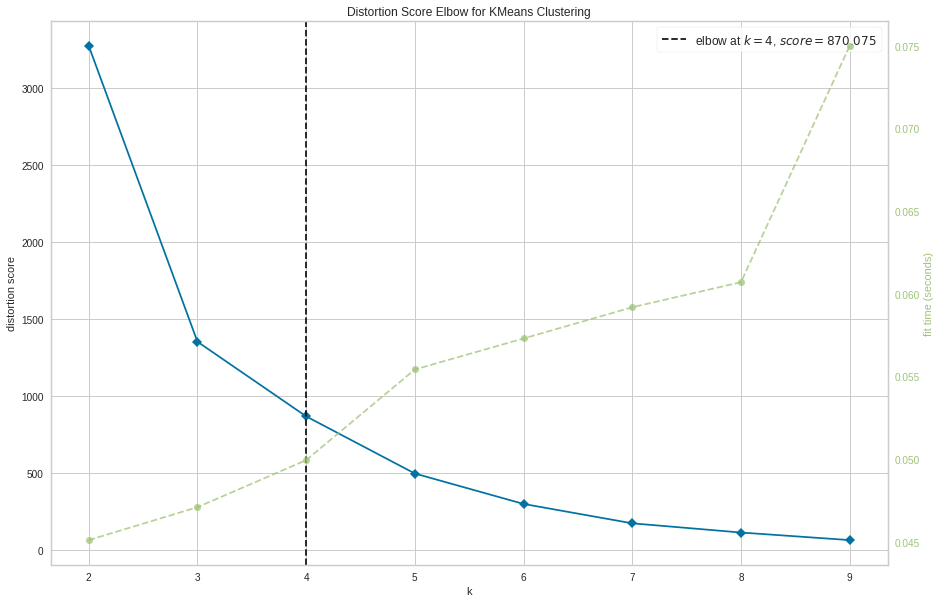

b2b The Elbow Method for Monetary


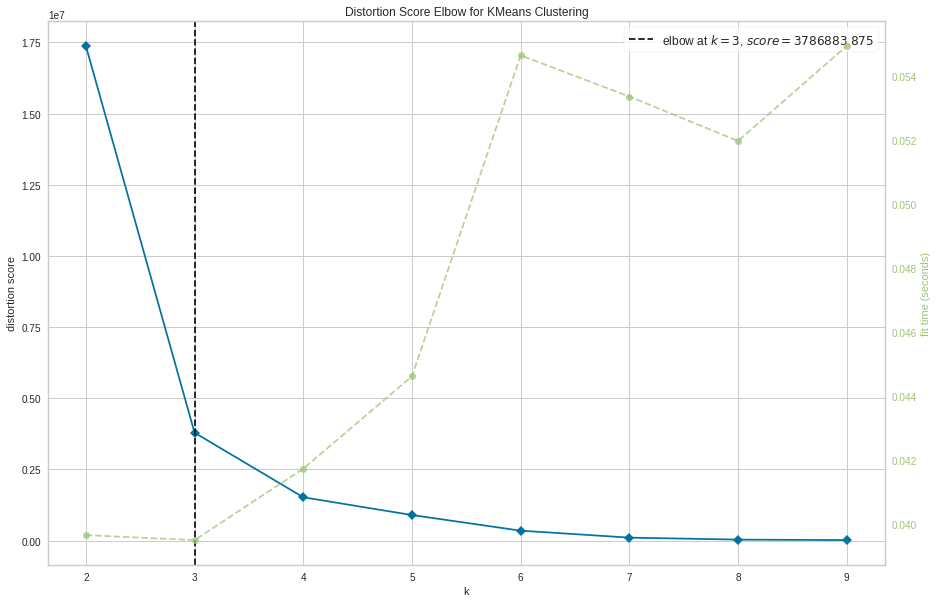

amazon The Elbow Method for Monetary


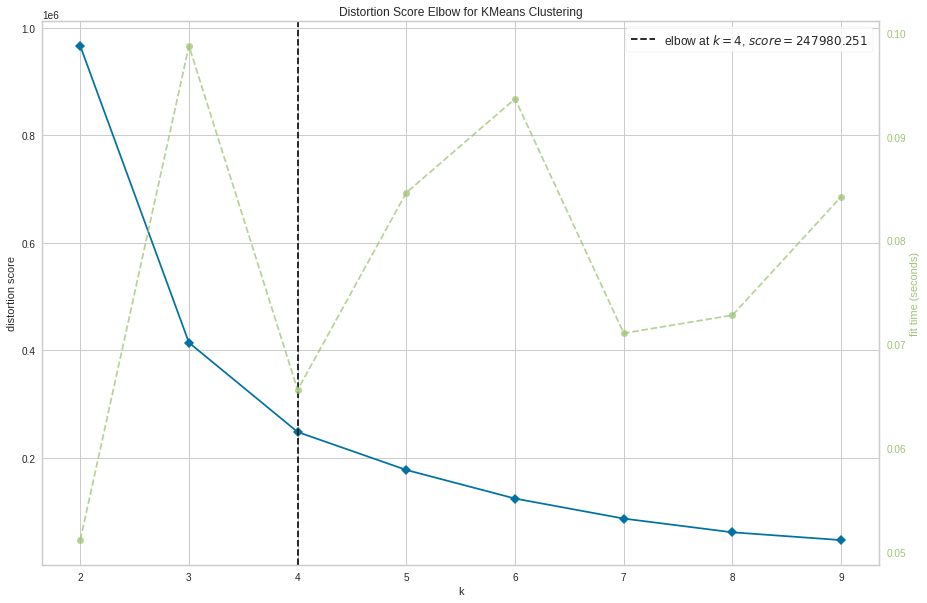

In [356]:
for i in range(len(df_merges)):
    print(platforms_string[i] + ' The Elbow Method for Monetary')
    kmeans = KMeans()
    visu = KElbowVisualizer(kmeans, k = (2,10))
    visu.fit(df_merges[i][['m6_Revenue']])
    visu.poof(); # poof: Yellowbrick kütüphanesinin temel çizdirme metodu

In [357]:
merges_ks = [4,4,3,4]

In [358]:
for i in range(len(customer_3ms)):
    kmeans = KMeans(n_clusters=merges_ks[i])
    kmeans.fit(df_merges[i][['m6_Revenue']])
    df_merges[i]['LTVCluster'] = kmeans.predict(df_merges[i][['m6_Revenue']])
    df_merges[i] = order_cluster('LTVCluster', 'm6_Revenue', df_merges[i] , True)

    

In [359]:
df_merge_ebay = df_merges[0]
df_merge_kaufland = df_merges[1]
df_merge_b2b = df_merges[2]
df_merge_amazon = df_merges[3]

In [360]:
df_merge_ebay

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment,m6_Revenue,LTVCluster
0,IDKundenID5657,12,3,1,0,2.56,0,3,Mid-Value,2.56,0
1,IDKundenID20416,13,3,1,0,3.78,0,3,Mid-Value,3.78,0
2,IDKundenID19728,12,3,1,0,4.45,0,3,Mid-Value,4.45,0
3,IDKundenID19732,11,3,1,0,4.45,0,3,Mid-Value,4.45,0
4,IDKundenID12006,15,3,1,0,4.54,0,3,Mid-Value,4.54,0
...,...,...,...,...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3,6,High-Value,80.72,3
184,IDKundenID5867,10,3,1,0,104.72,3,6,High-Value,104.72,3
185,IDKundenID13194,5,4,1,0,79.42,3,7,High-Value,79.42,3
186,IDKundenID5584,2,4,1,0,88.92,3,7,High-Value,88.92,3


In [361]:
df_merge_kaufland

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment,m6_Revenue,LTVCluster
0,IDKundenID6753,29,2,1,0,4.19,0,2,Low-Value,4.19,0
1,IDKundenID14121,26,2,1,0,4.48,0,2,Low-Value,4.48,0
2,IDKundenID12,29,2,1,0,4.66,0,2,Low-Value,4.66,0
3,IDKundenID9999,28,2,1,0,4.66,0,2,Low-Value,4.66,0
4,IDKundenID20624,27,2,1,0,7.93,0,2,Low-Value,7.93,0
...,...,...,...,...,...,...,...,...,...,...,...
70,IDKundenID5390,30,2,1,0,46.72,3,5,Mid-Value,46.72,3
71,IDKundenID18136,18,3,1,0,42.05,3,6,High-Value,42.05,3
72,IDKundenID14374,10,3,1,0,48.59,3,6,High-Value,48.59,3
73,IDKundenID21833,1,4,1,0,61.68,3,7,High-Value,61.68,3


In [362]:
df_merge_b2b

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment,m6_Revenue,LTVCluster
0,ID18074,6,3,21,1,-4893.950000,0,4,Mid-Value,1666.300000,0
1,ID28541,10,3,18,1,339.360000,1,5,Mid-Value,339.360000,0
2,ID28535,38,1,20,1,122.720000,1,3,Mid-Value,122.720000,0
3,ID28538,30,1,24,1,334.757477,1,3,Mid-Value,334.757477,0
4,ID10955,7,3,54,2,887.460374,1,6,High-Value,965.098870,0
5,ID18101,0,3,8,0,463.323255,1,4,Mid-Value,902.283255,0
6,ID28528,10,3,2,0,39.117647,1,4,Mid-Value,110.117647,0
7,ID28536,31,1,9,0,114.450000,1,2,Low-Value,114.450000,0
8,ID14878,38,1,7,0,205.900000,1,2,Low-Value,424.937000,0
9,ID28518,29,1,2,0,176.070000,1,2,Low-Value,176.070000,0


In [363]:
df_merge_amazon

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment,m6_Revenue,LTVCluster
0,IDKundenID23303,9,3,1,0,0.00,0,3,Mid-Value,0.00,0
1,IDKundenID10469,9,3,1,0,0.00,0,3,Mid-Value,0.00,0
2,IDKundenID2975,9,3,1,0,0.00,0,3,Mid-Value,0.00,0
3,IDKundenID23248,9,3,1,0,0.00,0,3,Mid-Value,0.00,0
4,IDKundenID13959,9,3,1,0,0.00,0,3,Mid-Value,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...
3049,IDKundenID20806,43,0,1,0,151.20,2,2,Low-Value,151.20,2
3050,IDKundenID13181,7,3,1,0,336.40,3,6,High-Value,336.40,3
3051,IDKundenID11605,2,3,1,0,489.20,3,6,High-Value,489.20,3
3052,IDKundenID13171,13,2,1,0,280.32,3,5,Mid-Value,280.32,3


In [364]:
#see details of the clusters
df_merge_ebay.groupby('LTVCluster')['m6_Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
LTVCluster,,,,,,,,
0,118.0,8.481610,3.294849,2.56,5.880,8.40,10.9275,15.58
1,45.0,23.131333,5.131024,16.80,18.870,22.70,25.2200,33.95
2,20.0,46.507000,9.743341,35.30,38.745,43.87,55.7100,67.28
3,5.0,92.890000,14.154399,79.42,80.720,88.92,104.7200,110.67


In [365]:
#see details of the clusters
df_merge_kaufland.groupby('LTVCluster')['m6_Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
LTVCluster,,,,,,,,
0,38.0,6.888947,1.949370,4.19,4.660,7.480,8.4000,9.80
1,20.0,13.783500,3.147293,10.55,11.210,12.815,15.9225,20.74
2,12.0,29.664167,4.402769,23.36,27.095,30.365,31.7700,39.24
3,5.0,52.144000,9.025106,42.05,46.720,48.590,61.6800,61.68


In [366]:
df_merge_b2b.groupby('LTVCluster')['m6_Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
LTVCluster,,,,,,,,
0,19.0,379.991379,419.159431,22.877647,110.753824,176.070000,506.791833,1666.300000
1,2.0,3391.133832,790.177554,2832.393925,3111.763879,3391.133832,3670.503785,3949.873738
2,1.0,7906.090000,NaN,7906.090000,7906.090000,7906.090000,7906.090000,7906.090000


In [367]:
df_merge_amazon.groupby('LTVCluster')['m6_Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
LTVCluster,,,,,,,,
0,2231.0,13.477172,5.340199,0.00,9.3400,12.96,17.4800,25.57
1,729.0,38.314486,8.466920,26.12,31.7700,37.29,42.9800,61.65
2,90.0,85.486778,22.638303,63.12,68.6775,82.58,88.9100,166.12
3,4.0,441.217500,169.886703,280.32,322.3800,412.80,531.6375,658.95


In [368]:
df_merges[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,Segment,m6_Revenue,LTVCluster
0,IDKundenID5657,12,3,1,0,2.56,0,3,Mid-Value,2.56,0
1,IDKundenID20416,13,3,1,0,3.78,0,3,Mid-Value,3.78,0
2,IDKundenID19728,12,3,1,0,4.45,0,3,Mid-Value,4.45,0
3,IDKundenID19732,11,3,1,0,4.45,0,3,Mid-Value,4.45,0
4,IDKundenID12006,15,3,1,0,4.54,0,3,Mid-Value,4.54,0
...,...,...,...,...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3,6,High-Value,80.72,3
184,IDKundenID5867,10,3,1,0,104.72,3,6,High-Value,104.72,3
185,IDKundenID13194,5,4,1,0,79.42,3,7,High-Value,79.42,3
186,IDKundenID5584,2,4,1,0,88.92,3,7,High-Value,88.92,3


In [369]:
#for i in range(len(df_merges)):
#    df_merges[i].Customer = df_merges[i].Customer.str.replace("IDKundenID", "999")
#    df_merges[i].Customer = df_merges[i].Customer.str.replace("ID", "99")

In [370]:
#convert categorical columns to numerical
df_class_ebay = pd.get_dummies(df_merge_ebay, columns=['Segment'])
df_class_kaufland = pd.get_dummies(df_merge_kaufland, columns=['Segment'])
df_class_b2b = pd.get_dummies(df_merge_b2b, columns=['Segment'])
df_class_amazon = pd.get_dummies(df_merge_amazon, columns=['Segment'])

In [371]:
df_class_ebay

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,m6_Revenue,LTVCluster,Segment_High-Value,Segment_Low-Value,Segment_Mid-Value
0,IDKundenID5657,12,3,1,0,2.56,0,3,2.56,0,0,0,1
1,IDKundenID20416,13,3,1,0,3.78,0,3,3.78,0,0,0,1
2,IDKundenID19728,12,3,1,0,4.45,0,3,4.45,0,0,0,1
3,IDKundenID19732,11,3,1,0,4.45,0,3,4.45,0,0,0,1
4,IDKundenID12006,15,3,1,0,4.54,0,3,4.54,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3,6,80.72,3,1,0,0
184,IDKundenID5867,10,3,1,0,104.72,3,6,104.72,3,1,0,0
185,IDKundenID13194,5,4,1,0,79.42,3,7,79.42,3,1,0,0
186,IDKundenID5584,2,4,1,0,88.92,3,7,88.92,3,1,0,0


In [372]:
df_classes = [df_class_ebay, df_class_kaufland, df_class_b2b, df_class_amazon]

In [373]:
df_classes[0]

,Customer,Recency,RecencyCluster,Frequency,FrequencyCluster,Monetary,MonetaryCluster,OverallScore,m6_Revenue,LTVCluster,Segment_High-Value,Segment_Low-Value,Segment_Mid-Value
0,IDKundenID5657,12,3,1,0,2.56,0,3,2.56,0,0,0,1
1,IDKundenID20416,13,3,1,0,3.78,0,3,3.78,0,0,0,1
2,IDKundenID19728,12,3,1,0,4.45,0,3,4.45,0,0,0,1
3,IDKundenID19732,11,3,1,0,4.45,0,3,4.45,0,0,0,1
4,IDKundenID12006,15,3,1,0,4.54,0,3,4.54,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
183,IDKundenID5866,18,3,1,0,80.72,3,6,80.72,3,1,0,0
184,IDKundenID5867,10,3,1,0,104.72,3,6,104.72,3,1,0,0
185,IDKundenID13194,5,4,1,0,79.42,3,7,79.42,3,1,0,0
186,IDKundenID5584,2,4,1,0,88.92,3,7,88.92,3,1,0,0


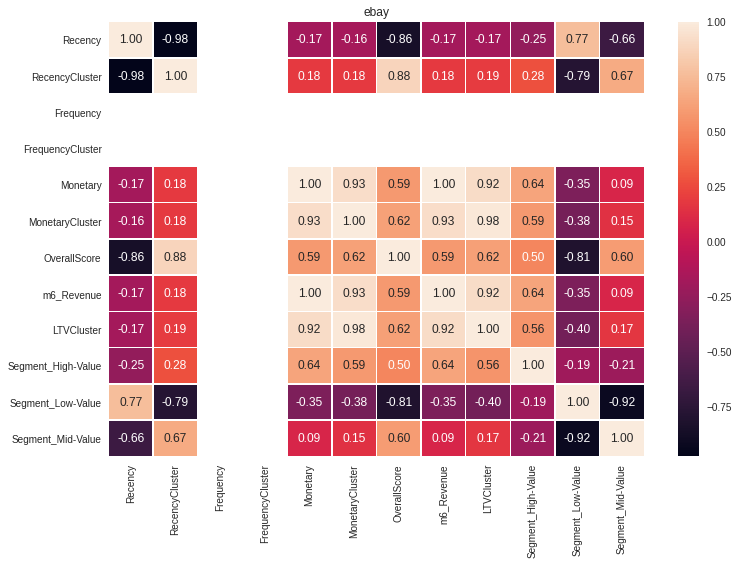

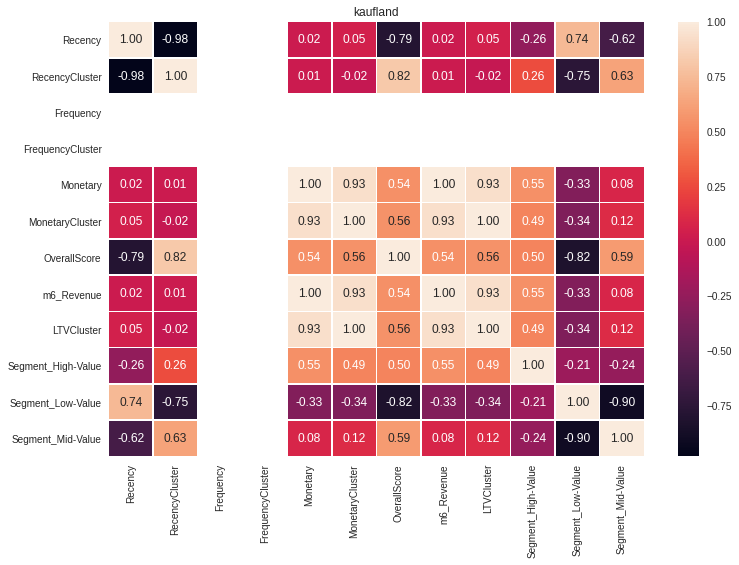

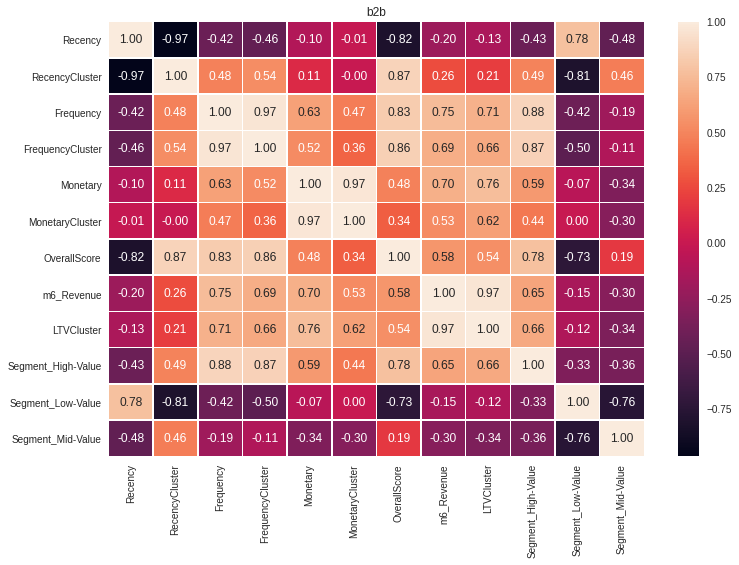

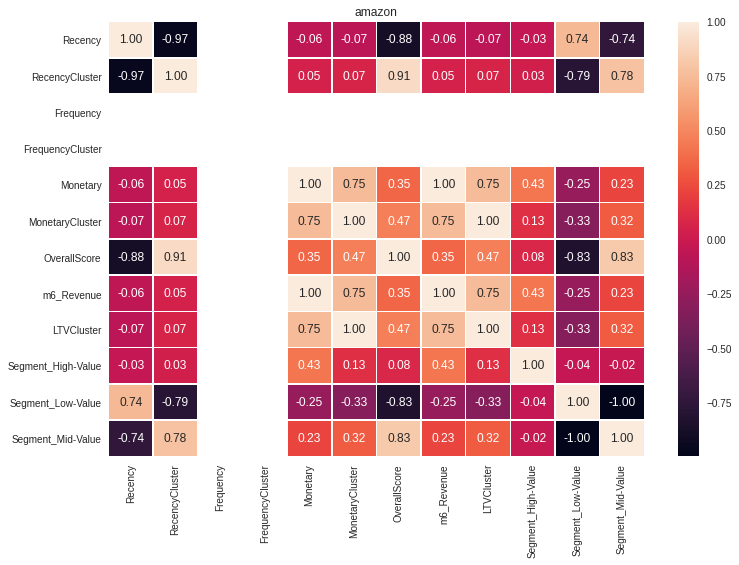

In [374]:
# Correlations 
for i in range(len(df_classes)):
    fig, ax = plt.subplots(figsize=(12,8)) 
    plt.title(platforms_string[i])
    sns.heatmap(df_classes[i].corr(), annot = True, fmt = ".2f", linewidths=0.5, ax=ax) 
    plt.show()

In [375]:
#calculate and show correlations
for i in range(len(df_classes)):
    corr_matrix = df_classes[i].corr()
    print(platforms_string[i])
    print(corr_matrix['LTVCluster'].sort_values(ascending=False))
    print()

ebay
LTVCluster            1.000000
MonetaryCluster       0.983253
Monetary              0.922654
m6_Revenue            0.922654
OverallScore          0.620139
Segment_High-Value    0.559806
RecencyCluster        0.188528
Segment_Mid-Value     0.168282
Recency              -0.174227
Segment_Low-Value    -0.396083
Frequency                  NaN
FrequencyCluster           NaN
Name: LTVCluster, dtype: float64

kaufland
MonetaryCluster       1.000000
LTVCluster            1.000000
Monetary              0.931177
m6_Revenue            0.931177
OverallScore          0.555989
Segment_High-Value    0.494575
Segment_Mid-Value     0.116234
Recency               0.047398
RecencyCluster       -0.018440
Segment_Low-Value    -0.340947
Frequency                  NaN
FrequencyCluster           NaN
Name: LTVCluster, dtype: float64

b2b
LTVCluster            1.000000
m6_Revenue            0.967223
Monetary              0.764102
Frequency             0.706959
Segment_High-Value    0.664091
FrequencyCluste

In [376]:
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score,KFold
import xgboost as xgb
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score

In [377]:
for i in range(len(df_classes)):
    #create X and y, X will be feature set and y is the label - LTV
    X = df_classes[i].drop(['Customer','LTVCluster','m6_Revenue'],axis=1)
    y = df_classes[i]['LTVCluster']
    #split training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=True, random_state=42)
    #XGBoost Multiclassification Model
    ltv_xgb_model = xgb.XGBClassifier(max_depth=5, learning_rate=0.1,objective= 'multi:softprob',n_jobs=-1).fit(X_train, y_train)
    print(platforms_string )
    print( 'Accuracy of XGB classifier on training set: {:.2f}'
       .format(ltv_xgb_model.score(X_train, y_train)))
    print('Accuracy of XGB classifier on test set: {:.2f}'
       .format(ltv_xgb_model.score(X_test[X_train.columns], y_test)))

    y_pred = ltv_xgb_model.predict(X_test)
    print(classification_report(y_test, y_pred))
    print()

[04:18:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
['ebay', 'kaufland', 'b2b', 'amazon']
Accuracy of XGB classifier on training set: 1.00
Accuracy of XGB classifier on test set: 1.00
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        13
           1       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         1

    accuracy                           1.00        19
   macro avg       1.00      1.00      1.00        19
weighted avg       1.00      1.00      1.00        19


[04:18:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restor

### Analysis on The Whole Customers data

In [378]:
customer_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer,9.819524,0.805882,0.25,0.170435,0.051187,30.273280
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer,5.860598,0.944118,0.05,0.027705,0.023273,20.788769
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer,8.971963,0.910588,0.00,0.019391,0.045211,9.978630
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer,12.618655,0.891176,0.10,0.106742,0.070924,34.627463
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer,18.682243,0.891176,0.00,0.048757,0.113678,17.088950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer,3.780000,0.111765,0.00,0.003690,0.008602,0.425323
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer,7.480000,0.057059,0.00,0.014879,0.034691,0.792842
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer,3.260000,0.031765,0.00,0.002117,0.004936,0.336521
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer,10.270000,0.057059,0.00,0.023316,0.054363,1.088568


In [379]:
customers[0]

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer,9.819524,0.805882,0.25,0.170435,0.051187,30.273280
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer,5.860598,0.944118,0.05,0.027705,0.023273,20.788769
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer,8.971963,0.910588,0.00,0.019391,0.045211,9.978630
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer,12.618655,0.891176,0.10,0.106742,0.070924,34.627463
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer,18.682243,0.891176,0.00,0.048757,0.113678,17.088950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer,3.780000,0.111765,0.00,0.003690,0.008602,0.425323
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer,7.480000,0.057059,0.00,0.014879,0.034691,0.792842
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer,3.260000,0.031765,0.00,0.002117,0.004936,0.336521
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer,10.270000,0.057059,0.00,0.023316,0.054363,1.088568


ebay The Elbow Method for CLTV


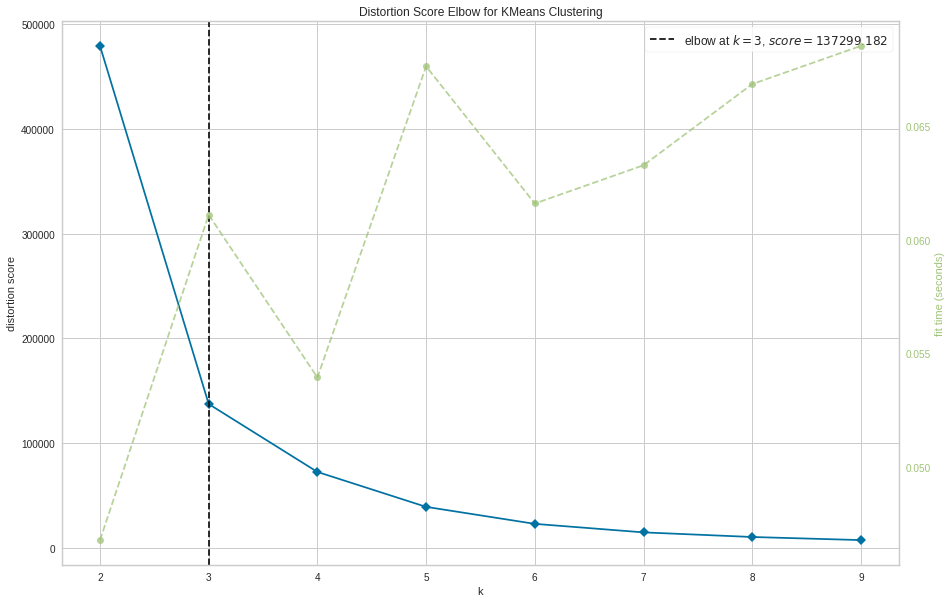

kaufland The Elbow Method for CLTV


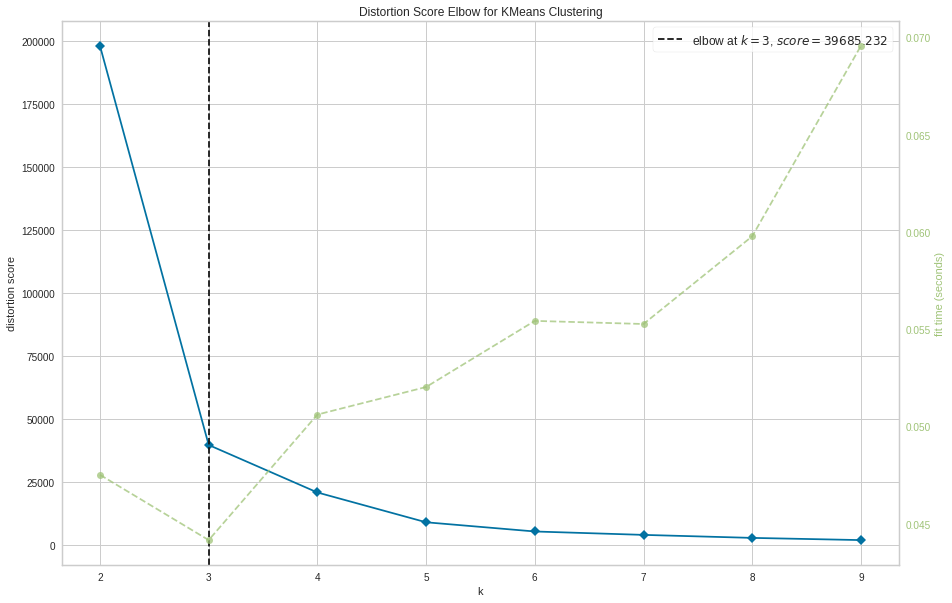

b2b The Elbow Method for CLTV


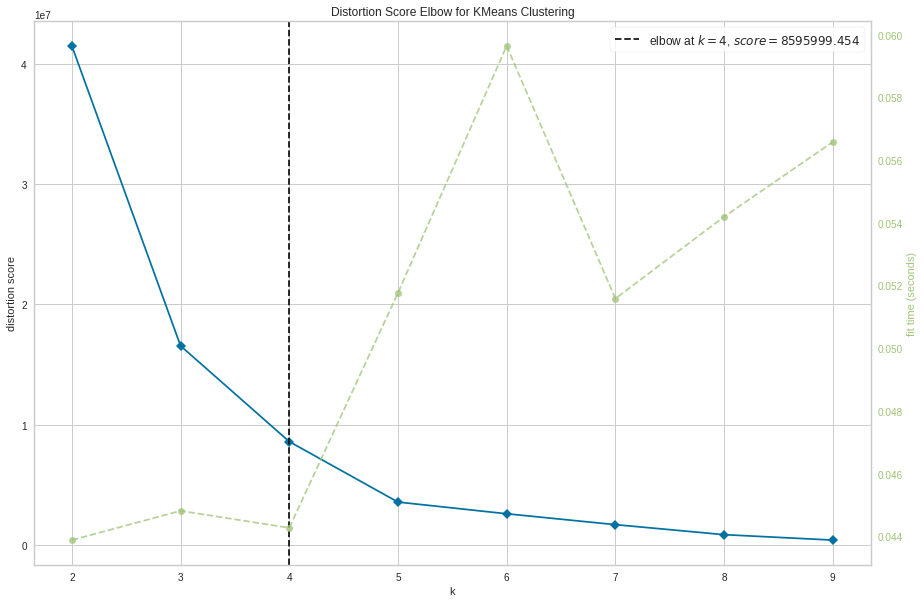

amazon The Elbow Method for CLTV


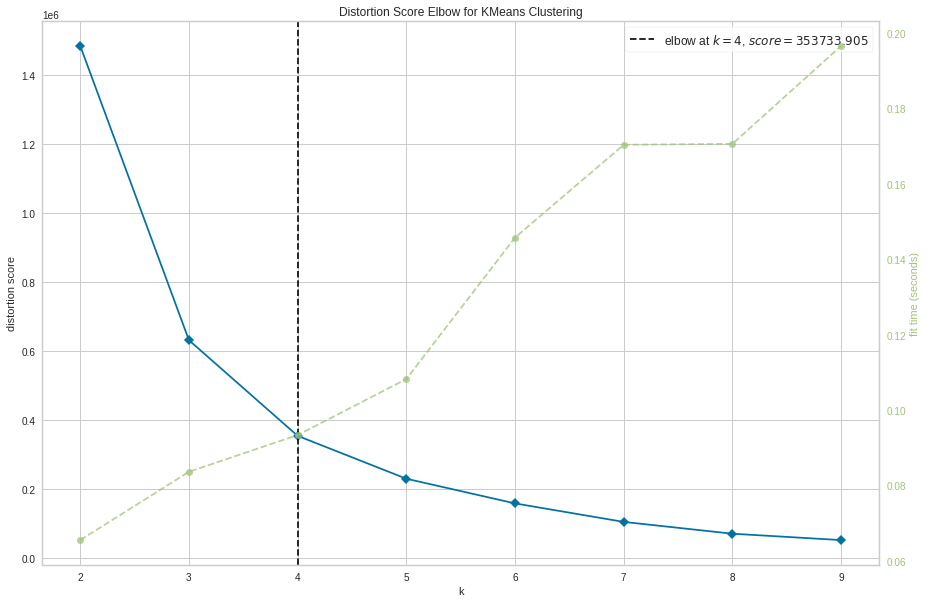

In [380]:
for i in range(len(customers)):
    print(platforms_string[i] + ' The Elbow Method for CLTV')
    kmeans = KMeans()
    visu = KElbowVisualizer(kmeans, k = (2,10))
    visu.fit(customers[i][['CLTV']])
    visu.poof(); # poof: Yellowbrick kütüphanesinin temel çizdirme metodu

In [381]:
CLTV_ks = [3,3,4,4]

In [382]:
for i in range(len(customers)):
    kmeans = KMeans(n_clusters=CLTV_ks[i])
    kmeans.fit(customers[i][['CLTV']])
    customers[i]['CLTVCluster'] = kmeans.predict(customers[i][['CLTV']])
    customers[i] = order_cluster('CLTVCluster', 'CLTV', customers[i] , True)

    

In [383]:
customers[0]

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV,CLTVCluster
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer,9.819524,0.805882,0.25,0.170435,0.051187,30.273280,0
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer,5.860598,0.944118,0.05,0.027705,0.023273,20.788769,0
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer,8.971963,0.910588,0.00,0.019391,0.045211,9.978630,0
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer,12.618655,0.891176,0.10,0.106742,0.070924,34.627463,0
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer,18.682243,0.891176,0.00,0.048757,0.113678,17.088950,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,ID10241,1643,1,33.644860,1,2,4,7,Almost Lost Customer,33.644860,0.966471,0.00,0.094006,0.219180,98.869942,1
1454,ID10242,1646,1,31.775701,1,2,4,7,Almost Lost Customer,31.775701,0.968235,0.00,0.088354,0.206001,98.484397,1
1455,ID10243,1650,1,70.000000,1,2,4,7,Almost Lost Customer,70.000000,0.970588,0.00,0.203951,0.475522,234.021632,1
1456,ID10351,1457,2,90.551402,1,4,4,9,Loyal Customer,45.275701,0.857059,0.05,0.266102,0.301190,63.127900,1


In [384]:
customer_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV,CLTVCluster
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer,9.819524,0.805882,0.25,0.170435,0.051187,30.273280,0
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer,5.860598,0.944118,0.05,0.027705,0.023273,20.788769,0
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer,8.971963,0.910588,0.00,0.019391,0.045211,9.978630,0
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer,12.618655,0.891176,0.10,0.106742,0.070924,34.627463,0
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer,18.682243,0.891176,0.00,0.048757,0.113678,17.088950,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer,3.780000,0.111765,0.00,0.003690,0.008602,0.425323,0
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer,7.480000,0.057059,0.00,0.014879,0.034691,0.792842,0
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer,3.260000,0.031765,0.00,0.002117,0.004936,0.336521,0
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer,10.270000,0.057059,0.00,0.023316,0.054363,1.088568,0


In [385]:
customer_kaufland

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV,CLTVCluster
0,IDKundenID10000,44,1,4.66,4,4,1,9,Loyal Customer,4.66,0.268293,0.0,0.008670,0.008670,0.636432,0
1,IDKundenID10002,4,1,4.66,4,4,1,9,Loyal Customer,4.66,0.024390,0.0,0.008670,0.008670,0.477405,0
2,IDKundenID10006,21,1,4.66,4,4,1,9,Loyal Customer,4.66,0.128049,0.0,0.008670,0.008670,0.534127,0
3,IDKundenID10014,12,1,4.66,4,4,1,9,Loyal Customer,4.66,0.073171,0.0,0.008670,0.008670,0.502518,0
4,IDKundenID10019,7,1,4.66,4,4,1,9,Loyal Customer,4.66,0.042683,0.0,0.008670,0.008670,0.486523,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,IDKundenID9954,129,1,4.66,2,4,1,7,Almost Lost Customer,4.66,0.786585,0.0,0.008670,0.008670,2.178439,0
267,IDKundenID9976,45,1,8.40,3,4,2,9,Loyal Customer,8.40,0.274390,0.0,0.043165,0.043165,1.156850,0
268,IDKundenID9990,102,1,4.99,2,4,1,7,Almost Lost Customer,4.99,0.621951,0.0,0.011714,0.011714,1.318192,0
269,IDKundenID9998,67,1,4.66,3,4,1,8,Loyal Customer,4.66,0.408537,0.0,0.008670,0.008670,0.787211,0


In [386]:
customer_b2b

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV,CLTVCluster
0,ID -2,1702,4,51.200000,1,2,1,4,Lost Customer,12.800000,1.000000,0.000691,0.000753,0.003393,10240.000000,3
1,ID0,37,50,2832.393925,4,4,4,12,Best Customer,56.647879,0.021739,0.011288,0.038425,0.014265,289.385693,0
2,ID10006,1546,1,23.364400,1,1,1,3,Lost Customer,23.364400,0.908343,0.000000,0.000376,0.006012,25.352856,0
3,ID10007,18,4342,73822.188372,4,4,4,12,Best Customer,17.001886,0.010576,1.000000,1.000000,0.004435,7457.357630,1
4,ID10245,558,10,606.535607,3,2,2,7,Almost Lost Customer,60.653561,0.327850,0.002073,0.008275,0.015259,90.171001,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,ID28540,42,2,176.000000,4,2,2,8,Loyal Customer,88.000000,0.024677,0.000230,0.002444,0.022039,18.036055,0
212,ID28541,37,18,339.360000,4,2,2,8,Loyal Customer,18.853333,0.021739,0.003916,0.004656,0.004894,34.672412,0
213,ID28542,32,81,7906.090000,4,4,4,12,Best Customer,97.606049,0.018801,0.018429,0.107150,0.024421,805.348004,0
214,ID28543,19,16,2092.800000,4,2,4,10,Best Customer,130.800000,0.011163,0.003455,0.028407,0.032652,211.535676,0


In [387]:
customer_amazon

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV,CLTVCluster
0,ID10004,1549,1,14.813084,1,2,2,5,Lost Customer,14.813084,0.987253,0.0,0.017676,0.018775,111.822411,2
1,ID10005,1548,1,14.813084,1,2,2,5,Lost Customer,14.813084,0.986616,0.0,0.017676,0.018775,106.689293,2
2,ID10006,1549,1,28.878505,1,2,4,7,Almost Lost Customer,28.878505,0.987253,0.0,0.034460,0.036601,218.000788,3
3,ID10008,1551,1,23.355140,1,2,3,6,Almost Lost Customer,23.355140,0.988528,0.0,0.027869,0.029601,195.076872,3
4,ID10009,1519,1,12.990654,1,2,2,5,Lost Customer,12.990654,0.968133,0.0,0.015501,0.016465,40.134955,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20919,IDKundenID9992,87,1,9.340000,4,2,1,7,Almost Lost Customer,9.340000,0.055449,0.0,0.011145,0.011838,0.988307,0
20920,IDKundenID9993,86,1,9.340000,4,2,1,7,Almost Lost Customer,9.340000,0.054812,0.0,0.011145,0.011838,0.987641,0
20921,IDKundenID9994,85,1,9.340000,4,2,1,7,Almost Lost Customer,9.340000,0.054175,0.0,0.011145,0.011838,0.986976,0
20922,IDKundenID9996,84,1,9.340000,4,2,1,7,Almost Lost Customer,9.340000,0.053537,0.0,0.011145,0.011838,0.986311,0


In [388]:
#see details of the clusters
customer_ebay.groupby('CLTVCluster')['CLTV'].describe()

,count,mean,std,min,25%,50%,75%,max
CLTVCluster,,,,,,,,
0,1425.0,4.336314,6.429834,0.262035,1.194680,2.225186,4.376618,52.977341
1,1.0,2336.448598,NaN,2336.448598,2336.448598,2336.448598,2336.448598,2336.448598
2,32.0,108.860888,50.298171,59.836581,67.654136,96.726154,125.159496,234.021632


In [389]:
#see details of the clusters
customer_kaufland.groupby('CLTVCluster')['CLTV'].describe()

,count,mean,std,min,25%,50%,75%,max
CLTVCluster,,,,,,,,
0,266.0,6.340556,8.584993,0.431953,1.552821,3.566682,7.627812,64.467706
1,1.0,1868.000000,NaN,1868.000000,1868.000000,1868.000000,1868.000000,1868.000000
2,4.0,206.927639,81.559572,114.357418,153.328585,209.494053,263.093107,294.365034


In [390]:
customer_b2b.groupby('CLTVCluster')['CLTV'].describe()

,count,mean,std,min,25%,50%,75%,max
CLTVCluster,,,,,,,,
0,209.0,68.655745,150.935120,-0.584412,8.155438,19.110887,59.052927,1251.156150
1,2.0,6784.818831,951.113491,6112.280032,6448.549432,6784.818831,7121.088231,7457.357630
2,4.0,2701.428341,992.110412,1494.660387,2295.199084,2701.096857,3107.326115,3908.859263
3,1.0,10240.000000,NaN,10240.000000,10240.000000,10240.000000,10240.000000,10240.000000


In [391]:
customer_amazon.groupby('CLTVCluster')['CLTV'].describe()

,count,mean,std,min,25%,50%,75%,max
CLTVCluster,,,,,,,,
0,20721.0,2.683473,2.662397,0.000000,1.235709,1.896188,3.161946,26.404722
1,1.0,2428.037383,NaN,2428.037383,2428.037383,2428.037383,2428.037383,2428.037383
2,185.0,50.154068,24.527475,26.661639,31.469230,41.273212,58.596031,124.341298
3,17.0,208.405262,77.533940,136.070135,151.656311,194.650157,218.000788,422.768877


In [392]:
#convert categorical columns to numerical
df_class_cusebay = pd.get_dummies(customer_ebay, columns=['rfm_level'])
df_class_cuskaufland = pd.get_dummies(customer_kaufland, columns=['rfm_level'])
df_class_cusb2b = pd.get_dummies(customer_b2b, columns=['rfm_level'])
df_class_cusamazon = pd.get_dummies(customer_amazon, columns=['rfm_level'])

In [393]:
df_class_cusebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV,CLTVCluster,rfm_level_Almost Lost Customer,rfm_level_Best Customer,rfm_level_Lost Customer,rfm_level_Loyal Customer
0,ID10001,1370,6,58.917144,1,4,4,9,9.819524,0.805882,0.25,0.170435,0.051187,30.273280,0,0,0,0,1
1,ID10002,1605,2,11.721197,1,4,2,7,5.860598,0.944118,0.05,0.027705,0.023273,20.788769,0,1,0,0,0
2,ID10003,1548,1,8.971963,1,2,1,4,8.971963,0.910588,0.00,0.019391,0.045211,9.978630,0,0,0,1,0
3,ID10016,1515,3,37.855965,1,4,4,9,12.618655,0.891176,0.10,0.106742,0.070924,34.627463,0,0,0,0,1
4,ID10017,1515,1,18.682243,1,2,2,5,18.682243,0.891176,0.00,0.048757,0.113678,17.088950,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,3.780000,0.111765,0.00,0.003690,0.008602,0.425323,0,1,0,0,0
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,7.480000,0.057059,0.00,0.014879,0.034691,0.792842,0,1,0,0,0
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,3.260000,0.031765,0.00,0.002117,0.004936,0.336521,0,1,0,0,0
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,10.270000,0.057059,0.00,0.023316,0.054363,1.088568,0,0,0,0,1


In [394]:
df_classes_cus = [df_class_cusebay, df_class_cuskaufland, df_class_cusb2b, df_class_cusamazon]

In [395]:
df_classes_cus[0]

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,Avg_Revenue,n_recency,n_frequency,n_monetary,n_avg_revenue,CLTV,CLTVCluster,rfm_level_Almost Lost Customer,rfm_level_Best Customer,rfm_level_Lost Customer,rfm_level_Loyal Customer
0,ID10001,1370,6,58.917144,1,4,4,9,9.819524,0.805882,0.25,0.170435,0.051187,30.273280,0,0,0,0,1
1,ID10002,1605,2,11.721197,1,4,2,7,5.860598,0.944118,0.05,0.027705,0.023273,20.788769,0,1,0,0,0
2,ID10003,1548,1,8.971963,1,2,1,4,8.971963,0.910588,0.00,0.019391,0.045211,9.978630,0,0,0,1,0
3,ID10016,1515,3,37.855965,1,4,4,9,12.618655,0.891176,0.10,0.106742,0.070924,34.627463,0,0,0,0,1
4,ID10017,1515,1,18.682243,1,2,2,5,18.682243,0.891176,0.00,0.048757,0.113678,17.088950,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,3.780000,0.111765,0.00,0.003690,0.008602,0.425323,0,1,0,0,0
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,7.480000,0.057059,0.00,0.014879,0.034691,0.792842,0,1,0,0,0
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,3.260000,0.031765,0.00,0.002117,0.004936,0.336521,0,1,0,0,0
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,10.270000,0.057059,0.00,0.023316,0.054363,1.088568,0,0,0,0,1


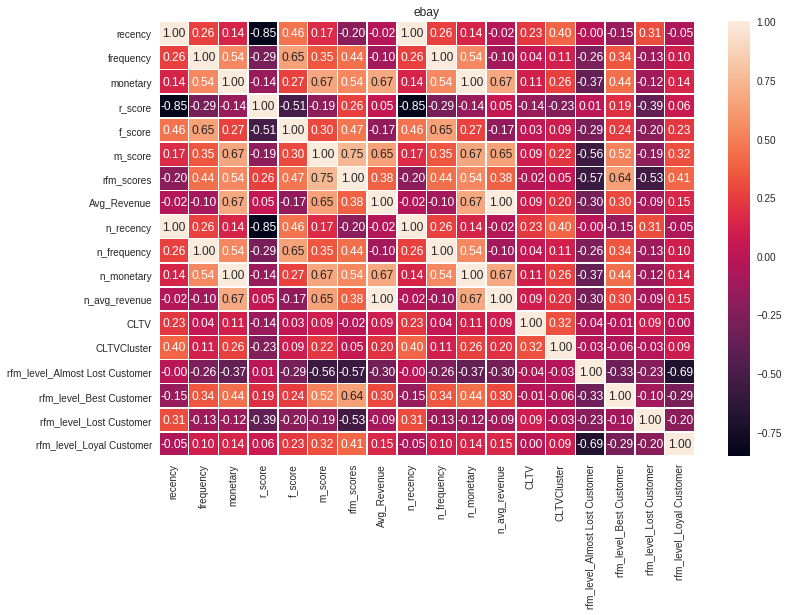

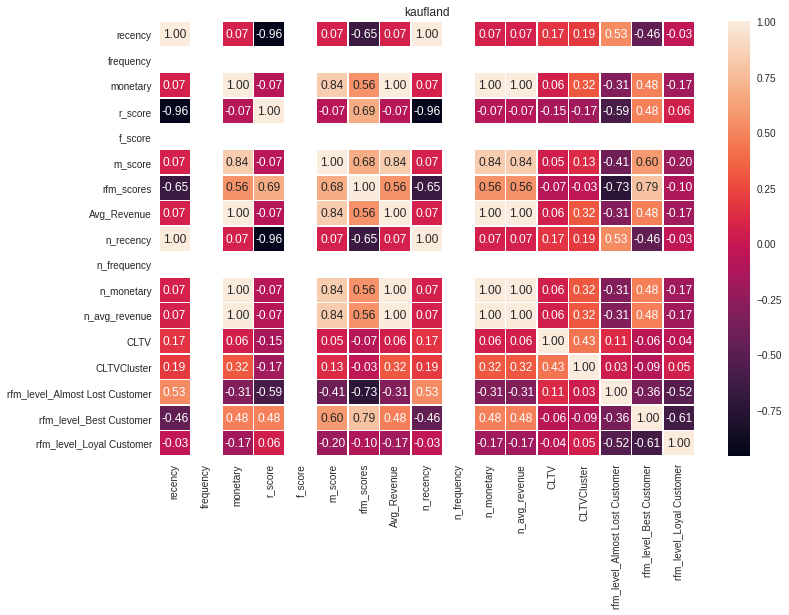

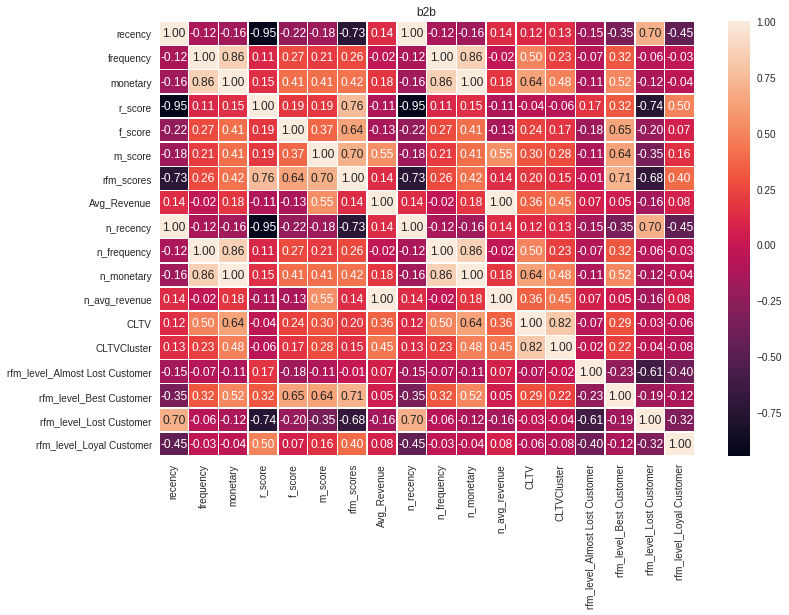

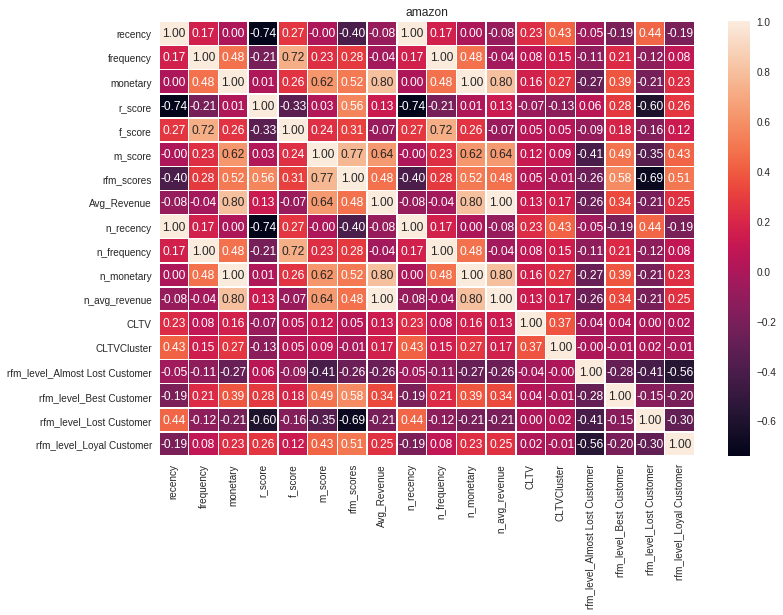

In [396]:
# Correlations 
for i in range(len(df_classes_cus)):
    fig, ax = plt.subplots(figsize=(12,8)) 
    plt.title(platforms_string[i])
    sns.heatmap(df_classes_cus[i].corr(), annot = True, fmt = ".2f", linewidths=0.5, ax=ax) 
    plt.show()

In [397]:
#calculate and show correlations
for i in range(len(df_classes_cus)):
    corr_matrix = df_classes_cus[i].corr()
    print(platforms_string[i])
    print(corr_matrix['CLTVCluster'].sort_values(ascending=False))
    print()

ebay
CLTVCluster                       1.000000
recency                           0.395380
n_recency                         0.395380
CLTV                              0.321375
n_monetary                        0.255252
monetary                          0.255252
m_score                           0.223937
n_avg_revenue                     0.201377
Avg_Revenue                       0.201377
frequency                         0.110834
n_frequency                       0.110834
f_score                           0.085582
rfm_level_Loyal Customer          0.085089
rfm_scores                        0.046127
rfm_level_Lost Customer          -0.029471
rfm_level_Almost Lost Customer   -0.031311
rfm_level_Best Customer          -0.056530
r_score                          -0.232550
Name: CLTVCluster, dtype: float64

kaufland
CLTVCluster                       1.000000
CLTV                              0.433232
n_monetary                        0.318589
n_avg_revenue                     0.318589
monet

In [398]:
for i in range(len(df_classes_cus)):
    #create X and y, X will be feature set and y is the label - LTV ,,'CLTV'
    X = df_classes_cus[i].drop(['Customer','CLTVCluster'],axis=1)
    y = df_classes_cus[i]['CLTVCluster']
    #split training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state=42)
    #XGBoost Multiclassification Model
    ltv_xgb_model = xgb.XGBClassifier(max_depth=5, learning_rate=0.1,objective= 'multi:softprob',n_jobs=-1).fit(X_train, y_train)
    print(platforms_string )
    print( 'Accuracy of XGB classifier on training set: {:.2f}'
       .format(ltv_xgb_model.score(X_train, y_train)))
    print('Accuracy of XGB classifier on test set: {:.2f}'
       .format(ltv_xgb_model.score(X_test[X_train.columns], y_test)))

    y_pred = ltv_xgb_model.predict(X_test)
    print(classification_report(y_test, y_pred))
    print()

[04:19:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
['ebay', 'kaufland', 'b2b', 'amazon']
Accuracy of XGB classifier on training set: 1.00
Accuracy of XGB classifier on test set: 1.00
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       431
           2       1.00      1.00      1.00         7

    accuracy                           1.00       438
   macro avg       1.00      1.00      1.00       438
weighted avg       1.00      1.00      1.00       438


[04:19:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
['ebay', 'kaufland', 'b2b', 'amazo

There are four ways to check if the predictions are right or wrong:

    TN / True Negative: the case was negative and predicted negative
    TP / True Positive: the case was positive and predicted positive
    FN / False Negative: the case was positive but predicted negative
    FP / False Positive: the case was negative but predicted positive

Precision — What percent of your predictions were correct?

Precision is the ability of a classifier not to label an instance positive that is actually negative. For each class, it is defined as the ratio of true positives to the sum of a true positive and false positive.

Precision:- Accuracy of positive predictions.

Precision = TP/(TP + FP)

Recall — What percent of the positive cases did you catch?

Recall is the ability of a classifier to find all positive instances. For each class it is defined as the ratio of true positives to the sum of true positives and false negatives.

Recall:- Fraction of positives that were correctly identified.

Recall = TP/(TP+FN)

F1 score — What percent of positive predictions were correct?

The F1 score is a weighted harmonic mean of precision and recall such that the best score is 1.0 and the worst is 0.0. F1 scores are lower than accuracy measures as they embed precision and recall into their computation. As a rule of thumb, the weighted average of F1 should be used to compare classifier models, not global accuracy.

F1 Score = 2*(Recall * Precision) / (Recall + Precision)

Support

Support is the number of actual occurrences of the class in the specified dataset. Imbalanced support in the training data may indicate structural weaknesses in the reported scores of the classifier and could indicate the need for stratified sampling or rebalancing. Support doesn’t change between models but instead diagnoses the evaluation process.

In [399]:
customer_ebay.CLTVCluster.value_counts()

0    1425
2      32
1       1
Name: CLTVCluster, dtype: int64

In [400]:
customer_kaufland.CLTVCluster.value_counts()

0    266
2      4
1      1
Name: CLTVCluster, dtype: int64

In [401]:
customer_b2b.CLTVCluster.value_counts()

0    209
2      4
1      2
3      1
Name: CLTVCluster, dtype: int64

In [402]:
customer_amazon.CLTVCluster.value_counts()

0    20721
2      185
3       17
1        1
Name: CLTVCluster, dtype: int64

## Churn Analysis

In [403]:
rfm_ebay

,Customer,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level
0,ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer
1,ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer
2,ID10003,1548,1,8.971963,1,2,1,4,Lost Customer
3,ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer
4,ID10017,1515,1,18.682243,1,2,2,5,Lost Customer
...,...,...,...,...,...,...,...,...,...
1453,IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer
1454,IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer
1455,IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer
1456,IDKundenID9957,97,1,10.270000,4,2,2,8,Loyal Customer


In [404]:
ebay

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days
38,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,...,0.000000,Wednesday,3.617214,versandkosten,0,1,0,1,2022-04-28,1072
106,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,0.631887,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192
133,2019-06-03,ID10842,76437,Rastatt,DEU,GERMANY,ebay,gutschein,1.0,0.907563,...,0.907563,Monday,3.617214,gutschein,0,1,0,1,2022-04-28,1060
167,2021-06-29,ID20817,10715,Berlin,DEU,GERMANY,ebay,versandkosten 7 %,1.0,1.197485,...,1.197485,Tuesday,3.617214,versandkosten,1,0,0,1,2022-04-28,303
180,2018-03-23,ID10168,9300,St. Veit a. d. Glan,AUT,AUSTRIA,ebay,versandkosten,1.0,1.260504,...,1.260504,Friday,3.617214,versandkosten,0,1,0,1,2022-04-28,1497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39026,2021-10-20,ID27739,36000,Châteauroux,FRA,FRANCE,ebay,efepasa parmak sucuk 1kg,10.0,13.028037,...,130.280374,Wednesday,3.617214,sucuk,1,0,0,1,2022-04-28,190
39061,2021-03-09,ID12934,1000,other,ATA,ANTARCTICA,ebay,pergamo geröstet & ungesalzen haselnusskerne- ...,2.0,70.084112,...,140.168224,Tuesday,3.617214,findik,1,0,0,1,2022-04-28,415
39074,2021-04-15,ID17176,44534,Lünen,DEU,GERMANY,ebay,echte ajwa acve datteln aus medina/ echte prop...,7.0,20.626168,...,144.383178,Thursday,3.617214,hurma,1,0,0,1,2022-04-28,378
39116,2019-06-24,ID11167,64331,Weiterstadt,DEU,GERMANY,ebay,royal extra lata 5 l.,4.0,39.242991,...,156.971963,Monday,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1039


In [405]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    max_date = platforms[i].fatura_tarihi.max()
    print(str(max_date))
    #print(de_platforms[i].head())

ebay
2022-04-28 00:00:00
kaufland
2022-04-29 00:00:00
b2b
2022-04-27 00:00:00
amazon
2022-04-29 00:00:00


In [406]:
rfm[0]

,recency,frequency,monetary,r_score,f_score,m_score,rfm_scores,rfm_level
Customer,,,,,,,,
ID10001,1370,6,58.917144,1,4,4,9,Loyal Customer
ID10002,1605,2,11.721197,1,4,2,7,Almost Lost Customer
ID10003,1548,1,8.971963,1,2,1,4,Lost Customer
ID10016,1515,3,37.855965,1,4,4,9,Loyal Customer
ID10017,1515,1,18.682243,1,2,2,5,Lost Customer
...,...,...,...,...,...,...,...,...
IDKundenID9892,190,1,3.780000,3,2,1,6,Almost Lost Customer
IDKundenID9893,97,1,7.480000,4,2,1,7,Almost Lost Customer
IDKundenID9956,54,1,3.260000,4,2,1,7,Almost Lost Customer


In [407]:
rfm[0][['rfm_level']]

,rfm_level
Customer,
ID10001,Loyal Customer
ID10002,Almost Lost Customer
ID10003,Lost Customer
ID10016,Loyal Customer
ID10017,Lost Customer
...,...
IDKundenID9892,Almost Lost Customer
IDKundenID9893,Almost Lost Customer
IDKundenID9956,Almost Lost Customer


In [408]:
#for i in range(len(platforms)):
#    print(platforms_string[i]) 
#    max_date =  = rfm[i]['rfm_level']
#    platforms[i] = pd.merge(platforms[i], rfm_cus, on='Customer')
    #print(str(max_date))
    #print(de_platforms[i].head())

In [409]:
for i in range(len(platforms)):
    max_dates = platforms[i].groupby('Customer').fatura_tarihi.max()
    print(max_dates)
    platforms[i] = pd.merge(platforms[i], max_dates, on='Customer')

Customer
ID10001          2018-07-28
ID10002          2017-12-05
ID10003          2018-01-31
ID10016          2018-03-05
ID10017          2018-03-05
                    ...    
IDKundenID9892   2021-10-20
IDKundenID9893   2022-01-21
IDKundenID9956   2022-03-05
IDKundenID9957   2022-01-21
IDKundenID9958   2022-01-25
Name: fatura_tarihi, Length: 1458, dtype: datetime64[ns]
Customer
IDKundenID10000   2022-03-16
IDKundenID10002   2022-04-25
IDKundenID10006   2022-04-08
IDKundenID10014   2022-04-17
IDKundenID10019   2022-04-22
                     ...    
IDKundenID9954    2021-12-21
IDKundenID9976    2022-03-15
IDKundenID9990    2022-01-17
IDKundenID9998    2022-02-21
IDKundenID9999    2022-03-03
Name: fatura_tarihi, Length: 271, dtype: datetime64[ns]
Customer
ID -2     2017-08-29
ID0       2022-03-21
ID10006   2018-02-01
ID10007   2022-04-09
ID10245   2020-10-16
             ...    
ID28540   2022-03-16
ID28541   2022-03-21
ID28542   2022-03-26
ID28543   2022-04-08
IDID -2   2022-01-27
Na

In [410]:
platforms[0]

,fatura_tarihi_x,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days,fatura_tarihi_y
0,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,...,Wednesday,3.617214,versandkosten,0,1,0,1,2022-04-28,1072,2019-05-22
1,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,cazorla royal kaltgepresstes extra natives oli...,1.0,103.841121,...,Wednesday,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1072,2019-05-22
2,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18
3,2021-10-18,ID27399,93055,Regensburg,DEU,GERMANY,ebay,versandkosten 7 %,1.0,3.960799,...,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18
4,2021-10-18,ID27399,1448ML,Purmerend,NLD,NETHERLANDS,ebay,2 x 100g öz-kayseri - pastirma -rinderschinken...,1.0,6.235294,...,Monday,3.617214,pastirma,1,0,0,1,2022-04-28,192,2021-10-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,2022-01-19,IDKundenID5964,1000,other,ATA,ANTARCTICA,ebay,granatapfelsirup 100 % granatapfel konzentrat ...,4.0,27.190000,...,Wednesday,4.990000,nar_eksisi,1,0,0,1,2022-04-28,99,2022-01-19
2291,2022-03-27,IDKundenID22566,1000,other,ATA,ANTARCTICA,ebay,walnuss/walnusse in schale 32mm /studentenfutt...,3.0,36.890000,...,Sunday,4.950000,walnuss,1,0,1,0,2022-04-28,32,2022-03-27
2292,2017-11-22,ID10177,85368,Moosburg,DEU,GERMANY,ebay,kaltgepresstes extra natives olivenöl alma oli...,1.0,112.140187,...,Wednesday,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1618,2017-11-22
2293,2021-10-19,IDKundenID3578,1000,other,ATA,ANTARCTICA,ebay,efepasa knoblauchwurst scharf - 1000g - parmak...,10.0,11.710000,...,Tuesday,4.990000,sucuk,1,0,0,1,2022-04-28,191,2021-10-19


In [411]:
amazon.fatura_tarihi.nunique()

681

In [412]:
platforms[3].fatura_tarihi_y.nunique()

664

In [413]:
platforms[3].fatura_tarihi_x.nunique()

681

In [414]:
for i in range(len(platforms)):
    platforms[i] = platforms[i].rename({'fatura_tarihi_y': 'max_date',
                                'fatura_tarihi_x':'fatura_tarihi'}, axis=1)

In [415]:
platforms[0]

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days,max_date
0,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,...,Wednesday,3.617214,versandkosten,0,1,0,1,2022-04-28,1072,2019-05-22
1,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,cazorla royal kaltgepresstes extra natives oli...,1.0,103.841121,...,Wednesday,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1072,2019-05-22
2,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18
3,2021-10-18,ID27399,93055,Regensburg,DEU,GERMANY,ebay,versandkosten 7 %,1.0,3.960799,...,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18
4,2021-10-18,ID27399,1448ML,Purmerend,NLD,NETHERLANDS,ebay,2 x 100g öz-kayseri - pastirma -rinderschinken...,1.0,6.235294,...,Monday,3.617214,pastirma,1,0,0,1,2022-04-28,192,2021-10-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,2022-01-19,IDKundenID5964,1000,other,ATA,ANTARCTICA,ebay,granatapfelsirup 100 % granatapfel konzentrat ...,4.0,27.190000,...,Wednesday,4.990000,nar_eksisi,1,0,0,1,2022-04-28,99,2022-01-19
2291,2022-03-27,IDKundenID22566,1000,other,ATA,ANTARCTICA,ebay,walnuss/walnusse in schale 32mm /studentenfutt...,3.0,36.890000,...,Sunday,4.950000,walnuss,1,0,1,0,2022-04-28,32,2022-03-27
2292,2017-11-22,ID10177,85368,Moosburg,DEU,GERMANY,ebay,kaltgepresstes extra natives olivenöl alma oli...,1.0,112.140187,...,Wednesday,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1618,2017-11-22
2293,2021-10-19,IDKundenID3578,1000,other,ATA,ANTARCTICA,ebay,efepasa knoblauchwurst scharf - 1000g - parmak...,10.0,11.710000,...,Tuesday,4.990000,sucuk,1,0,0,1,2022-04-28,191,2021-10-19


In [416]:
#for i in range(len(platforms)):
#    del platforms[i]['Churn']

In [417]:
platforms[0]

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days,max_date
0,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,...,Wednesday,3.617214,versandkosten,0,1,0,1,2022-04-28,1072,2019-05-22
1,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,cazorla royal kaltgepresstes extra natives oli...,1.0,103.841121,...,Wednesday,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1072,2019-05-22
2,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18
3,2021-10-18,ID27399,93055,Regensburg,DEU,GERMANY,ebay,versandkosten 7 %,1.0,3.960799,...,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18
4,2021-10-18,ID27399,1448ML,Purmerend,NLD,NETHERLANDS,ebay,2 x 100g öz-kayseri - pastirma -rinderschinken...,1.0,6.235294,...,Monday,3.617214,pastirma,1,0,0,1,2022-04-28,192,2021-10-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,2022-01-19,IDKundenID5964,1000,other,ATA,ANTARCTICA,ebay,granatapfelsirup 100 % granatapfel konzentrat ...,4.0,27.190000,...,Wednesday,4.990000,nar_eksisi,1,0,0,1,2022-04-28,99,2022-01-19
2291,2022-03-27,IDKundenID22566,1000,other,ATA,ANTARCTICA,ebay,walnuss/walnusse in schale 32mm /studentenfutt...,3.0,36.890000,...,Sunday,4.950000,walnuss,1,0,1,0,2022-04-28,32,2022-03-27
2292,2017-11-22,ID10177,85368,Moosburg,DEU,GERMANY,ebay,kaltgepresstes extra natives olivenöl alma oli...,1.0,112.140187,...,Wednesday,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1618,2017-11-22
2293,2021-10-19,IDKundenID3578,1000,other,ATA,ANTARCTICA,ebay,efepasa knoblauchwurst scharf - 1000g - parmak...,10.0,11.710000,...,Tuesday,4.990000,sucuk,1,0,0,1,2022-04-28,191,2021-10-19


In [418]:
#orders['gender'] = orders.first_name.apply(lambda name: 'Female' if name in fmllst else 'Male')

In [419]:
for i in range(len(platforms)):
    print(platforms_string[i]) 
    platforms[i]['Churn'] = platforms[i]['max_date'].where(platforms[i]['max_date'] >='2021-04-27', 1) 
    platforms[i]['Churn'] = platforms[i]['Churn'].where(platforms[i]['Churn']== 1,0)
    #print(str(max_date))
    #print(de_platforms[i].head())

ebay
kaufland
b2b
amazon


In [420]:
#ebay.groupby('Customer').fatura_tarihi.max()>='2021-09-01'

In [421]:
platforms[0]

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days,max_date,Churn
0,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,...,3.617214,versandkosten,0,1,0,1,2022-04-28,1072,2019-05-22,1
1,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,cazorla royal kaltgepresstes extra natives oli...,1.0,103.841121,...,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1072,2019-05-22,1
2,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18,0
3,2021-10-18,ID27399,93055,Regensburg,DEU,GERMANY,ebay,versandkosten 7 %,1.0,3.960799,...,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18,0
4,2021-10-18,ID27399,1448ML,Purmerend,NLD,NETHERLANDS,ebay,2 x 100g öz-kayseri - pastirma -rinderschinken...,1.0,6.235294,...,3.617214,pastirma,1,0,0,1,2022-04-28,192,2021-10-18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,2022-01-19,IDKundenID5964,1000,other,ATA,ANTARCTICA,ebay,granatapfelsirup 100 % granatapfel konzentrat ...,4.0,27.190000,...,4.990000,nar_eksisi,1,0,0,1,2022-04-28,99,2022-01-19,0
2291,2022-03-27,IDKundenID22566,1000,other,ATA,ANTARCTICA,ebay,walnuss/walnusse in schale 32mm /studentenfutt...,3.0,36.890000,...,4.950000,walnuss,1,0,1,0,2022-04-28,32,2022-03-27,0
2292,2017-11-22,ID10177,85368,Moosburg,DEU,GERMANY,ebay,kaltgepresstes extra natives olivenöl alma oli...,1.0,112.140187,...,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1618,2017-11-22,1
2293,2021-10-19,IDKundenID3578,1000,other,ATA,ANTARCTICA,ebay,efepasa knoblauchwurst scharf - 1000g - parmak...,10.0,11.710000,...,4.990000,sucuk,1,0,0,1,2022-04-28,191,2021-10-19,0


In [422]:
ebay

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,ciro,day_of_week,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days
38,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,...,0.000000,Wednesday,3.617214,versandkosten,0,1,0,1,2022-04-28,1072
106,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,0.631887,Monday,3.617214,versandkosten,1,0,0,1,2022-04-28,192
133,2019-06-03,ID10842,76437,Rastatt,DEU,GERMANY,ebay,gutschein,1.0,0.907563,...,0.907563,Monday,3.617214,gutschein,0,1,0,1,2022-04-28,1060
167,2021-06-29,ID20817,10715,Berlin,DEU,GERMANY,ebay,versandkosten 7 %,1.0,1.197485,...,1.197485,Tuesday,3.617214,versandkosten,1,0,0,1,2022-04-28,303
180,2018-03-23,ID10168,9300,St. Veit a. d. Glan,AUT,AUSTRIA,ebay,versandkosten,1.0,1.260504,...,1.260504,Friday,3.617214,versandkosten,0,1,0,1,2022-04-28,1497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39026,2021-10-20,ID27739,36000,Châteauroux,FRA,FRANCE,ebay,efepasa parmak sucuk 1kg,10.0,13.028037,...,130.280374,Wednesday,3.617214,sucuk,1,0,0,1,2022-04-28,190
39061,2021-03-09,ID12934,1000,other,ATA,ANTARCTICA,ebay,pergamo geröstet & ungesalzen haselnusskerne- ...,2.0,70.084112,...,140.168224,Tuesday,3.617214,findik,1,0,0,1,2022-04-28,415
39074,2021-04-15,ID17176,44534,Lünen,DEU,GERMANY,ebay,echte ajwa acve datteln aus medina/ echte prop...,7.0,20.626168,...,144.383178,Thursday,3.617214,hurma,1,0,0,1,2022-04-28,378
39116,2019-06-24,ID11167,64331,Weiterstadt,DEU,GERMANY,ebay,royal extra lata 5 l.,4.0,39.242991,...,156.971963,Monday,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1039


In [423]:
ebay = platforms[0]
kaufland = platforms[1]
b2b = platforms[2]
amazon = platforms[3]

In [424]:
ebay

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days,max_date,Churn
0,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,...,3.617214,versandkosten,0,1,0,1,2022-04-28,1072,2019-05-22,1
1,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,cazorla royal kaltgepresstes extra natives oli...,1.0,103.841121,...,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1072,2019-05-22,1
2,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18,0
3,2021-10-18,ID27399,93055,Regensburg,DEU,GERMANY,ebay,versandkosten 7 %,1.0,3.960799,...,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18,0
4,2021-10-18,ID27399,1448ML,Purmerend,NLD,NETHERLANDS,ebay,2 x 100g öz-kayseri - pastirma -rinderschinken...,1.0,6.235294,...,3.617214,pastirma,1,0,0,1,2022-04-28,192,2021-10-18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,2022-01-19,IDKundenID5964,1000,other,ATA,ANTARCTICA,ebay,granatapfelsirup 100 % granatapfel konzentrat ...,4.0,27.190000,...,4.990000,nar_eksisi,1,0,0,1,2022-04-28,99,2022-01-19,0
2291,2022-03-27,IDKundenID22566,1000,other,ATA,ANTARCTICA,ebay,walnuss/walnusse in schale 32mm /studentenfutt...,3.0,36.890000,...,4.950000,walnuss,1,0,1,0,2022-04-28,32,2022-03-27,0
2292,2017-11-22,ID10177,85368,Moosburg,DEU,GERMANY,ebay,kaltgepresstes extra natives olivenöl alma oli...,1.0,112.140187,...,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1618,2017-11-22,1
2293,2021-10-19,IDKundenID3578,1000,other,ATA,ANTARCTICA,ebay,efepasa knoblauchwurst scharf - 1000g - parmak...,10.0,11.710000,...,4.990000,sucuk,1,0,0,1,2022-04-28,191,2021-10-19,0


In [425]:
#orders['gender'] = orders.first_name.apply(lambda name: 'Female' if name in fmllst else 'Male')

In [426]:
#for i in range(len(platforms)):
#    print(platforms_string[i]) 
#    platforms[i]['Churn'] = platforms[i]['rfm_level'].where(platforms[i]['rfm_level']=='Lost Customer', 0) 
#    platforms[i]['Churn'] = platforms[i]['Churn'].where(platforms[i]['Churn']== 0,1)
    #platforms[i]['Churn'] = platforms[i]['rfm_level'].apply(lambda x: 1 if platforms[i]['rfm_level']='Lost Customer' else 0)


In [427]:
#platforms[0]

In [428]:
ebay.Churn.value_counts()

0    1149
1    1146
Name: Churn, dtype: int64

In [429]:
kaufland.Churn.value_counts()

0    271
Name: Churn, dtype: int64

In [430]:
b2b.Churn.value_counts()

0    5766
1     753
Name: Churn, dtype: int64

In [431]:
amazon.Churn.value_counts()

0    19519
1     4617
Name: Churn, dtype: int64

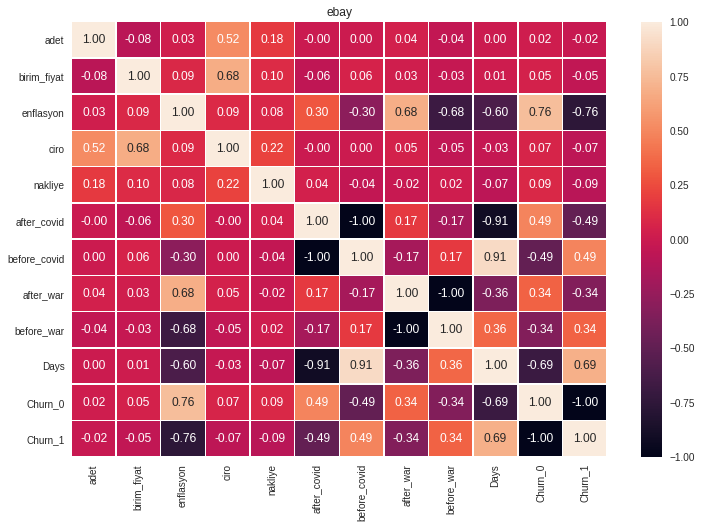

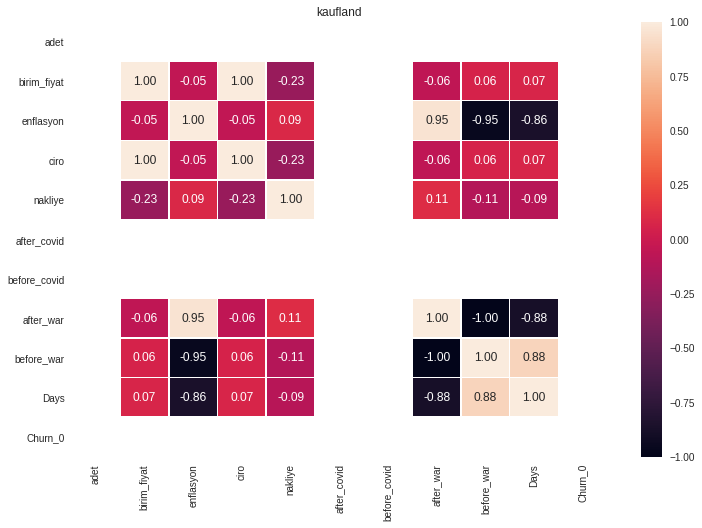

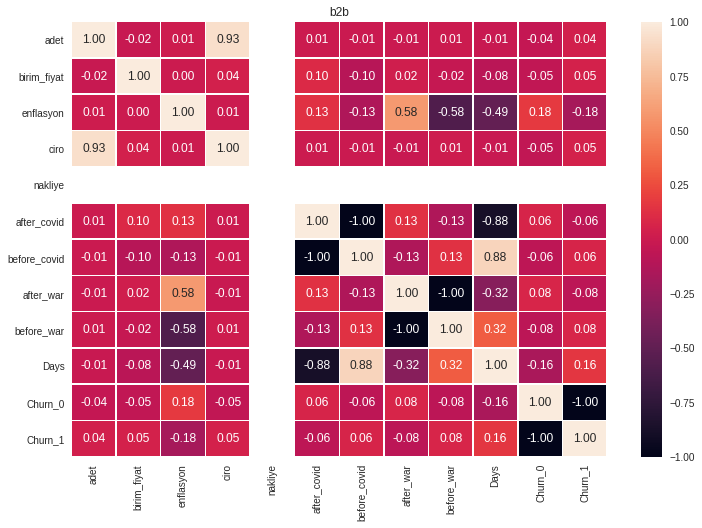

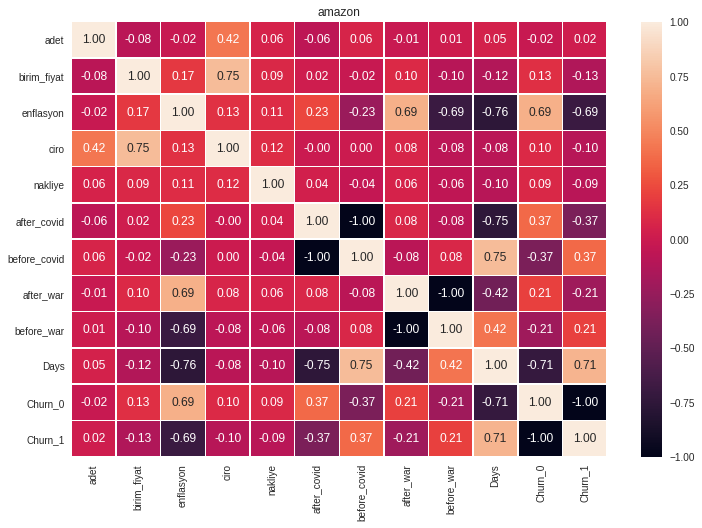

In [432]:
# Correlations 
for i in range(len(platforms)):
    fig, ax = plt.subplots(figsize=(12,8)) 
    plt.title(platforms_string[i])
    #convert categorical columns to numerical
    df_class= pd.get_dummies(platforms[i], columns=['Churn'])
    sns.heatmap(df_class.corr(), annot = True, fmt = ".2f", linewidths=0.5, ax=ax) 
    plt.show()

In [433]:
# Variables and Churn

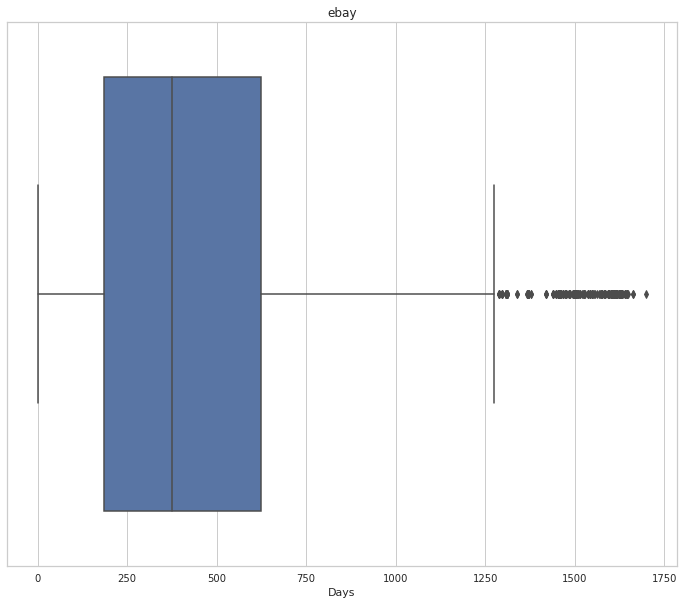

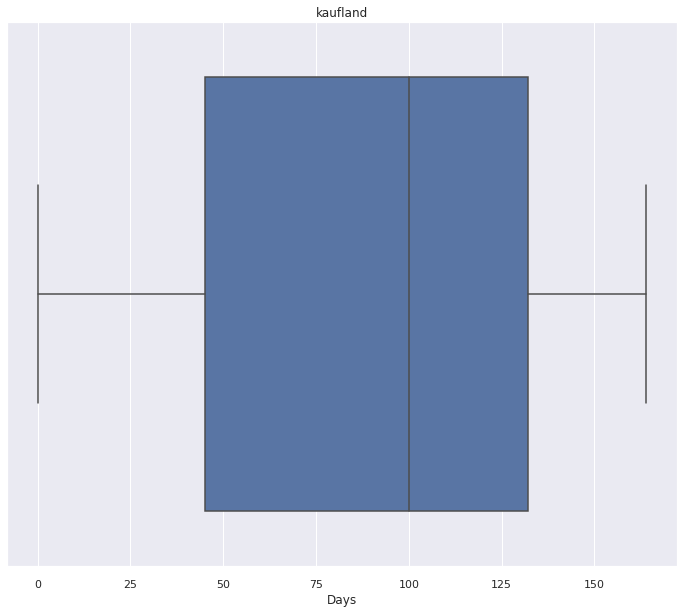

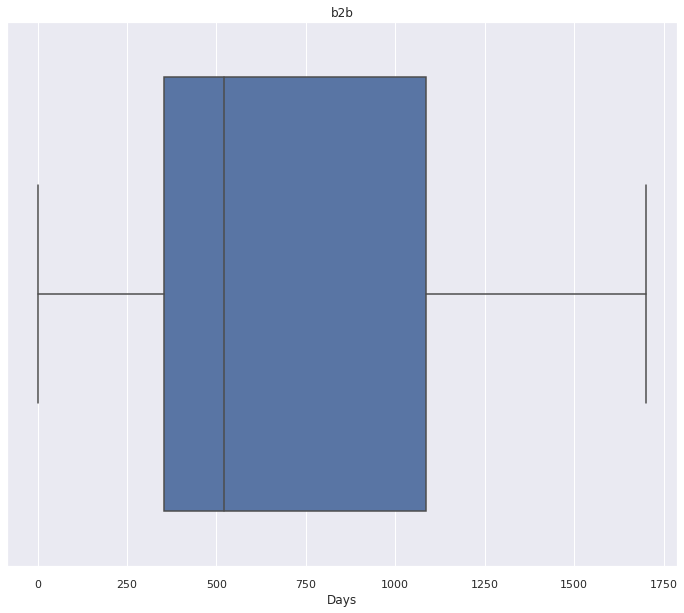

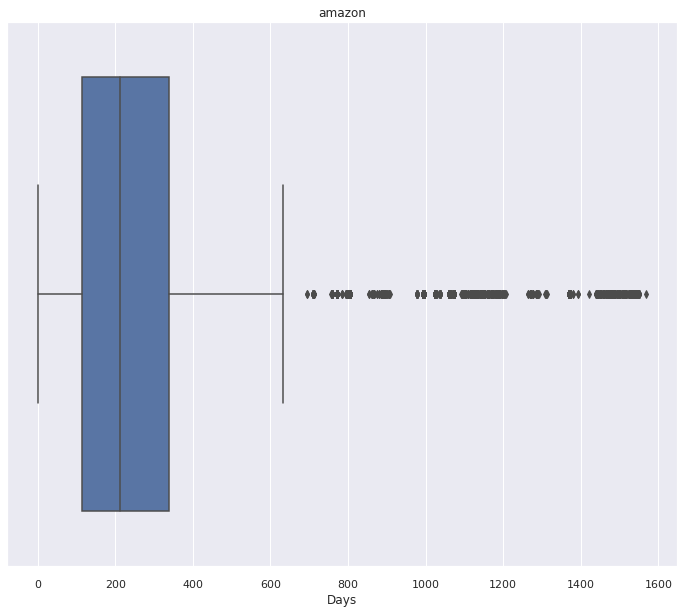

In [434]:

for i in range(len(platforms)):    
    plt.figure(figsize=(12,10))
    plt.title(platforms_string[i])
    sns.set(style='darkgrid')  # style="whitegrid"
    ax = sns.boxplot(x=platforms[i]['Days'], orient='h')

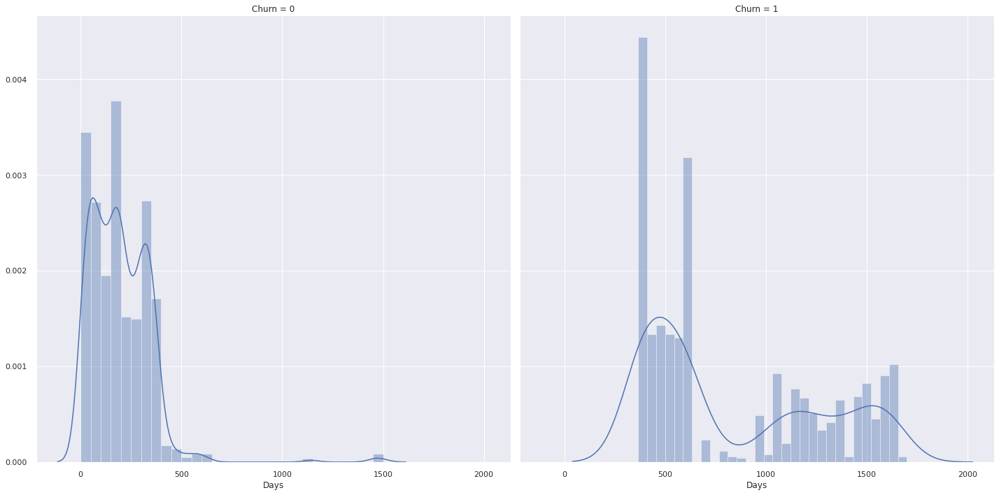

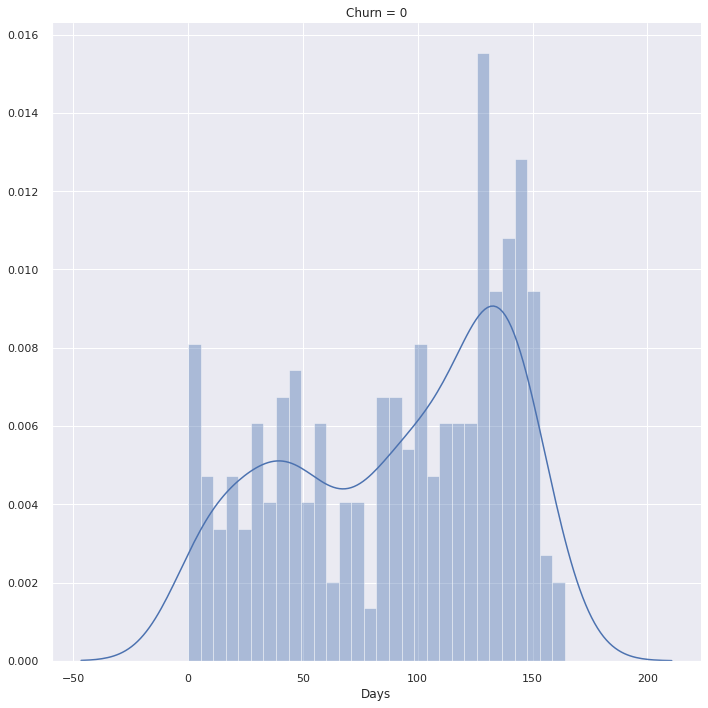

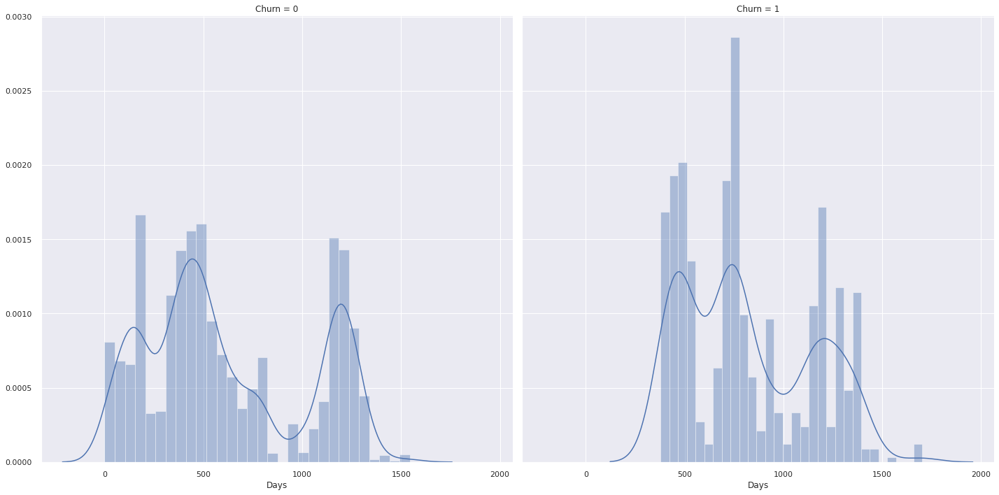

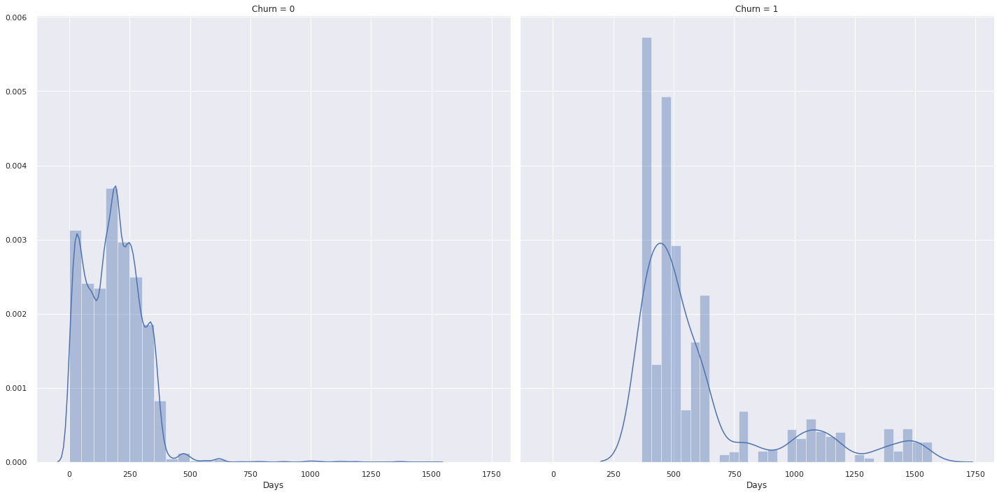

In [435]:

for i in range(len(platforms)):    
    g= sns.FacetGrid(platforms[i], col = "Churn", size = 10)
    plt.title(platforms_string[i])
    g.map(sns.distplot, "Days", bins = 30)
    plt.show()

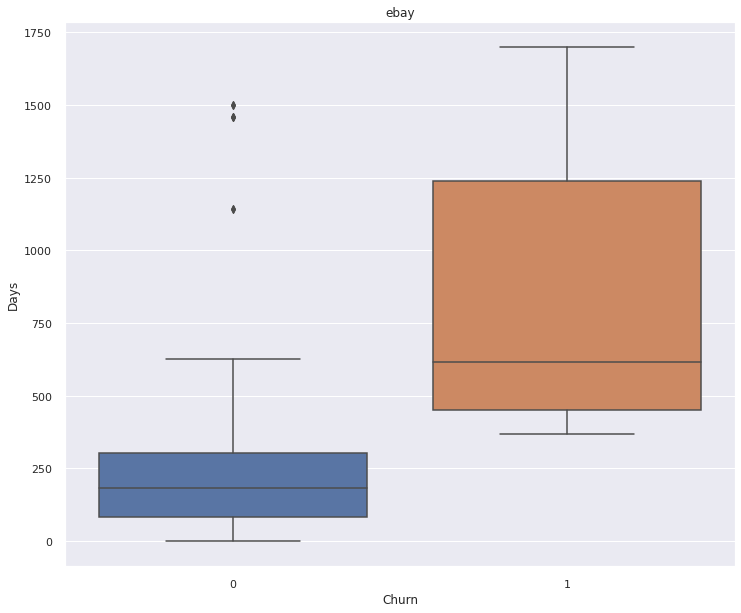

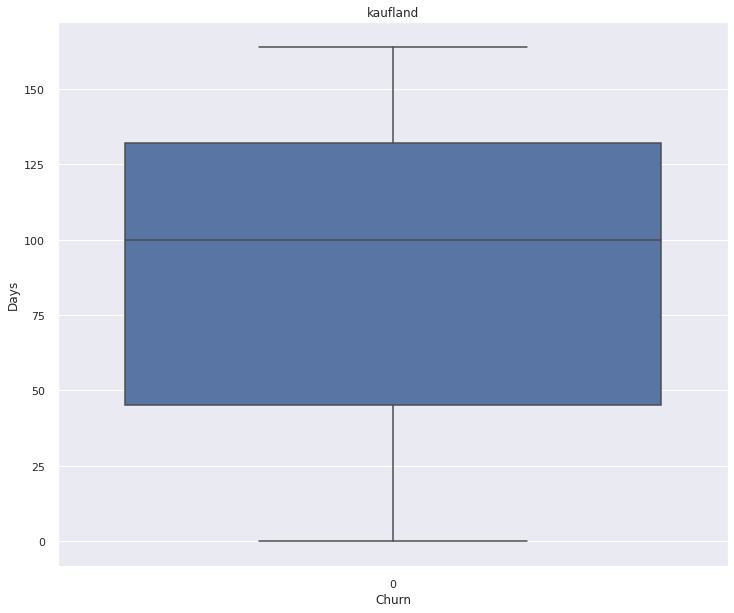

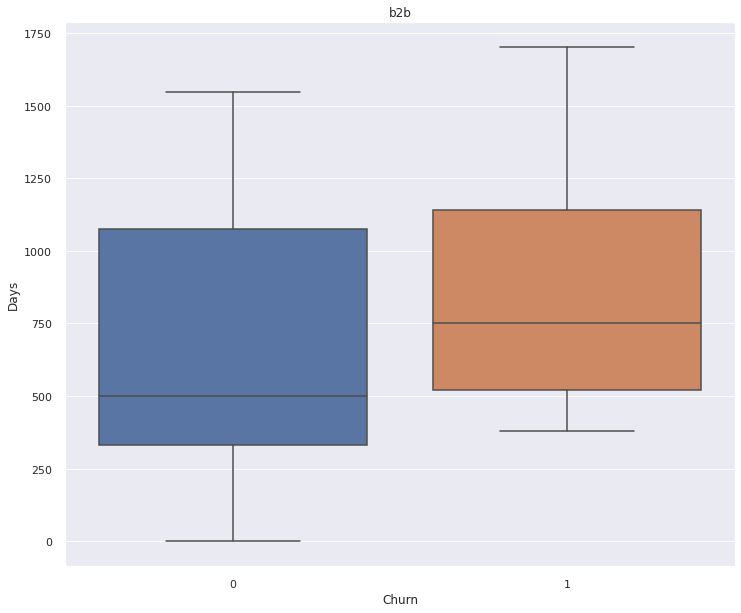

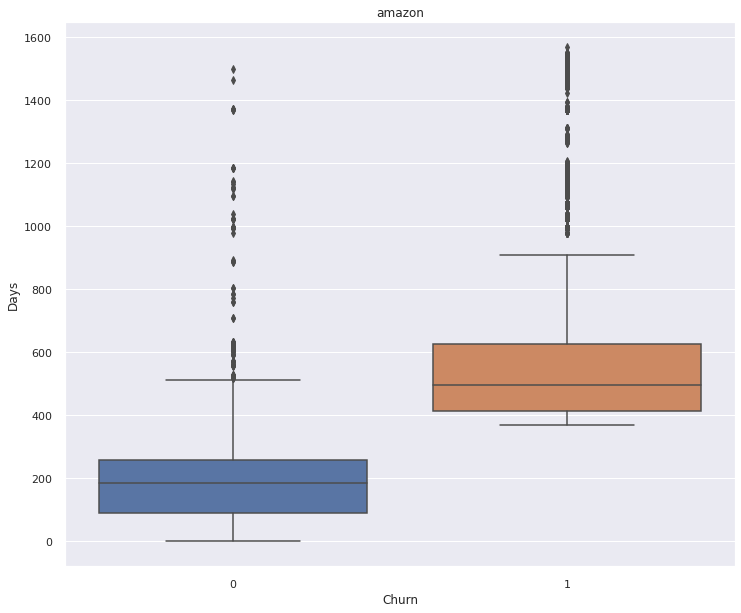

In [436]:

for i in range(len(platforms)):    
    plt.figure(figsize=(12,10))
    plt.title(platforms_string[i])
    sns.set(style='darkgrid')  # style="whitegrid"
    ax = sns.boxplot(x="Churn", y="Days", data=platforms[i])

In [437]:
for i in range(len(platforms)):
    print(platforms_string[i])
    a = platforms[i].groupby(['enflasyon'], as_index=False)['Churn'].agg(['sum','count'])
    a['churn_ratio'] = a['sum']/a['count']
    pd.set_option('display.max_rows', len(a))
    print(a)

ebay
           sum  count  churn_ratio
enflasyon                         
-0.3       164    176     0.931818
-0.2        58     61     0.950820
 0.0       104    106     0.981132
 0.6        12     12     1.000000
 1.1        23     23     1.000000
 1.3       136    145     0.937931
 1.4        72     72     1.000000
 1.5        66     68     0.970588
 1.6       105    105     1.000000
 1.7        88     98     0.897959
 1.9        57     57     1.000000
 2.0        72     85     0.847059
 2.1        47     47     1.000000
 2.3        10    117     0.085470
 2.5       132    219     0.602740
 3.8         0    134     0.000000
 3.9         0     64     0.000000
 4.1         0     39     0.000000
 4.5         0    155     0.000000
 4.9         0     94     0.000000
 5.1         0     55     0.000000
 5.2         0     65     0.000000
 5.3         0     38     0.000000
 7.3         0    134     0.000000
 7.4         0     69     0.000000
 7.6         0     43     0.000000
 7.9         0 

In [438]:
ebay

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days,max_date,Churn
0,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,versandkosten,1.0,0.000000,...,3.617214,versandkosten,0,1,0,1,2022-04-28,1072,2019-05-22,1
1,2019-05-22,ID11001,47533,Kleve,DEU,GERMANY,ebay,cazorla royal kaltgepresstes extra natives oli...,1.0,103.841121,...,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1072,2019-05-22,1
2,2021-10-18,ID27399,51469,Bergisch Gladbach,DEU,GERMANY,ebay,versandkosten 19 %,1.0,0.631887,...,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18,0
3,2021-10-18,ID27399,93055,Regensburg,DEU,GERMANY,ebay,versandkosten 7 %,1.0,3.960799,...,3.617214,versandkosten,1,0,0,1,2022-04-28,192,2021-10-18,0
4,2021-10-18,ID27399,1448ML,Purmerend,NLD,NETHERLANDS,ebay,2 x 100g öz-kayseri - pastirma -rinderschinken...,1.0,6.235294,...,3.617214,pastirma,1,0,0,1,2022-04-28,192,2021-10-18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2290,2022-01-19,IDKundenID5964,1000,other,ATA,ANTARCTICA,ebay,granatapfelsirup 100 % granatapfel konzentrat ...,4.0,27.190000,...,4.990000,nar_eksisi,1,0,0,1,2022-04-28,99,2022-01-19,0
2291,2022-03-27,IDKundenID22566,1000,other,ATA,ANTARCTICA,ebay,walnuss/walnusse in schale 32mm /studentenfutt...,3.0,36.890000,...,4.950000,walnuss,1,0,1,0,2022-04-28,32,2022-03-27,0
2292,2017-11-22,ID10177,85368,Moosburg,DEU,GERMANY,ebay,kaltgepresstes extra natives olivenöl alma oli...,1.0,112.140187,...,3.617214,zeytinyagi,0,1,0,1,2022-04-28,1618,2017-11-22,1
2293,2021-10-19,IDKundenID3578,1000,other,ATA,ANTARCTICA,ebay,efepasa knoblauchwurst scharf - 1000g - parmak...,10.0,11.710000,...,4.990000,sucuk,1,0,0,1,2022-04-28,191,2021-10-19,0


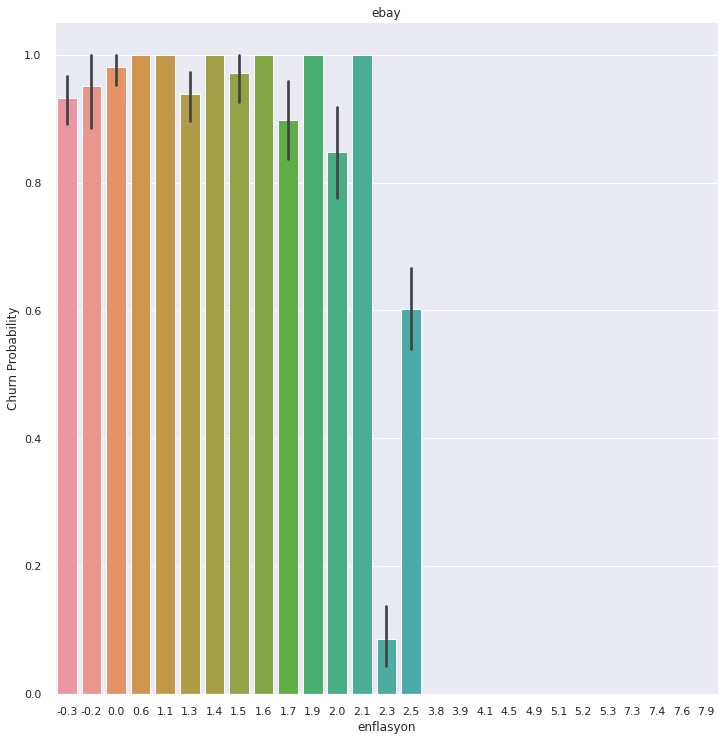

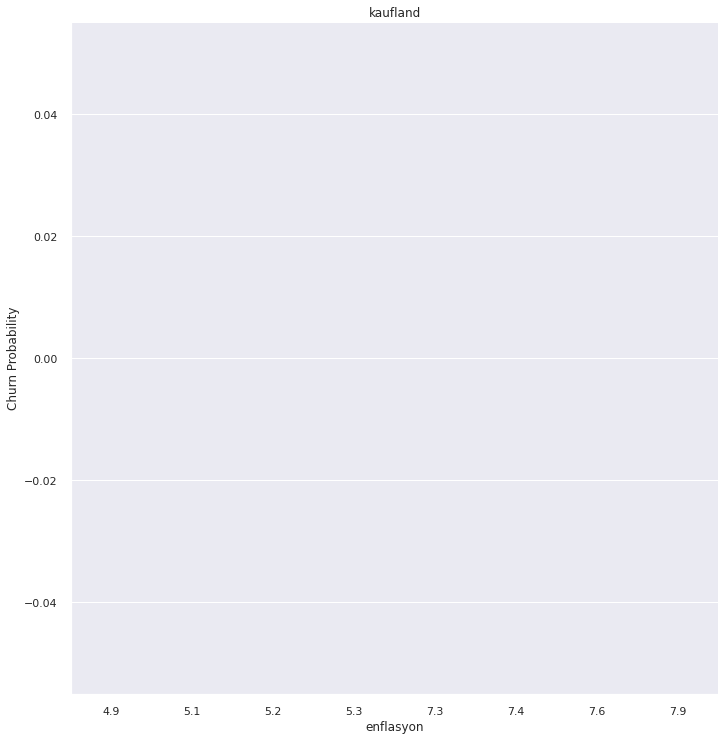

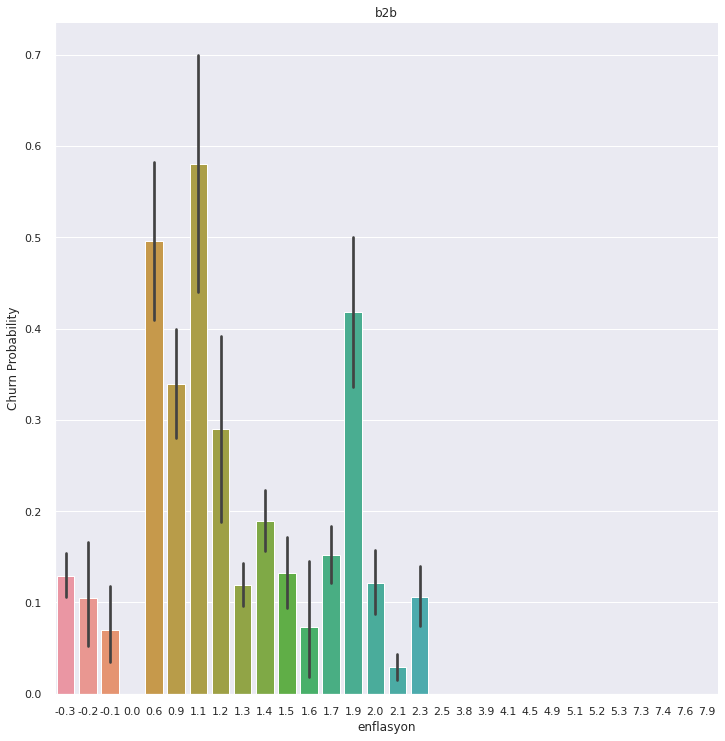

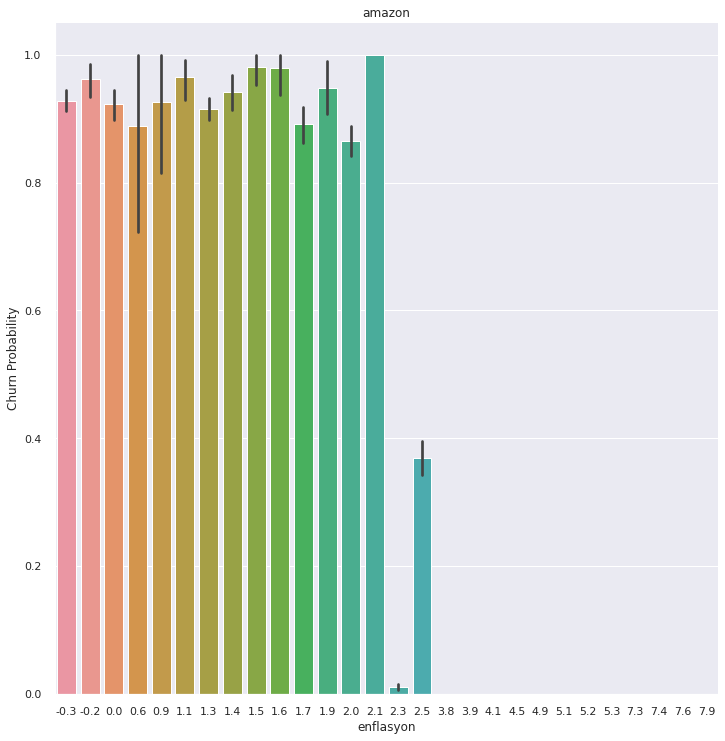

In [439]:
for i in range(len(platforms)):    
    #plt.figure(figsize=(12,10))
    g= sns.factorplot(x = "enflasyon", y = "Churn", data = platforms[i], kind = "bar", size = 10)
    g.set_ylabels("Churn Probability")
    plt.title(platforms_string[i])
    plt.show()

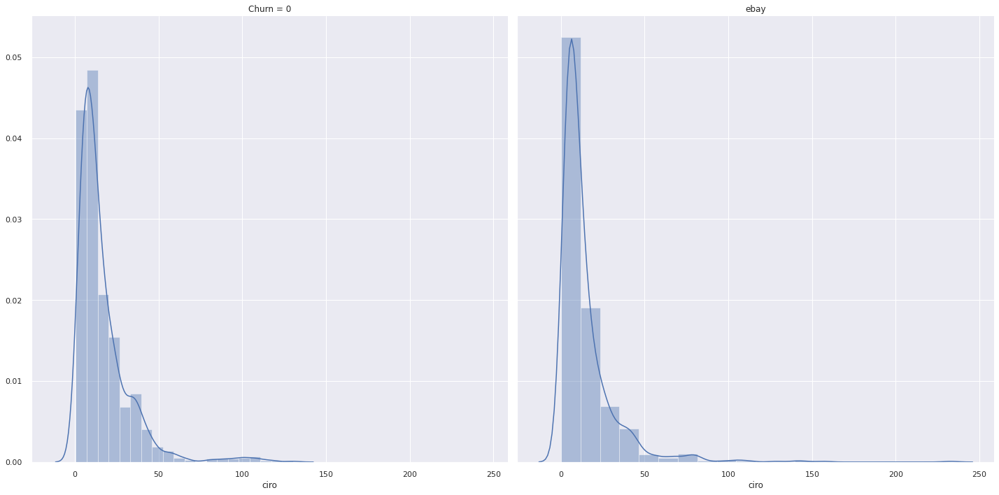

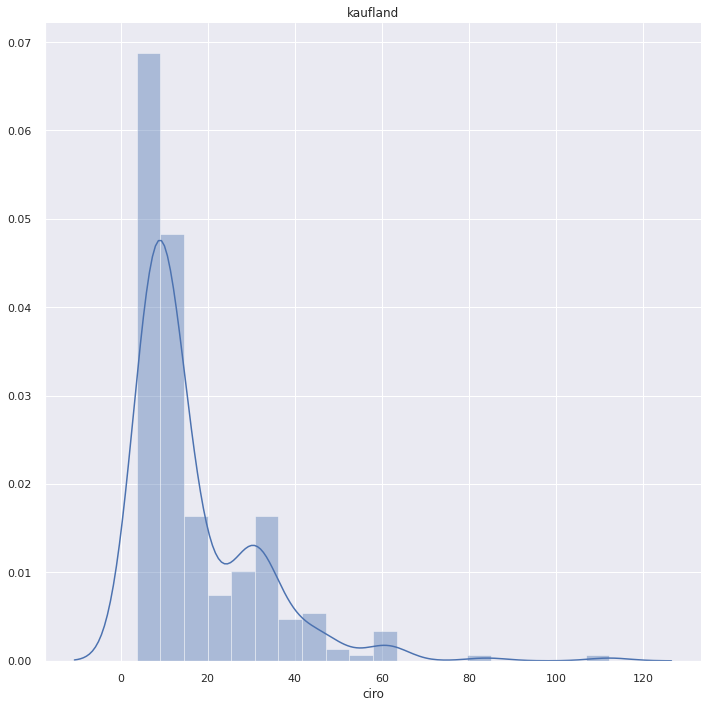

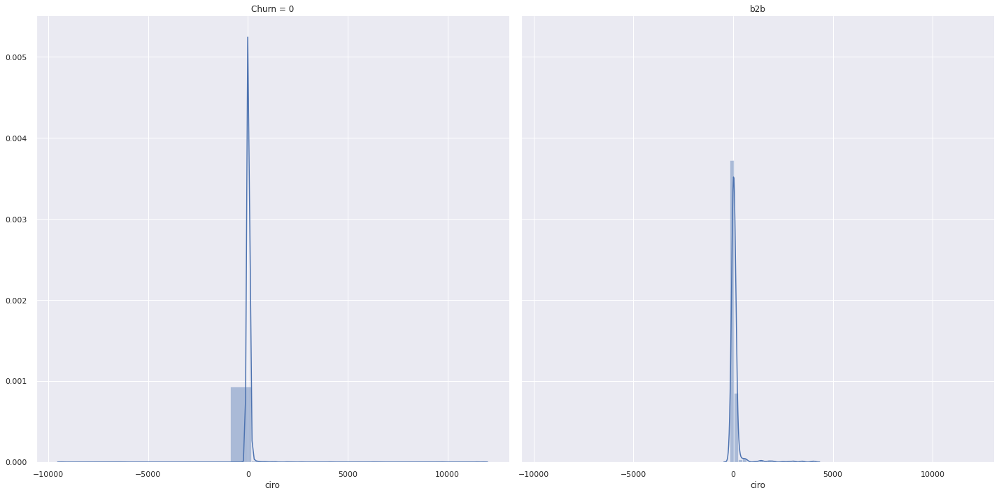

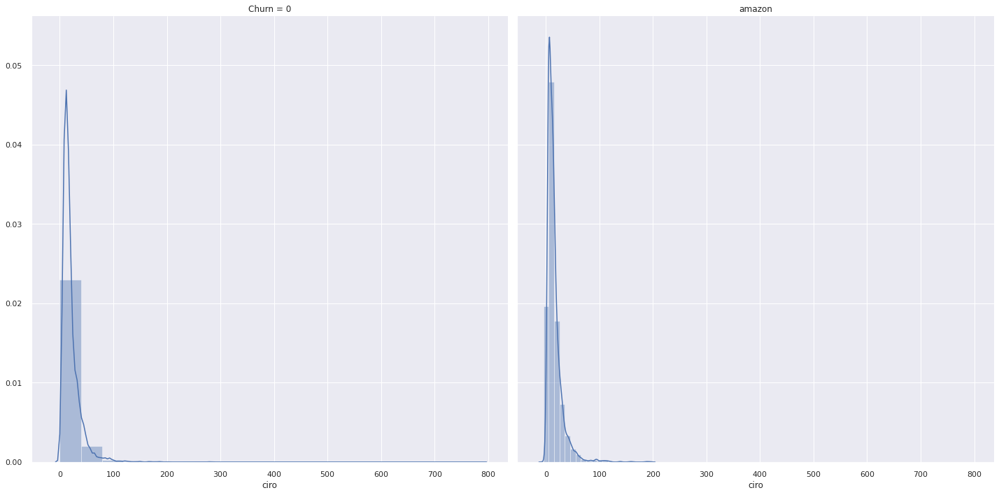

In [441]:
for i in range(len(platforms)):    
    #plt.figure(figsize=(20,10))
    g= sns.FacetGrid(platforms[i], col = "Churn", size =10)
    g.map(sns.distplot, "ciro", bins = 20)
    plt.title(platforms_string[i])
    plt.show() 

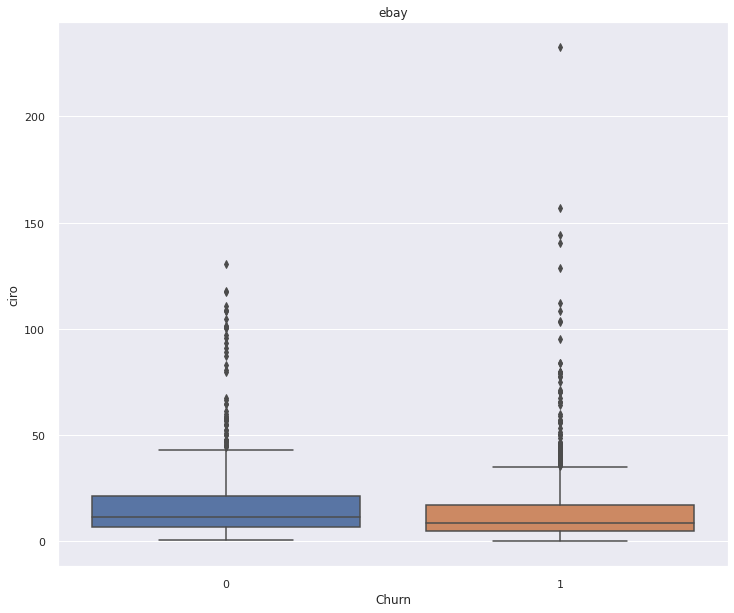

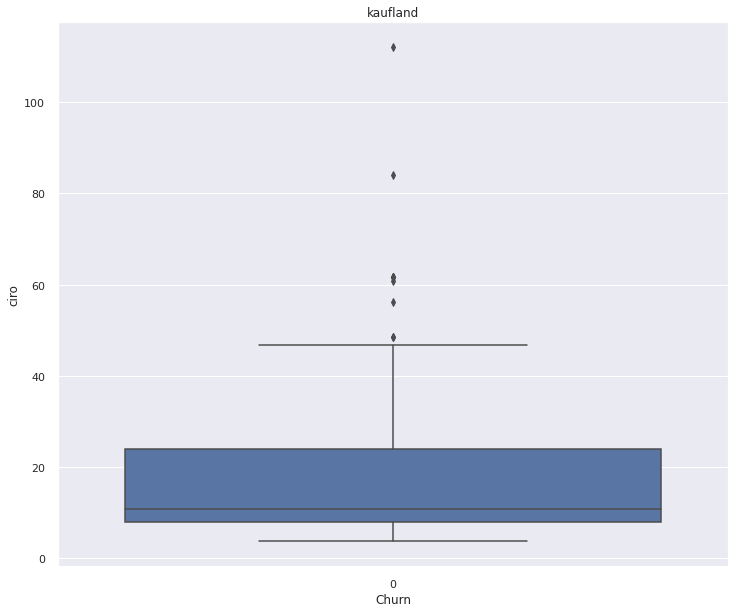

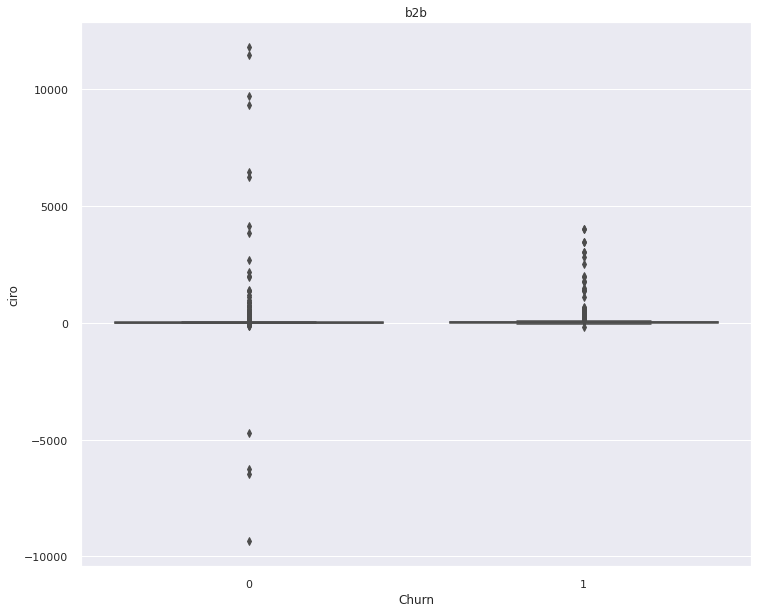

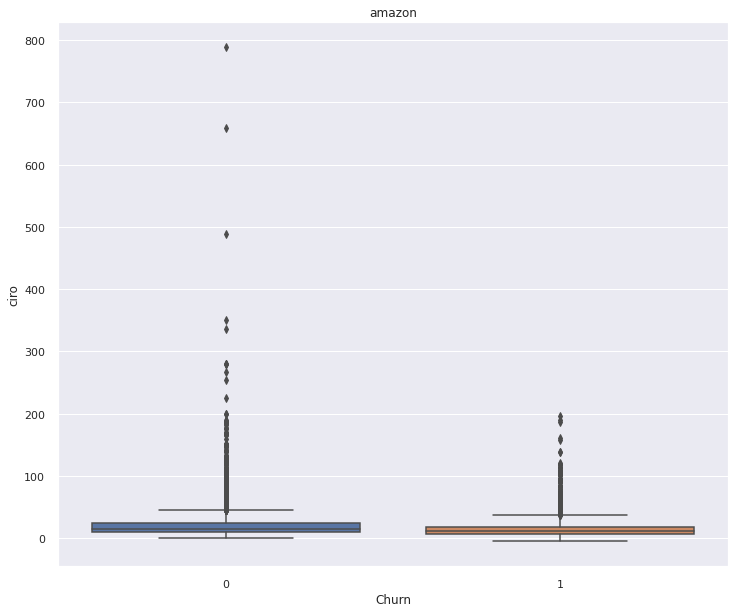

In [442]:

for i in range(len(platforms)):    
    plt.figure(figsize=(12,10))
    plt.title(platforms_string[i])
    sns.set(style='darkgrid')  # style="whitegrid"
    ax = sns.boxplot(x="Churn", y="ciro", data=platforms[i])

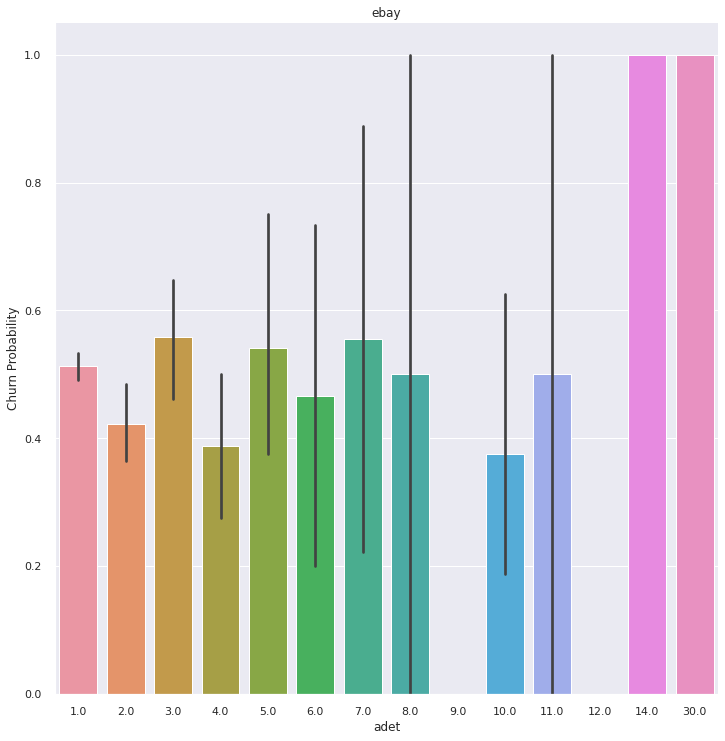

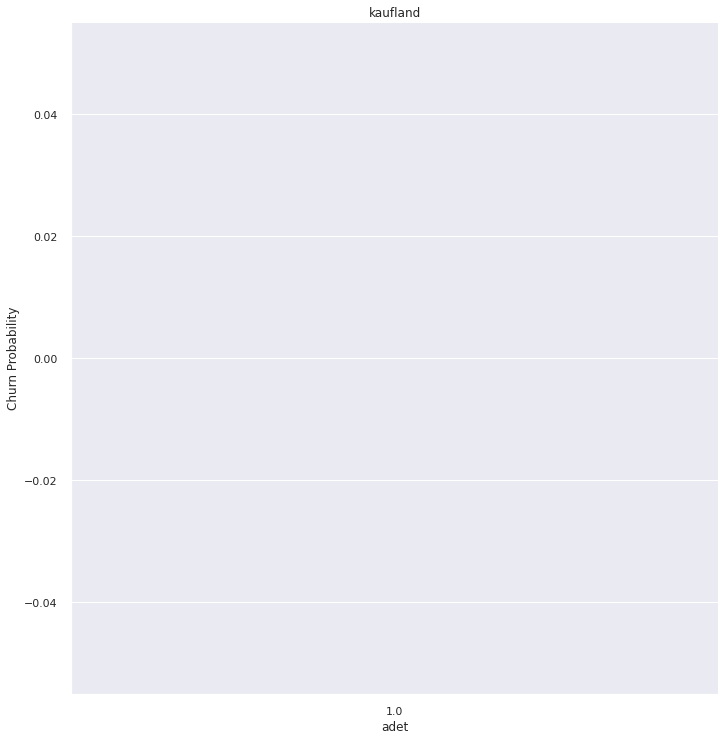

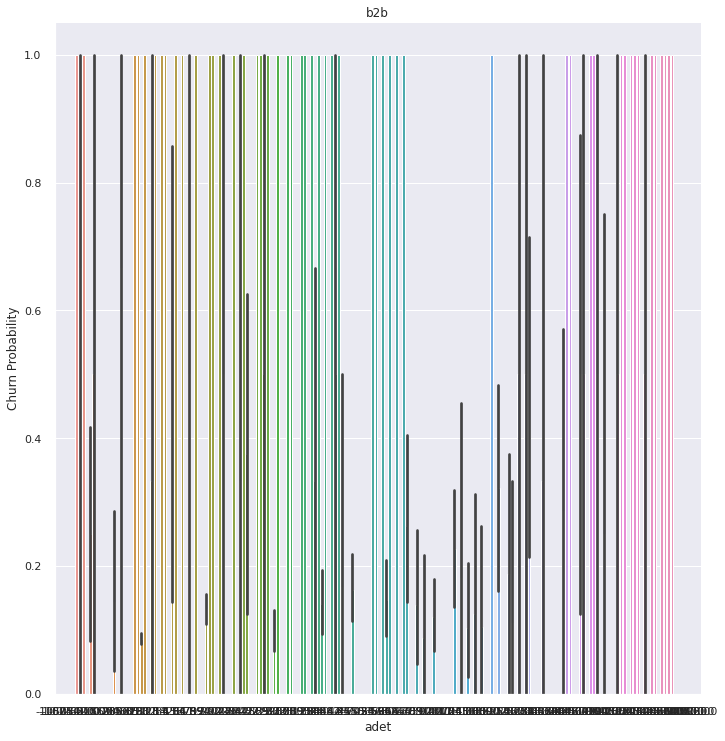

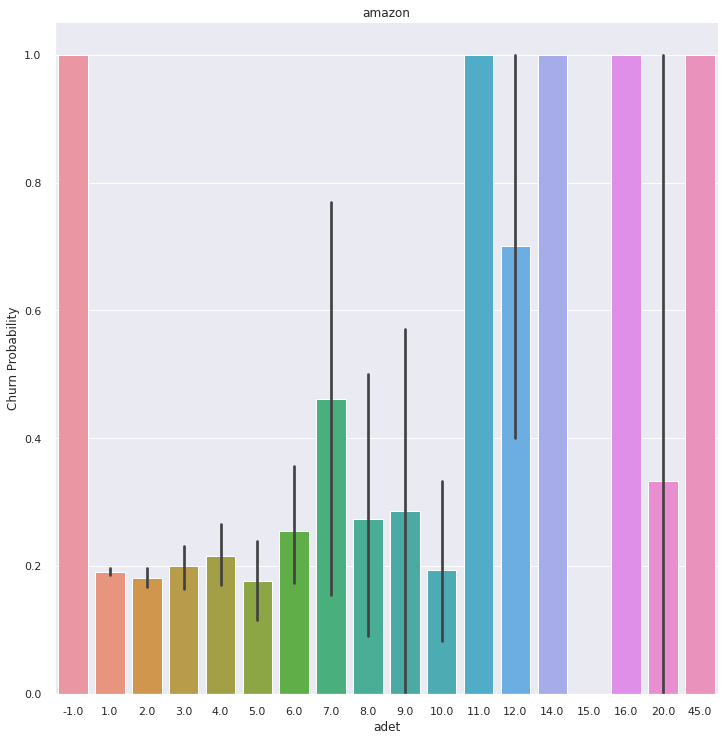

In [443]:
for i in range(len(platforms)):    
    #plt.figure(figsize=(12,10))
    g= sns.factorplot(x = "adet", y = "Churn", data = platforms[i], kind = "bar", size = 10)
    g.set_ylabels("Churn Probability")
    plt.title(platforms_string[i])
    plt.show()

In [444]:
for i in range(len(platforms)):
    print(platforms_string[i])
    a = platforms[i].groupby(['adet'], as_index=False)['Churn'].agg(['sum','count'])
    a['churn_ratio'] = a['sum']/a['count']
    pd.set_option('display.max_rows', len(a))
    print(a)

ebay
      sum  count  churn_ratio
adet                         
1.0   913   1781     0.512633
2.0   109    258     0.422481
3.0    57    102     0.558824
4.0    31     80     0.387500
5.0    13     24     0.541667
6.0     7     15     0.466667
7.0     5      9     0.555556
8.0     2      4     0.500000
9.0     0      1     0.000000
10.0    6     16     0.375000
11.0    1      2     0.500000
12.0    0      1     0.000000
14.0    1      1     1.000000
30.0    1      1     1.000000
kaufland
      sum  count  churn_ratio
adet                         
1.0     0    271          0.0
b2b
           sum  count  churn_ratio
adet                              
-1050.000    0      1     0.000000
-1002.000    0      1     0.000000
-1001.000    0      1     0.000000
-678.000     0      1     0.000000
-25.000      0      1     0.000000
-5.200       0      1     0.000000
-5.000       1      1     1.000000
-4.000       2      3     0.666667
-3.000       1      1     1.000000
-2.500       0      1     0

In [445]:
ebay.columns

Index(['fatura_tarihi', 'Customer', 'posta_kodu', 'city', 'country',
       'country_name', 'satis_yapilan_platform', 'satilan_urun', 'adet',
       'birim_fiyat', 'enflasyon', 'ciro', 'day_of_week', 'nakliye',
       'category', 'after_covid', 'before_covid', 'after_war', 'before_war',
       'date', 'Days', 'max_date', 'Churn'],
      dtype='object')

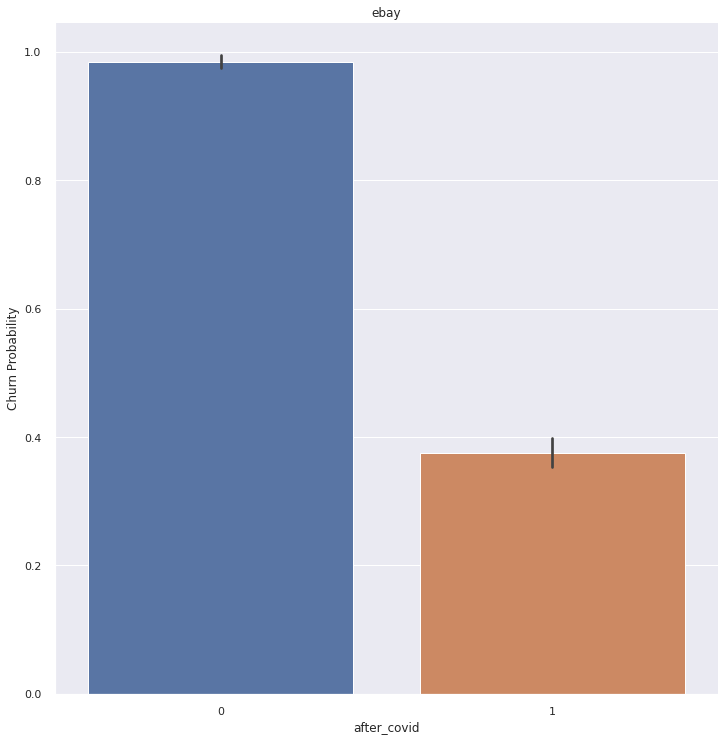

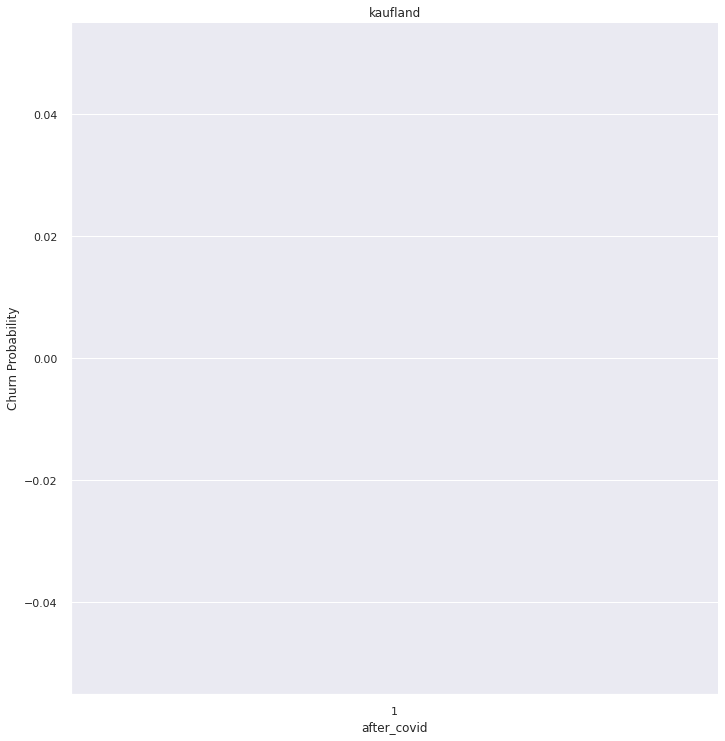

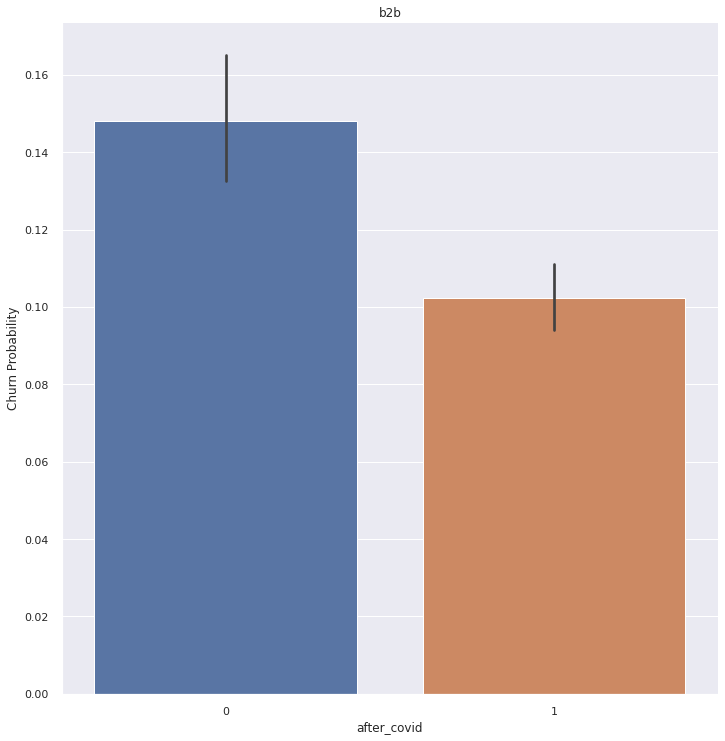

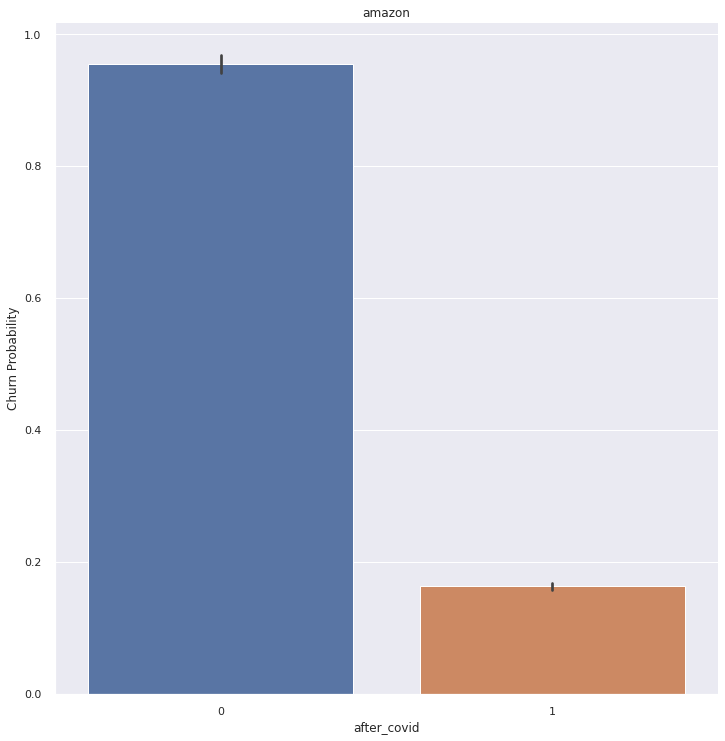

In [446]:
for i in range(len(platforms)):    
    #plt.figure(figsize=(12,10))
    g= sns.factorplot(x = "after_covid", y = "Churn", data = platforms[i], kind = "bar", size = 10)
    g.set_ylabels("Churn Probability")
    plt.title(platforms_string[i])
    plt.show()

In [447]:
for i in range(len(platforms)):
    print(platforms_string[i])
    a = platforms[i].groupby(['after_covid'], as_index=False)['Churn'].agg(['sum','count'])
    a['churn_ratio'] = a['sum']/a['count']
    pd.set_option('display.max_rows', len(a))
    print(a)

ebay
             sum  count  churn_ratio
after_covid                         
0            460    467     0.985011
1            686   1828     0.375274
kaufland
             sum  count  churn_ratio
after_covid                         
1              0    271          0.0
b2b
             sum  count  churn_ratio
after_covid                         
0            277   1870     0.148128
1            476   4649     0.102388
amazon
              sum  count  churn_ratio
after_covid                          
0             825    864     0.954861
1            3792  23272     0.162943


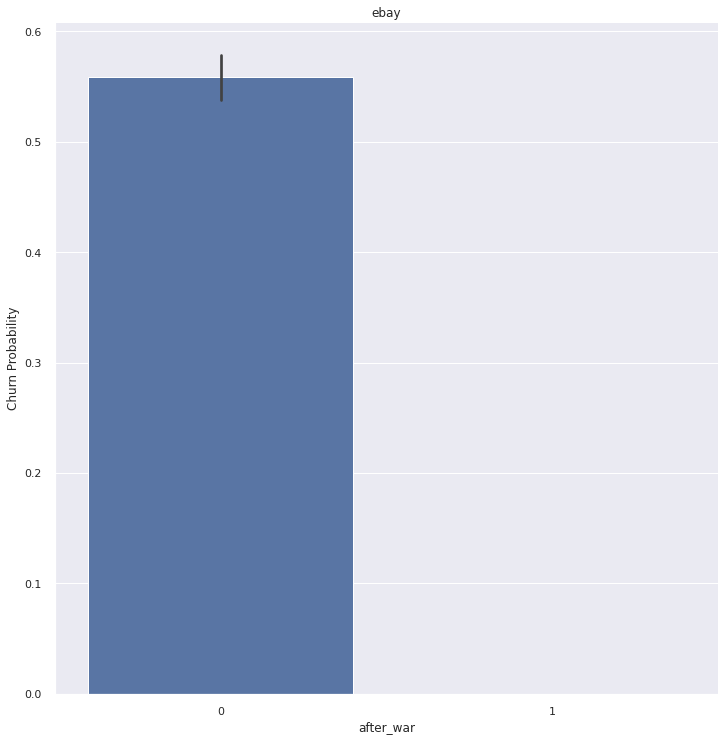

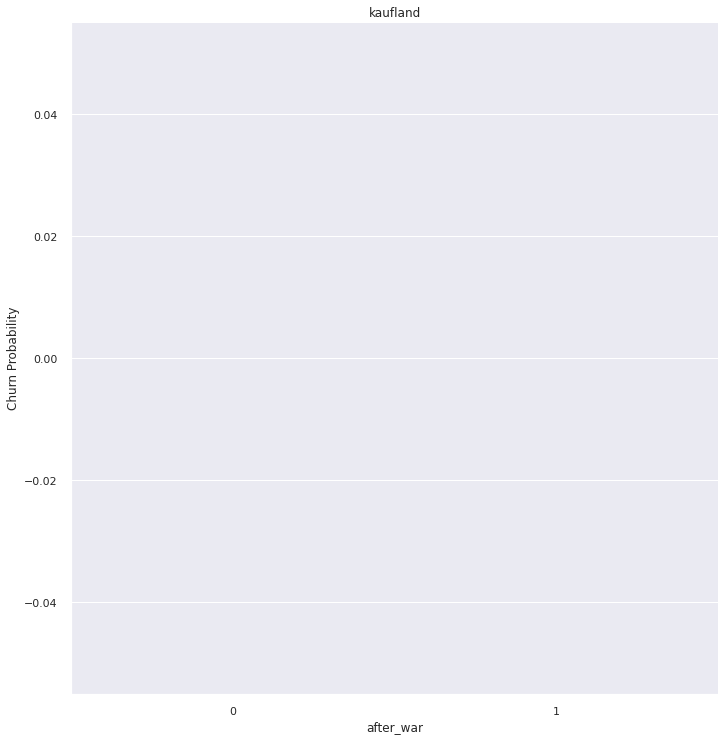

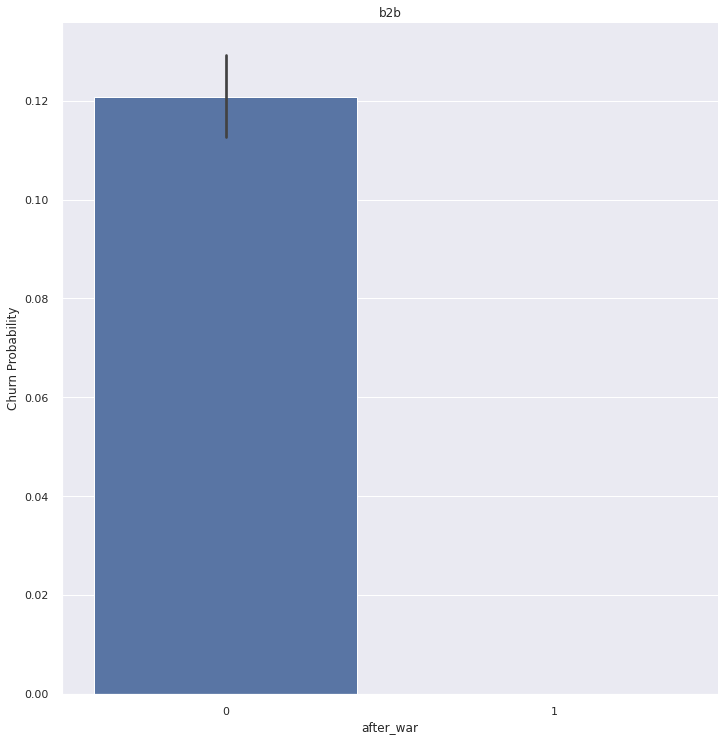

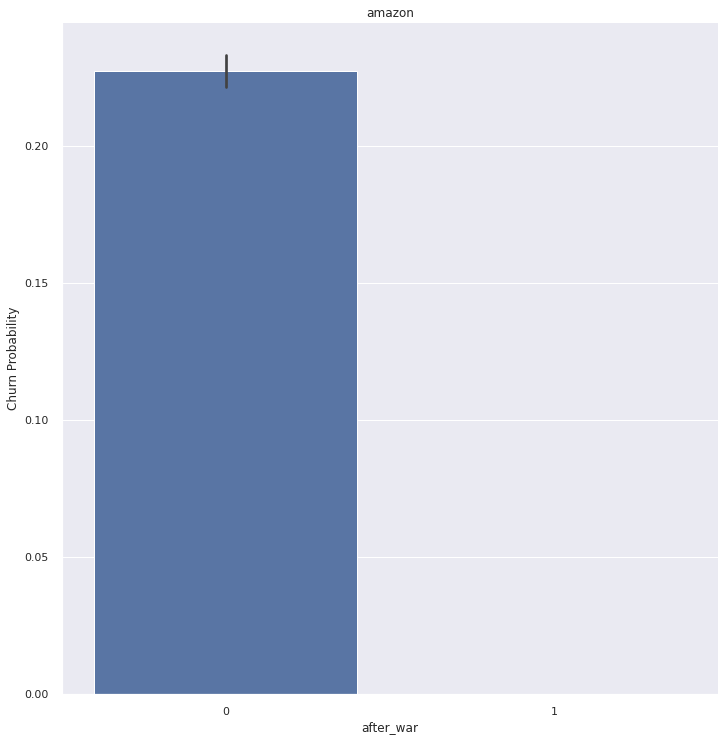

In [448]:
for i in range(len(platforms)):    
    #plt.figure(figsize=(12,10))
    g= sns.factorplot(x = "after_war", y = "Churn", data = platforms[i], kind = "bar", size = 10)
    g.set_ylabels("Churn Probability")
    plt.title(platforms_string[i])
    plt.show()

In [449]:
for i in range(len(platforms)):
    print(platforms_string[i])
    a = platforms[i].groupby(['after_war'], as_index=False)['Churn'].agg(['sum','count'])
    a['churn_ratio'] = a['sum']/a['count']
    pd.set_option('display.max_rows', len(a))
    print(a)

ebay
            sum  count  churn_ratio
after_war                          
0          1146   2052      0.55848
1             0    243      0.00000
kaufland
           sum  count  churn_ratio
after_war                         
0            0    182          0.0
1            0     89          0.0
b2b
           sum  count  churn_ratio
after_war                         
0          753   6240     0.120673
1            0    279     0.000000
amazon
            sum  count  churn_ratio
after_war                          
0          4617  20317     0.227248
1             0   3819     0.000000


In [450]:
ebay.columns

Index(['fatura_tarihi', 'Customer', 'posta_kodu', 'city', 'country',
       'country_name', 'satis_yapilan_platform', 'satilan_urun', 'adet',
       'birim_fiyat', 'enflasyon', 'ciro', 'day_of_week', 'nakliye',
       'category', 'after_covid', 'before_covid', 'after_war', 'before_war',
       'date', 'Days', 'max_date', 'Churn'],
      dtype='object')

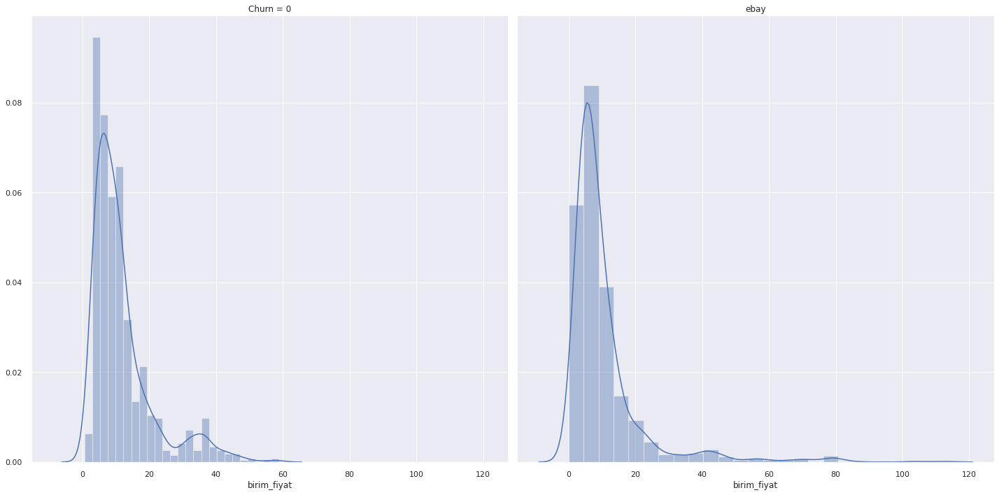

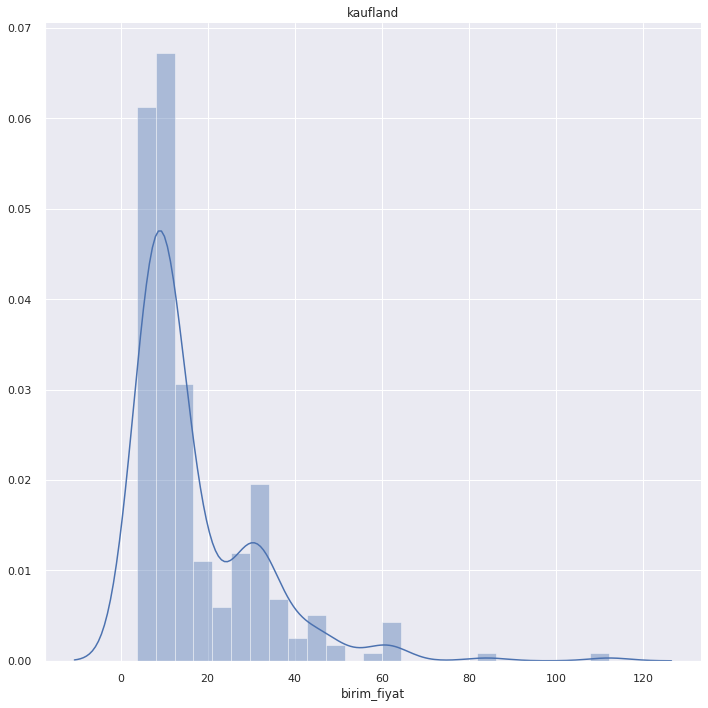

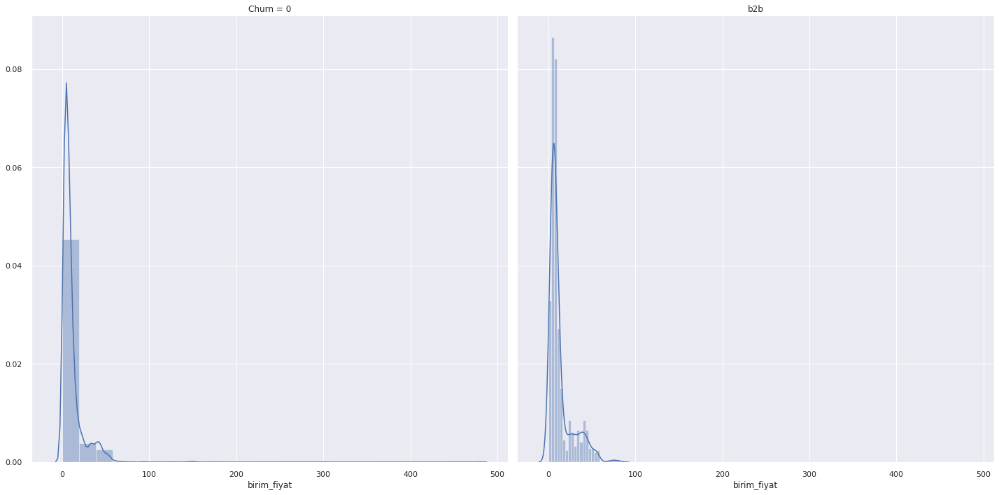

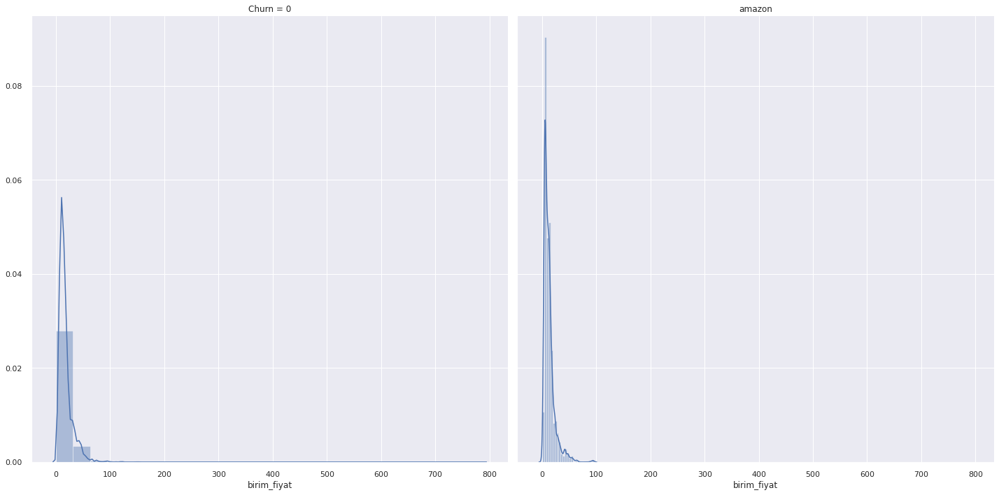

In [451]:
for i in range(len(platforms)):    
    #plt.figure(figsize=(20,10))
    g= sns.FacetGrid(platforms[i], col = "Churn", size =10)
    g.map(sns.distplot, "birim_fiyat", bins = 25)
    plt.title(platforms_string[i])
    plt.show() 

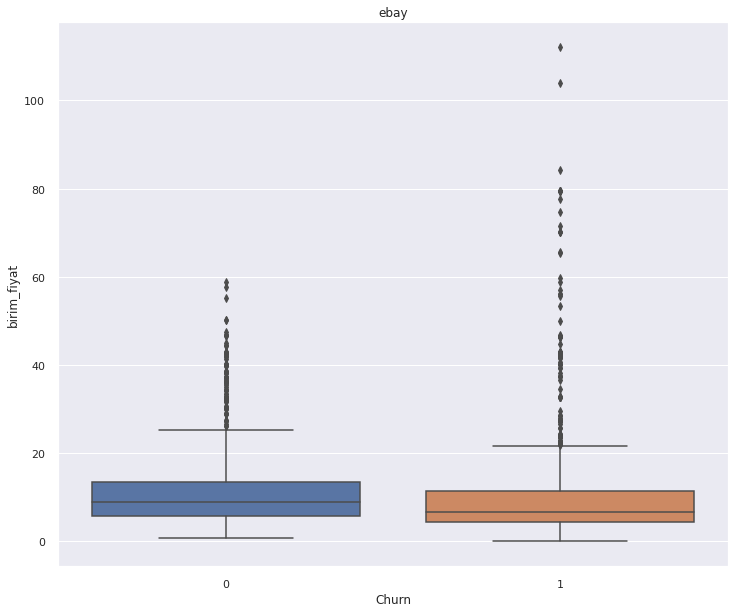

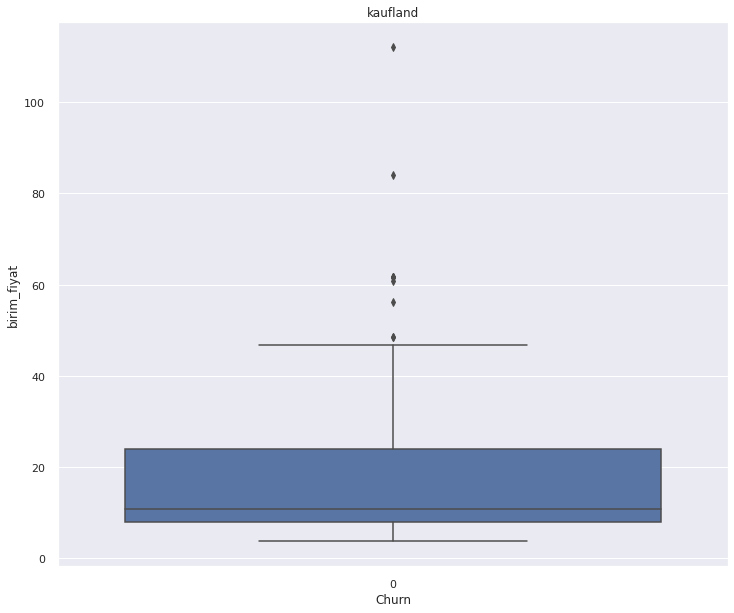

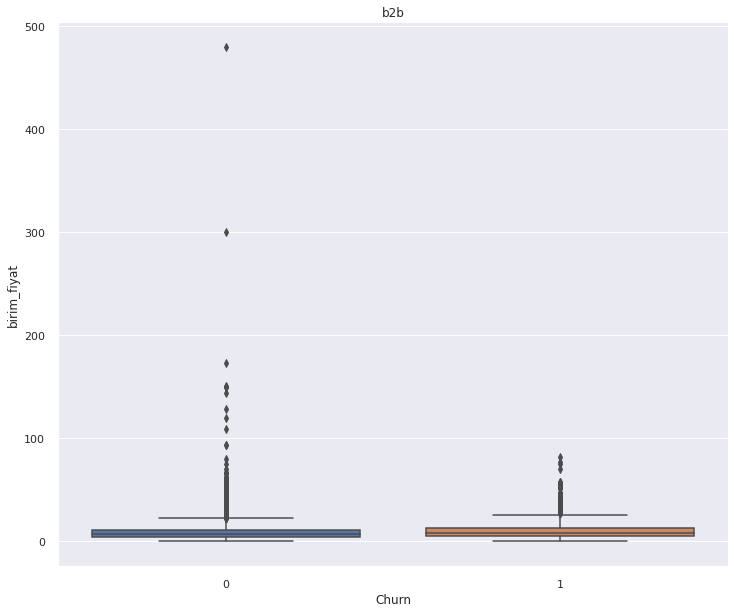

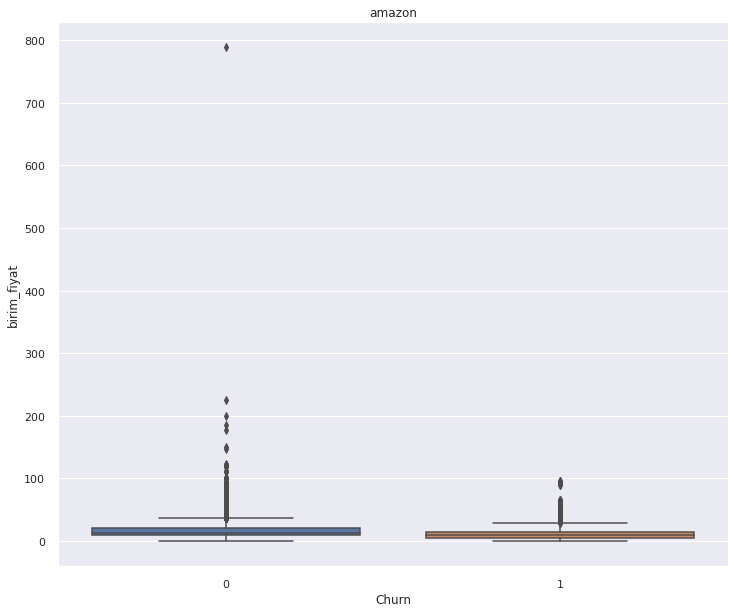

In [452]:

for i in range(len(platforms)):    
    plt.figure(figsize=(12,10))
    plt.title(platforms_string[i])
    sns.set(style='darkgrid')  # style="whitegrid"
    ax = sns.boxplot(x="Churn", y="birim_fiyat", data=platforms[i])
    #ax = sns.swarmplot(x="Churn", y="birim_fiyat", data=platforms[i], color=".25")

In [453]:
ebay.columns

Index(['fatura_tarihi', 'Customer', 'posta_kodu', 'city', 'country',
       'country_name', 'satis_yapilan_platform', 'satilan_urun', 'adet',
       'birim_fiyat', 'enflasyon', 'ciro', 'day_of_week', 'nakliye',
       'category', 'after_covid', 'before_covid', 'after_war', 'before_war',
       'date', 'Days', 'max_date', 'Churn'],
      dtype='object')

In [454]:
amazon

,fatura_tarihi,Customer,posta_kodu,city,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,...,nakliye,category,after_covid,before_covid,after_war,before_war,date,Days,max_date,Churn
0,2020-04-03,ID11393,23843,Bad Oldesloe,DEU,GERMANY,amazon,versandkosten,-1.0,4.626168,...,3.617214,versandkosten,1,0,0,1,2022-04-29,756,2020-04-03,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24135,2022-04-27,IDKundenID7452,1000,other,ATA,ANTARCTICA,amazon,gursoy | nutio | haselnuss milch creme | 25% h...,1.0,789.000000,...,19.430000,haselnuss_butter,1,0,1,0,2022-04-29,2,2022-04-27,0


In [455]:
import category_encoders as ce

In [456]:
# convert city values to numeric

amazon_city = amazon.city
#Create object for binary encoding
encoder= ce.BinaryEncoder(cols=['city'],return_df=True)

#Fit and Transform Data 
amazon_city=encoder.fit_transform(amazon_city) 
print(amazon_city.head())
#Concat amazon_city values in our data set
objs1 = [amazon, amazon_city] #
#print(objs)
ml_amazon = pd.concat(objs1, axis=1).drop('city', axis=1)

    city_0  city_1  city_2  city_3  city_4  city_5  city_6  city_7  city_8  \
0        0       0       0       0       0       0       0       0       0   
..     ...     ...     ...     ...     ...     ...     ...     ...     ...   
4        0       0       0       0       0       0       0       0       0   

    city_9  city_10  city_11  city_12  
0        0        0        0        1  
..     ...      ...      ...      ...  
4        0        0        1        0  

[5 rows x 13 columns]


In [457]:
ml_amazon

,fatura_tarihi,Customer,posta_kodu,country,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,...,city_3,city_4,city_5,city_6,city_7,city_8,city_9,city_10,city_11,city_12
0,2020-04-03,ID11393,23843,DEU,GERMANY,amazon,versandkosten,-1.0,4.626168,0.9,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24135,2022-04-27,IDKundenID7452,1000,ATA,ANTARCTICA,amazon,gursoy | nutio | haselnuss milch creme | 25% h...,1.0,789.000000,7.6,...,0,0,0,0,0,0,0,0,1,0


In [458]:
# convert country values to numeric

amazon_country = amazon.country
#Create object for binary encoding
encoder= ce.BinaryEncoder(cols=['country'],return_df=True)

#Fit and Transform Data 
amazon_country=encoder.fit_transform(amazon_country) 
print(amazon_country.head())
#Concat amazon_city values in our data set
objs2 = [ml_amazon, amazon_country] #
#print(objs)
ml_amazon = pd.concat(objs2, axis=1).drop('country', axis=1)

    country_0  country_1  country_2  country_3  country_4  country_5  \
0           0          0          0          0          0          0   
..        ...        ...        ...        ...        ...        ...   
4           0          0          0          0          0          1   

    country_6  
0           1  
..        ...  
4           0  

[5 rows x 7 columns]


In [459]:
ml_amazon

,fatura_tarihi,Customer,posta_kodu,country_name,satis_yapilan_platform,satilan_urun,adet,birim_fiyat,enflasyon,ciro,...,city_10,city_11,city_12,country_0,country_1,country_2,country_3,country_4,country_5,country_6
0,2020-04-03,ID11393,23843,GERMANY,amazon,versandkosten,-1.0,4.626168,0.9,-4.626168,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24135,2022-04-27,IDKundenID7452,1000,ANTARCTICA,amazon,gursoy | nutio | haselnuss milch creme | 25% h...,1.0,789.000000,7.6,789.000000,...,0,1,0,0,0,0,0,0,1,0


In [460]:
# convert posta_kodu values to numeric

amazon_postakodu = amazon.posta_kodu
#Create object for binary encoding
encoder= ce.BinaryEncoder(cols=['posta_kodu'],return_df=True)

#Fit and Transform Data 
amazon_postakodu=encoder.fit_transform(amazon_postakodu) 
print(amazon_postakodu.head())
#Concat amazon_city values in our data set
objs3 = [ml_amazon, amazon_postakodu] #
#print(objs)
ml_amazon = pd.concat(objs3, axis=1).drop('posta_kodu', axis=1)

    posta_kodu_0  posta_kodu_1  posta_kodu_2  posta_kodu_3  posta_kodu_4  \
0              0             0             0             0             0   
..           ...           ...           ...           ...           ...   
4              0             0             0             0             0   

    posta_kodu_5  posta_kodu_6  posta_kodu_7  posta_kodu_8  posta_kodu_9  \
0              0             0             0             0             0   
..           ...           ...           ...           ...           ...   
4              0             0             0             0             0   

    posta_kodu_10  posta_kodu_11  posta_kodu_12  posta_kodu_13  
0               0              0              0              1  
..            ...            ...            ...            ...  
4               0              0              1              0  

[5 rows x 14 columns]


In [461]:
# convert category values to numeric

amazon_category = amazon.category
#Create object for binary encoding
encoder= ce.BinaryEncoder(cols=['category'],return_df=True)

#Fit and Transform Data 
amazon_category=encoder.fit_transform(amazon_category) 
print(amazon_category.head())
#Concat amazon_city values in our data set
objs5 = [ml_amazon, amazon_category] #
#print(objs)
ml_amazon = pd.concat(objs5, axis=1).drop('category', axis=1)

    category_0  category_1  category_2  category_3  category_4  category_5  \
0            0           0           0           0           0           0   
..         ...         ...         ...         ...         ...         ...   
4            0           0           0           0           0           0   

    category_6  category_7  category_8  
0            0           0           1  
..         ...         ...         ...  
4            0           1           1  

[5 rows x 9 columns]


In [462]:
ml_amazon.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24136 entries, 0 to 24135
Data columns (total 62 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   fatura_tarihi           24136 non-null  datetime64[ns]
 1   Customer                24136 non-null  object        
 2   country_name            24136 non-null  object        
 3   satis_yapilan_platform  24136 non-null  object        
 4   satilan_urun            24136 non-null  object        
 5   adet                    24136 non-null  float64       
 6   birim_fiyat             24136 non-null  float64       
 7   enflasyon               24136 non-null  float64       
 8   ciro                    24136 non-null  float64       
 9   day_of_week             24136 non-null  object        
 10  nakliye                 24136 non-null  float64       
 11  after_covid             24136 non-null  int64         
 12  before_covid            24136 non-null  int64 

In [463]:
# Dummy encoding for day_of_week
ml_amazon= pd.get_dummies(ml_amazon, columns = ['day_of_week'], drop_first=True)

In [464]:
ml_amazon.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24136 entries, 0 to 24135
Data columns (total 67 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   fatura_tarihi           24136 non-null  datetime64[ns]
 1   Customer                24136 non-null  object        
 2   country_name            24136 non-null  object        
 3   satis_yapilan_platform  24136 non-null  object        
 4   satilan_urun            24136 non-null  object        
 5   adet                    24136 non-null  float64       
 6   birim_fiyat             24136 non-null  float64       
 7   enflasyon               24136 non-null  float64       
 8   ciro                    24136 non-null  float64       
 9   nakliye                 24136 non-null  float64       
 10  after_covid             24136 non-null  int64         
 11  before_covid            24136 non-null  int64         
 12  after_war               24136 non-null  int64 

In [465]:
ml_amazon = ml_amazon.drop(['fatura_tarihi', 'country_name','satis_yapilan_platform','satilan_urun','date','max_date' ], axis=1)

In [466]:
ml_amazon["Churn"]=ml_amazon["Churn"].astype('int')

In [467]:
# Splitting the data as train and validation data

In [468]:
xs = ml_amazon.drop(['Churn'], axis=1)
target = ml_amazon["Churn"]
x_train, x_val, y_train, y_val = train_test_split(xs, target, shuffle=True, test_size = 0.30, random_state = 0)

val_ids = x_val['Customer']
train_ids=x_train['Customer']

x_train = x_train.drop(['Customer'], axis=1)
x_val= x_val.drop(['Customer'], axis=1)

df_train=ml_amazon[ml_amazon['Customer'].isin(train_ids)]
df_val=ml_amazon[ml_amazon['Customer'].isin(val_ids)]

In [469]:
x_train.shape

(16895, 59)

In [470]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16895 entries, 18237 to 2732
Data columns (total 59 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adet                   16895 non-null  float64
 1   birim_fiyat            16895 non-null  float64
 2   enflasyon              16895 non-null  float64
 3   ciro                   16895 non-null  float64
 4   nakliye                16895 non-null  float64
 5   after_covid            16895 non-null  int64  
 6   before_covid           16895 non-null  int64  
 7   after_war              16895 non-null  int64  
 8   before_war             16895 non-null  int64  
 9   Days                   16895 non-null  int64  
 10  city_0                 16895 non-null  int64  
 11  city_1                 16895 non-null  int64  
 12  city_2                 16895 non-null  int64  
 13  city_3                 16895 non-null  int64  
 14  city_4                 16895 non-null  int64  
 15 

In [471]:
#Memory reduction # Below codes will run nearly for more than one hour!

In [472]:
# Memory reduction

In [473]:
x_train

,adet,birim_fiyat,enflasyon,ciro,nakliye,after_covid,before_covid,after_war,before_war,Days,...,category_5,category_6,category_7,category_8,day_of_week_Monday,day_of_week_Saturday,day_of_week_Sunday,day_of_week_Thursday,day_of_week_Tuesday,day_of_week_Wednesday
18237,1.0,20.981308,1.3,20.981308,3.617214,1,0,0,1,468,...,0,0,0,1,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2732,1.0,14.000000,-0.3,14.000000,3.617214,1,0,0,1,556,...,1,0,0,0,0,0,0,0,1,0


In [474]:
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

    return df

In [475]:
for df in [x_train,x_val]:
    reduce_mem_usage(df) 

Memory usage after optimization is: 1.18 MB
Decreased by 83.3%
Memory usage after optimization is: 0.50 MB
Decreased by 83.3%


In [476]:
# Modeling, Evaluation and Model Tuning

In [477]:
# Validation Set Accuracy for the default models

In [478]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,VotingClassifier,BaggingClassifier
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score,KFold
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler 
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier


In [479]:
r=42
models = [LogisticRegression(random_state=r),GaussianNB(), KNeighborsClassifier(),
          SVC(random_state=r,probability=True),BaggingClassifier(random_state=r),DecisionTreeClassifier(random_state=r),
          RandomForestClassifier(random_state=r), GradientBoostingClassifier(random_state=r),
          XGBClassifier(random_state=r), MLPClassifier(random_state=r),
          CatBoostClassifier(random_state=r,verbose = False)]
names = ["LogisticRegression","GaussianNB","KNN","SVC","Bagging",
             "DecisionTree","Random_Forest","GBM","XGBoost","Art.Neural_Network","CatBoost"]

In [480]:
print('Default model validation accuracies for the train data:', end = "\n\n")
for name, model in zip(names, models):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_val) 
    print(name,':',"%.3f" % accuracy_score(y_pred, y_val))

Default model validation accuracies for the train data:

LogisticRegression : 0.952
GaussianNB : 0.791
KNN : 0.978
SVC : 0.973
Bagging : 0.977
DecisionTree : 0.970
Random_Forest : 0.980
GBM : 0.981
[04:27:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBoost : 0.981
Art.Neural_Network : 0.978
CatBoost : 0.982


In [481]:
# Cross validation accuracy and std of the default models for the train data

In [482]:
predictors=pd.concat([x_train,x_val])

In [483]:
results = []
print('10 fold Cross validation accuracy and std of the default models for the train data:', end = "\n\n")
for name, model in zip(names, models):
    kfold = KFold(n_splits=10, random_state=1001, shuffle = True)
    cv_results = cross_val_score(model, predictors, target, cv = kfold, scoring = "accuracy")
    results.append(cv_results)
    print("{}: {} ({})".format(name, "%.3f" % cv_results.mean() ,"%.3f" %  cv_results.std()))

10 fold Cross validation accuracy and std of the default models for the train data:

LogisticRegression: 0.809 (0.005)
GaussianNB: 0.738 (0.012)
KNN: 0.779 (0.005)
SVC: 0.809 (0.005)
Bagging: 0.780 (0.005)
DecisionTree: 0.673 (0.006)
Random_Forest: 0.789 (0.004)
GBM: 0.809 (0.005)
[04:53:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:53:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:53:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if yo

In [484]:
from xgboost import plot_tree


from xgboost import plot_importance



In [485]:
# Model tuning using crossvalidation

In [486]:
# Possible hyper parameters
logreg_params= {"C":np.logspace(-1, 1, 10),
                    "penalty": ["l1","l2"], "solver":['lbfgs', 'liblinear', 'sag', 'saga'], "max_iter":[1000]}

NB_params = {'var_smoothing': np.logspace(0,-9, num=100)}
knn_params= {"n_neighbors": np.linspace(1,19,10, dtype = int).tolist(),
                 "weights": ["uniform","distance"],
                 "metric":["euclidean","manhattan"]}
svc_params= {"kernel" : ["rbf"],
                 "gamma": [0.001, 0.01, 0.1, 1, 5, 10 ,50 ,100],
                 "C": [1,10,50,100,200,300,1000]}
bag_params={"n_estimators":[50,120,300]}
dtree_params = {"min_samples_split" : range(10,500,20),
                "max_depth": range(1,20,2)}
rf_params = {"max_features": ["log2","auto","sqrt"],
                "min_samples_split":[2,3,5],
                "min_samples_leaf":[1,3,5],
                "bootstrap":[True,False],
                "n_estimators":[50,100,150],
                "criterion":["gini","entropy"]}
gbm_params = {"learning_rate" : [0.001, 0.01, 0.1, 0.05],
             "n_estimators": [100,500,1000],
             "max_depth": [3,5,10],
             "min_samples_split": [2,5,10]}
gbm_params = {"learning_rate" : [0.001, 0.01, 0.1, 0.05],
             "n_estimators": [100,500,100],
             "max_depth": [3,5,10],
             "min_samples_split": [2,5,10]}

xgb_params ={
        'n_estimators': [50, 100, 200],
        'subsample': [ 0.6, 0.8, 1.0],
        'max_depth': [1,2,3,4],
        'learning_rate': [0.1,0.2, 0.3, 0.4, 0.5],
        "min_samples_split": [1,2,4,6]}

mlpc_params = {"alpha": [0.1, 0.01, 0.02, 0.005, 0.0001,0.00001],
              "hidden_layer_sizes": [(10,10,10),
                                     (100,100,100),
                                     (100,100),
                                     (3,5), 
                                     (5, 3)],
              "solver" : ["lbfgs","adam","sgd"],"max_iter":[1000]}
catb_params =  {'depth':[2, 3, 4],
              'loss_function': ['Logloss', 'CrossEntropy'],
              'l2_leaf_reg':np.arange(2,31)}
classifier_params = [logreg_params,NB_params,knn_params,svc_params,bag_params,dtree_params,rf_params,
                     gbm_params, xgb_params,mlpc_params,catb_params]               
                  

In [487]:
#timer
import time
from contextlib import contextmanager

@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} done in {:.0f}s".format(title, time.time() - t0))



In [487]:
# Tuning by Cross Validation  
cv_result = {}
best_estimators = {}
for name, model,classifier_param in zip(names, models,classifier_params):
    with timer(">Model tuning"):
        clf = GridSearchCV(model, param_grid=classifier_param, cv =10, scoring = "accuracy", n_jobs = -1,verbose = False)
        clf.fit(x_train,y_train)
        cv_result[name]=clf.best_score_
        best_estimators[name]=clf.best_estimator_
        print(name,'cross validation accuracy : %.3f'%cv_result[name])

LogisticRegression cross validation accuracy : 0.962
>Model tuning done in 1499s
GaussianNB cross validation accuracy : 0.961
>Model tuning done in 8s
KNN cross validation accuracy : 0.980
>Model tuning done in 214s


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-488-a37bb162f1bc>", line 7, in <module>
    clf.fit(x_train,y_train)
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py", line 875, in fit
    self._run_search(evaluate_candidates)
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py", line 1379, in _run_search
    evaluate_candidates(ParameterGrid(self.param_grid))
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py", line 822, in evaluate_candidates
    out = parallel(
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/joblib/parallel.py", line 1054, in __call__
    self.retrieve()
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/joblib/parallel.py", line 933, in retrieve
    sel

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-488-a37bb162f1bc>", line 7, in <module>
    clf.fit(x_train,y_train)
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py", line 875, in fit
    self._run_search(evaluate_candidates)
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py", line 1379, in _run_search
    evaluate_candidates(ParameterGrid(self.param_grid))
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py", line 822, in evaluate_candidates
    out = parallel(
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/joblib/parallel.py", line 1054, in __call__
    self.retrieve()
  File "/home/tuba/anaconda3/lib/python3.8/site-packages/joblib/parallel.py", line 933, in retrieve
    sel

TypeError: object of type 'NoneType' has no len()

In [ ]:
accuracies={}
print('Validation accuracies of the tuned models for the train data:', end = "\n\n")
for name, model_tuned in zip(best_estimators.keys(),best_estimators.values()):
    y_pred =  model_tuned.fit(x_train,y_train).predict(x_val)
    accuracy=accuracy_score(y_pred, y_val)
    print(name,':', "%.3f" %accuracy)
    accuracies[name]=accuracy

In [ ]:
# Ensembling first n (e.g. 3) models

In [ ]:
accu=sorted(accuracies, reverse=True, key= lambda k:accuracies[k])
accu

In [ ]:
firstn=[[k,v] for k,v in best_estimators.items() if k in accu]
firstn

In [ ]:
model_params = firstn.copy()
model_params

In [ ]:
n=3
accu=sorted(accuracies, reverse=True, key= lambda k:accuracies[k])[:n]
firstn=[[k,v] for k,v in best_estimators.items() if k in accu]

In [ ]:
# Ensembling First n Score

votingC = VotingClassifier(estimators = firstn, voting = "soft", n_jobs = -1)
votingC = votingC.fit(x_train, y_train)
print(accuracy_score(votingC.predict(x_val),y_val))

In [488]:
#building the model
xgb_model = xgb.XGBClassifier(max_depth=5, learning_rate=0.08, objective= 'binary:logistic',n_jobs=-1).fit(x_train, y_train)

print('Accuracy of XGB classifier on training set: {:.2f}'
       .format(xgb_model.score(x_train, y_train)))
print('Accuracy of XGB classifier on test set: {:.2f}'
       .format(xgb_model.score(x_val[x_train.columns], y_val)))


ERROR! Session/line number was not unique in database. History logging moved to new session 1374
[19:31:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy of XGB classifier on training set: 0.98
Accuracy of XGB classifier on test set: 0.98


<AxesSubplot:>

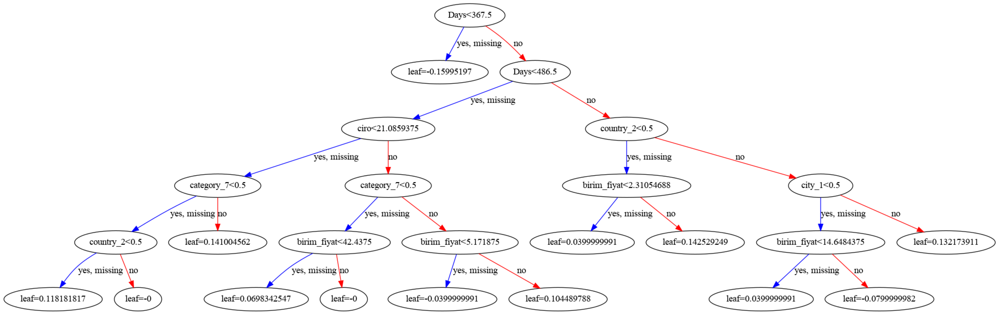

In [489]:
##set up the parameters
fig, ax = plt.subplots(figsize=(100,100))
plot_tree(xgb_model, ax=ax)


In [490]:
1/(1+np.exp(-0.032))

0.5079993174032311

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

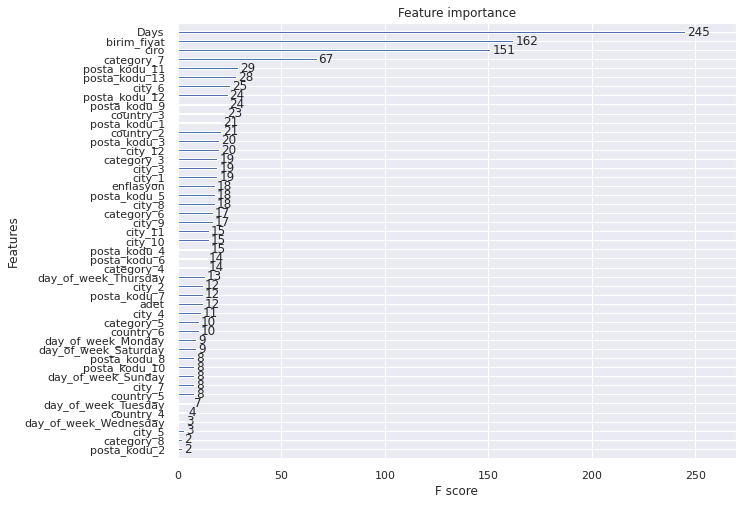

In [491]:
fig, ax = plt.subplots(figsize=(10,8))
plot_importance(xgb_model, ax=ax)